# Entrega 1 Grupo 4 Preparación de datos y limpieza

Proyecto: **Percepción de Seguridad en Colombia: Un Análisis Exploratorio con Técnicas de Aprendizaje No Supervisado enfocado en Bogotá, Medellín y Cali**

**Análisis exploratorio de datos**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pickle
import statsmodels.api as sm
from IPython.display import display, HTML


Cargue de funciones para realizar el exploratorio de datos

In [2]:
#cargue de parámetros de variables a utilizar
diccionario_variables = pd.read_excel("diccionario_filtrado.xlsx", sheet_name="variables")
diccionario_valores = pd.read_excel("diccionario_filtrado.xlsx", sheet_name="valores")
#diccionario con descripción de variables
dict_desc = dict(zip(diccionario_variables['id_variable'],diccionario_variables['descripcion']))

In [3]:
#diccionario con significado de los valores de las variables con naturaleza discreta
dict_types = dict(zip(diccionario_variables['id_variable'],diccionario_variables['tipo']))
dict_values = {}
for var in set(diccionario_valores['id_variable']):
    dict_var = diccionario_valores[diccionario_valores['id_variable'] == var].copy()
    dict_var['valor'] = dict_var['valor'].astype(float).astype(str)
    dict_values[var] = dict(zip(dict_var['valor'],dict_var['descripcion_valor']))

In [4]:
#funciones analisis exploratorio
def vis_categorica(datos, var, hue=None):
    # Visualización de variable categórica
    values = datos[var].fillna("MISSING")
    counts = values.value_counts()

    fig, ax = plt.subplots(figsize=(5, 0.5*len(counts)))
    sns.countplot(data=datos.fillna("MISSING"), y = var, hue=hue, order = counts.index, ax=ax)

    label_len = max([len(str(c)) for c in counts.index])

    if(label_len < 5):
        plt.xticks(rotation=0)
    elif(label_len>=5 and label_len<12):
        plt.xticks(rotation=45)
    else:
        plt.xticks(rotation=90)

    if(hue is None):
        ax.bar_label(ax.containers[0], labels=[f"{round(v,3)}%" for v in counts/len(values)*100])

    ax.set_xlabel('Conteo')
    ax.set_ylabel(var)
    ax.set_title(f'Conteo por {var}')

    plt.show()

def vis_numerica(datos, var, hue=None):
    # Visualización de variable numérica
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(9, 4))
    sns.kdeplot(data=datos, x=var, hue=hue, ax=ax1)
    sns.boxplot(data=datos, y=var, x=hue, ax=ax2, showfliers=True)

    ax1.set_title(f'Histograma {var}')
    ax1.set_xlabel(var)

    ax2.set_title(f'Boxplot {var}')

    plt.show()

def descriptivo_grupo(df_base, grupo):
    for var in grupo:
        var_desc = dict_desc.get(var,"")
        display(HTML(f"<h3>Análisis variable: {var}</h3>"))
        display(HTML(f"<b>Descripción:</b> {var_desc}"))
        display(HTML("<h4>Estadísticas descriptivas:</h4>"))
        print(df_base[var].describe())
        display(HTML("<h4>Gráficos de distribución:</h4>"))
        if df_base[var].dtype == 'string' or df_base[var].dtype == 'O':
            if dict_values.get(var,None) is not None:
                var_data = pd.DataFrame(df_base[var].map(dict_values.get(var)))
                vis_categorica(var_data, var)
            else:
                vis_categorica(df_base, var)
        else:
            vis_numerica(df_base, var)

In [5]:
#funciones analisis exploratorio
def vis_categorica(datos, var, hue=None):
    # Visualización de variable categórica
    values = datos[var].fillna("MISSING")
    counts = values.value_counts()

    fig, ax = plt.subplots(figsize=(9, 4))
    sns.countplot(data=datos.fillna("MISSING"), x = var, hue=hue, order = counts.index, ax=ax)

    label_len = max([len(str(c)) for c in counts.index])

    if(label_len < 5):
        plt.xticks(rotation=0)
    elif(label_len>=5 and label_len<12):
        plt.xticks(rotation=45)
    else:
        plt.xticks(rotation=90)

    if(hue is None):
        ax.bar_label(ax.containers[0], labels=[f"{round(v,3)}%" for v in counts/len(values)*100])

    ax.set_ylabel('Conteo')
    ax.set_xlabel(var)
    ax.set_title(f'Conteo por {var}')

    plt.show()

def vis_numerica(datos, var, hue=None):
    # Visualización de variable numérica
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(9, 4))
    sns.kdeplot(data=datos, x=var, hue=hue, ax=ax1)
    sns.boxplot(data=datos, y=var, x=hue, ax=ax2, showfliers=True)

    ax1.set_title(f'Histograma {var}')
    ax1.set_xlabel(var)

    ax2.set_title(f'Boxplot {var}')

    plt.show()


def reporte_univariado(datos, variables):
    # de acuerdo al tipo de dato generar la vista univaridada que le corresponde para cada una de las variables indicadas

    display(HTML("<h2>Análisis Univariado</h2>"))
    for var in variables:
        display(HTML(f"<h3>Análisis variable: {var}</h3>"))
        display(HTML("<h4>Estadísticas descriptivas:</h4>"))
        print(datos[var].describe())

        display(HTML("<h4>Gráficos de distribución:</h4>"))
        if datos[var].dtype == 'O':
            vis_categorica(datos, var)
        else:
            vis_numerica(datos, var)


def vis_bivar_boxplot(datos, var_cat, var_num):
    # generar boxplot bivariado
    median = datos.fillna("MISSING").groupby(var_cat)[var_num].median()
    index_sort = median.index
    min_median = min(median)

    ax = sns.boxplot(data=datos.fillna("MISSING"), x=var_cat, y=var_num, order=index_sort, showfliers=True)
    sns.lineplot(x=index_sort, y=[min_median]*len(index_sort), linestyle='--', color="red")

    label_len = max([len(c) for c in index_sort])

    if(label_len < 5):
        plt.xticks(rotation=0)
    elif(label_len>=5 and label_len<12):
        plt.xticks(rotation=45)
    else:
        plt.xticks(rotation=90)

    ax.set_ylabel('Conteo')
    ax.set_xlabel(var_cat)
    ax.set_title(f'Distribución {var_cat} por {var_num}')

    plt.show()

def vis_bivar_scatter(datos, var_x, var_y):
    # generar scatter plot bivariado

    fig, ax = plt.subplots(figsize =(10, 5))

    sns.scatterplot(data=datos, x=var_x, y=var_y, alpha=0.5)

    ax.set_xlabel(var_x)
    ax.set_ylabel(var_y)
    ax.set_title(f'Scatter {var_x} vs {var_y}')
    plt.show()

def reporte_univariado(datos, variables):
    # de acuerdo al tipo de dato generar la vista univaridada que le corresponde para cada una de las variables indicadas

    display(HTML("<h2>Análisis Univariado</h2>"))
    for var in variables:
        display(HTML(f"<h3>Análisis variable: {var}</h3>"))
        display(HTML("<h4>Estadísticas descriptivas:</h4>"))
        print(datos[var].describe())

        display(HTML("<h4>Gráficos de distribución:</h4>"))
        if datos[var].dtype == 'O':
            vis_categorica(datos, var)
        else:
            vis_numerica(datos, var)


def vis_bivar_boxplot(datos, var_cat, var_num):
    # generar boxplot bivariado
    median = datos.fillna("MISSING").groupby(var_cat)[var_num].median()
    index_sort = median.index
    min_median = min(median)

    ax = sns.boxplot(data=datos.fillna("MISSING"), x=var_cat, y=var_num, order=index_sort, showfliers=True)
    sns.lineplot(x=index_sort, y=[min_median]*len(index_sort), linestyle='--', color="red")

    label_len = max([len(c) for c in index_sort])

    if(label_len < 5):
        plt.xticks(rotation=0)
    elif(label_len>=5 and label_len<12):
        plt.xticks(rotation=45)
    else:
        plt.xticks(rotation=90)

    ax.set_ylabel('Conteo')
    ax.set_xlabel(var_cat)
    ax.set_title(f'Distribución {var_cat} por {var_num}')

    plt.show()

def vis_bivar_propor(data, var_cat, var_ojb):
    df_agg = pd.crosstab(data[var_cat],data[var_ojb], margins=True, margins_name='Total')
    df_agg.div(df_agg['Total'], axis=0).iloc[:,:-1].plot(kind='bar', stacked=True)
    plt.setp(plt.gca().get_xticklabels(), rotation=45, horizontalalignment='right')

    plt.title(f'Proporciones {var_ojb} por {var_cat}')

    plt.show()

def vis_bivar_scatter(datos, var_x, var_y):
    # generar scatter plot bivariado

    fig, ax = plt.subplots(figsize =(10, 5))

    sns.scatterplot(data=datos, x=var_x, y=var_y, alpha=0.5)

    ax.set_xlabel(var_x)
    ax.set_ylabel(var_y)
    ax.set_title(f'Scatter {var_x} vs {var_y}')
    plt.show()



def reporte_bivariado(datos, variables, variable_objetivo):
    # de acuerdo al tipo de dato generar la vista univaridada que le corresponde para cada una de las variables indicadas

    display(HTML("<h2>Análisis Bivariado</h2>"))
    for var in variables:
        if(var != variable_objetivo):
            display(HTML(f"<h3>Análisis variable: {var} vs {variable_objetivo}</h3>"))

            if datos[var].dtype == 'O' and datos[variable_objetivo].dtype == 'O':
                vis_bivar_propor(datos, var, variable_objetivo)
            elif datos[variable_objetivo].dtype == 'O':
                vis_bivar_boxplot(datos, variable_objetivo, var)
            else:
                vis_bivar_scatter(datos, variable_objetivo, var)

def corr_heatmap(df):
    _ , ax = plt.subplots(figsize =(40, 10))
    colormap = sns.diverging_palette(220, 10, as_cmap = True,)
    corr = df.corr()

    _ = sns.heatmap(
        corr,
        cmap = "RdBu",
        square=True,
        cbar_kws={'shrink':.9 },
        ax=ax,
        linewidths=0.1,vmax=1.0, linecolor='white',
        vmin=-1,
        annot=True,
        fmt=".2f"

    )

    plt.title('Correlaciones', y=1.05, size=15)
    plt.show()
    return corr

Cargue de bases de datos transformada, después de la preparación de datos

In [6]:
df_base = pickle.load(open("df_base.pkl","rb"))
vars_naturaleza = pickle.load(open("vars_naturaleza.pkl","rb"))

### 1.2. Análisis de calidad de datos:

In [39]:
# Descripción de la base de datos completa
print("Descripción de la base de datos:")
print("total registros:",  df_base.shape[0])
print("Número columnas:", df_base.shape[1])

Descripción de la base de datos:
total registros: 14562
Número columnas: 222


la base de datos, no cuenta con datos faltantes

In [8]:
#validación de datos faltantes
(df_base.isna().sum()/len(df_base)).sort_values(ascending=False)

P220         0.0
P3316S4      0.0
P3113S7      0.0
P3113S8      0.0
P3113S9      0.0
            ... 
P1358S9      0.0
P1358S11     0.0
P1358S10     0.0
P3108        0.0
mejoraria    0.0
Length: 222, dtype: float64

Clasificación de variables: por tipo de dato

In [9]:
vars_naturaleza.keys()

dict_keys(['vars_discretas', 'vars_binarias', 'vars_numericas', 'vars_ordinales', 'vars_agrupadas'])

Naturaleza de las variables, estas se encuentran clasificadas por tipo de dato, Numericas, binarias, ordinales y discretas

De acuerdo al planteamiento del proyecto Percepción de Seguridad en Colombia: Un Análisis Exploratorio con Técnicas de Aprendizaje No Supervisado enfocado en **Bogotá, Medellín y Cali**. La exploración de los datos se realizara para las ciudades de estudio.

In [10]:
df_base['DEPMUNI'].value_counts()

DESCONOCIDO       13027
CENTRO POBLADO    11880
BARRANQUILLA       6134
MONTERIA           5794
CARTAGENA          5753
CUCUTA             5160
BOGOTA             5114
BUCARAMANGA        4989
IBAGUE             4984
MEDELLIN           4877
VILLAVICENCIO      4855
PEREIRA            4780
MANIZALES          4771
CALI               4571
PASTO              4533
Name: DEPMUNI, dtype: int64

La base de datos Filtrada por las ciudades de estudio, cuenta con 14562 registros y 222 columnas, los tipos de datos se encuentra 57 columnas datos numericos y 165 variables categoricas.

In [11]:
df_base = df_base[df_base['DEPMUNI'].isin(['BOGOTA','MEDELLIN','CALI'])]
df_base.shape

(14562, 222)

In [12]:
df_base.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14562 entries, 4272 to 122206
Columns: 222 entries, P220 to mejoraria
dtypes: float64(45), int64(12), object(9), string(156)
memory usage: 24.8+ MB


Según el tipo de dato de las variables, estas se clasifican según su naturaleza

In [13]:
vars_num = vars_naturaleza['vars_numericas']
vars_bin = [v for v in vars_naturaleza['vars_binarias'] if v not in vars_naturaleza['vars_agrupadas']]
vars_ord = vars_naturaleza['vars_ordinales']
vars_discre = vars_naturaleza['vars_discretas']
vars_agru = vars_naturaleza['vars_agrupadas']

In [14]:
# Descripción de la base de datos completa
print("Tipo de variables que componen la encuesta:")
print("total variables Numérica:",  len(vars_num))
print("total variables ordinales:",  len(vars_ord))
print("total variables Discretas:",  len(vars_discre))
print("total variables Binarias:",  len(vars_agru))
print("total variables Binarias_generales:",  len(vars_bin))

Tipo de variables que componen la encuesta:
total variables Numérica: 16
total variables ordinales: 47
total variables Discretas: 6
total variables Binarias: 149
total variables Binarias_generales: 2


In [15]:
vars_naturaleza.keys()


dict_keys(['vars_discretas', 'vars_binarias', 'vars_numericas', 'vars_ordinales', 'vars_agrupadas'])

**Análisis variables por ciudad**

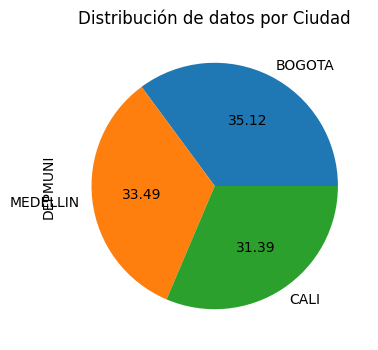

In [16]:
plot = df_base['DEPMUNI'].value_counts().plot(kind='pie', autopct='%.2f',
                                            figsize=(4, 4),
                                            title='Distribución de datos por Ciudad')

In [17]:
df_base['DEPMUNI'].unique()

array(['BOGOTA', 'CALI', 'MEDELLIN'], dtype=object)

De acuerdo a la seleccion de variables que pueden llegar a responder la pregunta **Percepción de Seguridad en Colombia: Un Análisis Exploratorio con Técnicas de Aprendizaje No Supervisado enfocado en Bogotá, Medellín y Cali**, se explora el comportamiento de las variables según la percepción en hombres o mujeres.

Se puede identificar que las variables trasnformadas Inseguro_ciudad y si sera victima, tanto hombres y mujeres indican mayor vulnerabilidad de ser victimas de delincuencia de hurto a residencia y a personas.

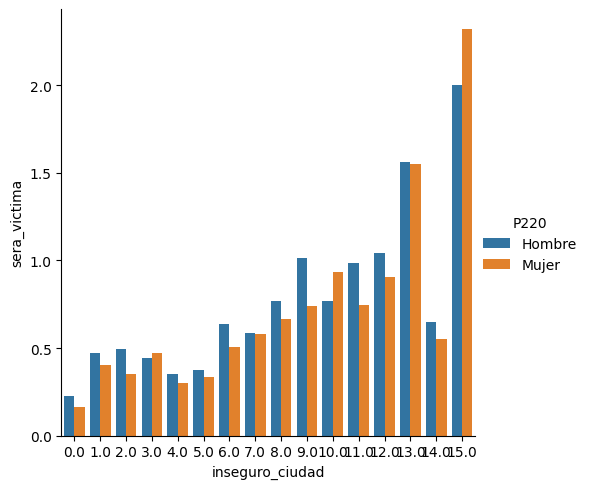

In [18]:
#grafica de  stripplot
sns.catplot(x='inseguro_ciudad',y='sera_victima',data=df_base,kind='bar',hue='P220',errorbar = None)
plt.show()

Se puede identificar que las variables trasnformadas Mejoraria con respecto a la inseguridad del barrio, tanto hombres como mujeres consideran Promover las Instalar alarmas comunitarias y aumentar la vigilancia policial, ya que la percepción de inseguridad familiaries o amigos han sido victimas de algun tipo de agresión o delincuencia de hurto.

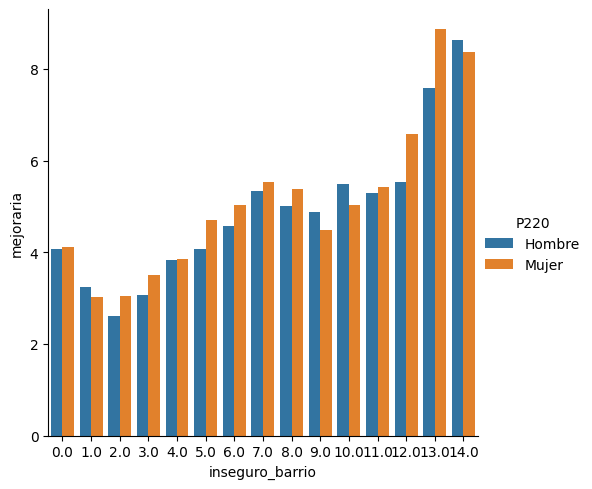

In [19]:
#grafica de  stripplot
sns.catplot(x='inseguro_barrio',y='mejoraria',data=df_base,kind='bar',hue='P220',errorbar = None)
plt.show()

Se puede identificar que las variables trasnformadas tomo_medidas con respecto a si justificaria la violencia, se logra identificar que los hombres presentan cambian de rutina o de actividades y mayor reacción justificando que lo harian por ayuda a un familiar, castigar un delincuente o por defensa propia.

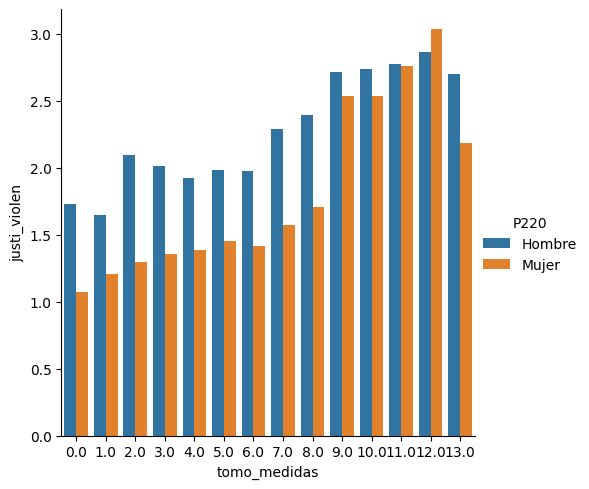

In [20]:
#grafica de  stripplot
sns.catplot(x='tomo_medidas',y='justi_violen',data=df_base,kind='bar',hue='P220',errorbar = None)
plt.show()

Se puede identificar que las variables trasnformadas P3113S3 (Con respecto a la seguridad, ¿cómo se siente ... )  con respecto a la inseguridad de la ciudad, se percibe que tanto hombres como mujeres califican de inseguro a considerar es porque existe Venta de celulares o equipos robados o extraviados y Porque hay delincuencia común, robos, agresiones.

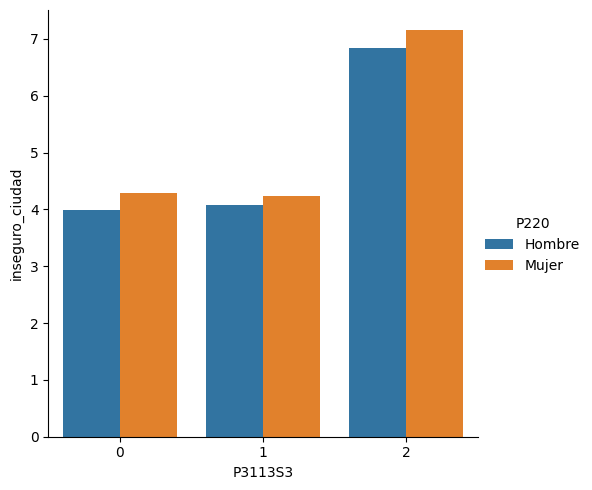

In [21]:
#grafica de  stripplot
sns.catplot(x='P3113S3',y='inseguro_ciudad',data=df_base,kind='bar',hue='P220',errorbar = None)
plt.show()

Se puede identificar que las variables P1906S77 Y P1906S5 (Dada su condición física y mental, y sin ningún tipo de ayuda ) tanto hombres como mujeres califican que no cuentan con dificultad para el desarrollo de agarras o mover objetos con las manos, o actividades como comer, vestirse o bañarse.

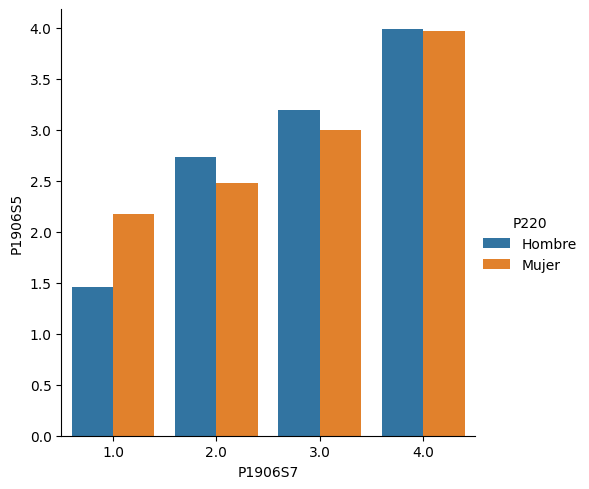

In [22]:
#grafica de  stripplot
sns.catplot(x='P1906S7',y='P1906S5',data=df_base,kind='bar',hue='P220',errorbar = None)
plt.show()

Se puede identificar que las variables P3317S3 (¿Cuánto cree ... que contribuyen las siguientes instituciones a la convivencia de la ciudad o municipio de ...:) con respecto  P1181S1(Con relación al desempeño en la administración de justicia, ¿cuánto considera que contribuyen a la seguridad ciudadana las siguientes instituciones de la rama judicial, FISCALIA) tanto hombres como mujeres consideran la fiscalia no contriubye en la justicia, sin emabargo para los centros de conciliación califican con poca participación

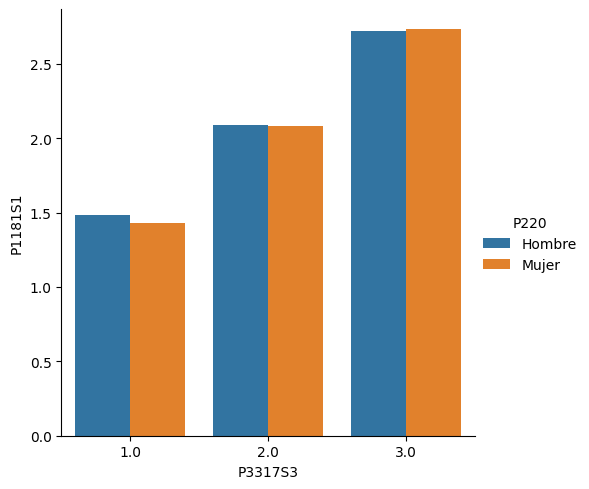

In [23]:
#grafica de  stripplot
sns.catplot(x='P3317S3',y='P1181S1',data=df_base,kind='bar',hue='P220',errorbar = None)
plt.show()

Se puede identificar que las variables P3113S6 (Mineria ilegal) con respecto  P3111S6(seguridad en vía publica) los hombres indican que se encuentran mas expuestos en via publica, por lo que califican como muy inseguro con respecto a la mineria ilegal, este cuenta con una puntuación de disminución.

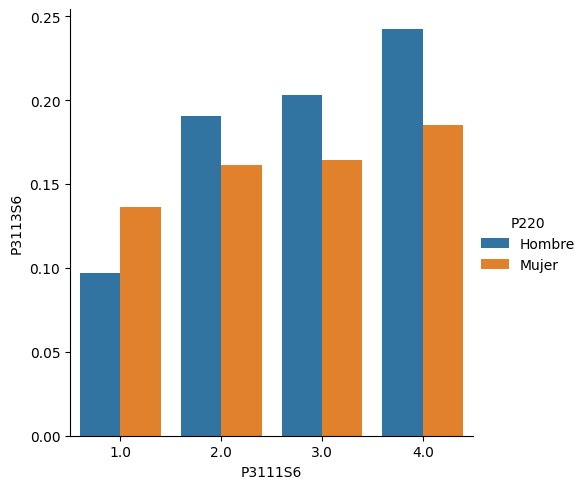

In [24]:
#grafica de  stripplot
sns.catplot(x='P3111S6',y='P3113S6',data=df_base,kind='bar',hue='P220',errorbar = None)
plt.show()

Se puede identificar que las variables P3111S8 (Puentes peatonales) con respecto  P3111S4(transporte público) tanto hombres como mujeres califican que transitar en puentes peatonales y viajar en transporte público se sienten muy inseguros.

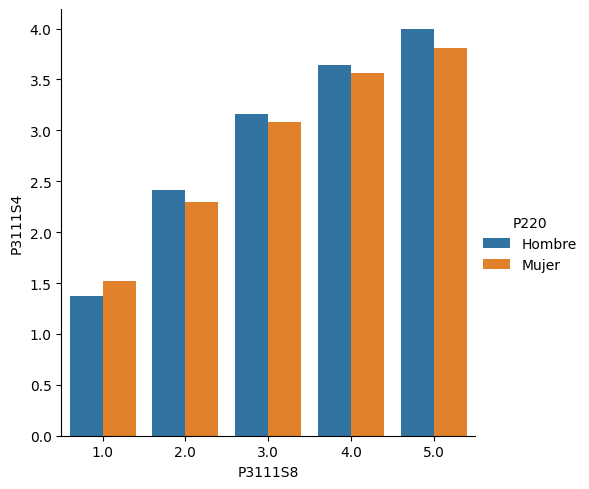

In [25]:
#grafica de  stripplot
sns.catplot(x='P3111S8',y='P3111S4',data=df_base,kind='bar',hue='P220',errorbar = None)
plt.show()

Se puede identificar que las variables P6210 1. ¿Cuál es el nivel educativo más alto alcanzado por ... y el último año o grado aprobado en este nivel?  con respecto   propietario_vehi los hombres y mujeres presentan un nivel educativo alcanzado superior o universitario, seguido secundaria media con respecto si son propietarios de un vehiculo propio,indican que si

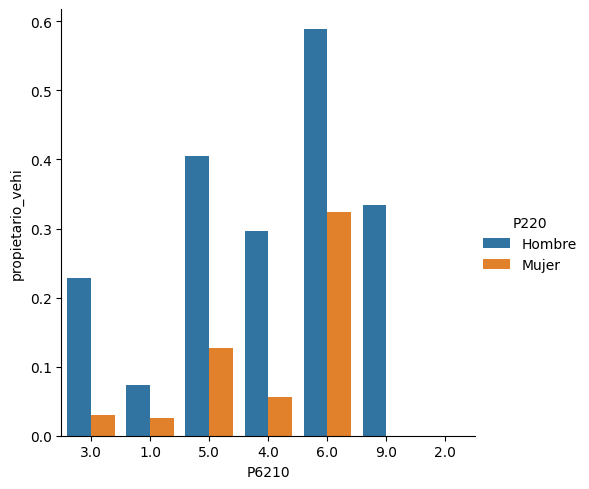

In [26]:
#grafica de  stripplot
sns.catplot(x='P6210',y='propietario_vehi',data=df_base,kind='bar',hue='P220',errorbar = None)
plt.show()

In [27]:
df_base = df_base[df_base['DEPMUNI'].isin(['BOGOTA','MEDELLIN','CALI'])]
df_base.shape

(14562, 222)

In [28]:
vars_num,vars_discre

(['P5785',
  'P1988S1',
  'propietario_vehi',
  'sufrio_agresion',
  'sufrio_delito',
  'sufrido_delito2',
  'problema_barrio',
  'presen_grupos',
  'inseguro_barrio',
  'inseguro_ciudad',
  'ha_expe_incomoda',
  'ha_expe_situa',
  'tomo_medidas',
  'sera_victima',
  'justi_violen',
  'mejoraria'],
 ['DEPMUNI', 'P1987', 'P1989', 'P1366', 'P1115', 'P3114'])

**Análisis bivariado detallado por ciudad**

In [29]:
df = df_base.loc[:,['P5785', 'P1988S1', 'propietario_vehi', 'sufrio_agresion', 'sufrio_delito', 'sufrido_delito2', 'problema_barrio', 'presen_grupos', 'inseguro_barrio', 'inseguro_ciudad', 'ha_expe_incomoda',
                    'ha_expe_situa', 'tomo_medidas', 'sera_victima', 'justi_violen', 'mejoraria','DEPMUNI','P1987', 'P1989', 'P1366', 'P1115', 'P3114']]

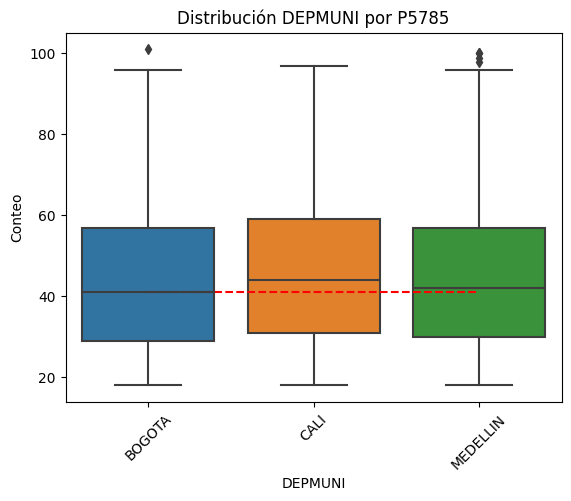

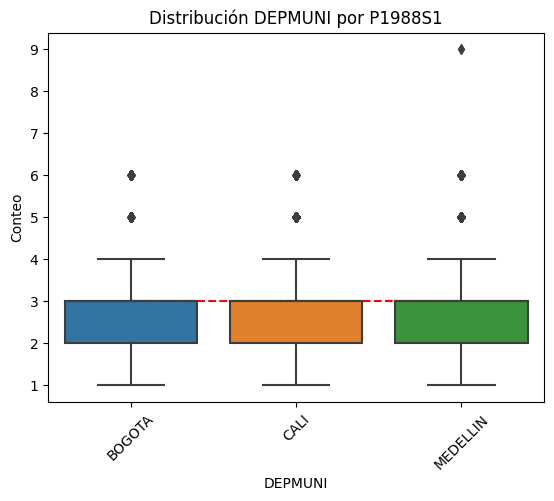

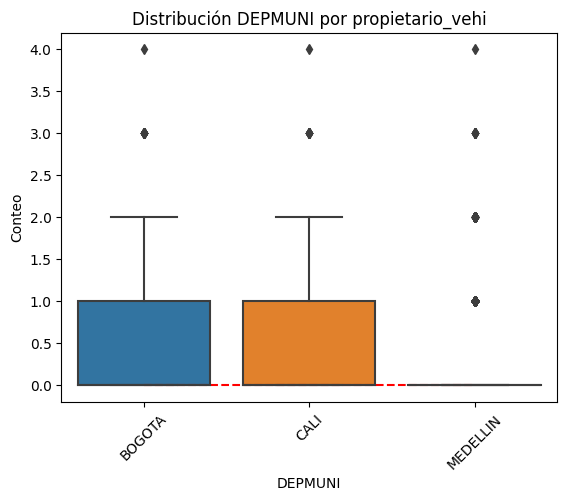

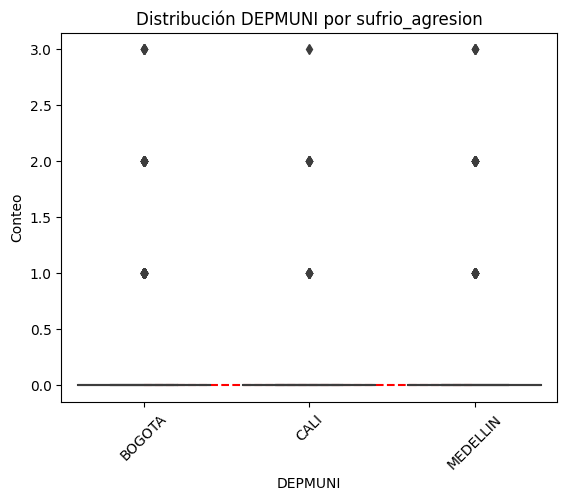

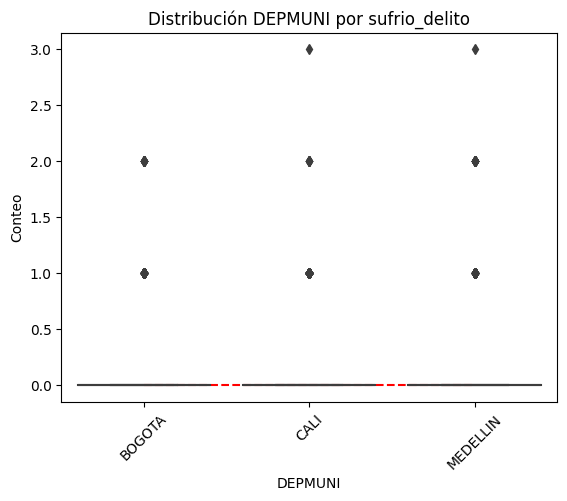

...

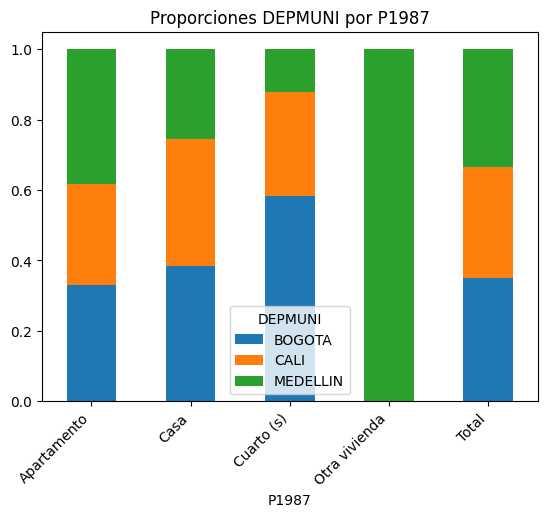

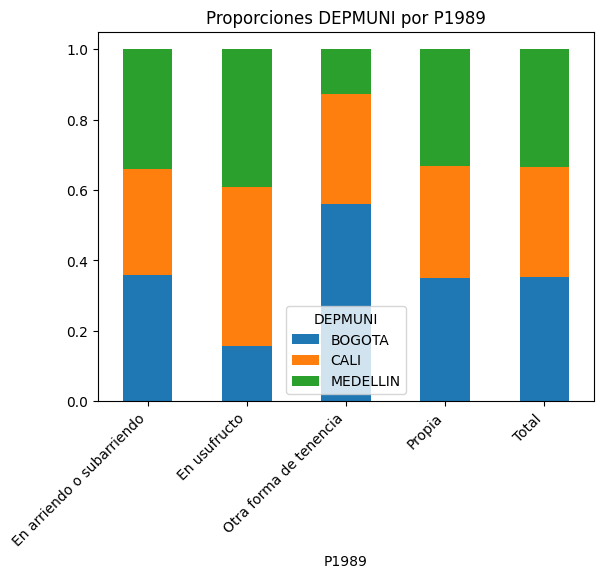

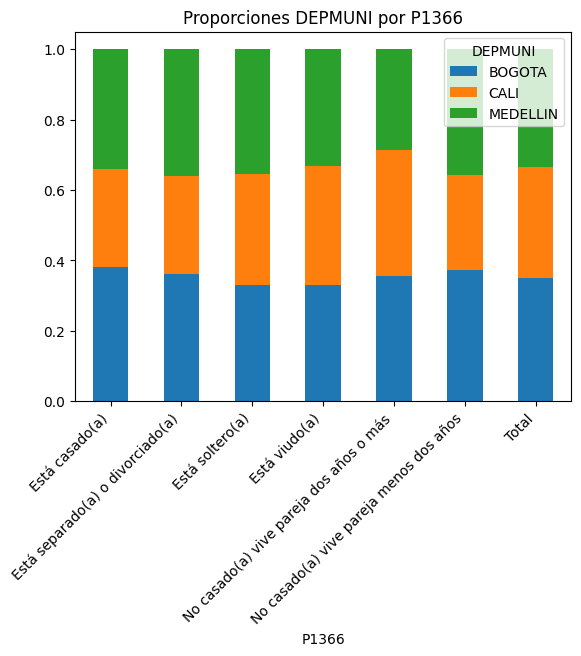

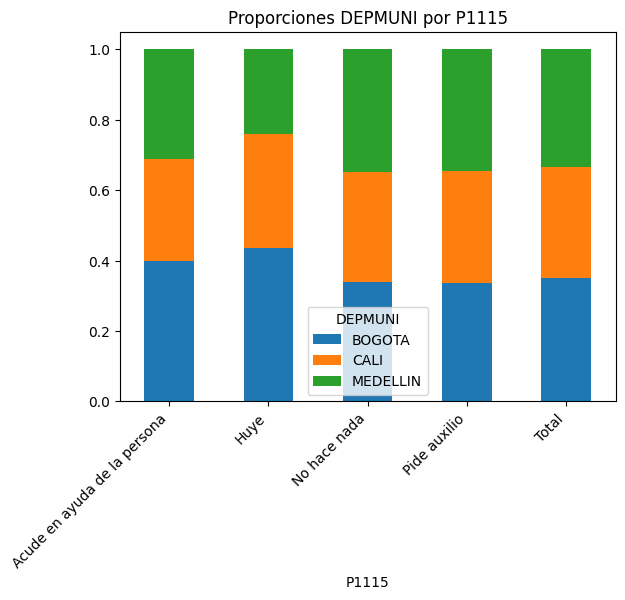

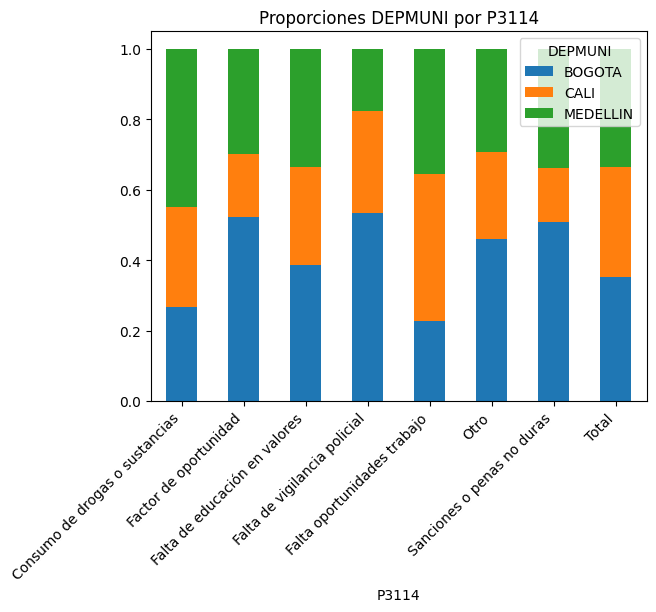

In [30]:
reporte_bivariado(df, df.columns.drop('DEPMUNI' ), 'DEPMUNI')

**Análisis univariado por tipo de variables**

count     14562
unique        2
top       Mujer
freq       7955
Name: P220, dtype: object


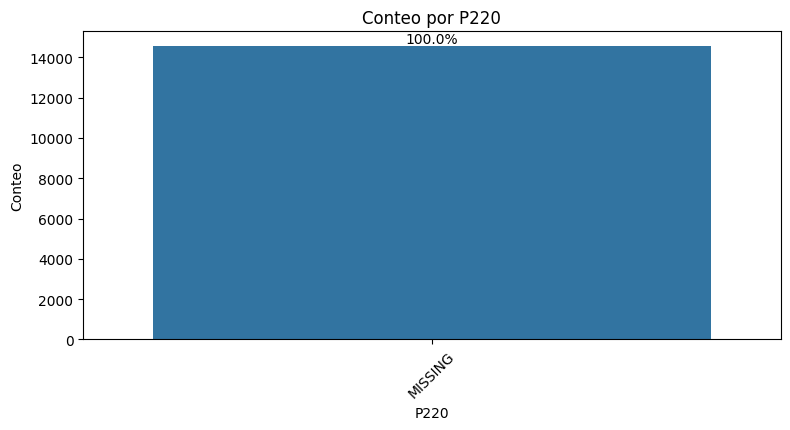

count     14562
unique        2
top          No
freq      12649
Name: P565S1, dtype: object


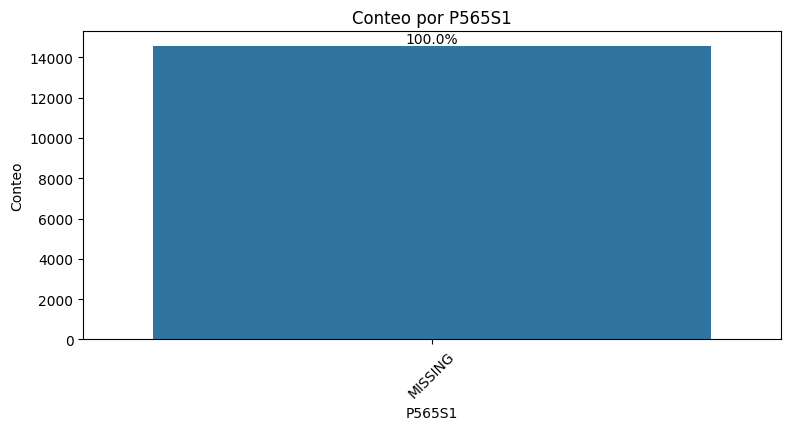

count     14562
unique        2
top          No
freq      13109
Name: P565S2, dtype: object


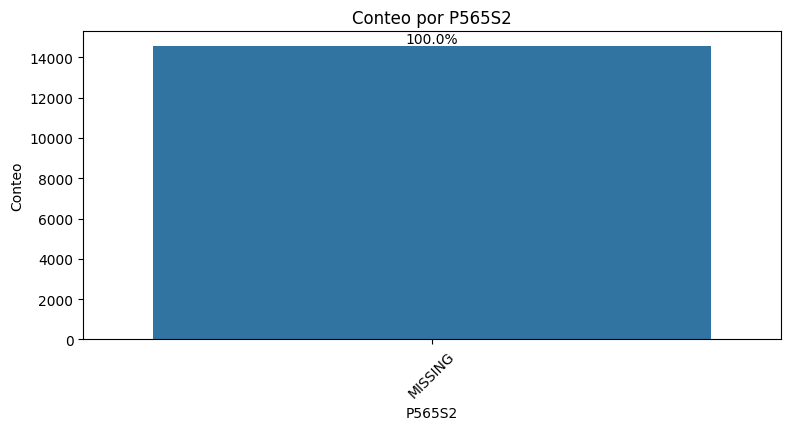

count     14562
unique        2
top          No
freq      13650
Name: P565S3, dtype: object


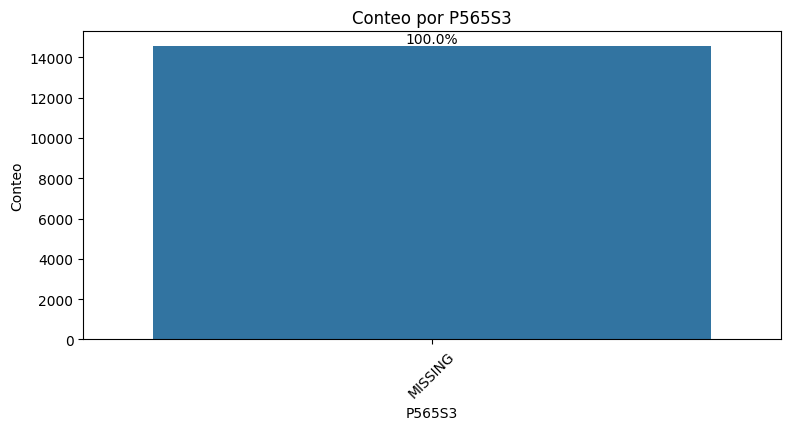

count     14562
unique        2
top          No
freq      14555
Name: P565S4, dtype: object


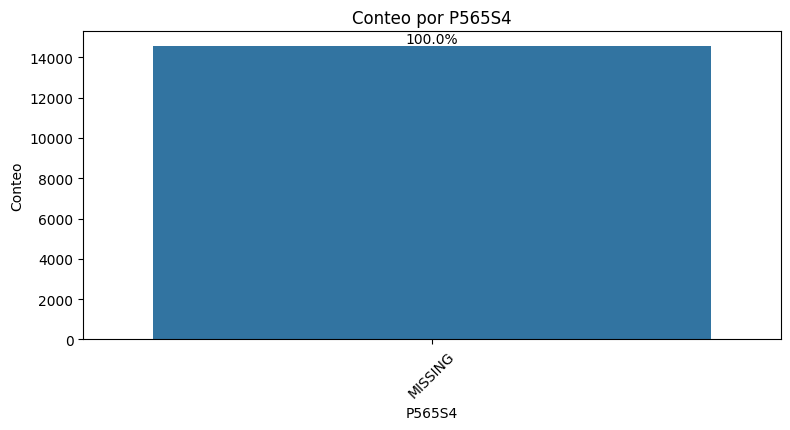

count     14562
unique        2
top          No
freq      14427
Name: P3115S1, dtype: object


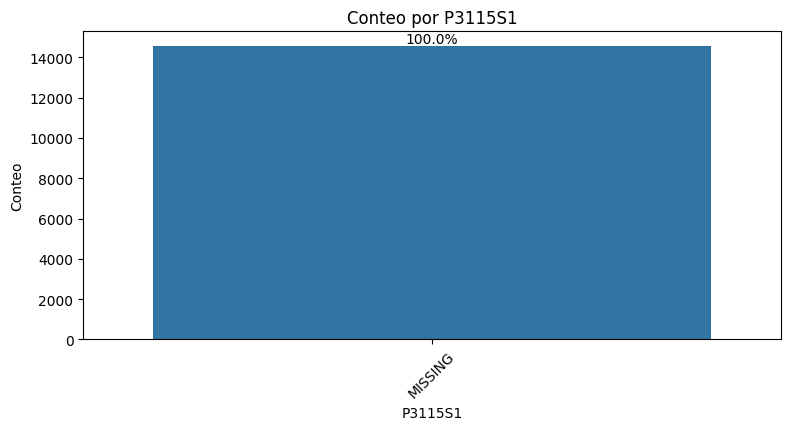

count     14562
unique        2
top          No
freq      14480
Name: P3115S2, dtype: object


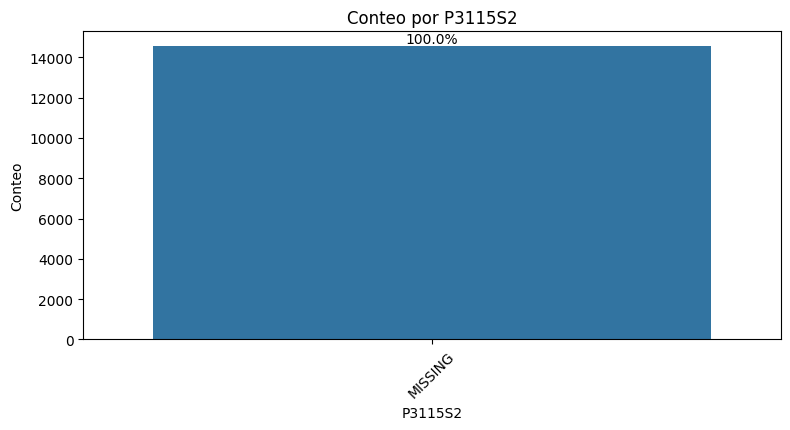

count     14562
unique        2
top          No
freq      14533
Name: P3115S3, dtype: object


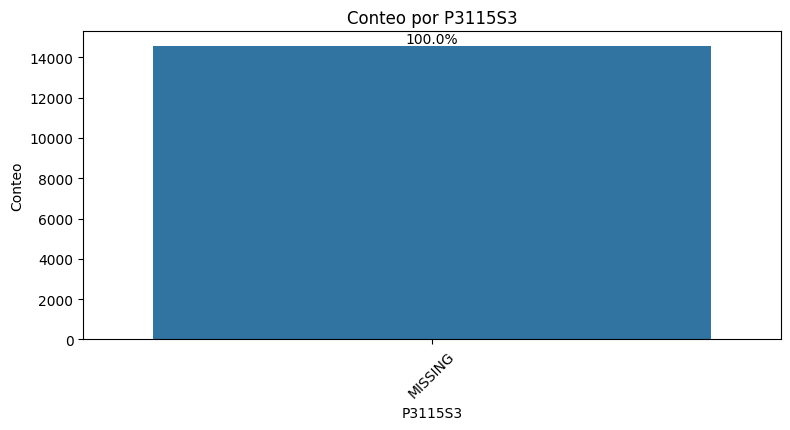

count     14562
unique        2
top          No
freq      14486
Name: P1976S1, dtype: object


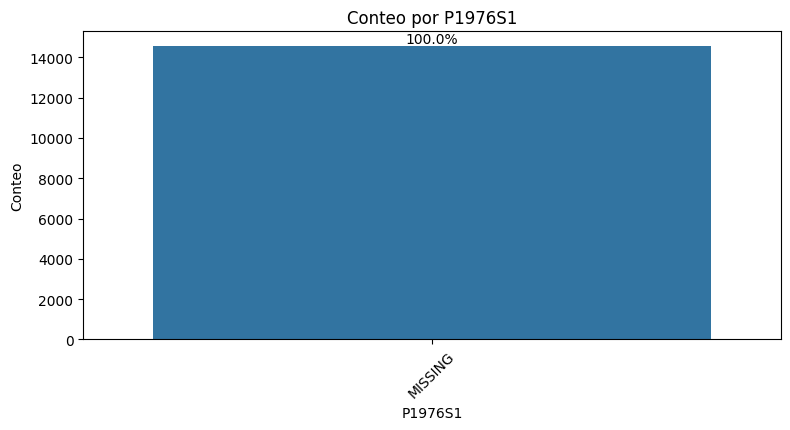

count     14562
unique        2
top          No
freq      14501
Name: P1976S2, dtype: object


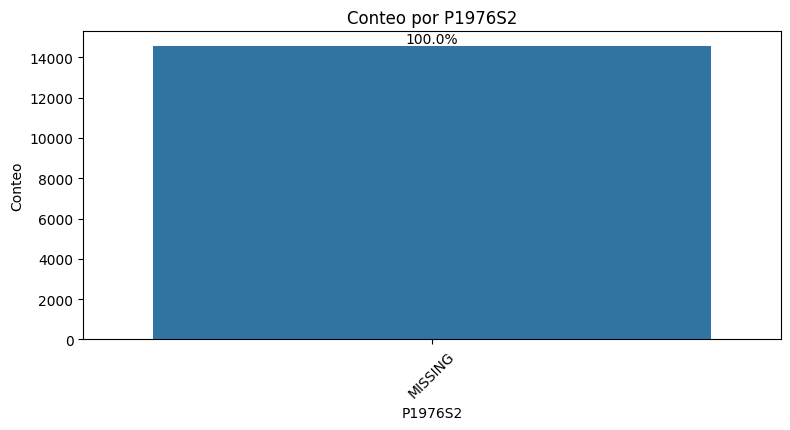

count     14562
unique        2
top          No
freq      14504
Name: P1976S9, dtype: object


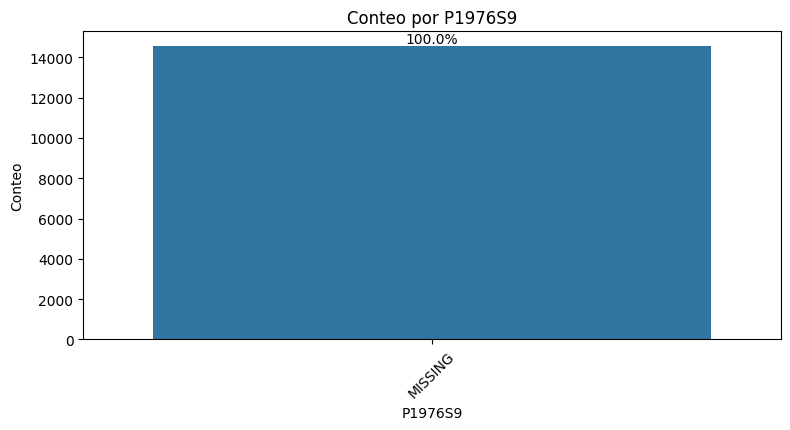

count     14562
unique        2
top          No
freq      14553
Name: P1976S4, dtype: object


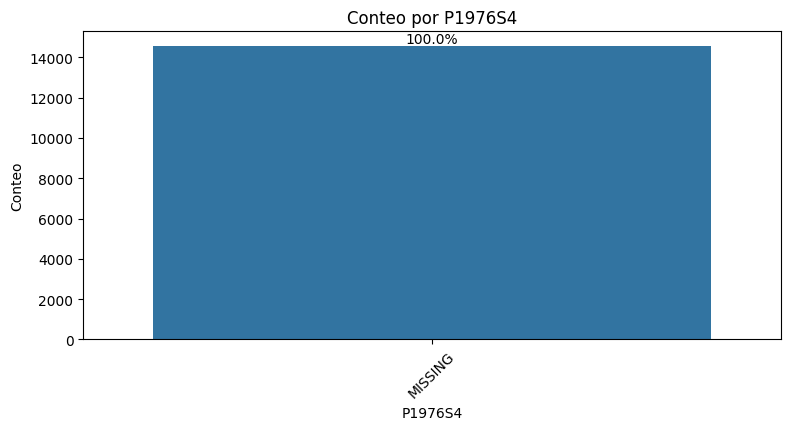

count     14562
unique        2
top          No
freq      14558
Name: P1976S5, dtype: object


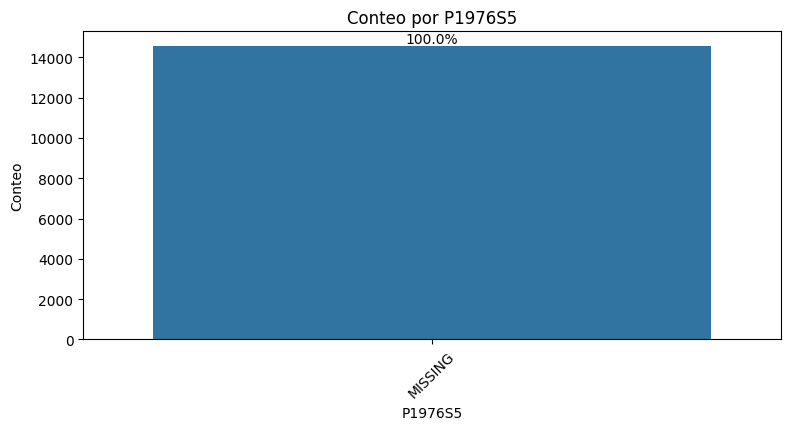

count     14562
unique        2
top          No
freq      14559
Name: P1976S6, dtype: object


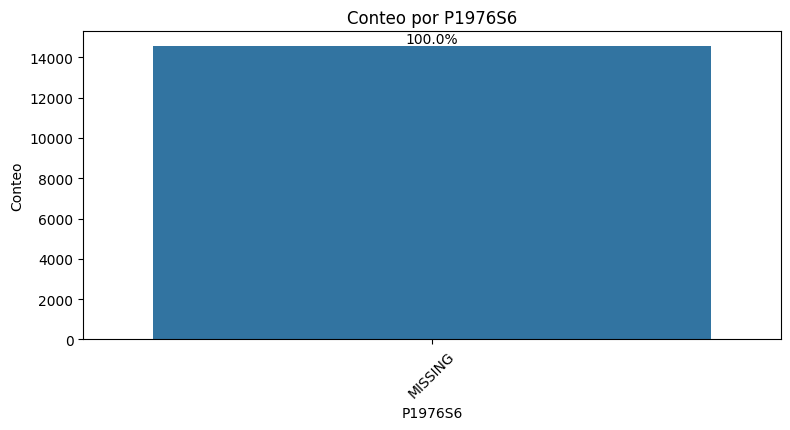

count     14562
unique        2
top          No
freq      14540
Name: P1976S7, dtype: object


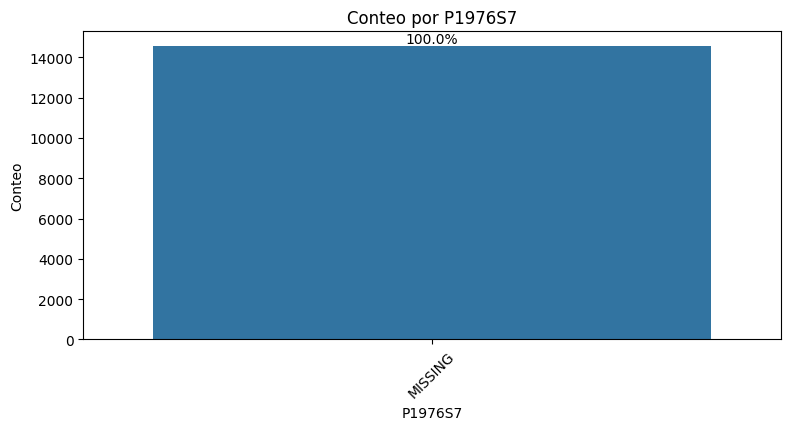

count     14562
unique        2
top          No
freq      14328
Name: P1976S13, dtype: object


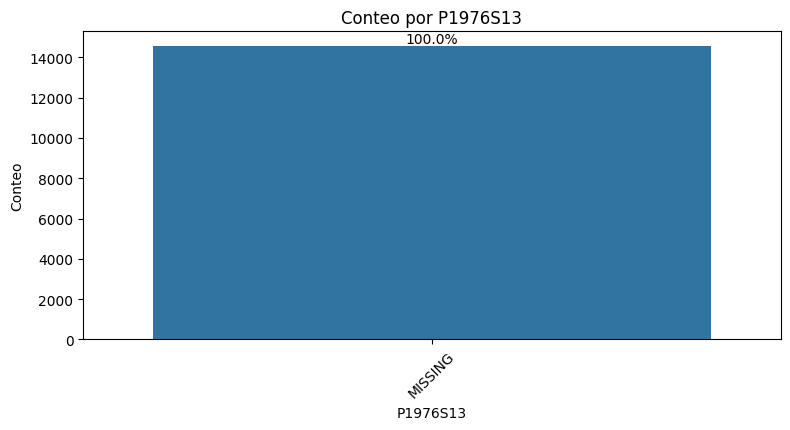

count     14562
unique        2
top          No
freq      14551
Name: P1976S14, dtype: object


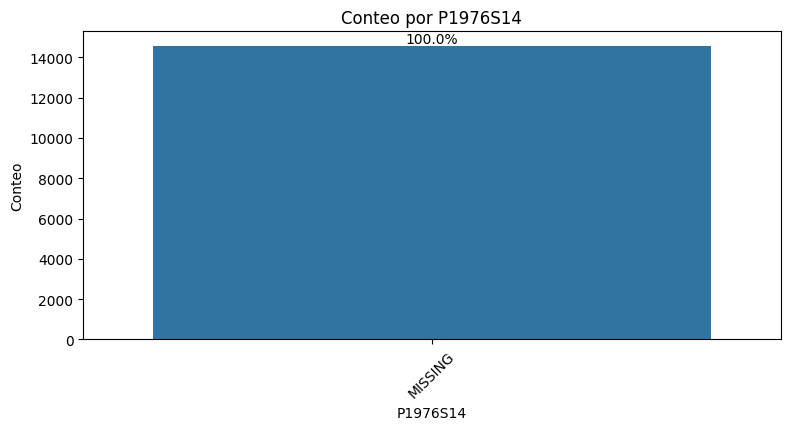

count     14562
unique        2
top          No
freq      14552
Name: P1976S8, dtype: object


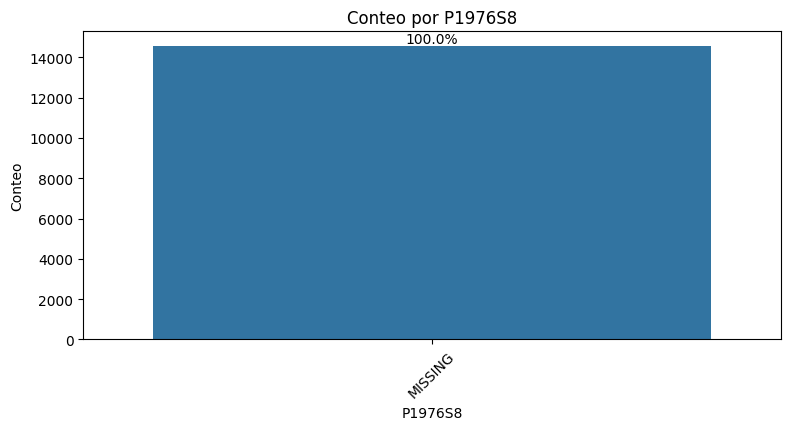

count     14562
unique        2
top          No
freq      14442
Name: P3315, dtype: object


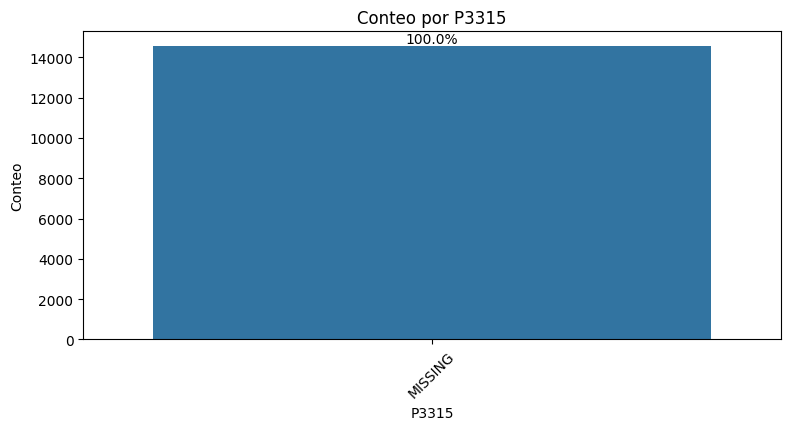

count     14562
unique        2
top          No
freq      14466
Name: P541, dtype: object


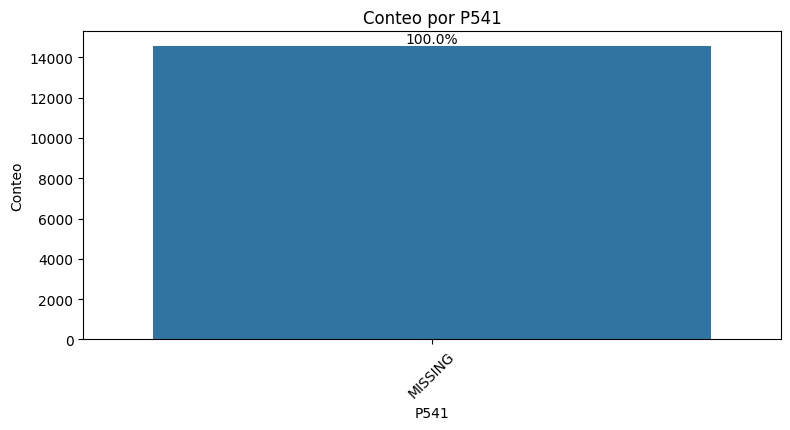

count     14562
unique        2
top          No
freq      14490
Name: P1392, dtype: object


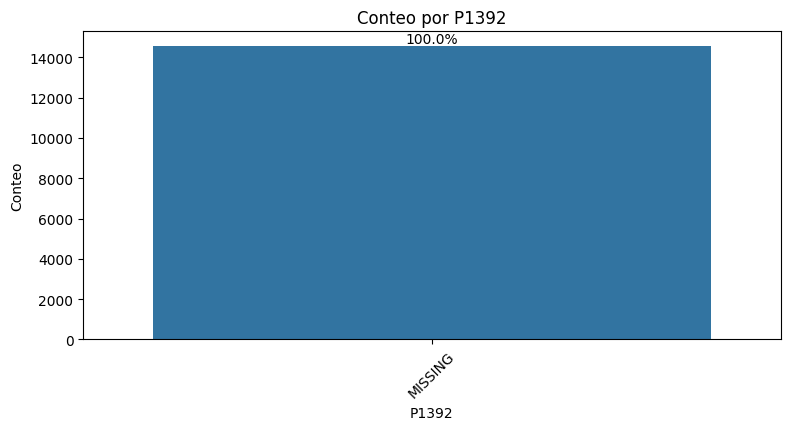

count     14562
unique        2
top          No
freq      14557
Name: P1959, dtype: object


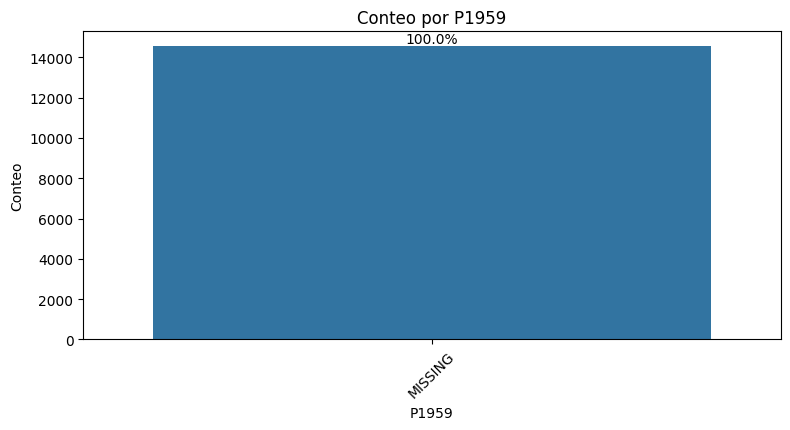

count     14562
unique        1
top          No
freq      14562
Name: P1960, dtype: object


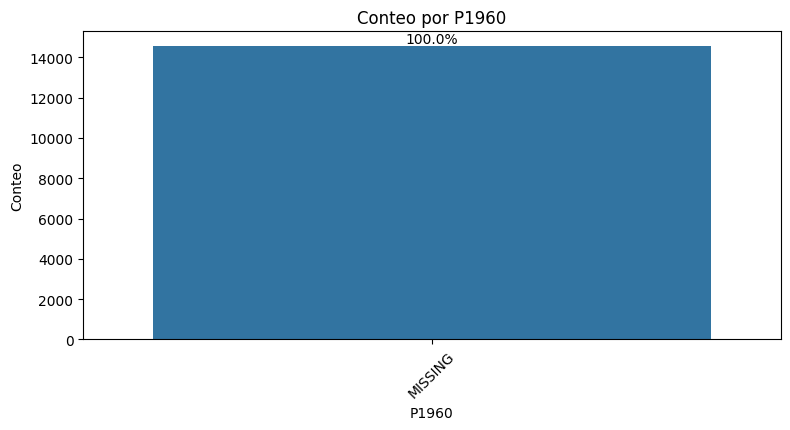

count     14562
unique        2
top          No
freq      13917
Name: P525, dtype: object


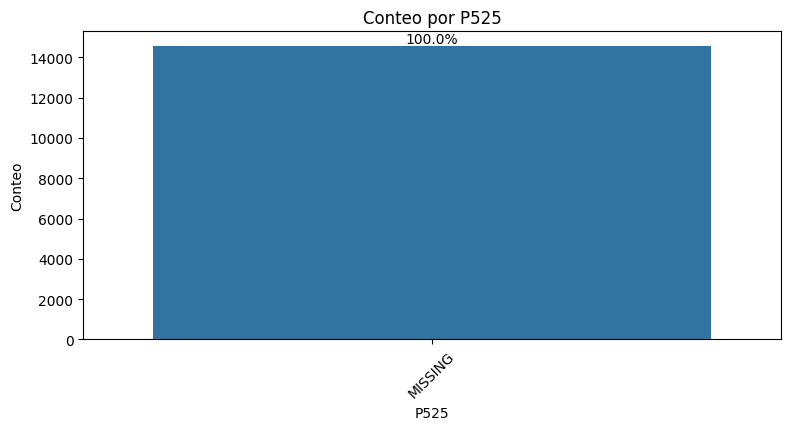

count     14562
unique        2
top          No
freq      13851
Name: P1343, dtype: object


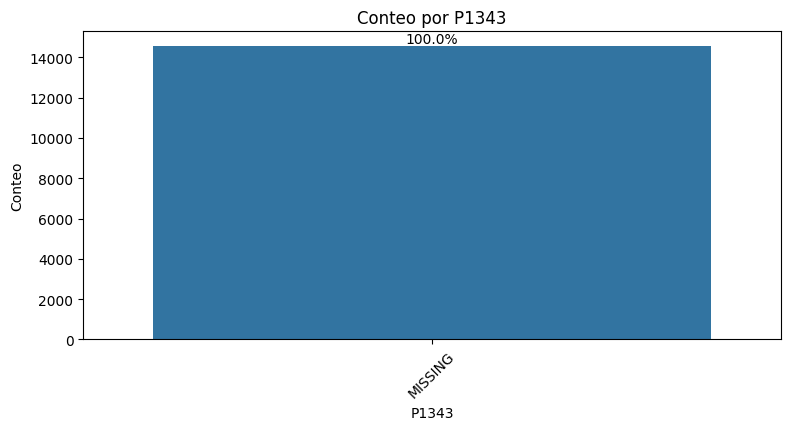

count     14562
unique        2
top          No
freq      14470
Name: P526, dtype: object


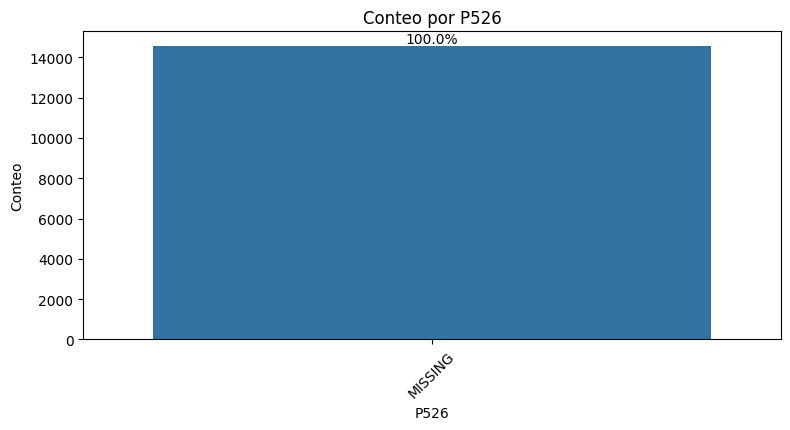

count     14562
unique        2
top          No
freq      14500
Name: P1315, dtype: object


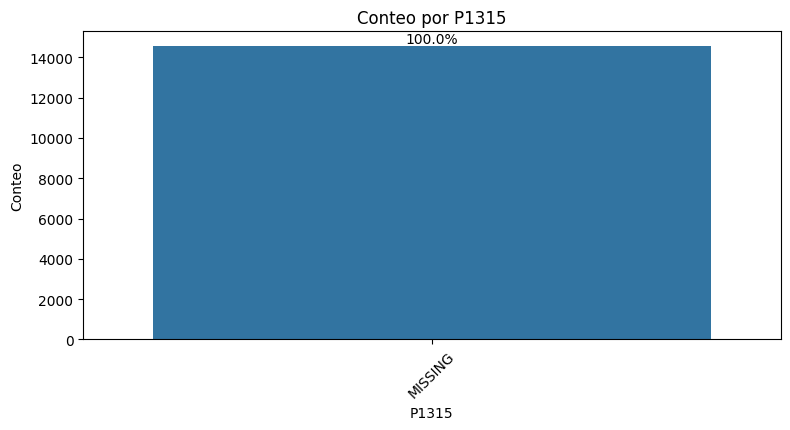

count     14562
unique        2
top          No
freq      14337
Name: P528, dtype: object


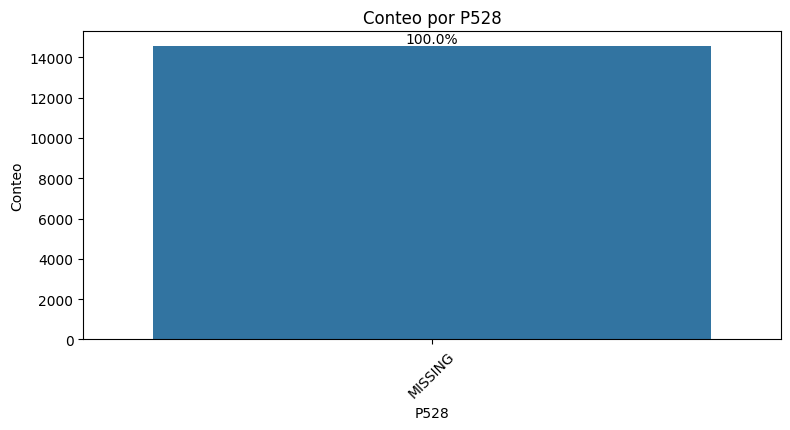

count     14562
unique        2
top          No
freq      14462
Name: P1286, dtype: object


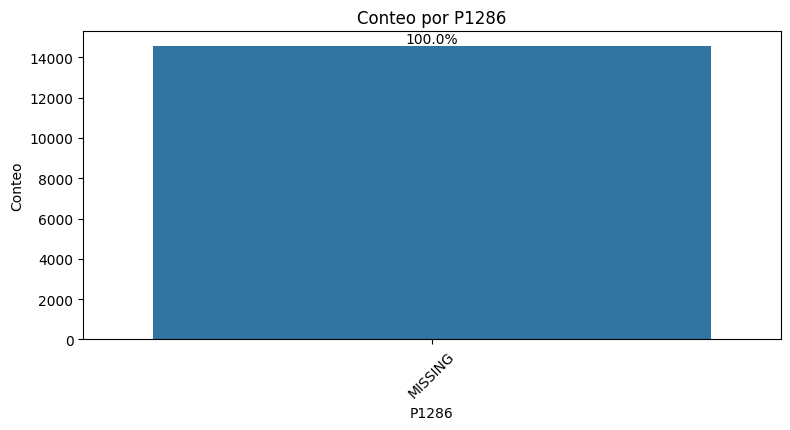

count     14562
unique        2
top          No
freq      14421
Name: P1956, dtype: object


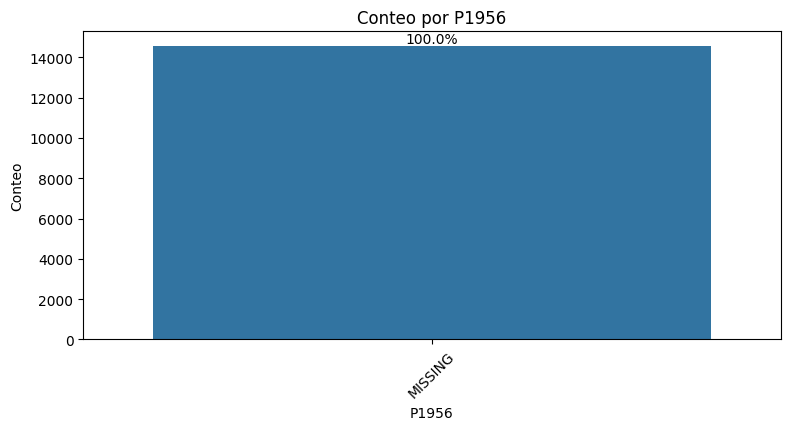

count     14562
unique        2
top          Si
freq       9256
Name: P1398S1, dtype: object


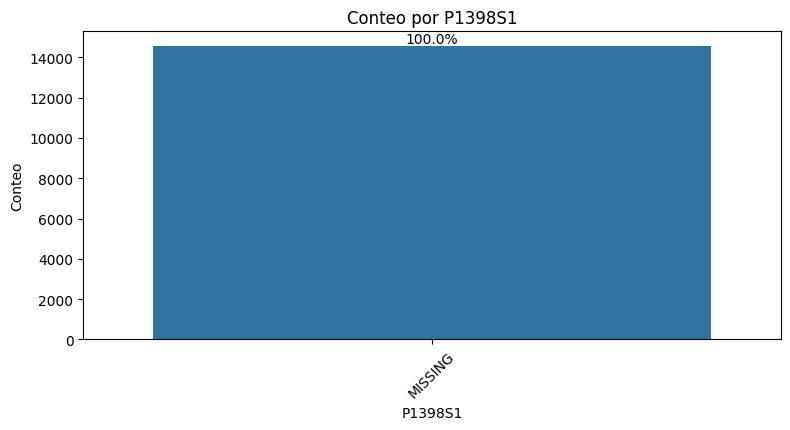

count     14562
unique        2
top          No
freq      10254
Name: P1398S2, dtype: object


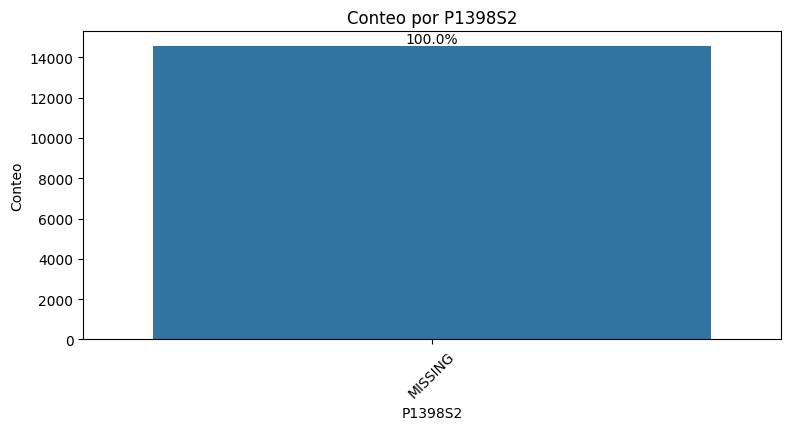

count     14562
unique        2
top          No
freq      10312
Name: P1398S3, dtype: object


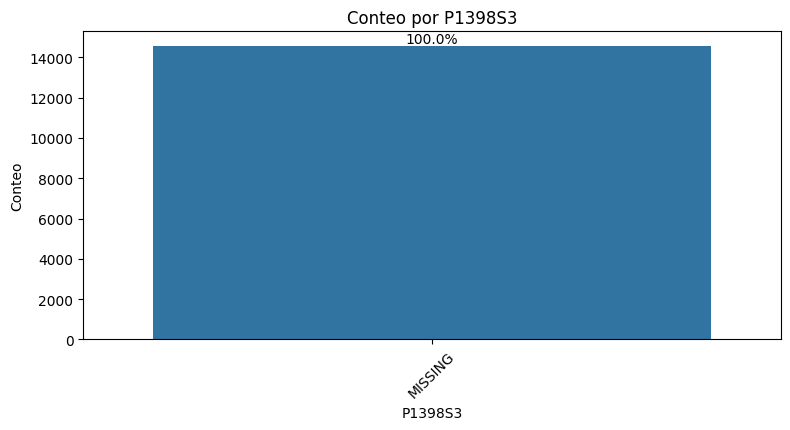

count     14562
unique        2
top          No
freq       9388
Name: P1398S4, dtype: object


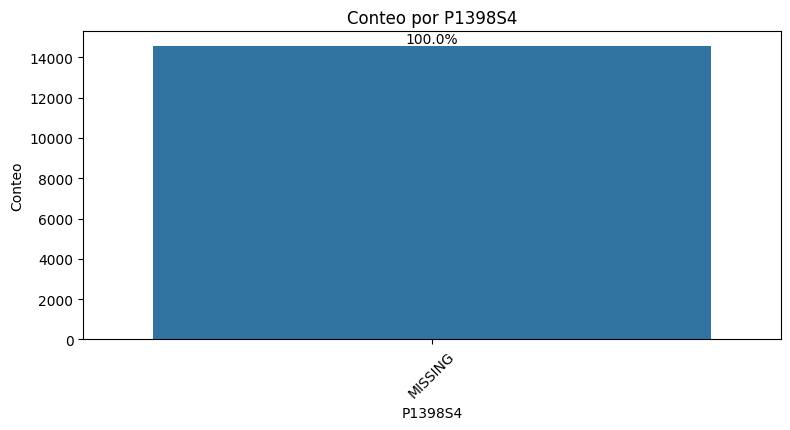

count     14562
unique        2
top          No
freq      11162
Name: P1398S5, dtype: object


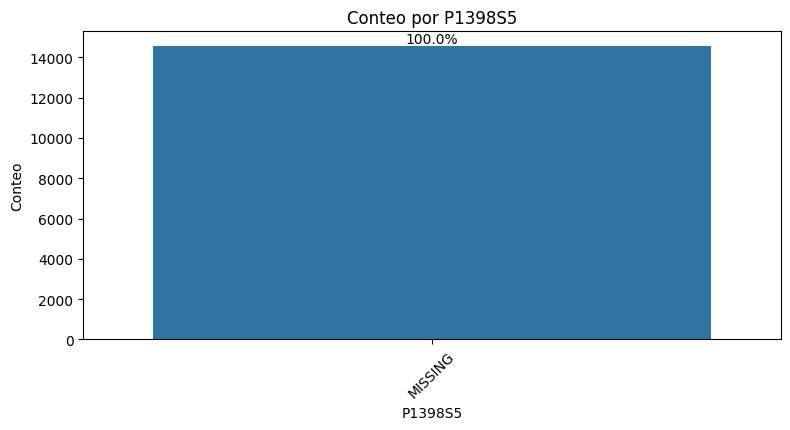

count     14562
unique        2
top          No
freq      13260
Name: P1398S6, dtype: object


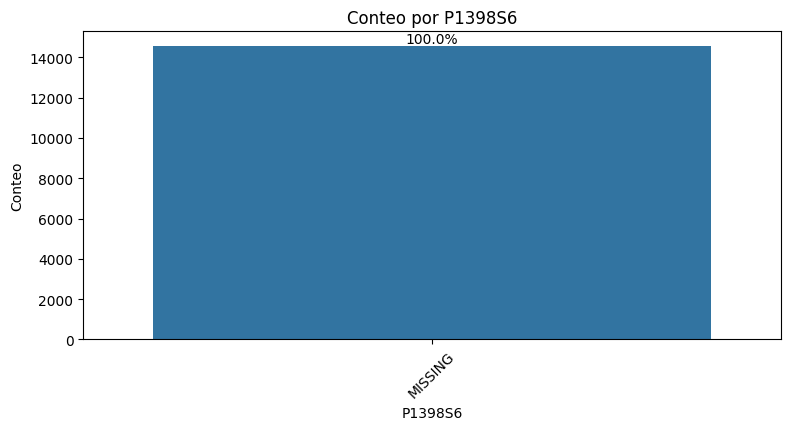

count     14562
unique        2
top          No
freq       9373
Name: P1398S8, dtype: object


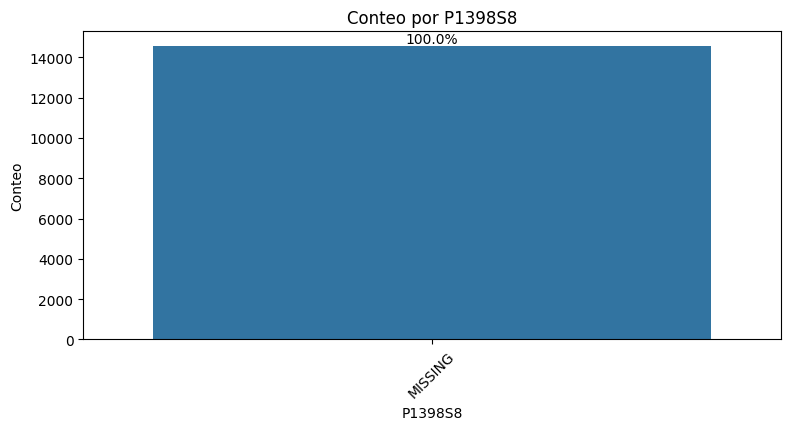

count     14562
unique        2
top          No
freq      11346
Name: P1398S9, dtype: object


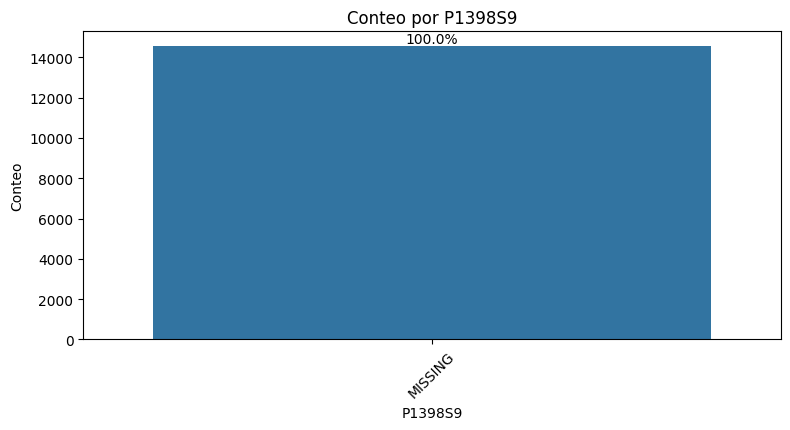

count     14562
unique        2
top          Si
freq       8987
Name: P1398S10, dtype: object


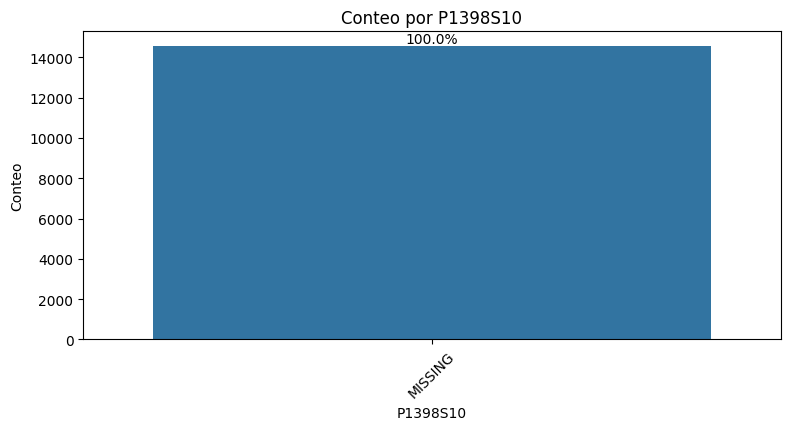

count     14562
unique        2
top          Si
freq       8056
Name: P1398S12, dtype: object


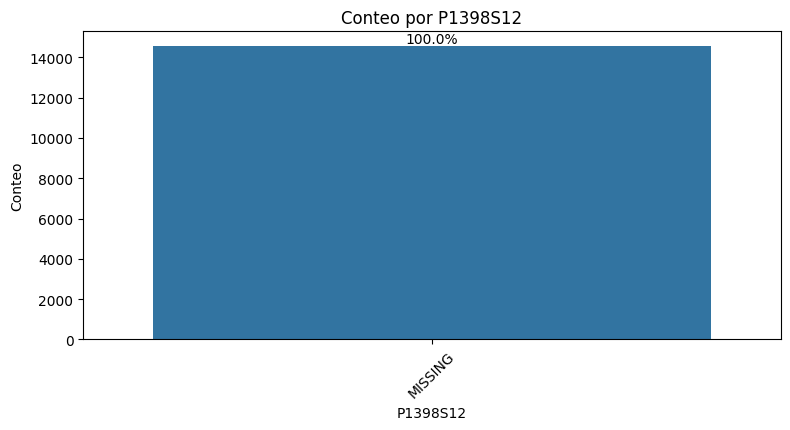

count     14562
unique        2
top          No
freq      14201
Name: P1398S11, dtype: object


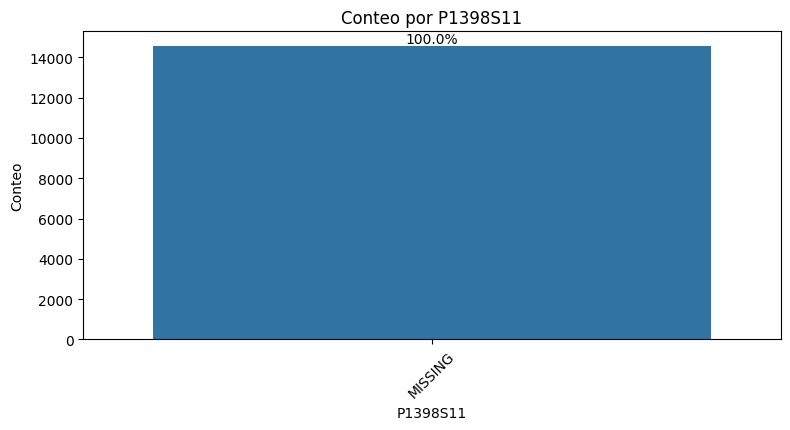

count     14562
unique        1
top          No
freq      14562
Name: P1398S13, dtype: object


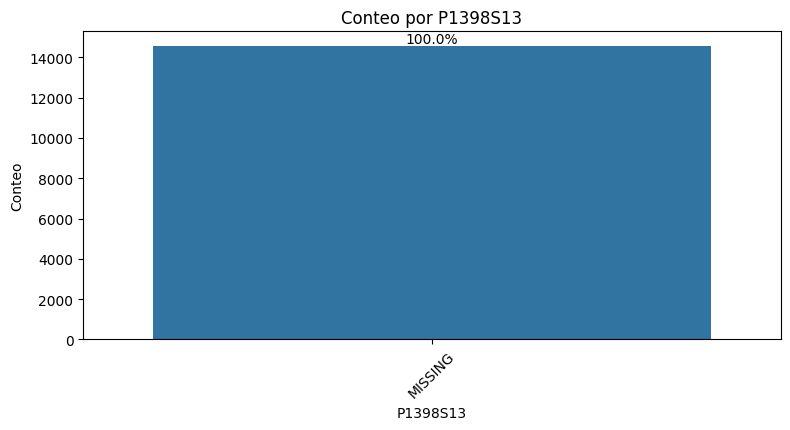

count     14562
unique        1
top          No
freq      14562
Name: P1398S14, dtype: object


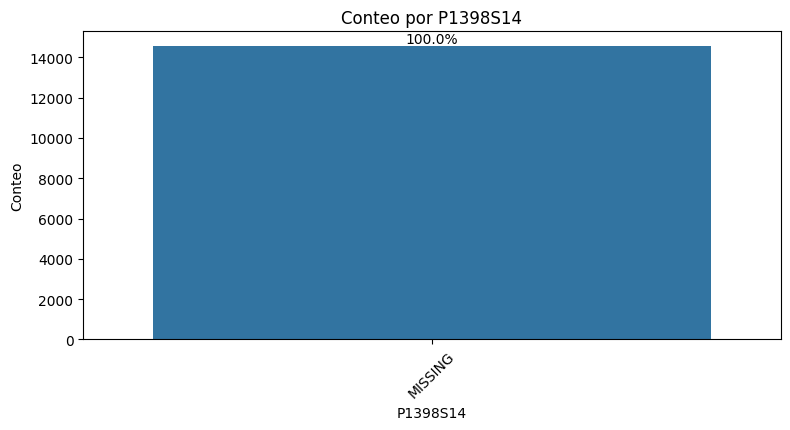

count     14562
unique        1
top          No
freq      14562
Name: P1398S15, dtype: object


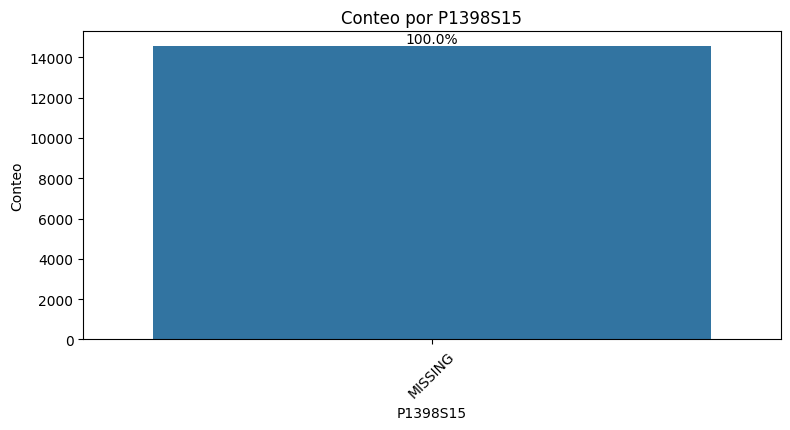

count     14562
unique        1
top          No
freq      14562
Name: P1398S16, dtype: object


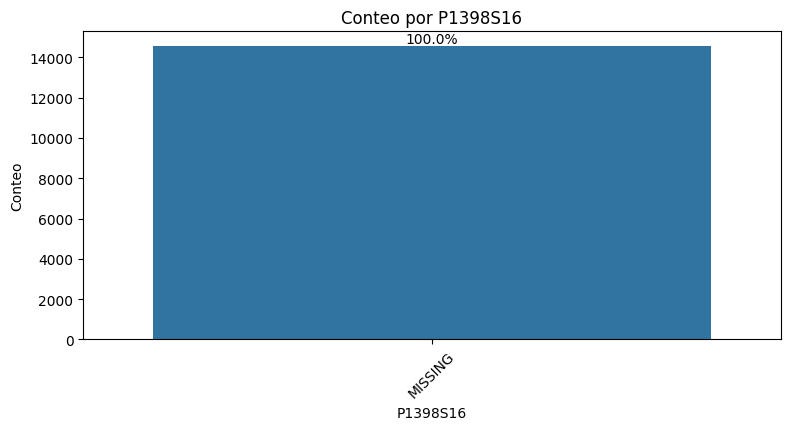

count     14562
unique        2
top          No
freq      14312
Name: P1398S17, dtype: object


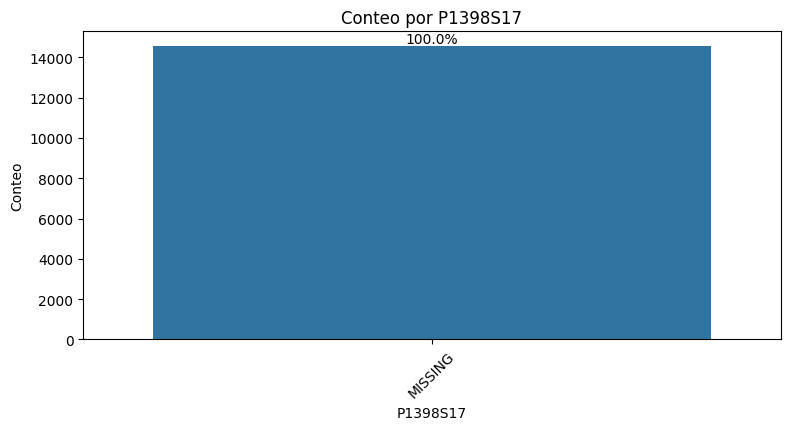

count     14562
unique        2
top          No
freq      14447
Name: P1398S18, dtype: object


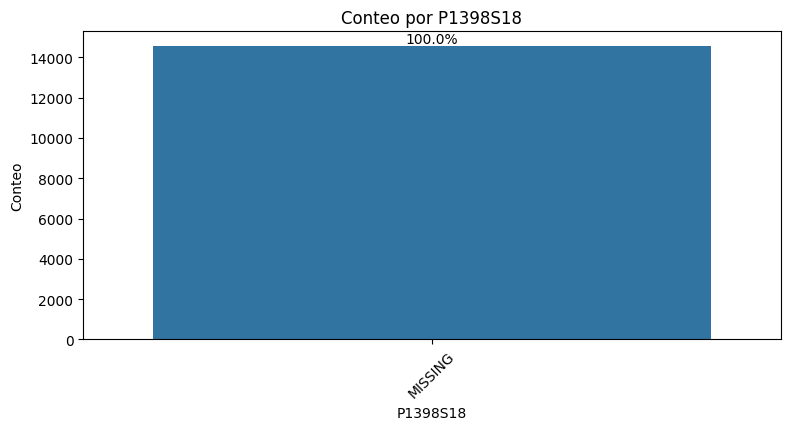

count     14562
unique        2
top          No
freq      14030
Name: P1398S19, dtype: object


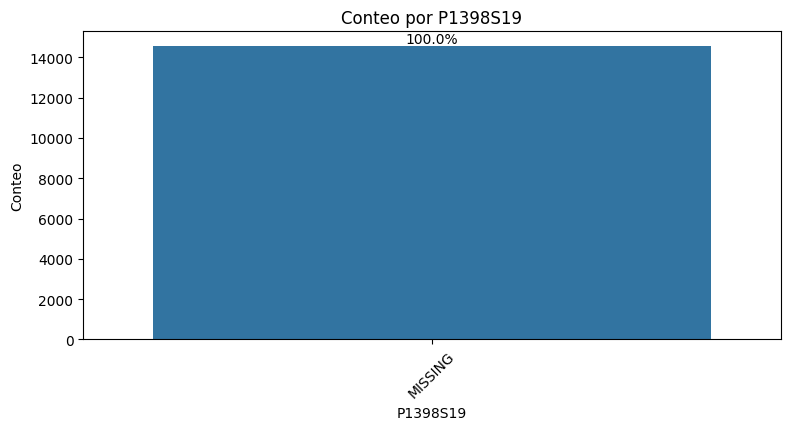

count     14562
unique        2
top          No
freq      12025
Name: P1398S20, dtype: object


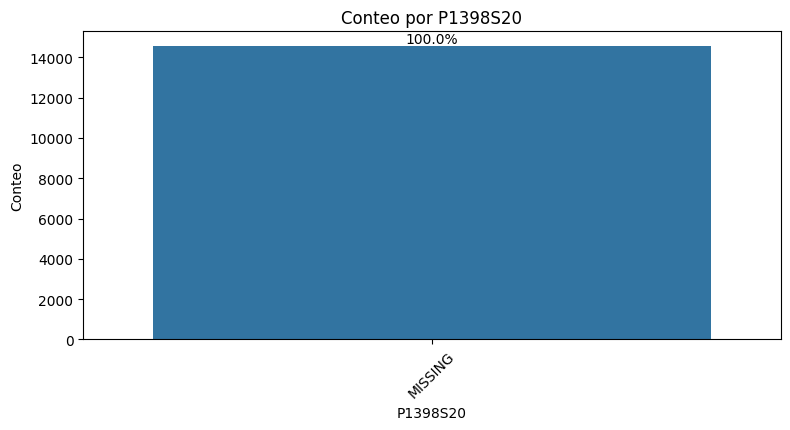

count     14562
unique        2
top          No
freq      14271
Name: P1398S21, dtype: object


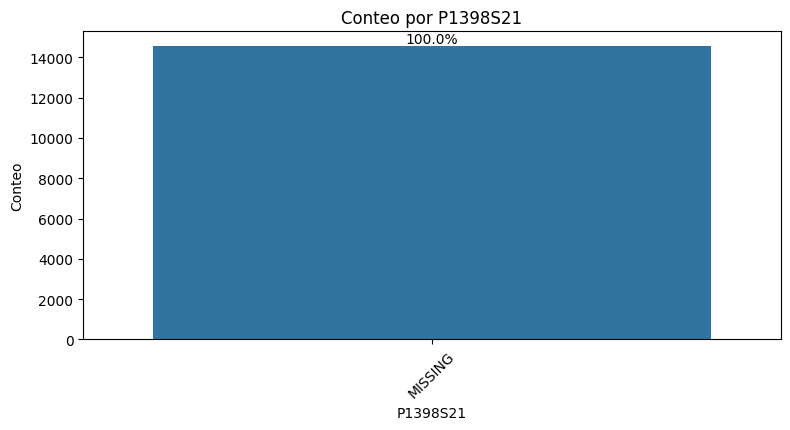

count     14562
unique        2
top          No
freq      14049
Name: P1398S22, dtype: object


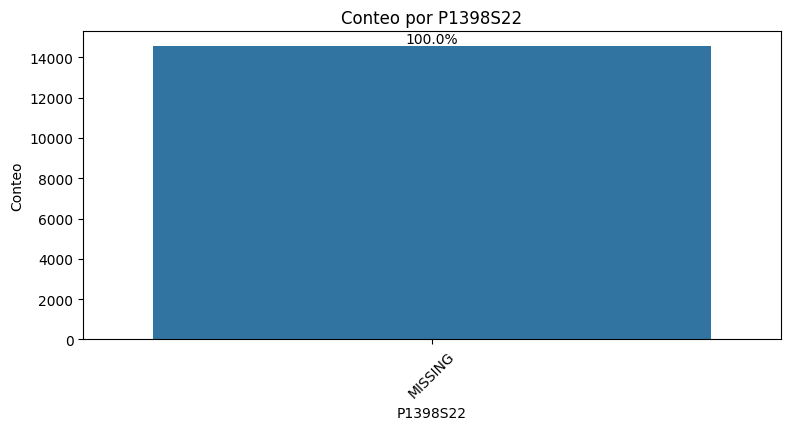

count     14562
unique        2
top          No
freq       9059
Name: P1590S1, dtype: object


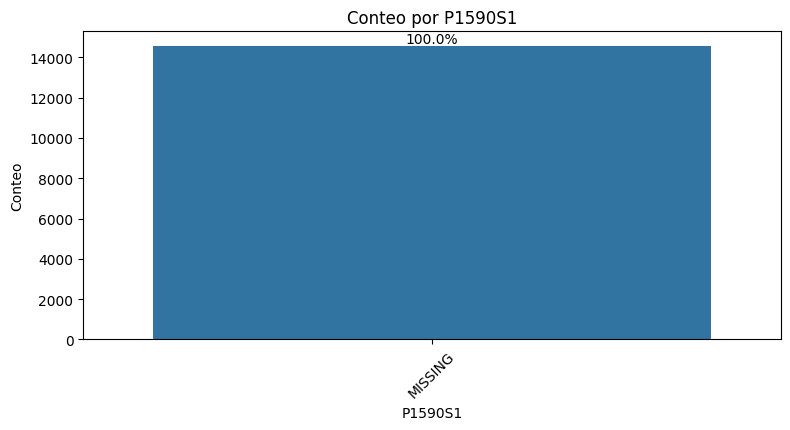

count     14562
unique        2
top          No
freq       8633
Name: P1590S2, dtype: object


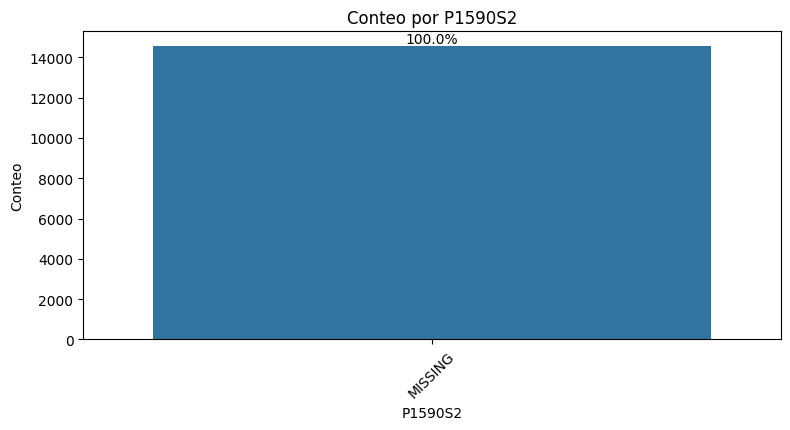

count     14562
unique        2
top          No
freq      13262
Name: P1590S3, dtype: object


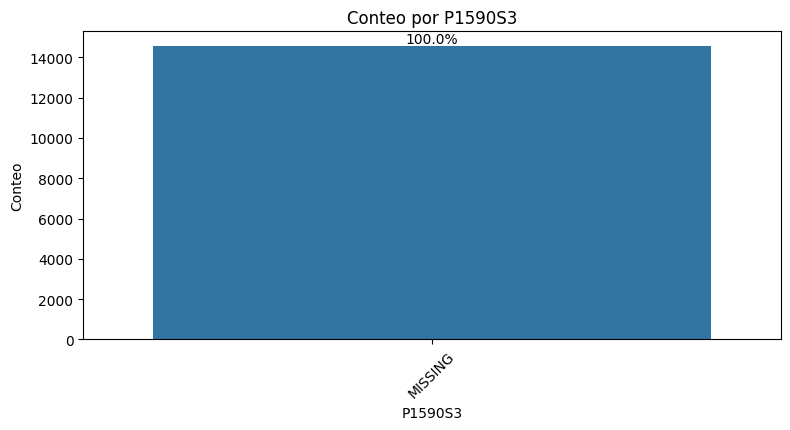

count     14562
unique        2
top          No
freq      14454
Name: P1590S4, dtype: object


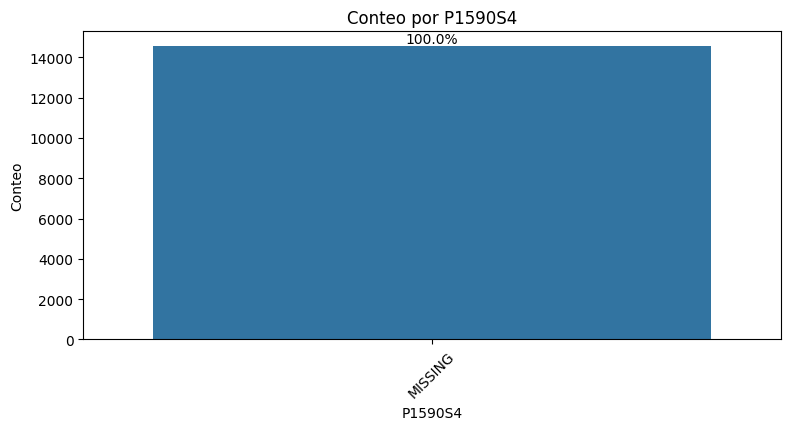

count     14562
unique        2
top          No
freq      13799
Name: P1590S5, dtype: object


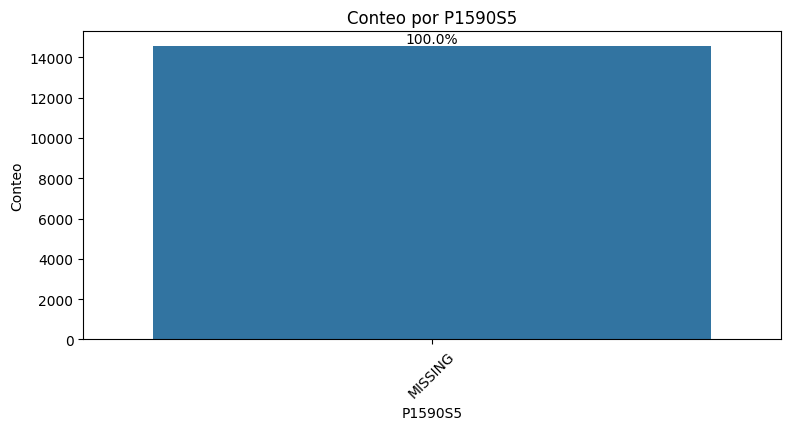

count     14562
unique        2
top          No
freq      13433
Name: P1361S1, dtype: object


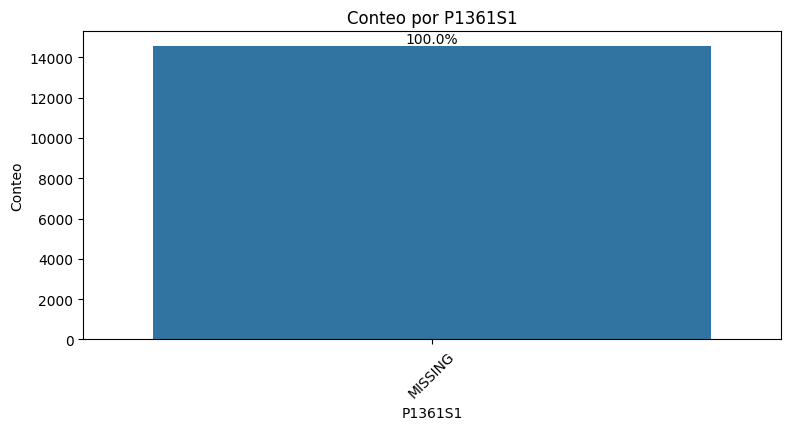

count     14562
unique        2
top          No
freq      13633
Name: P1361S15, dtype: object


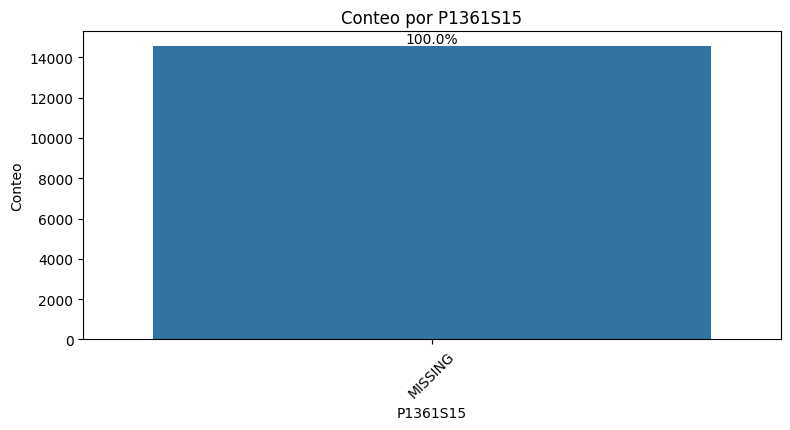

count     14562
unique        2
top          No
freq      14279
Name: P1361S14, dtype: object


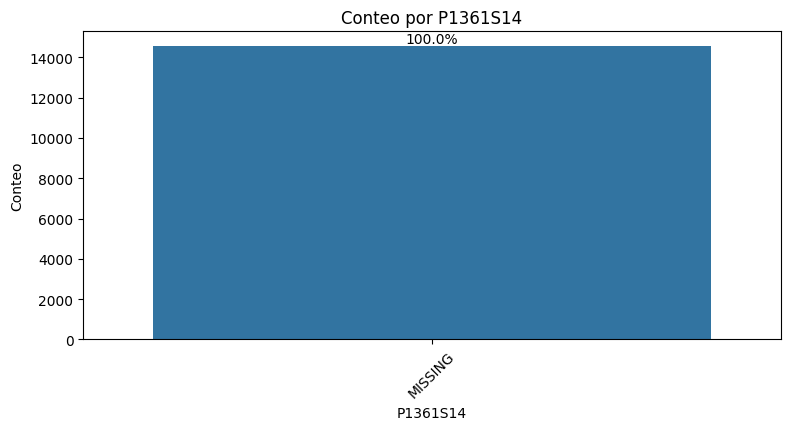

count     14562
unique        2
top          No
freq      12250
Name: P1361S2, dtype: object


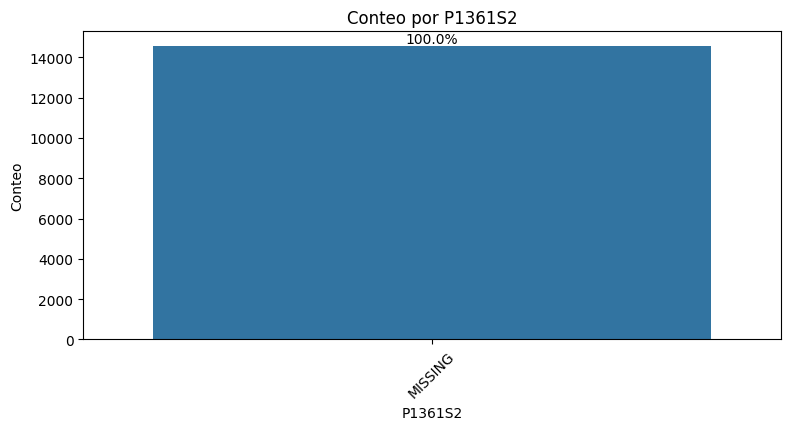

count     14562
unique        2
top          No
freq      11998
Name: P1361S16, dtype: object


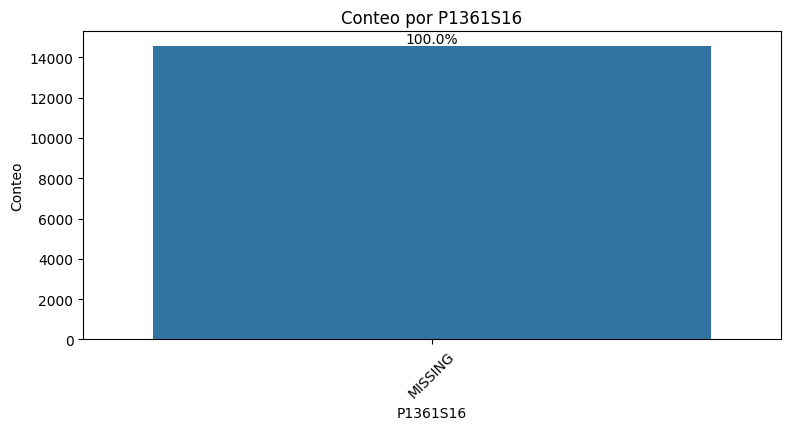

count     14562
unique        2
top          No
freq      11817
Name: P1361S3, dtype: object


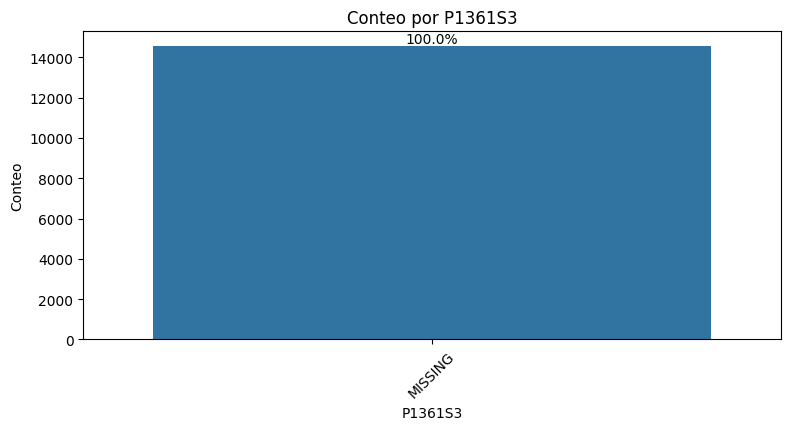

count     14562
unique        2
top          No
freq      11385
Name: P1361S4, dtype: object


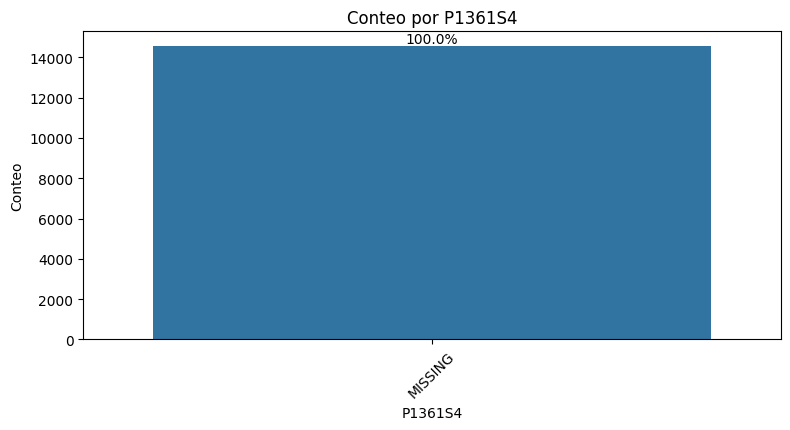

count     14562
unique        2
top          No
freq      12135
Name: P1361S5, dtype: object


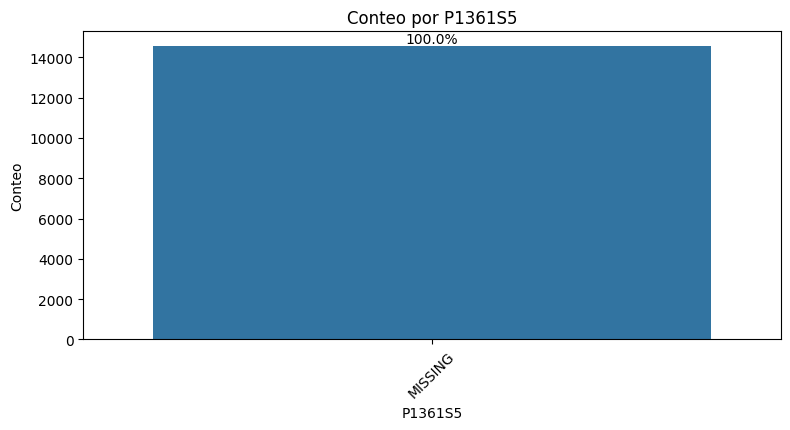

count     14562
unique        2
top          No
freq      12740
Name: P1361S6, dtype: object


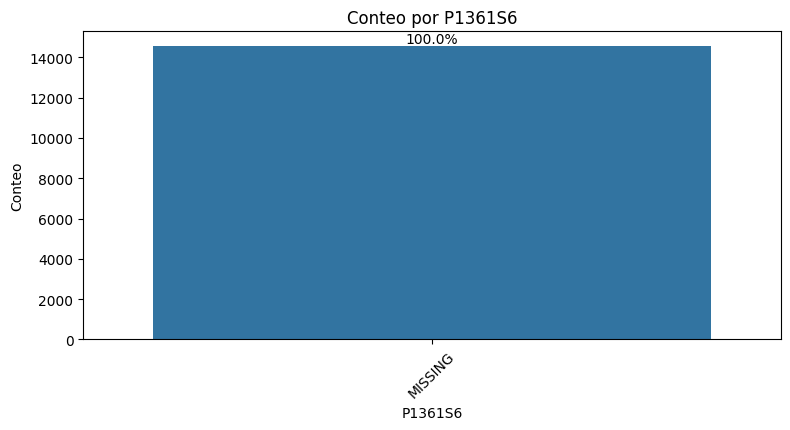

count     14562
unique        2
top          No
freq      12169
Name: P1361S7, dtype: object


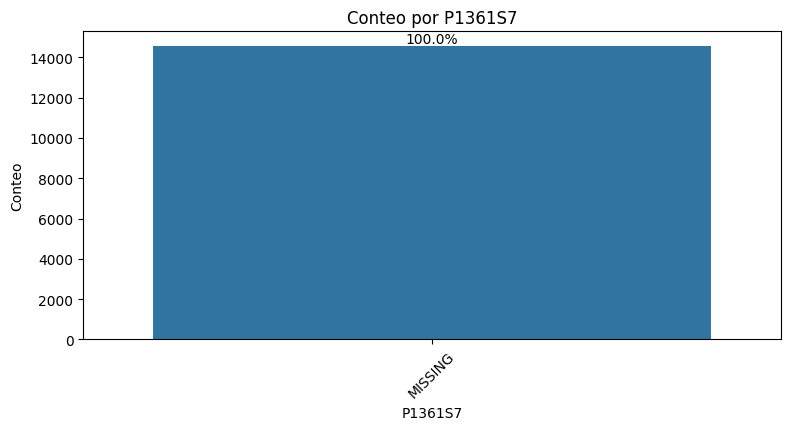

count     14562
unique        2
top          No
freq      12446
Name: P1361S11, dtype: object


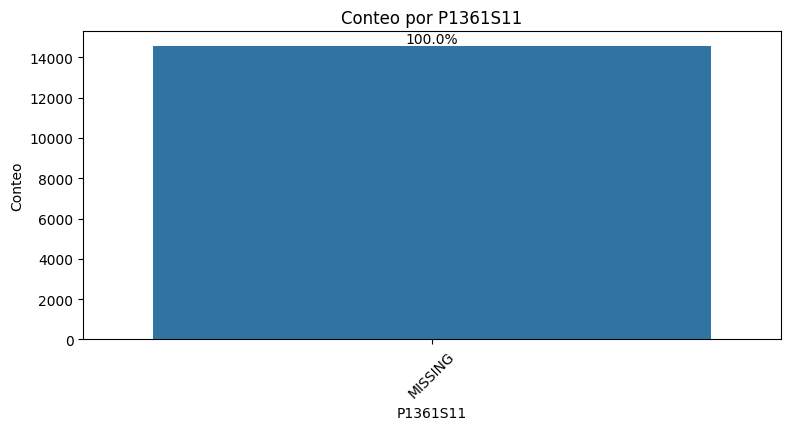

count     14562
unique        2
top          No
freq      13403
Name: P1361S8, dtype: object


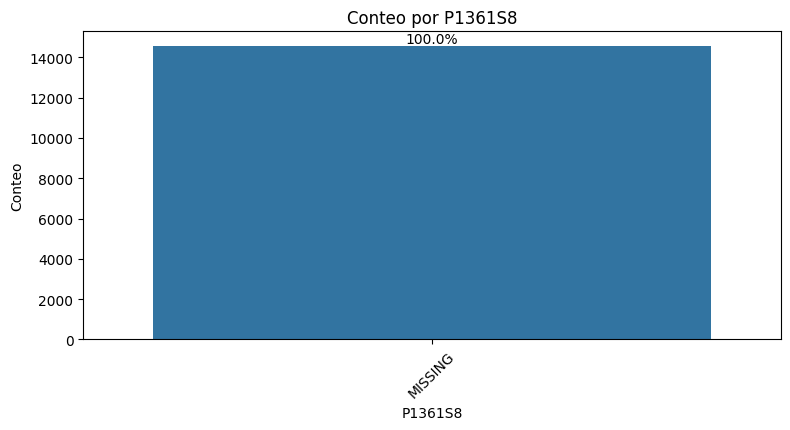

count     14562
unique        2
top          No
freq      14329
Name: P1361S9, dtype: object


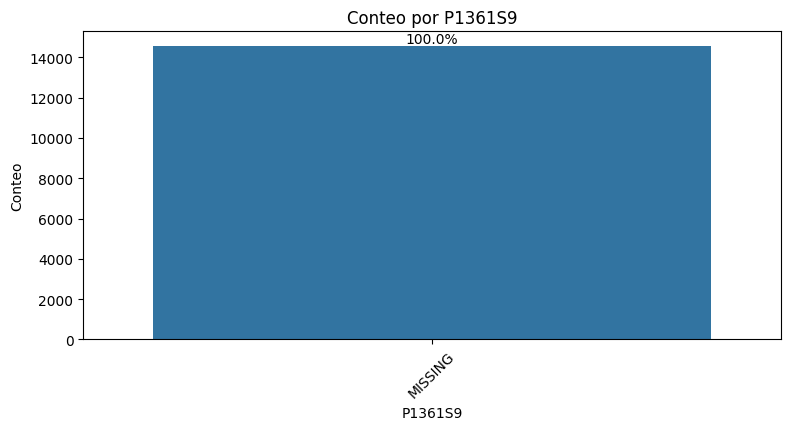

count     14562
unique        2
top          No
freq      14071
Name: P1361S10, dtype: object


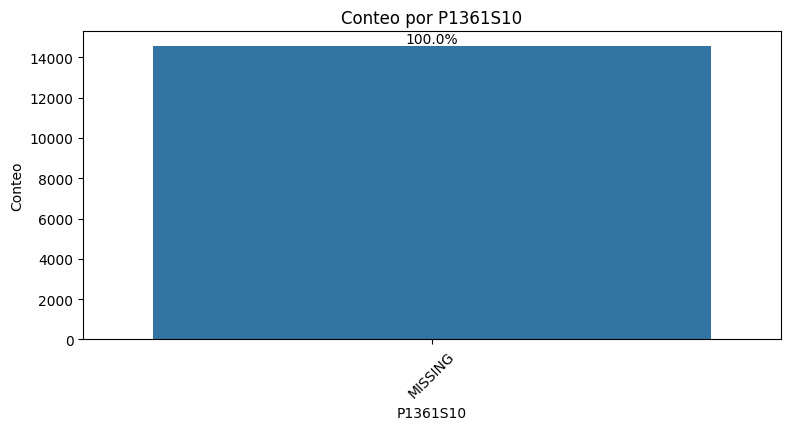

count     14562
unique        1
top          No
freq      14562
Name: P1361S12, dtype: object


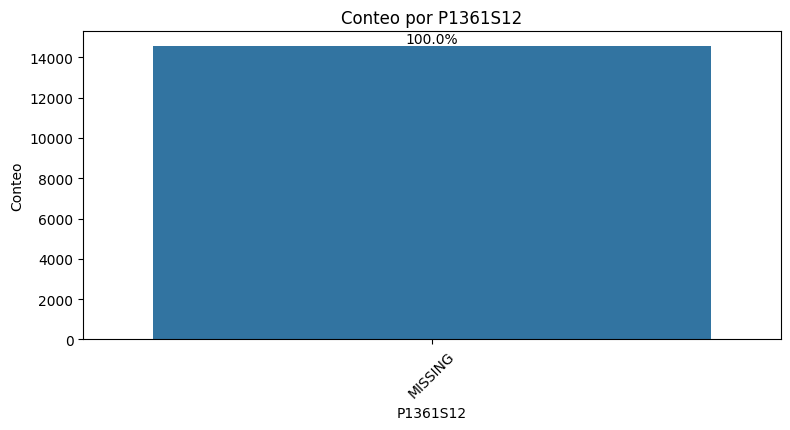

count     14562
unique        1
top          No
freq      14562
Name: P1361S13, dtype: object


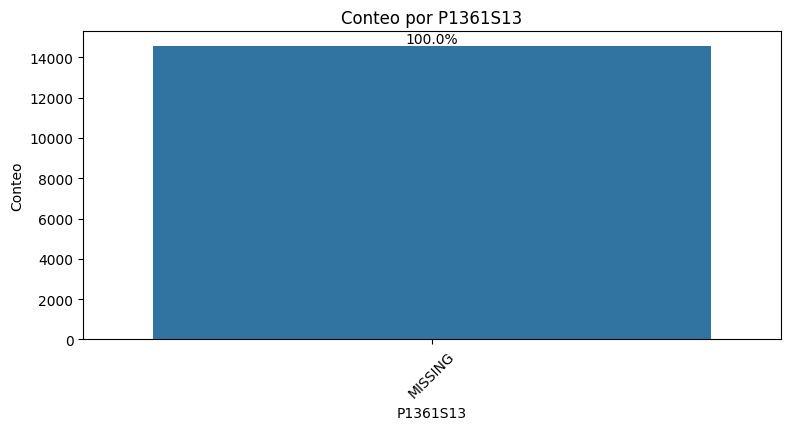

count     14562
unique        2
top          No
freq      11686
Name: P1358S1, dtype: object


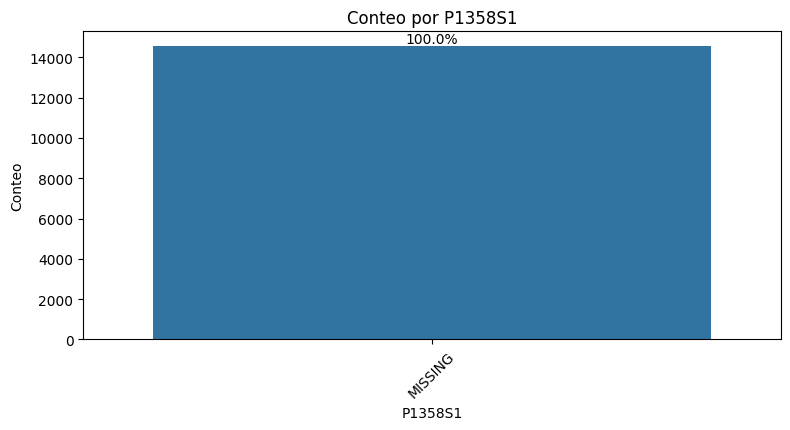

count     14562
unique        2
top          No
freq      12175
Name: P1358S14, dtype: object


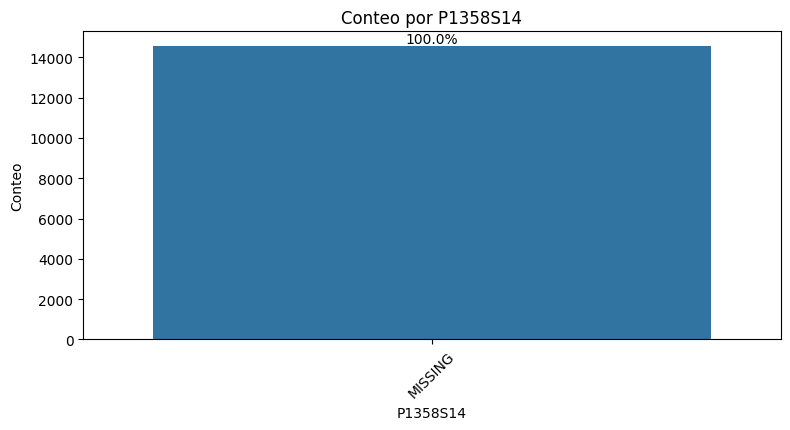

count     14562
unique        2
top          No
freq      13792
Name: P1358S13, dtype: object


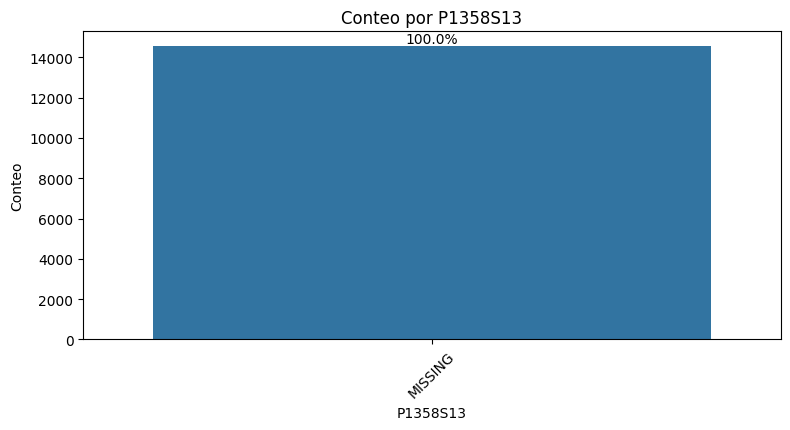

count     14562
unique        2
top          Si
freq       8175
Name: P1358S2, dtype: object


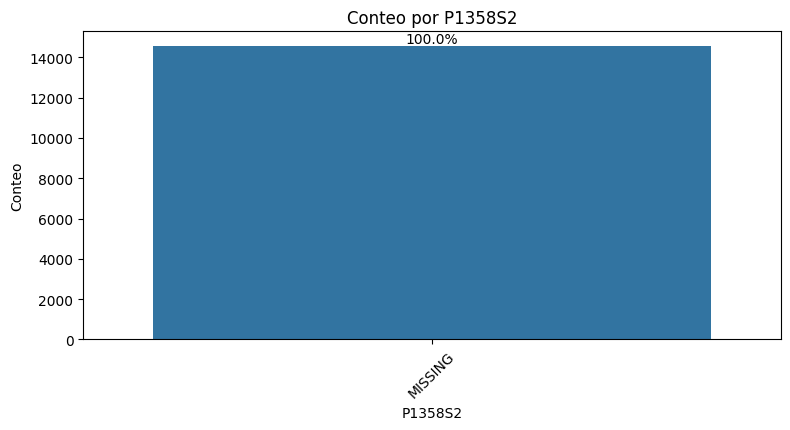

count     14562
unique        2
top          Si
freq       7517
Name: P1358S15, dtype: object


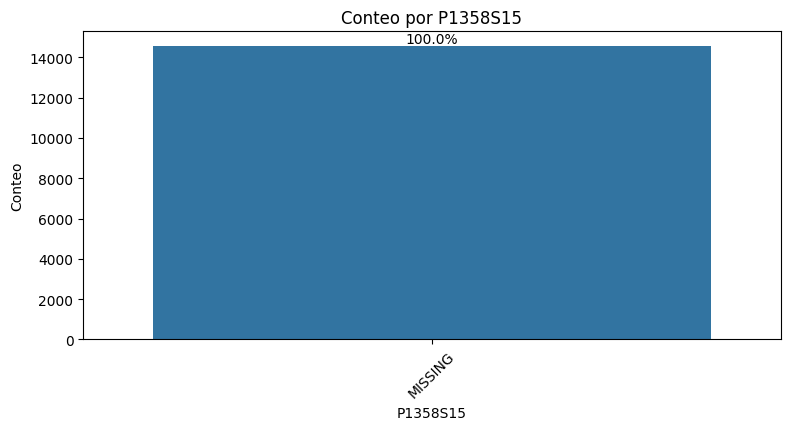

count     14562
unique        2
top          Si
freq       7294
Name: P1358S3, dtype: object


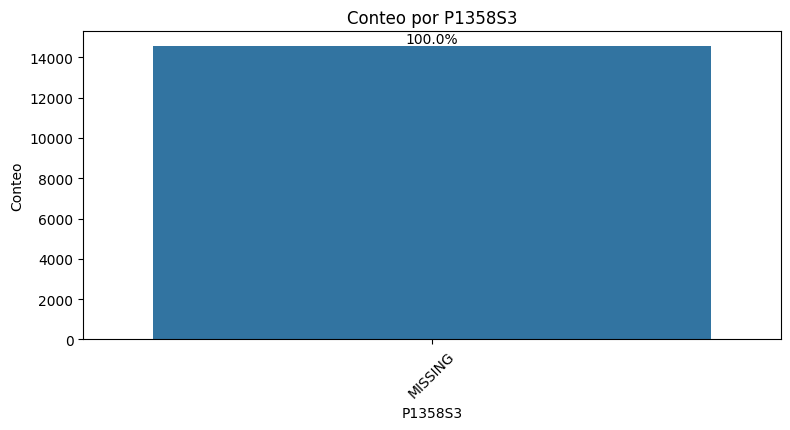

count     14562
unique        2
top          Si
freq       8624
Name: P1358S4, dtype: object


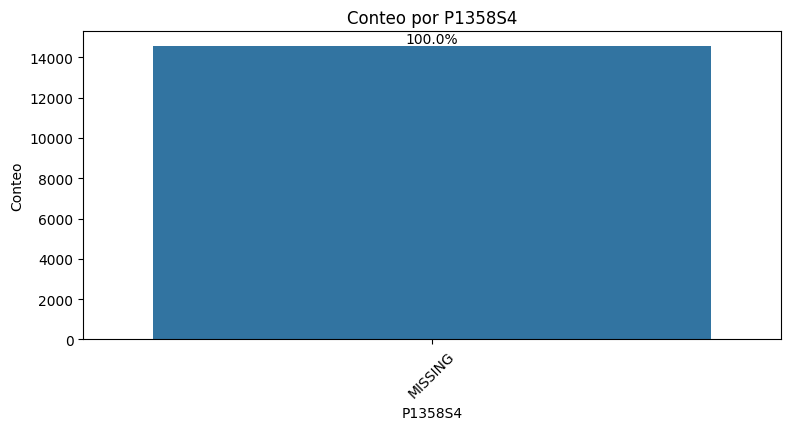

count     14562
unique        2
top          No
freq       7320
Name: P1358S5, dtype: object


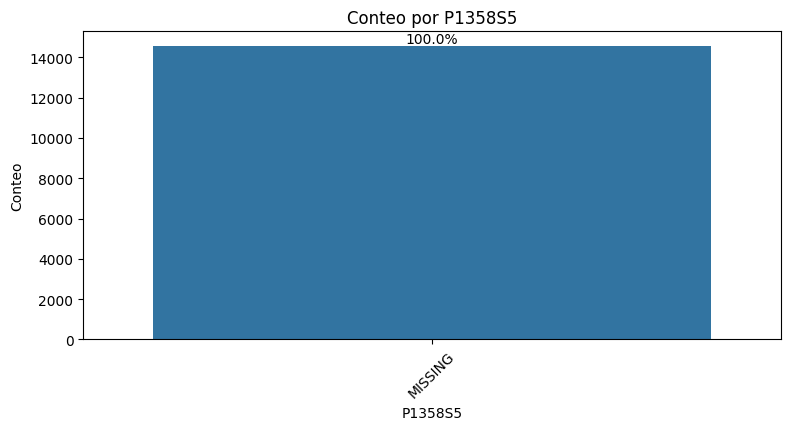

count     14562
unique        2
top          No
freq       9086
Name: P1358S6, dtype: object


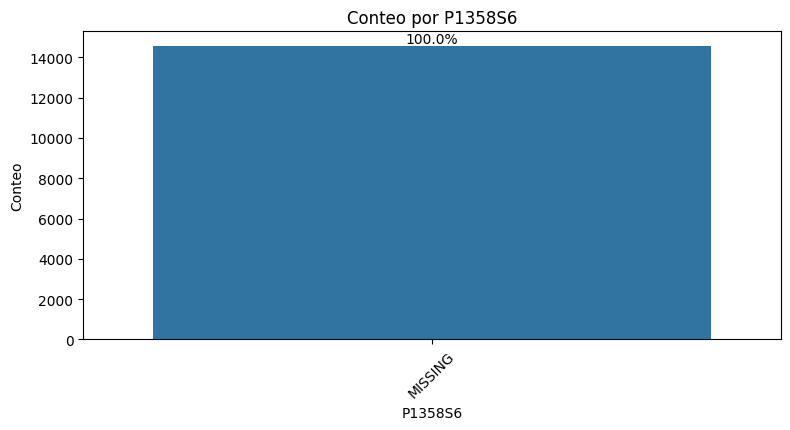

count     14562
unique        2
top          No
freq       7355
Name: P1358S7, dtype: object


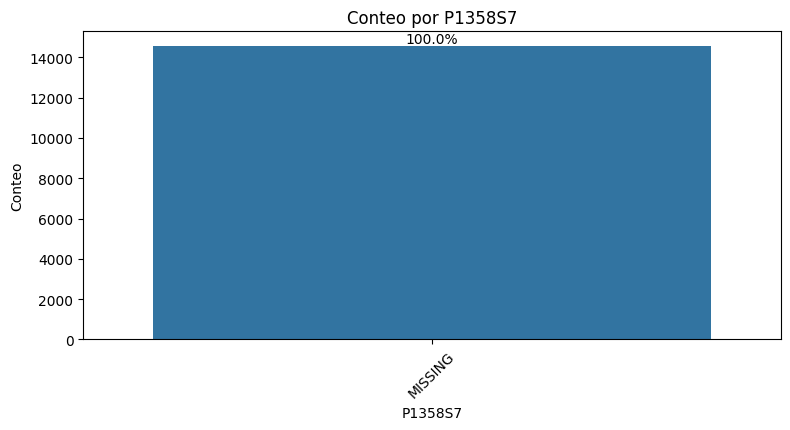

count     14562
unique        2
top          No
freq       8455
Name: P1358S12, dtype: object


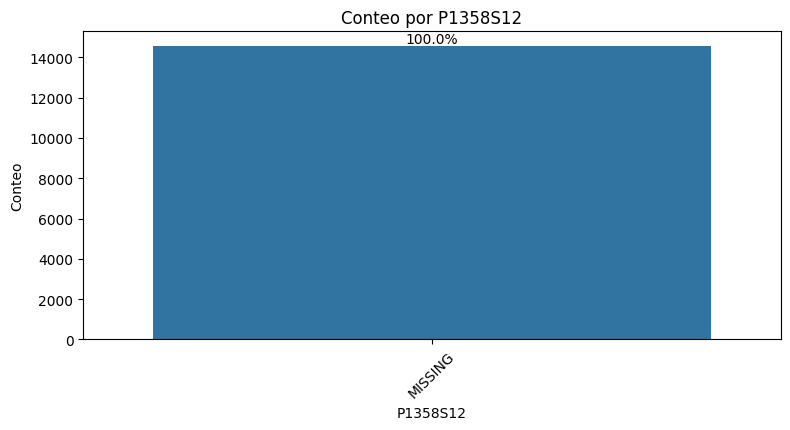

count     14562
unique        2
top          No
freq      11039
Name: P1358S8, dtype: object


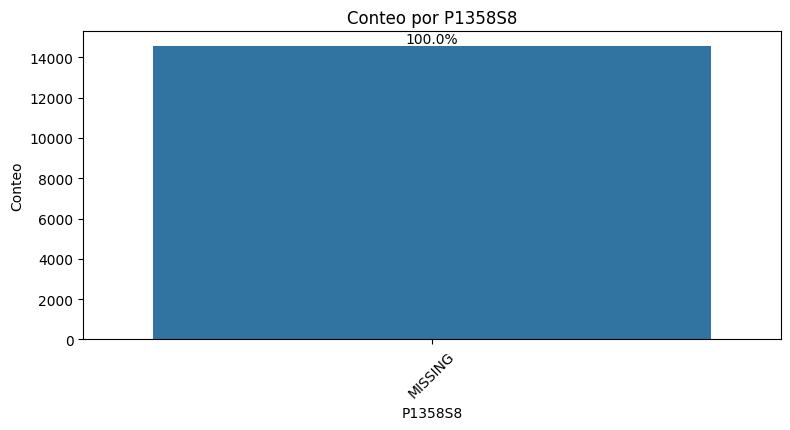

count     14562
unique        2
top          No
freq      13480
Name: P1358S9, dtype: object


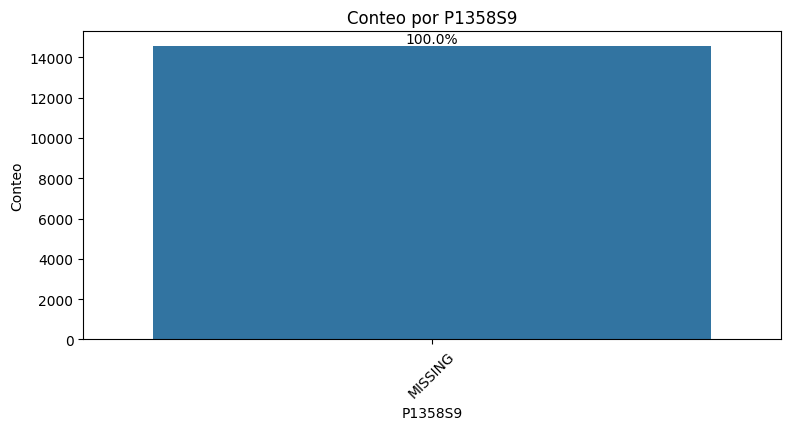

count     14562
unique        2
top          No
freq      12361
Name: P1358S11, dtype: object


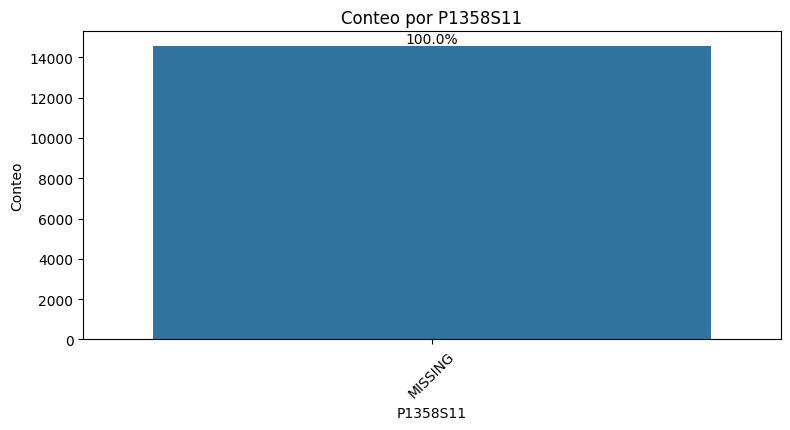

count     14562
unique        2
top          No
freq      10022
Name: P1358S10, dtype: object


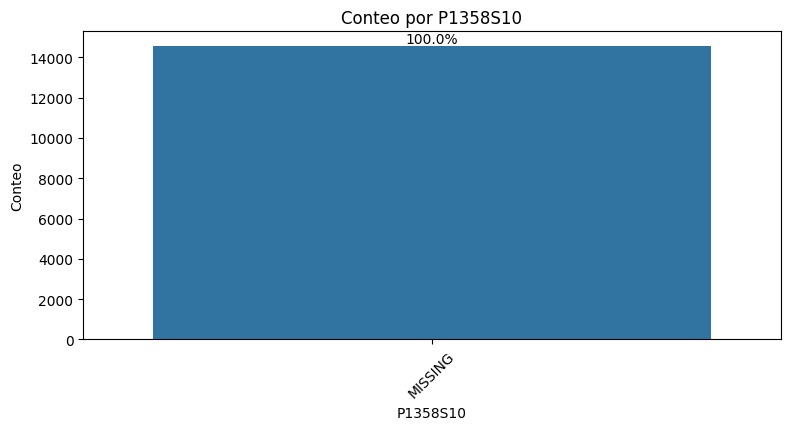

count     14562
unique        2
top          No
freq      13234
Name: P3302S1, dtype: object


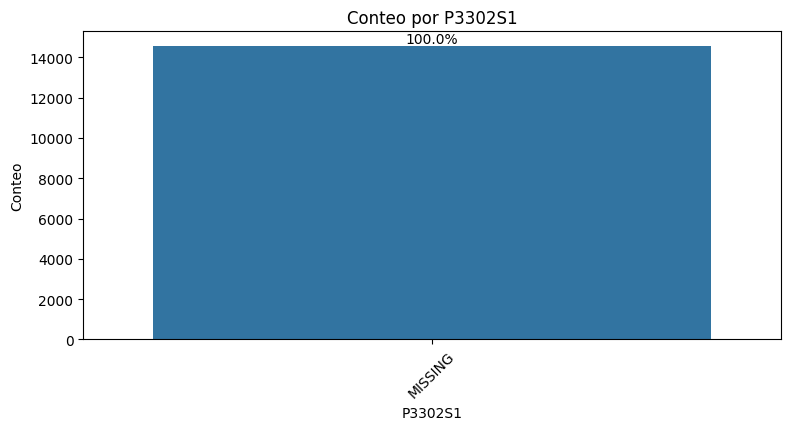

count     14562
unique        2
top          No
freq      13741
Name: P3302S2, dtype: object


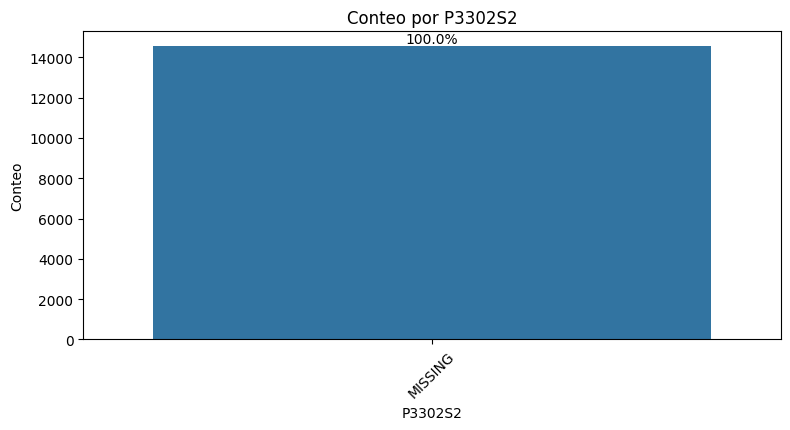

count     14562
unique        2
top          No
freq      14337
Name: P3302S3, dtype: object


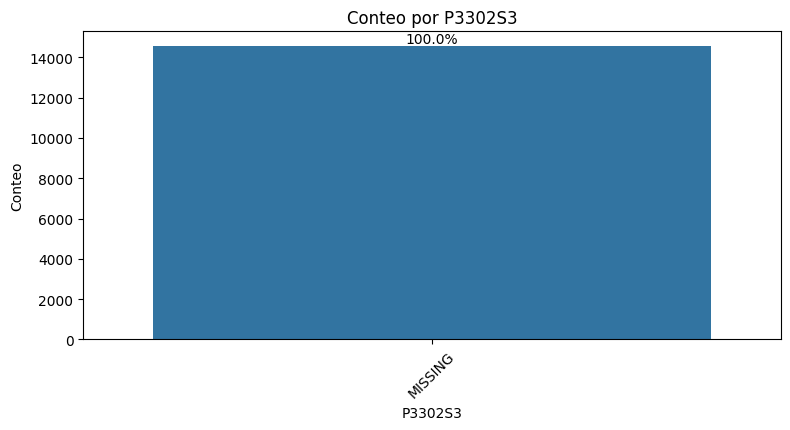

count     14562
unique        2
top          No
freq      14470
Name: P3302S4, dtype: object


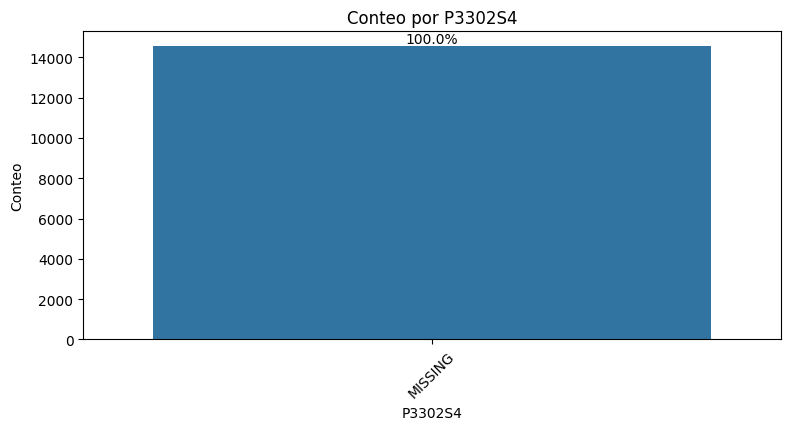

count     14562
unique        2
top          No
freq      14485
Name: P3302S5, dtype: object


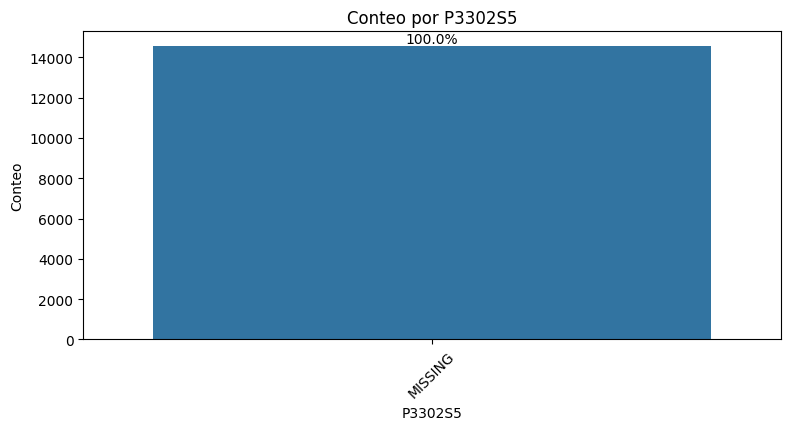

count     14562
unique        2
top          No
freq      14548
Name: P3302S6, dtype: object


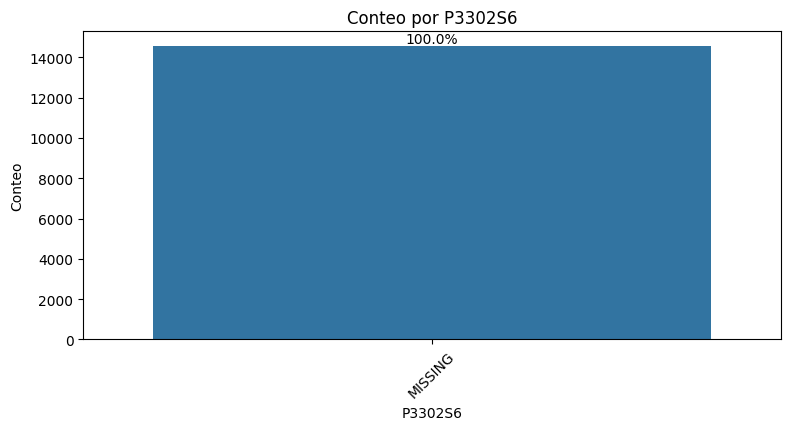

count     14562
unique        2
top          No
freq      14473
Name: P3302S7, dtype: object


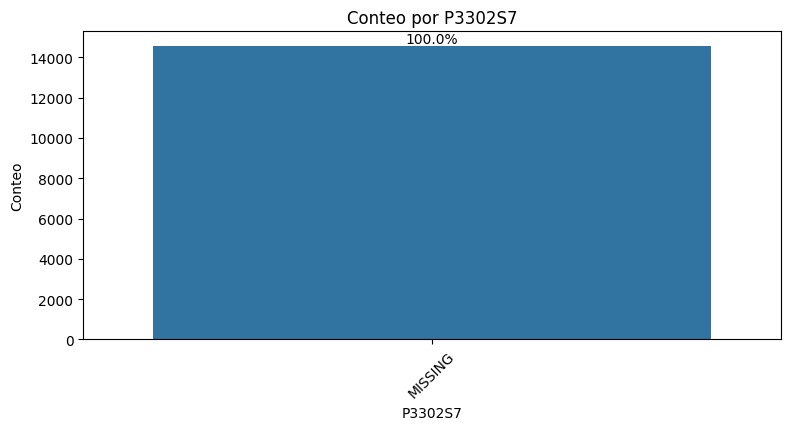

count     14562
unique        2
top          No
freq      14510
Name: P3302S8, dtype: object


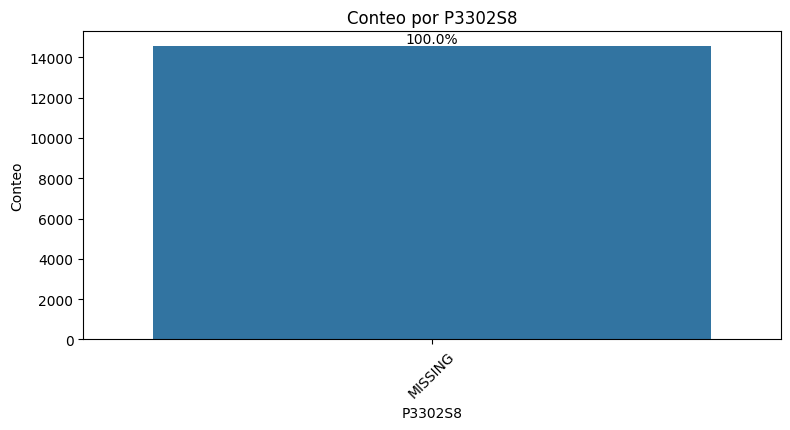

count     14562
unique        2
top          No
freq      14506
Name: P3306, dtype: object


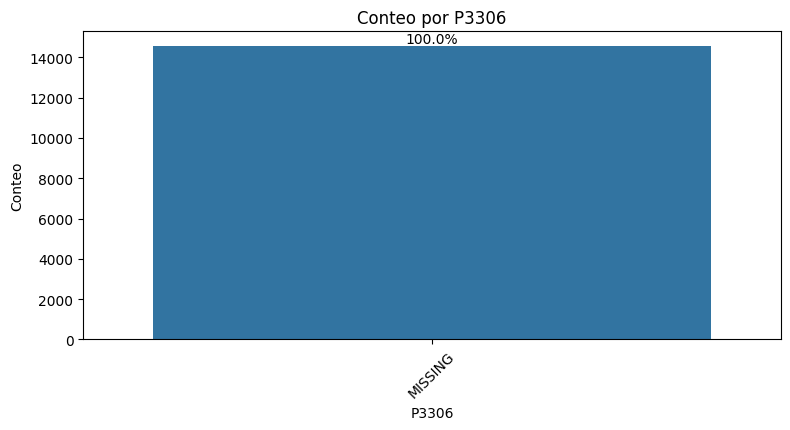

count     14562
unique        2
top          No
freq      14450
Name: P3307, dtype: object


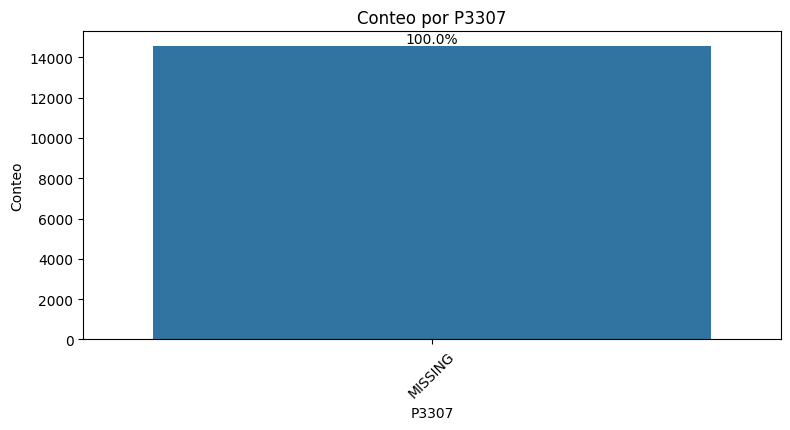

count     14562
unique        2
top          No
freq      14519
Name: P3308, dtype: object


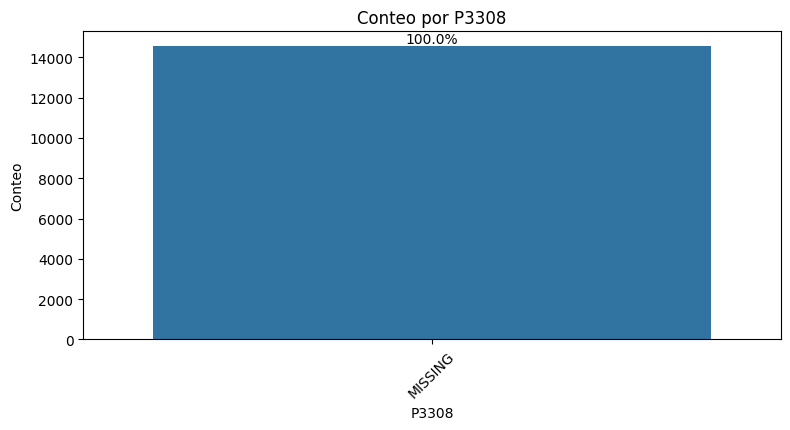

count     14562
unique        2
top          No
freq      14533
Name: P3309, dtype: object


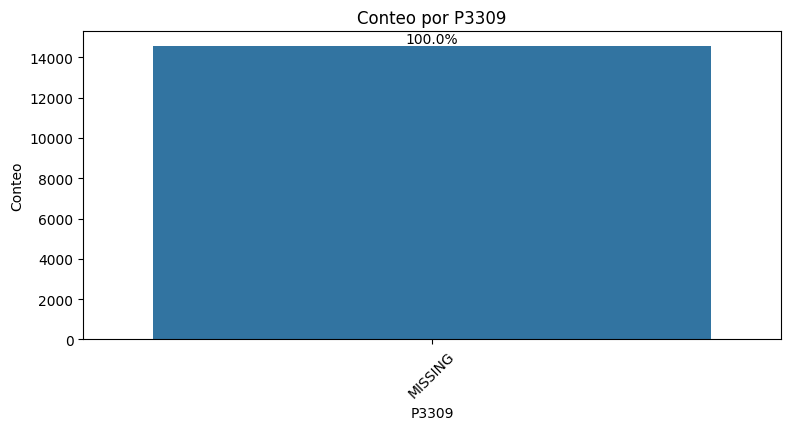

count     14562
unique        2
top          No
freq      14554
Name: P33010, dtype: object


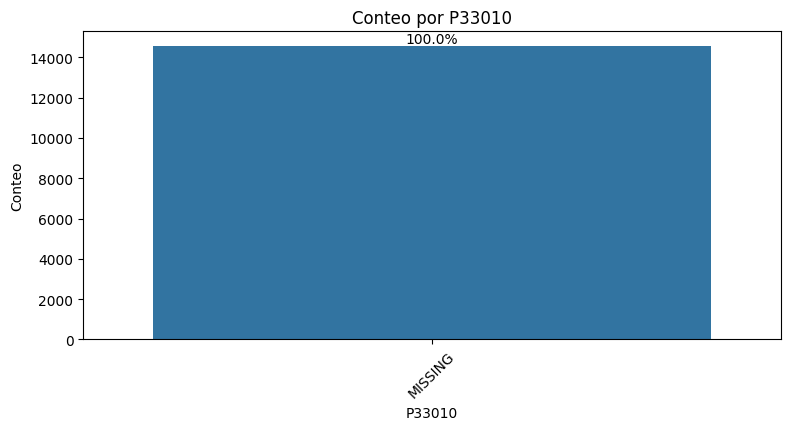

count     14562
unique        2
top          No
freq      14449
Name: P33011, dtype: object


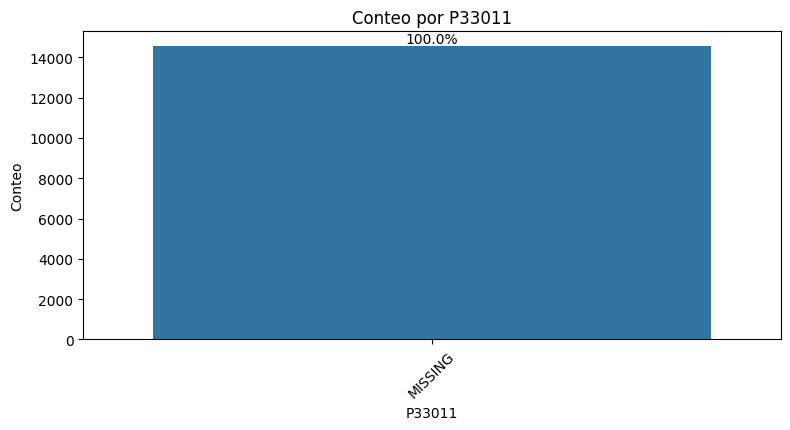

count     14562
unique        2
top          No
freq      14559
Name: P3312, dtype: object


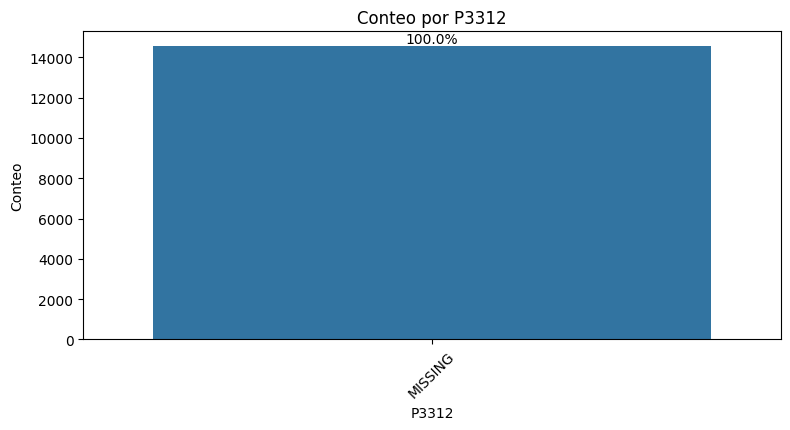

count     14562
unique        2
top          No
freq      11283
Name: P3112S1, dtype: object


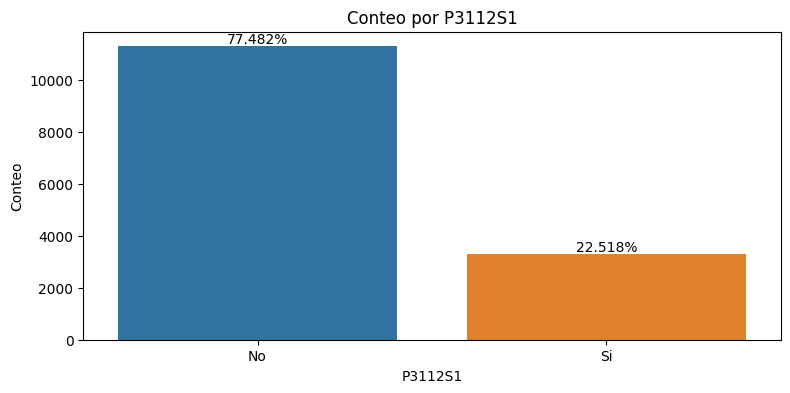

count     14562
unique        2
top          No
freq      10435
Name: P3112S2, dtype: object


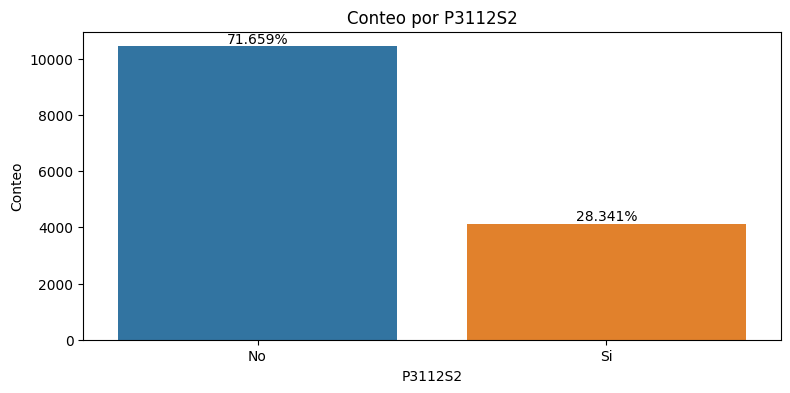

count     14562
unique        2
top          No
freq      12377
Name: P3112S3, dtype: object


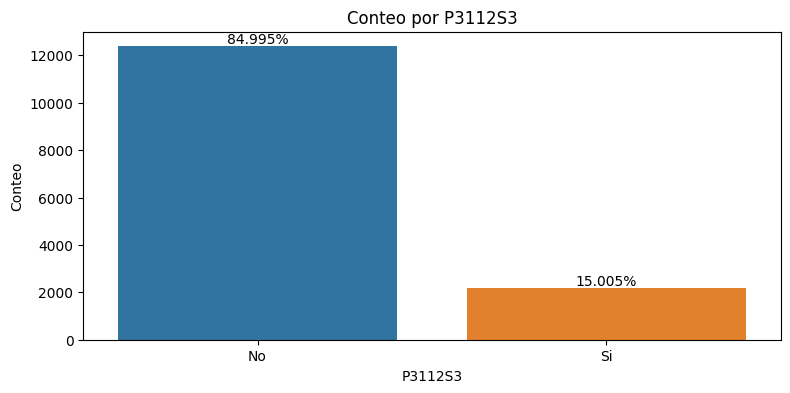

count     14562
unique        2
top          No
freq      11289
Name: P3112S4, dtype: object


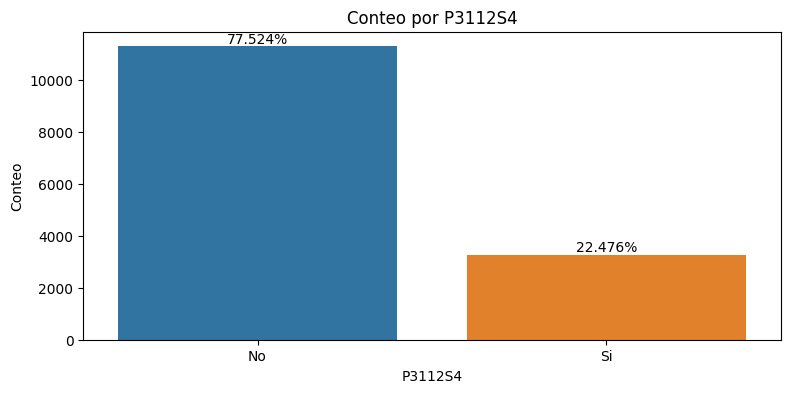

count     14562
unique        2
top          No
freq       9236
Name: P3112S5, dtype: object


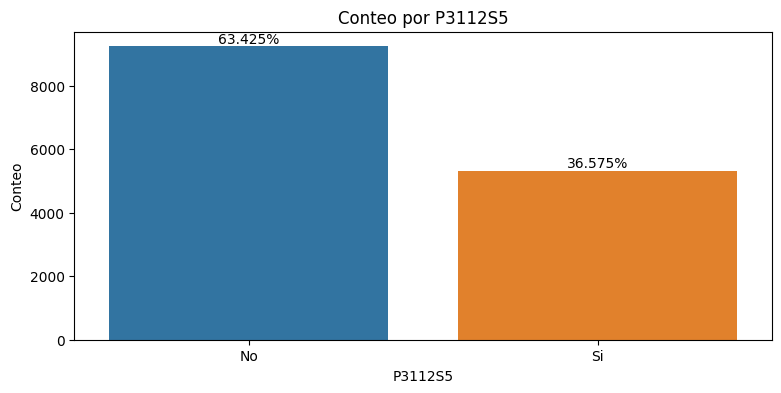

count     14562
unique        2
top          No
freq       8922
Name: P3112S6, dtype: object


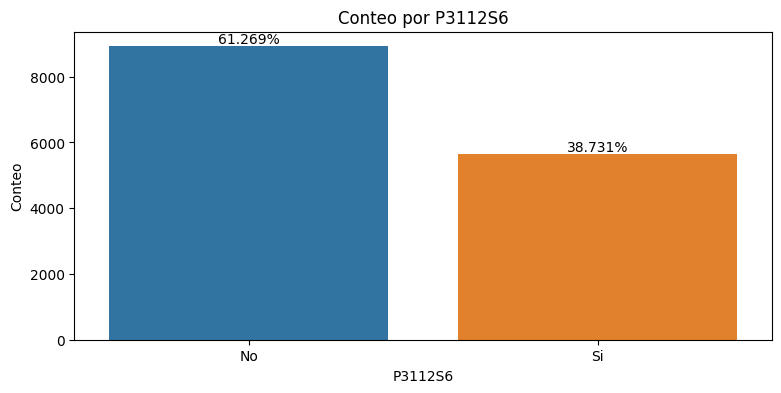

count     14562
unique        2
top          No
freq      13837
Name: P3112S7, dtype: object


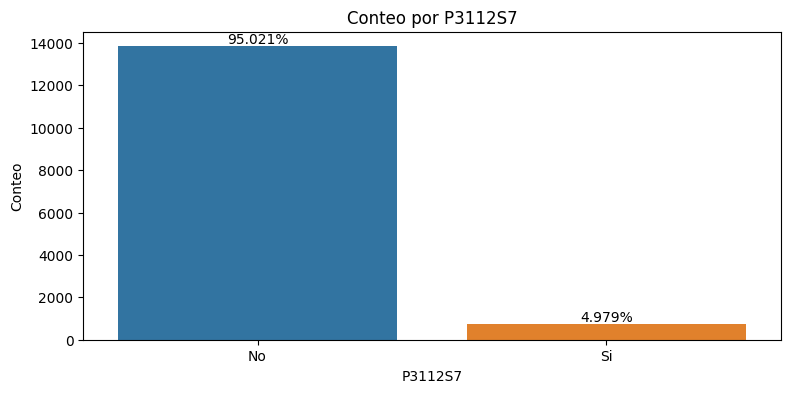

count     14562
unique        2
top          No
freq      13923
Name: P3112S8, dtype: object


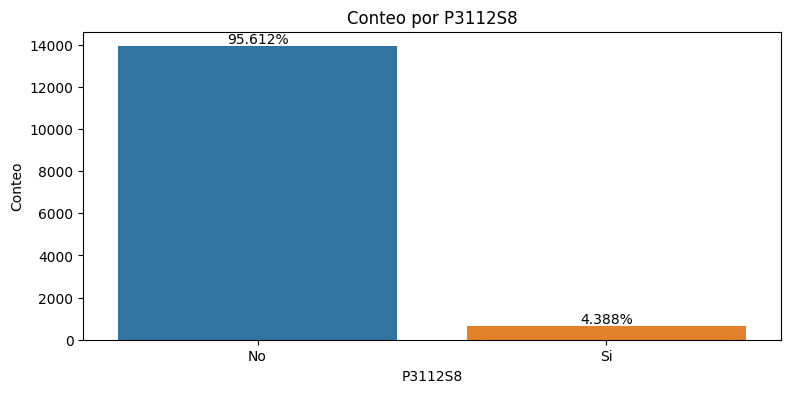

count     14562
unique        2
top          No
freq      13671
Name: P3112S9, dtype: object


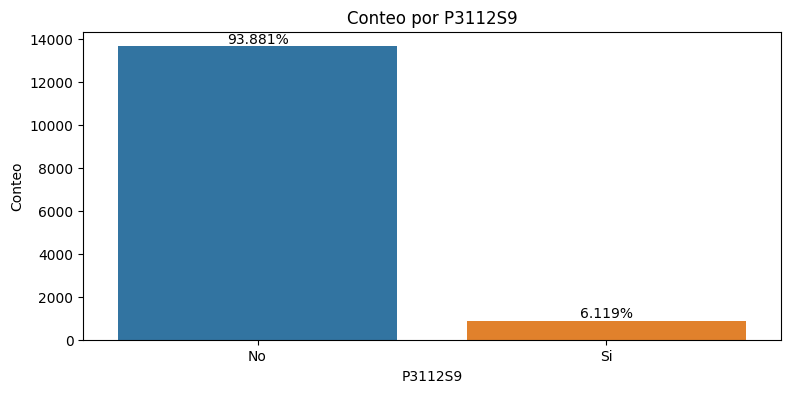

count     14562
unique        2
top          No
freq      13989
Name: P3112S10, dtype: object


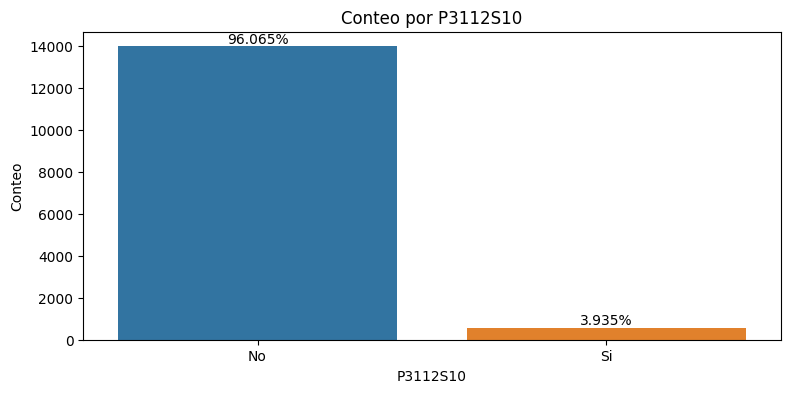

count     14562
unique        2
top          No
freq      14044
Name: P3112S11, dtype: object


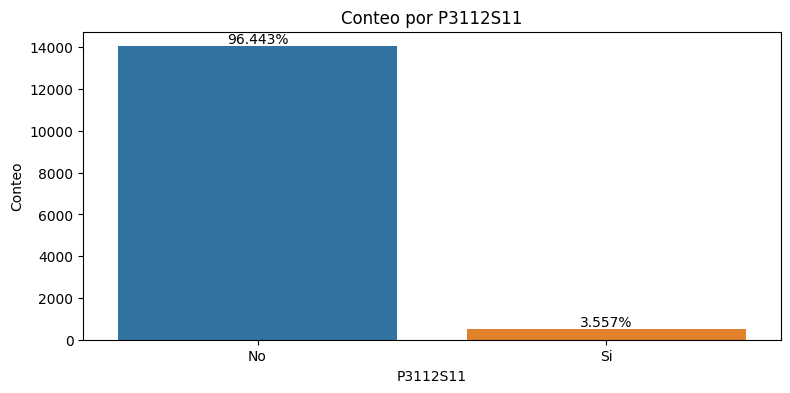

count     14562
unique        2
top          No
freq      10634
Name: P3112S12, dtype: object


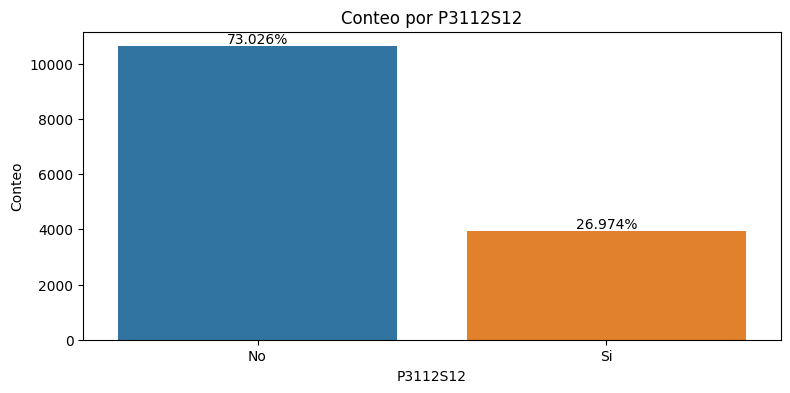

count     14562
unique        2
top          No
freq      12560
Name: P3112S13, dtype: object


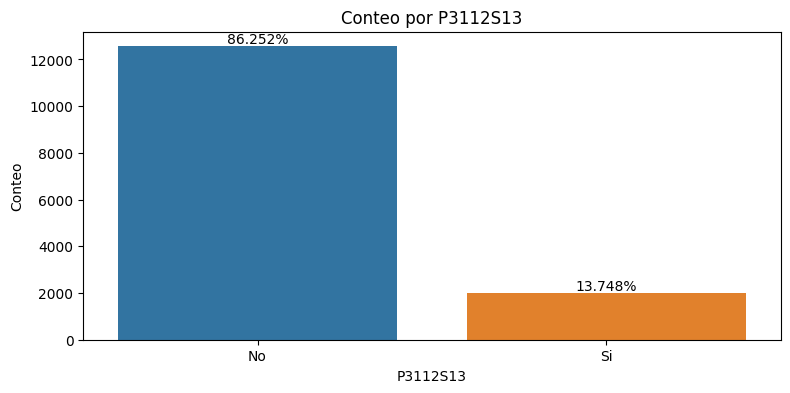

count     14562
unique        2
top          No
freq      14522
Name: P3112S14, dtype: object


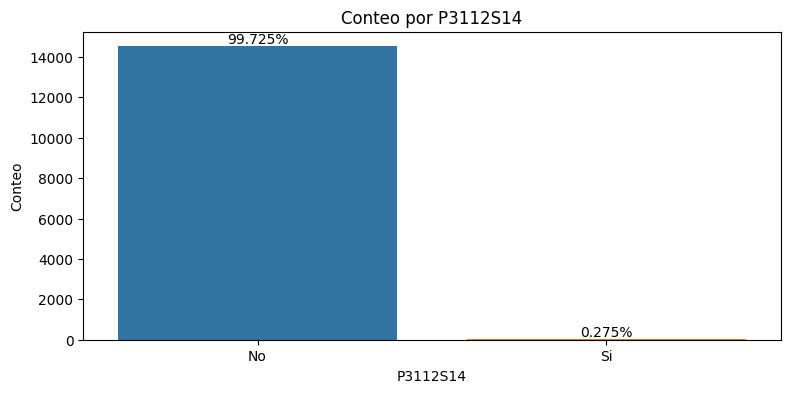

count     14562
unique        2
top          No
freq      10503
Name: P564, dtype: object


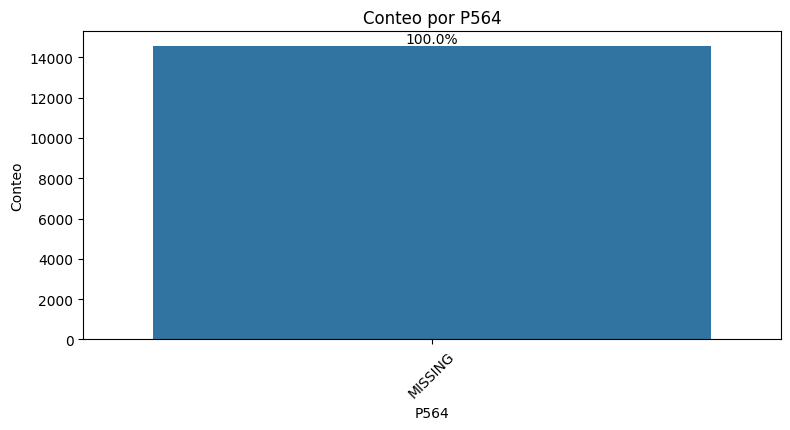

count     14562
unique        2
top          No
freq      13869
Name: P3109S1, dtype: object


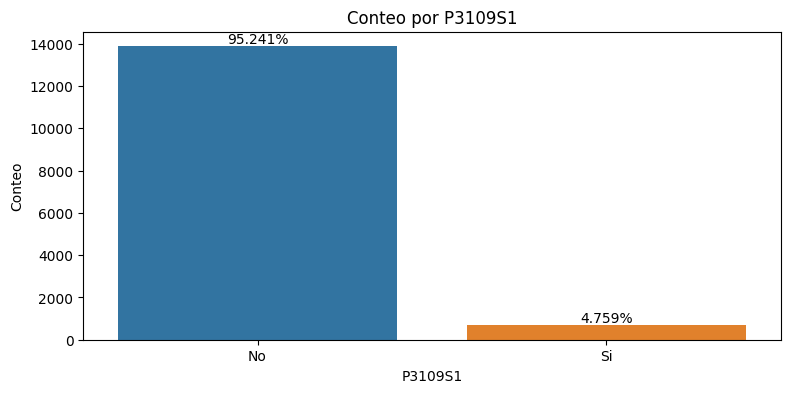

count     14562
unique        2
top          No
freq      10854
Name: P3109S2, dtype: object


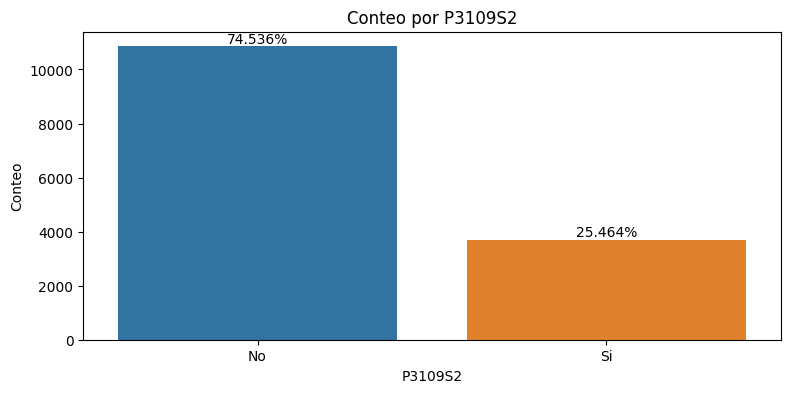

count     14562
unique        2
top          No
freq      13730
Name: P3109S3, dtype: object


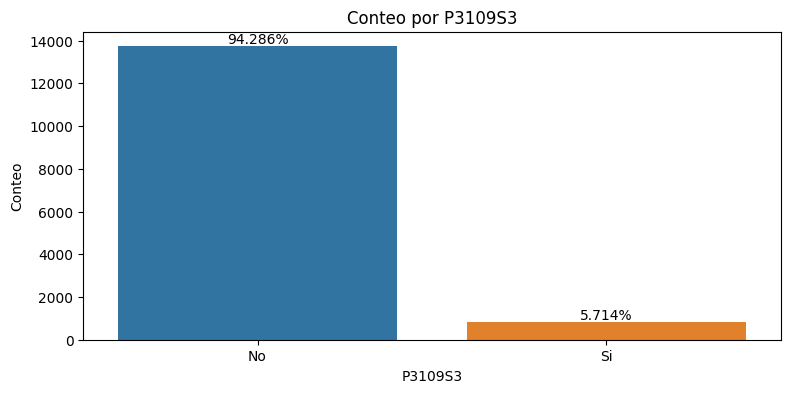

count     14562
unique        2
top          No
freq      14159
Name: P3109S4, dtype: object


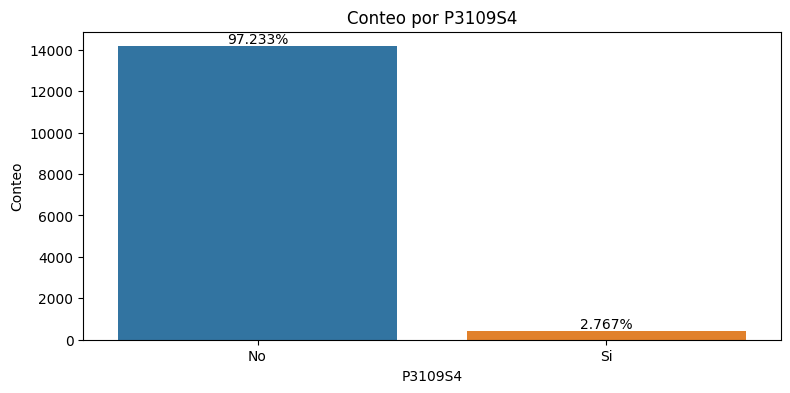

count     14562
unique        2
top          No
freq      14203
Name: P3109S5, dtype: object


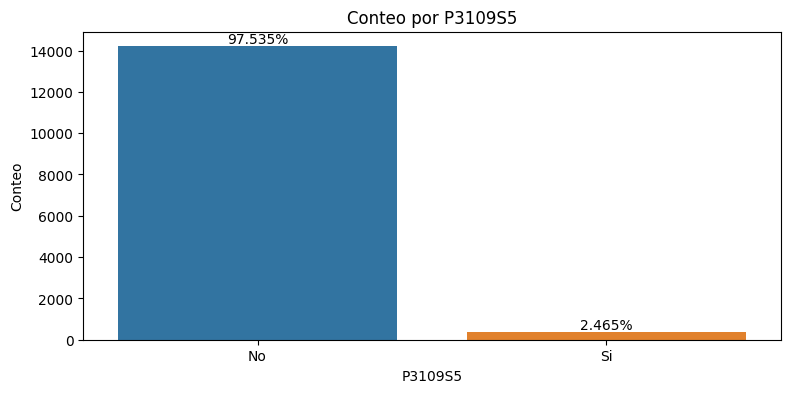

count     14562
unique        2
top          No
freq      14198
Name: P3109S6, dtype: object


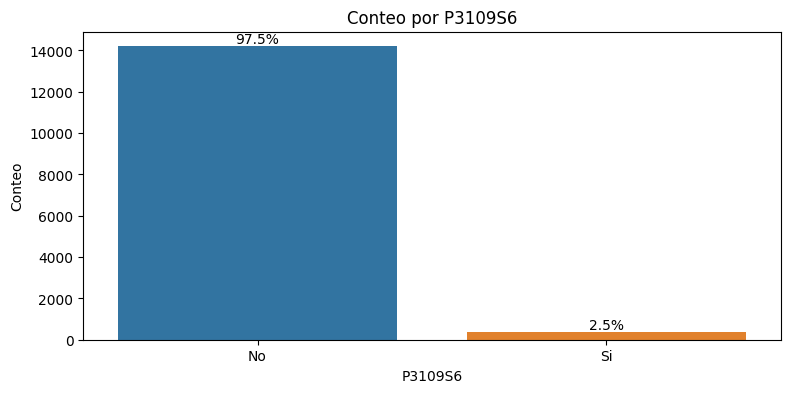

count     14562
unique        2
top          No
freq      14260
Name: P3109S7, dtype: object


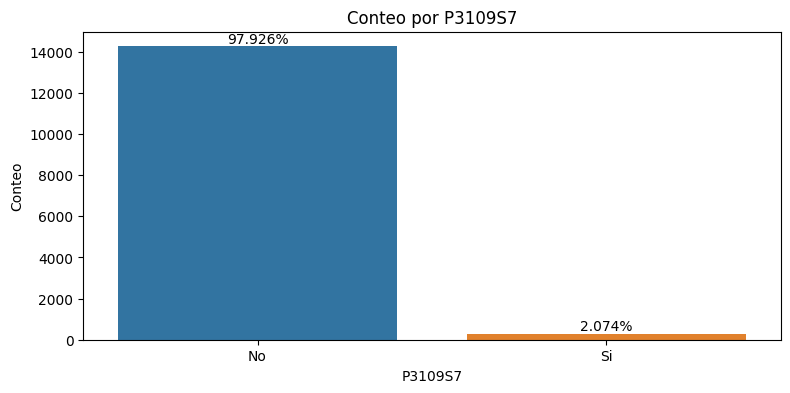

count     14562
unique        2
top          No
freq      14345
Name: P3109S16, dtype: object


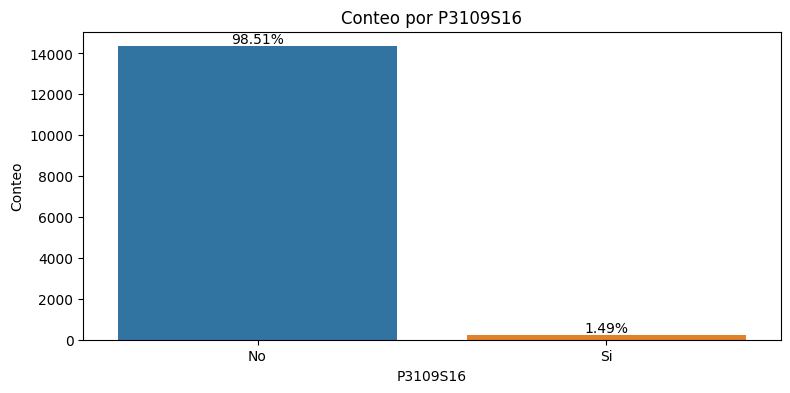

count     14562
unique        2
top          No
freq      14494
Name: P3109S17, dtype: object


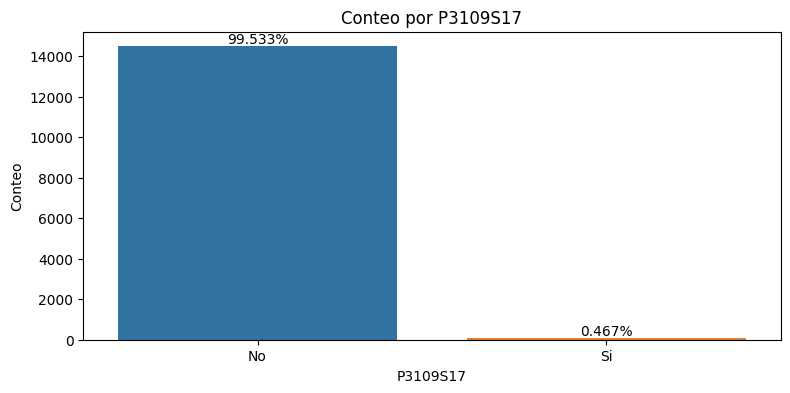

count     14562
unique        2
top          No
freq      14511
Name: P3109S9, dtype: object


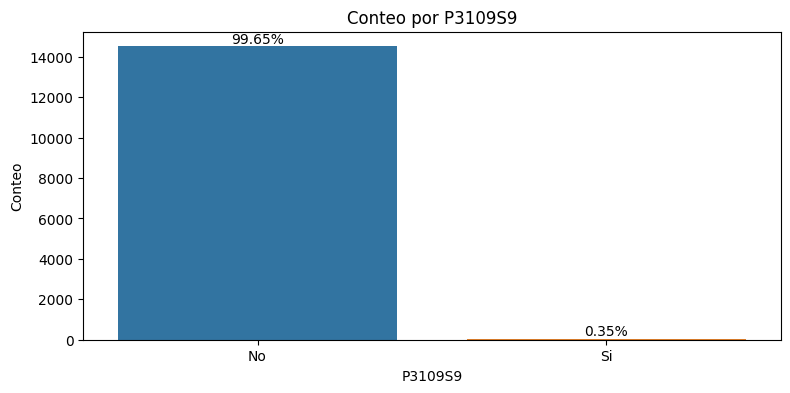

count     14562
unique        2
top          No
freq      14171
Name: P3109S10, dtype: object


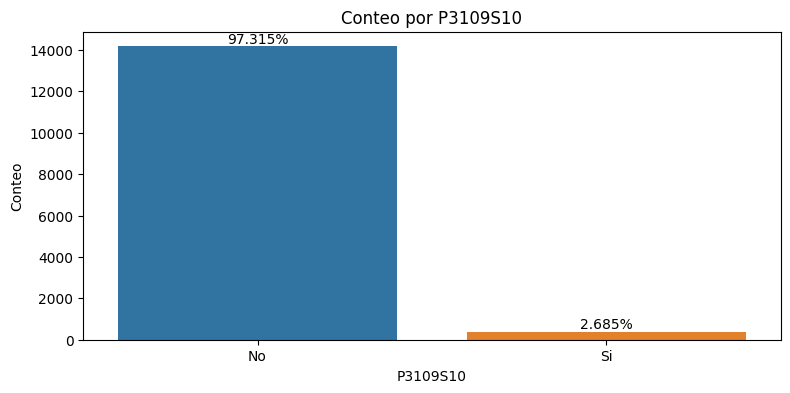

count     14562
unique        2
top          No
freq      14547
Name: P3109S11, dtype: object


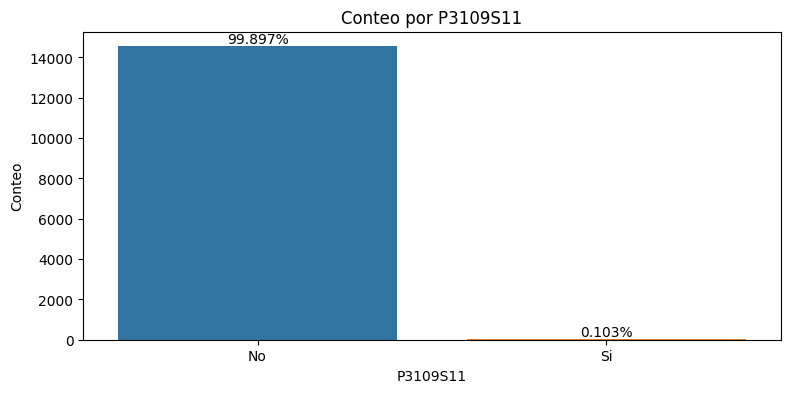

count     14562
unique        2
top          No
freq      14534
Name: P3109S12, dtype: object


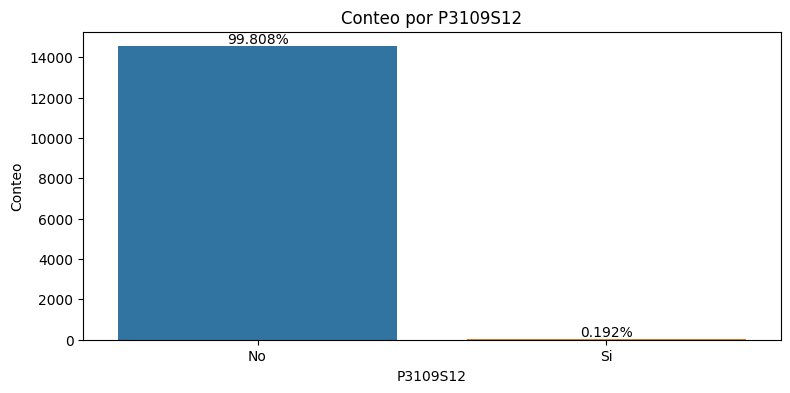

count     14562
unique        2
top          No
freq      14535
Name: P3109S13, dtype: object


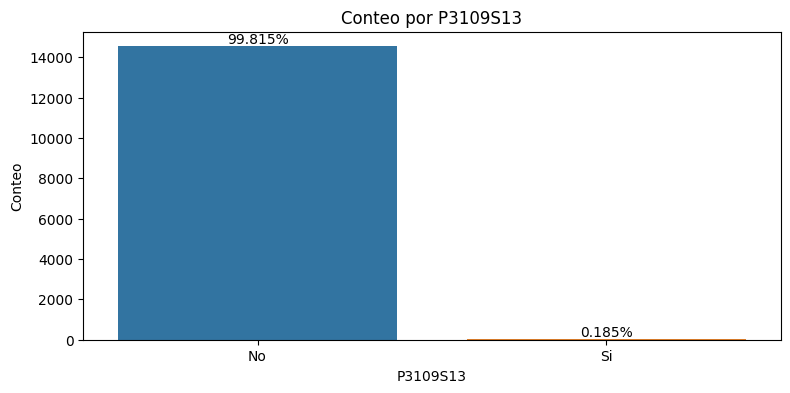

count     14562
unique        2
top          No
freq      14328
Name: P3109S18, dtype: object


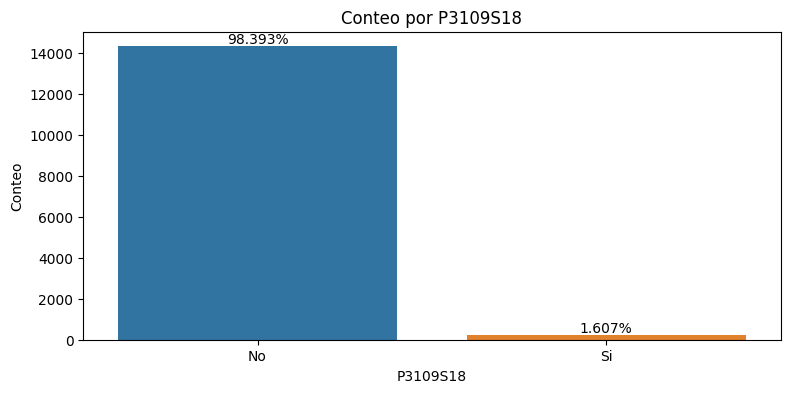

count     14562
unique        2
top          No
freq      14556
Name: P3109S14, dtype: object


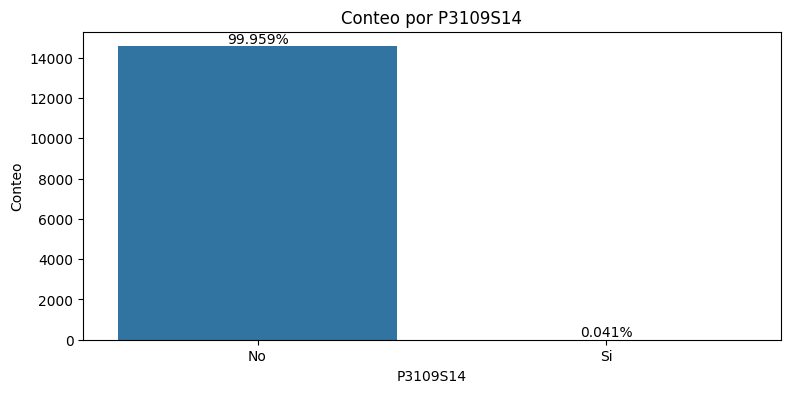

count     14562
unique        2
top          Si
freq       7609
Name: P1353S1, dtype: object


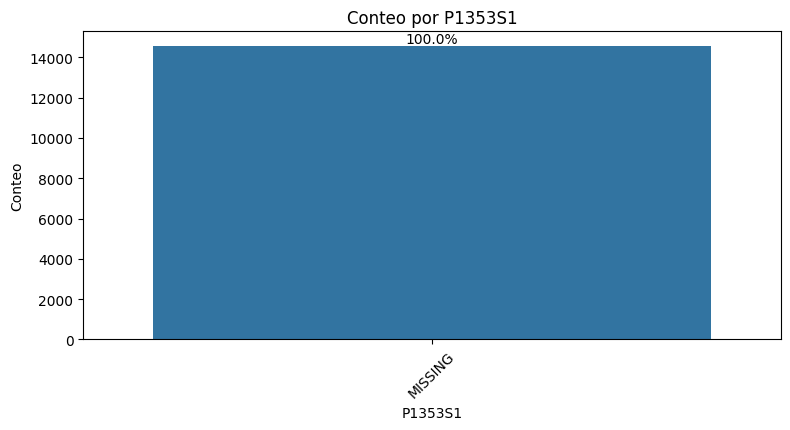

count     14562
unique        2
top          No
freq      12119
Name: P1353S2, dtype: object


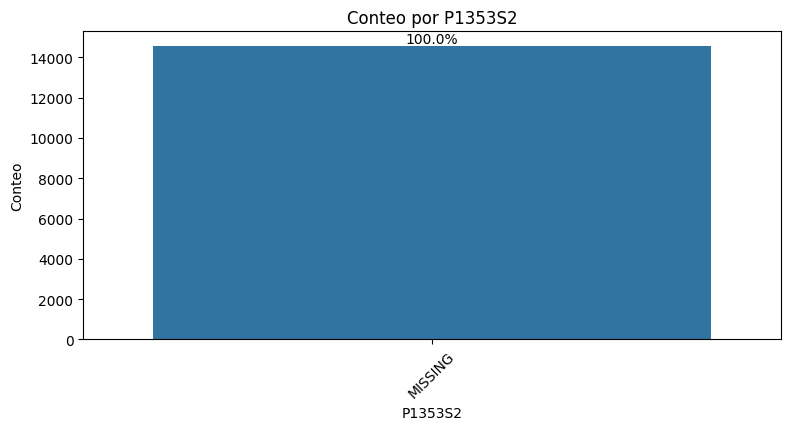

count     14562
unique        2
top          Si
freq       8513
Name: P1353S3, dtype: object


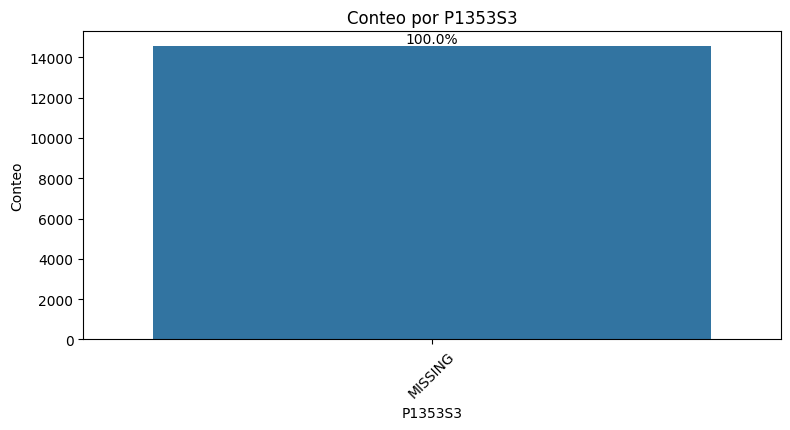

count     14562
unique        2
top          No
freq      14313
Name: P1353S4, dtype: object


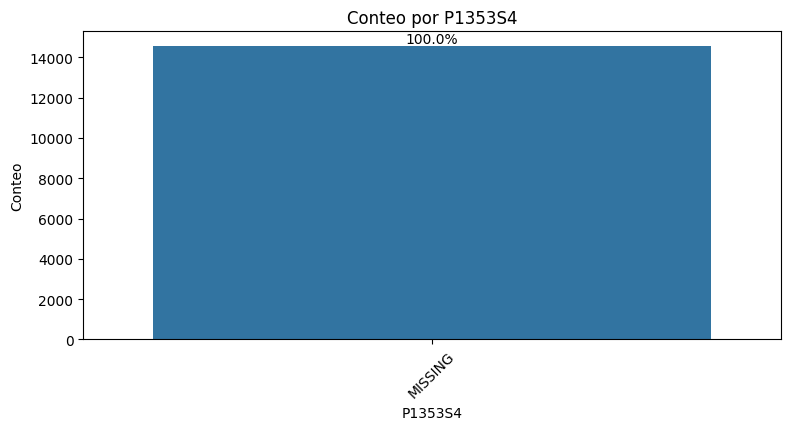

count     14562
unique        2
top          No
freq      13766
Name: P1353S5, dtype: object


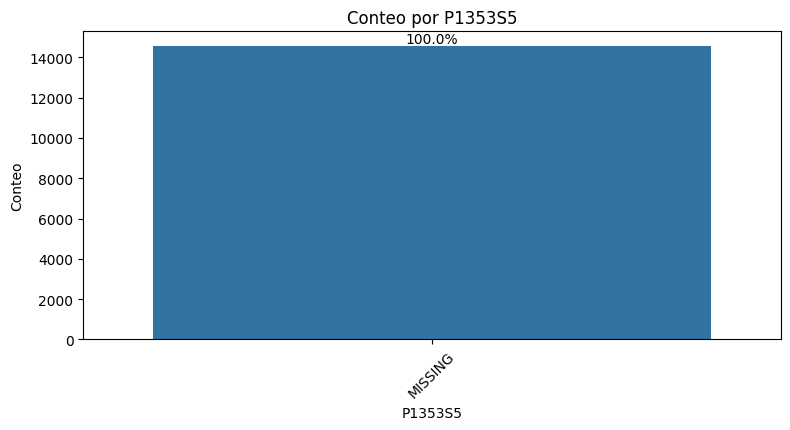

count     14562
unique        2
top          No
freq      11286
Name: P1353S6, dtype: object


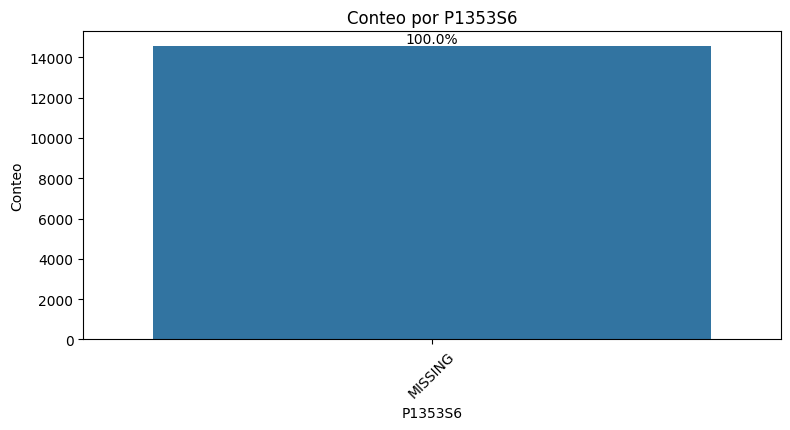

count     14562
unique        2
top          Si
freq       8465
Name: P3316S1, dtype: object


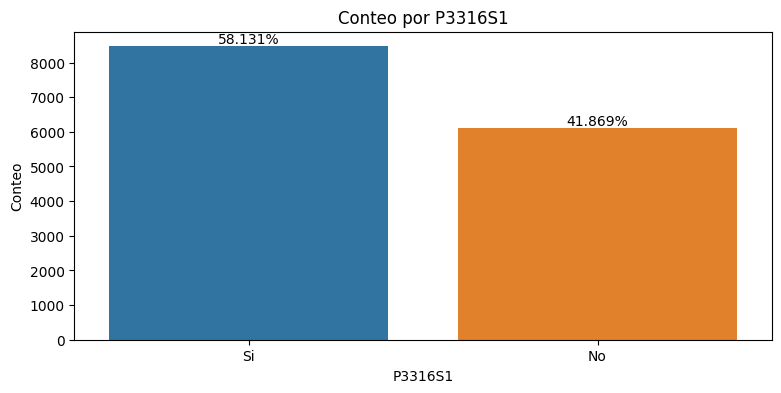

count     14562
unique        2
top          No
freq       9301
Name: P3316S2, dtype: object


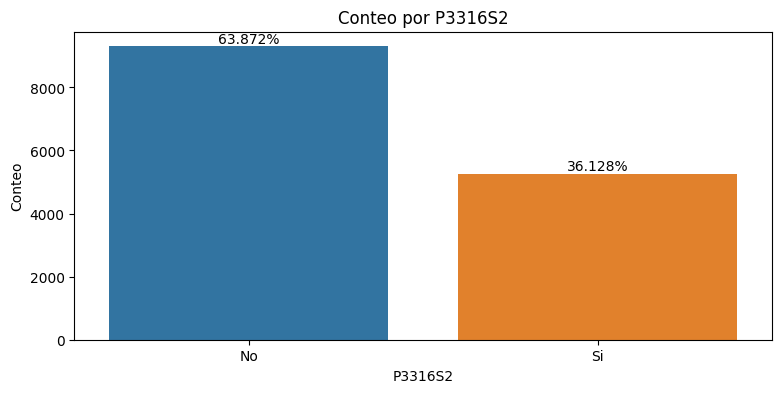

count     14562
unique        2
top          Si
freq       9802
Name: P3316S3, dtype: object


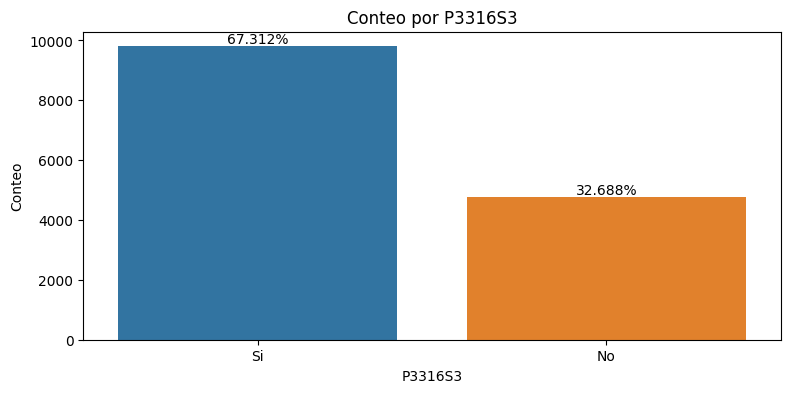

count     14562
unique        2
top          No
freq       9132
Name: P3316S4, dtype: object


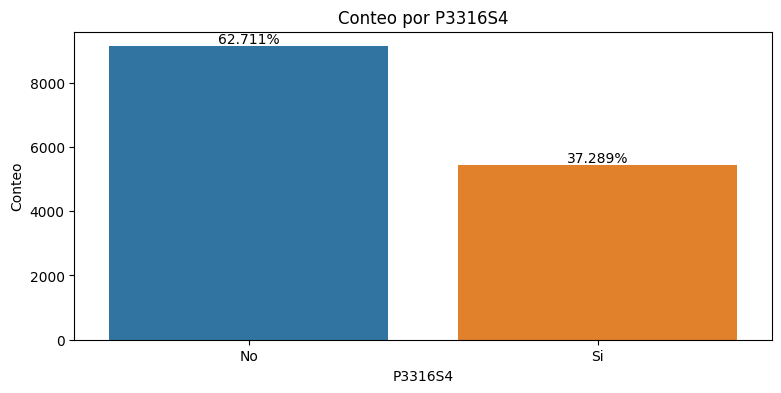

count     14562
unique        2
top          No
freq       8969
Name: P3316S5, dtype: object


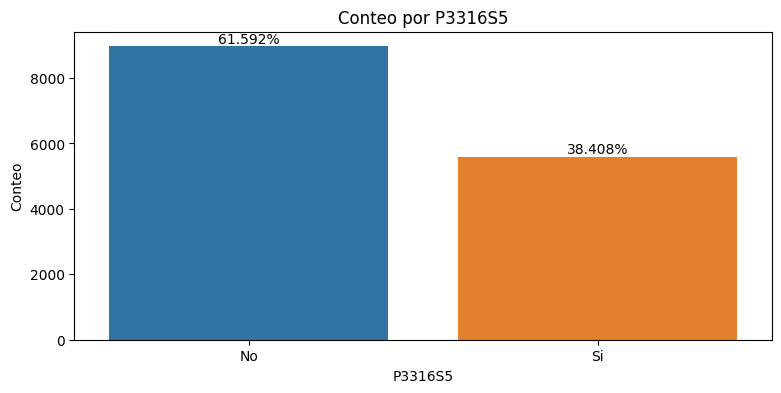

count     14562
unique        2
top          No
freq       9405
Name: P3316S6, dtype: object


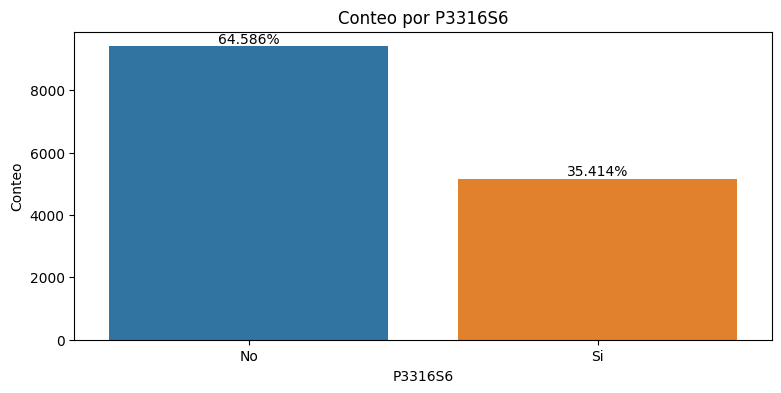

count     14562
unique        2
top          No
freq      10450
Name: P3316S7, dtype: object


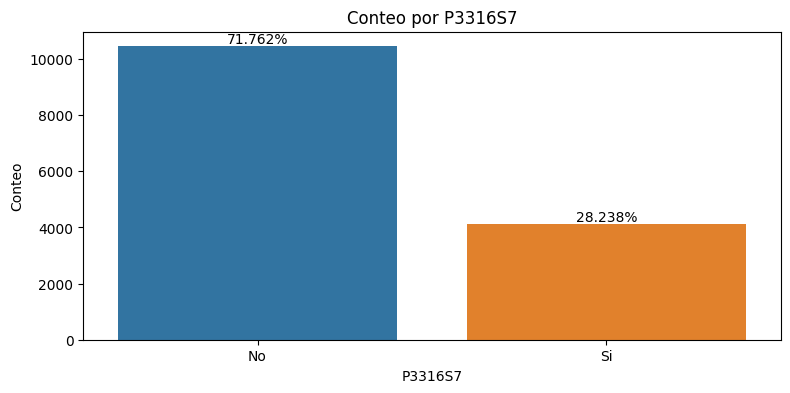

count     14562
unique        2
top          No
freq      10074
Name: P3316S8, dtype: object


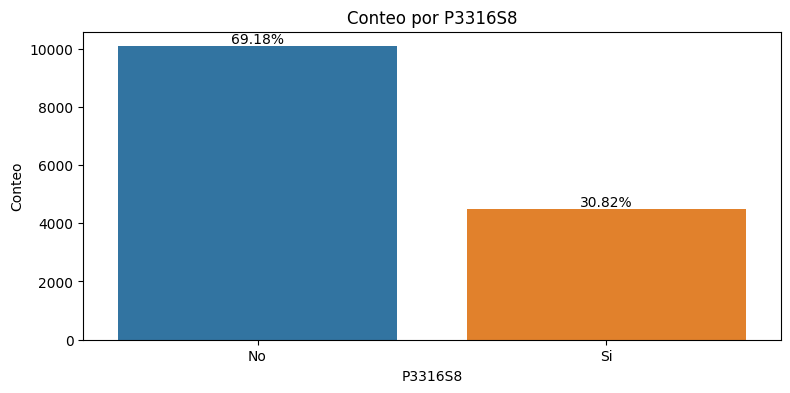

count     14562
unique        2
top          No
freq      11462
Name: P3316S9, dtype: object


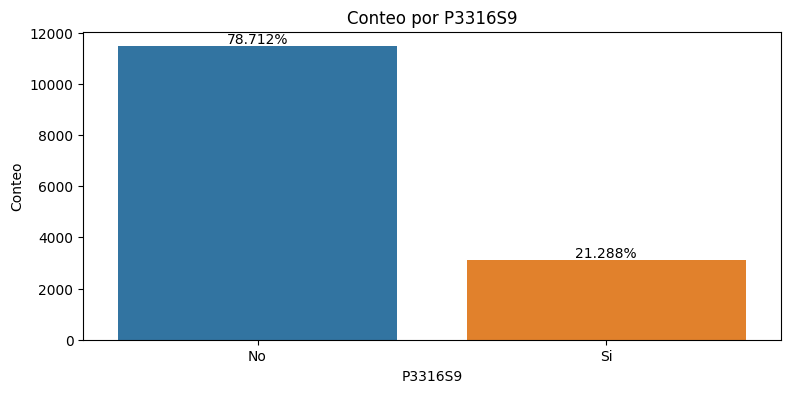

count     14562
unique        2
top          No
freq       9787
Name: P3316S10, dtype: object


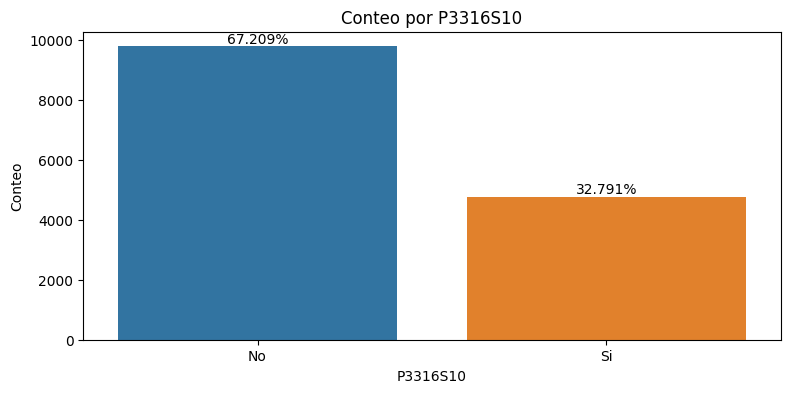

count     14562
unique        2
top          No
freq      11678
Name: P3316S11, dtype: object


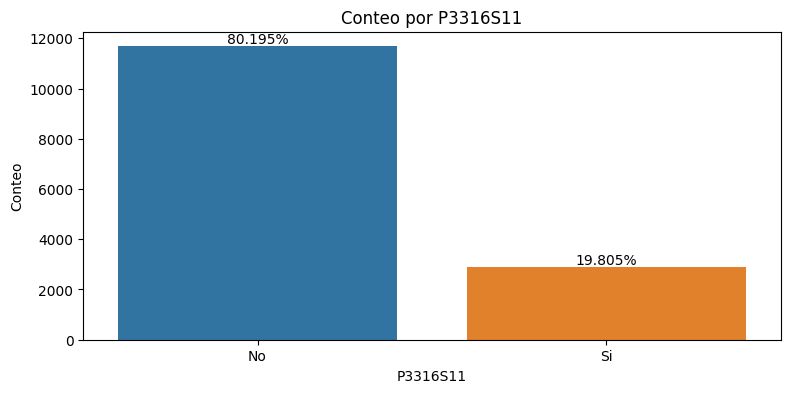

count     14562
unique        2
top          No
freq      12191
Name: P3316S12, dtype: object


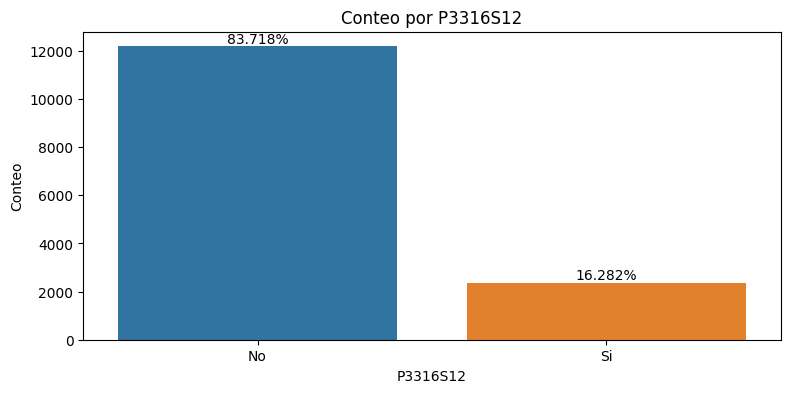

In [31]:
display(HTML(f"<h2>Análisis para grupo de variables categóricas</h2>"))
descriptivo_grupo(df_base,vars_naturaleza['vars_binarias'])

count     14562
unique        7
top         6.0
freq       5491
Name: P6210, dtype: object


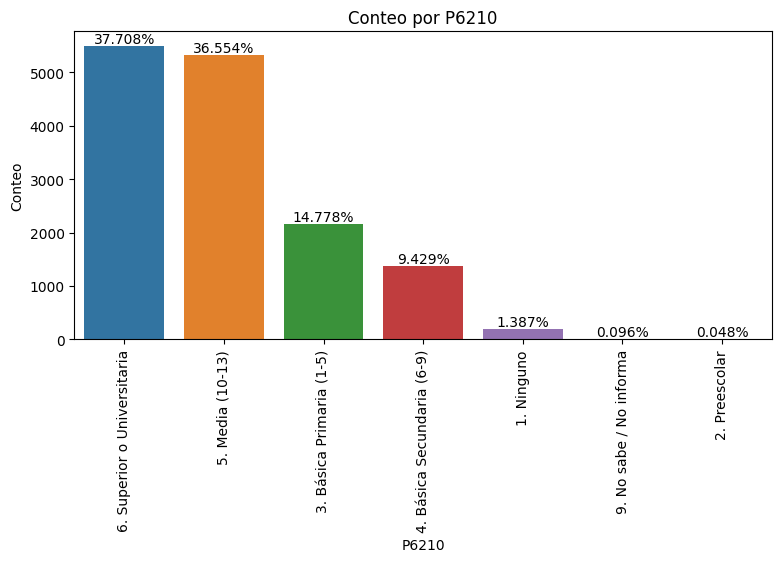

count    14562.000000
mean         3.951930
std          0.261584
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S1, dtype: float64


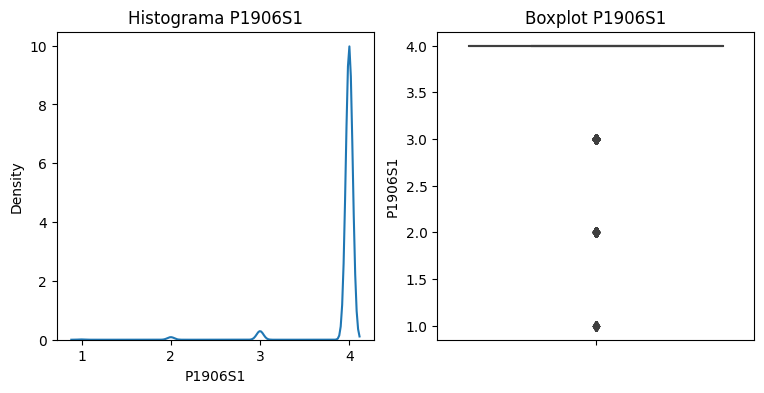

count    14562.000000
mean         3.971913
std          0.213144
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S2, dtype: float64


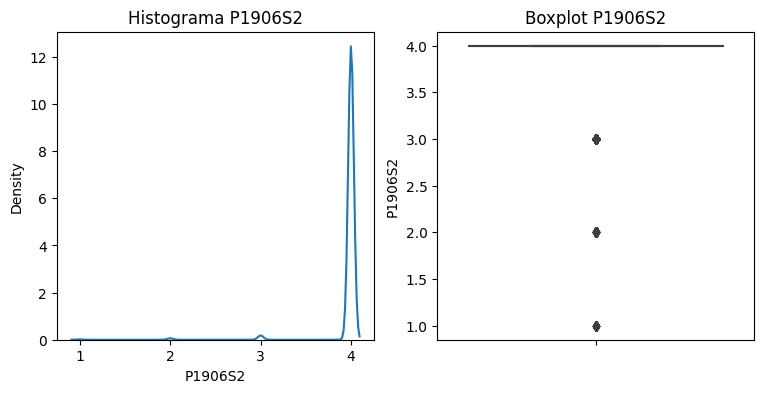

count    14562.000000
mean         3.798517
std          0.451694
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S3, dtype: float64


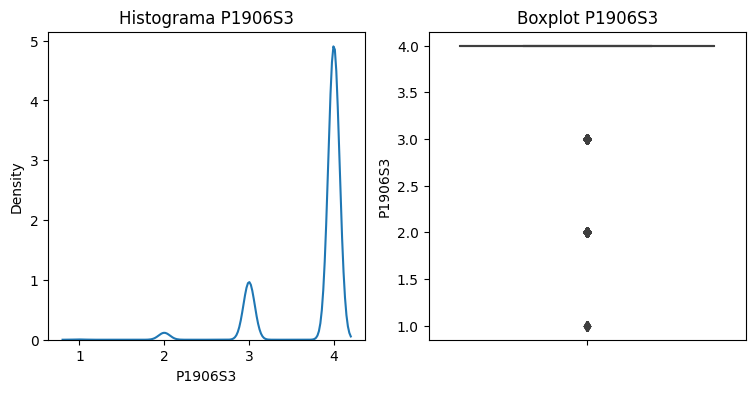

count    14562.000000
mean         3.904477
std          0.374128
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S4, dtype: float64


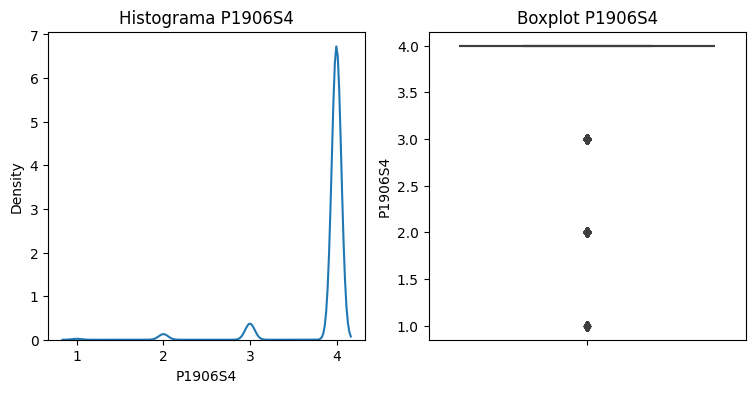

count    14562.000000
mean         3.954196
std          0.261071
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S5, dtype: float64


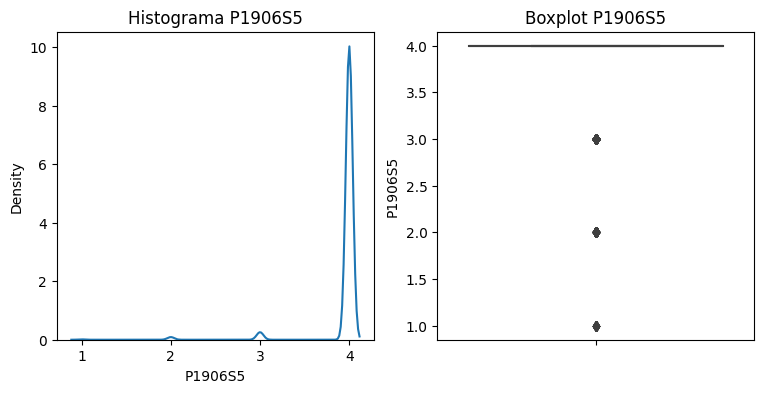

count    14562.000000
mean         3.967381
std          0.234323
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S6, dtype: float64


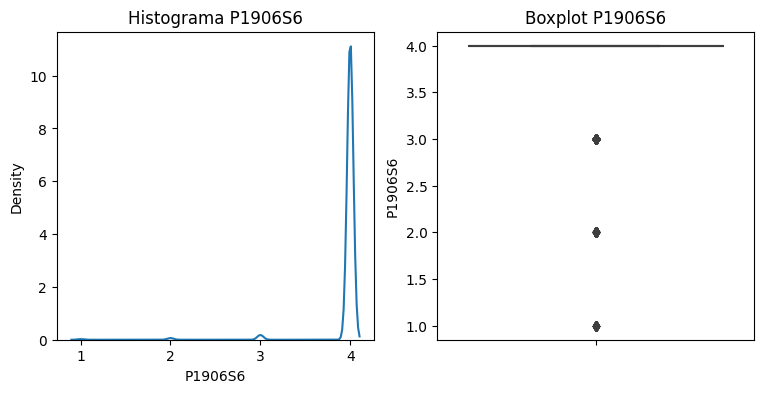

count    14562.000000
mean         3.967106
std          0.242070
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S7, dtype: float64


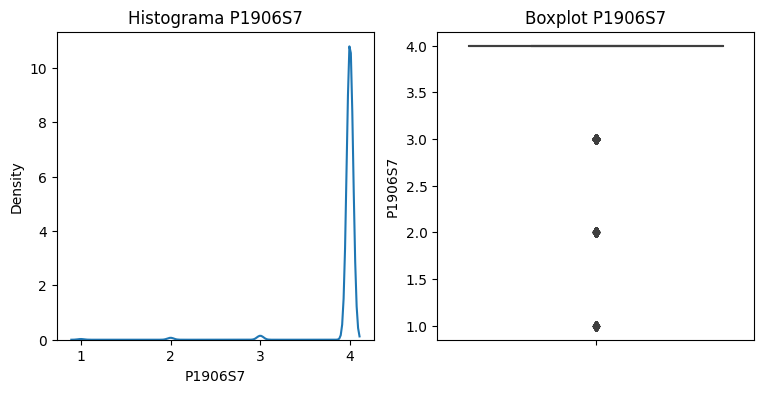

count    14562.000000
mean         3.977476
std          0.194459
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S8, dtype: float64


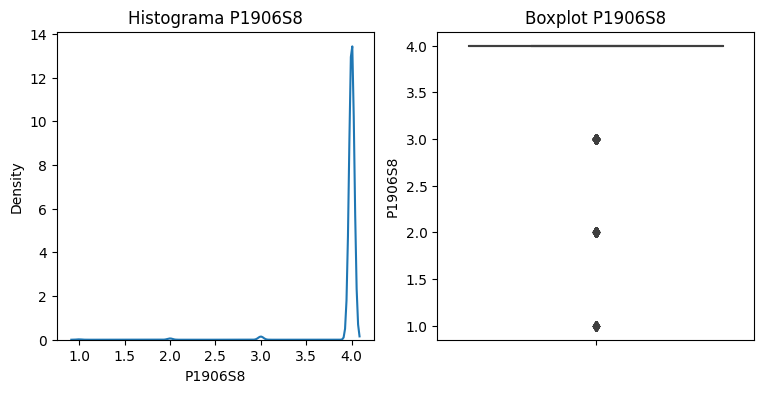

count    14562.000000
mean         3.956325
std          0.263659
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S9, dtype: float64


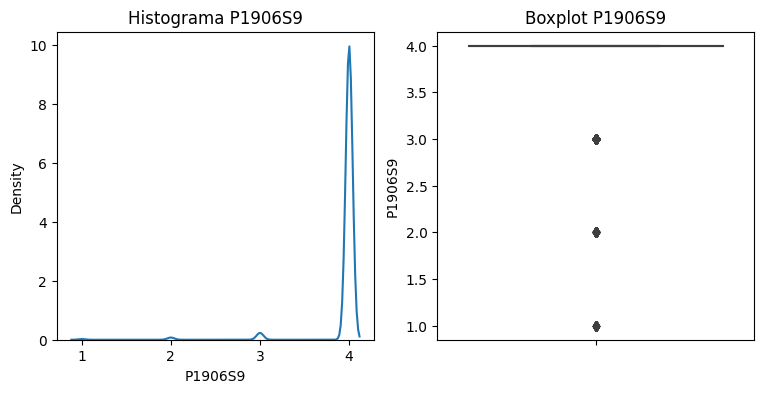

count     14562
unique        4
top         2.0
freq       9906
Name: P3105, dtype: object


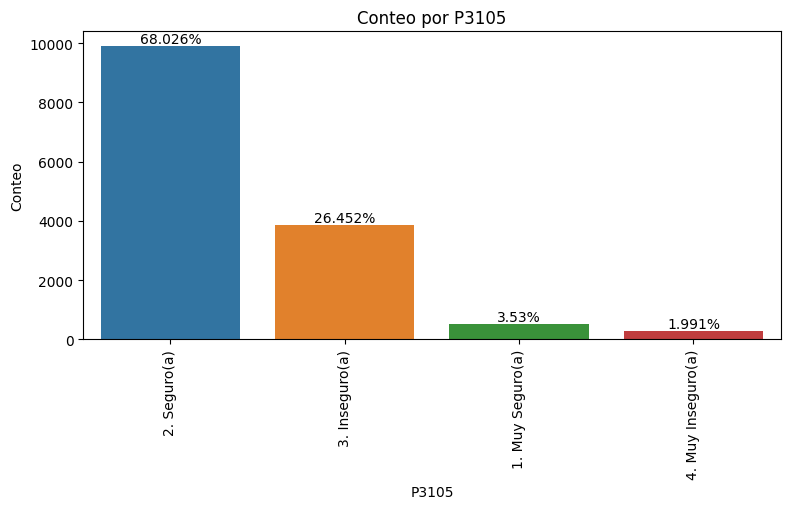

count     14562
unique        5
top         2.0
freq       6417
Name: P3106, dtype: object


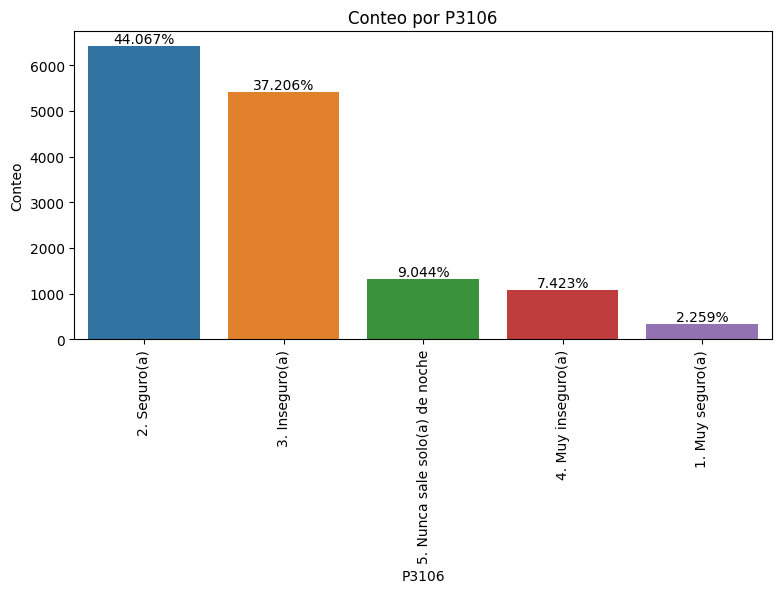

count     14562
unique        5
top         2.0
freq       9980
Name: P3502, dtype: object


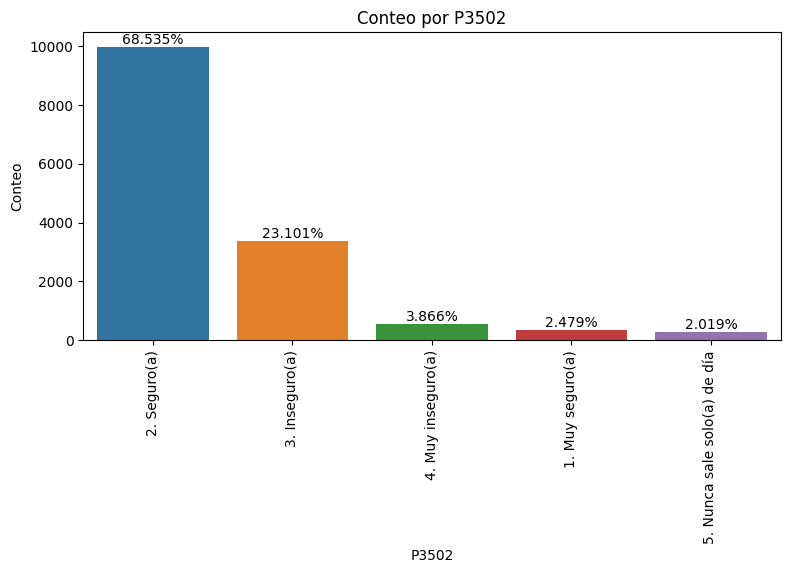

count     14562
unique        4
top         3.0
freq       8608
Name: P3107, dtype: object


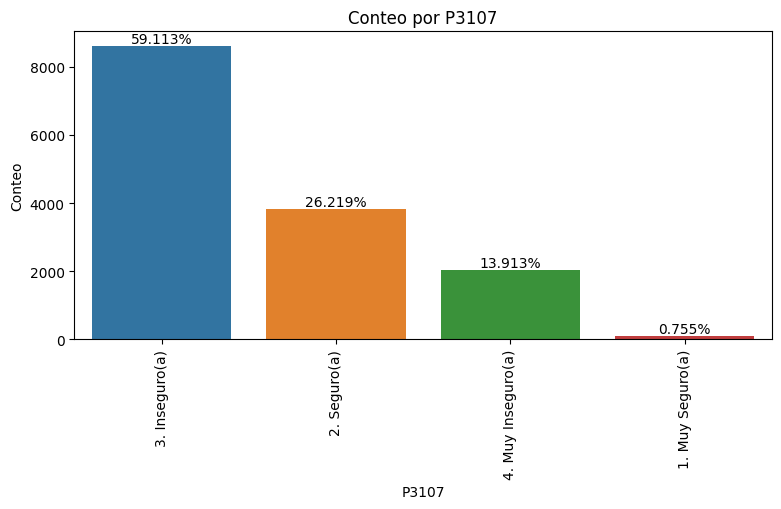

count    14562.000000
mean         2.172984
std          0.524992
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          4.000000
Name: P3111S1, dtype: float64


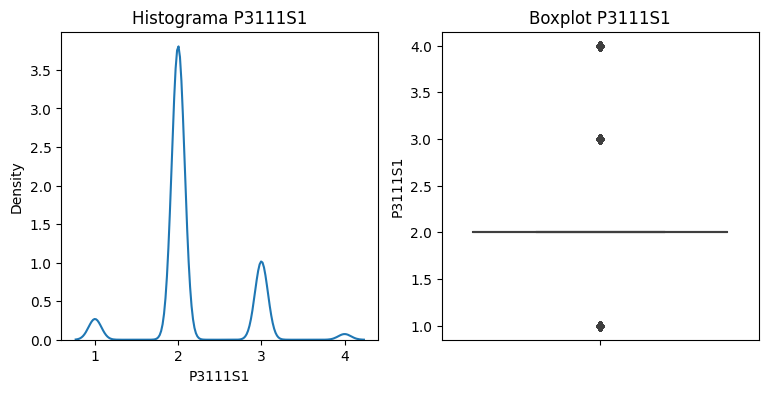

count    14562.000000
mean         2.920066
std          1.013709
min          1.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          5.000000
Name: P3111S2, dtype: float64


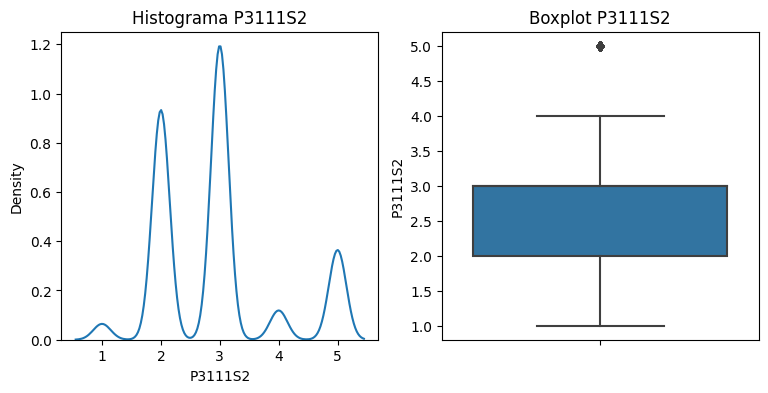

count    14562.000000
mean         2.854622
std          0.994913
min          1.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          5.000000
Name: P3111S3, dtype: float64


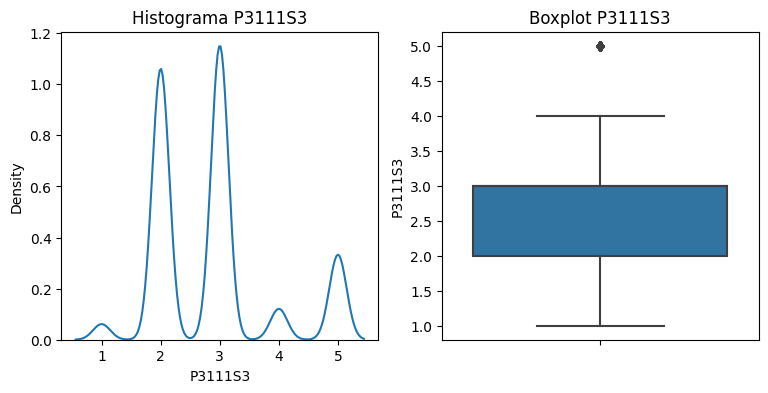

count    14562.000000
mean         3.257863
std          1.027295
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: P3111S4, dtype: float64


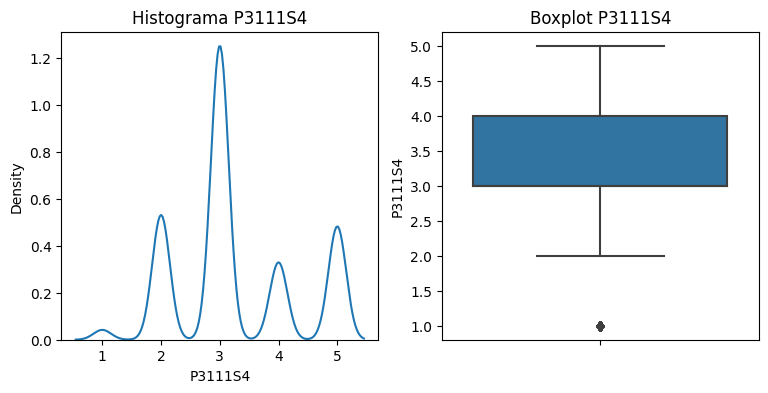

count    14562.000000
mean         3.602046
std          1.085294
min          1.000000
25%          3.000000
50%          3.000000
75%          5.000000
max          5.000000
Name: P3111S5, dtype: float64


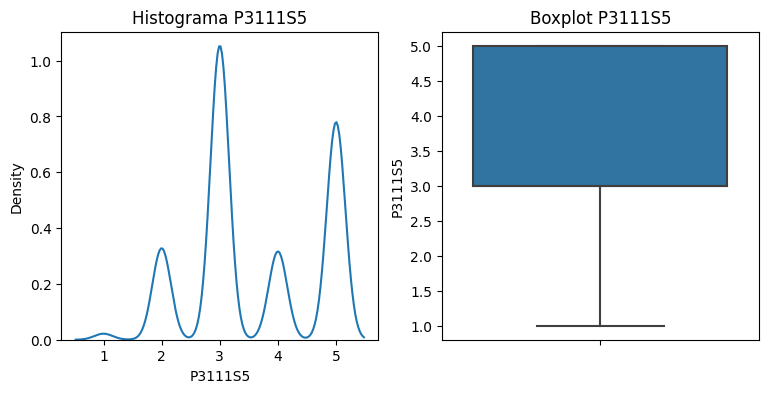

count    14562.000000
mean         2.784233
std          0.583879
min          1.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          4.000000
Name: P3111S6, dtype: float64


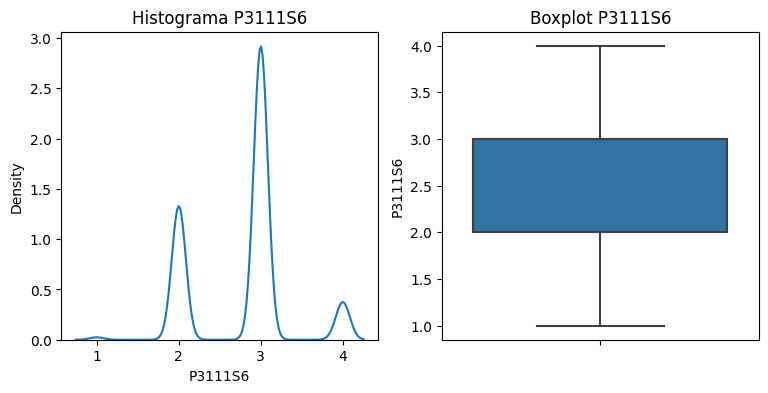

count    14562.000000
mean         3.457561
std          0.983284
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: P3111S8, dtype: float64


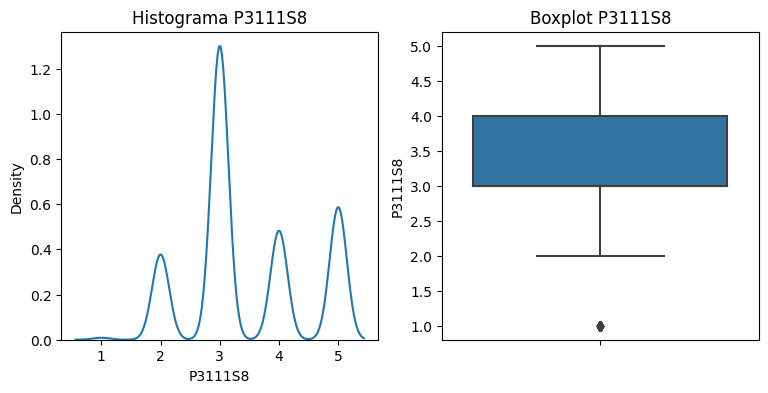

count    14562.000000
mean         3.777640
std          1.246876
min          1.000000
25%          3.000000
50%          4.000000
75%          5.000000
max          5.000000
Name: P3111S9, dtype: float64


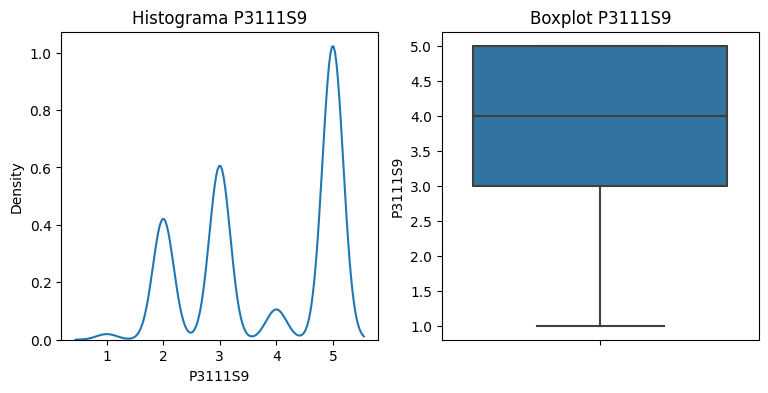

count                              14562
unique                                 4
top       Consumo de drogas o sustancias
freq                                6593
Name: P3108, dtype: object


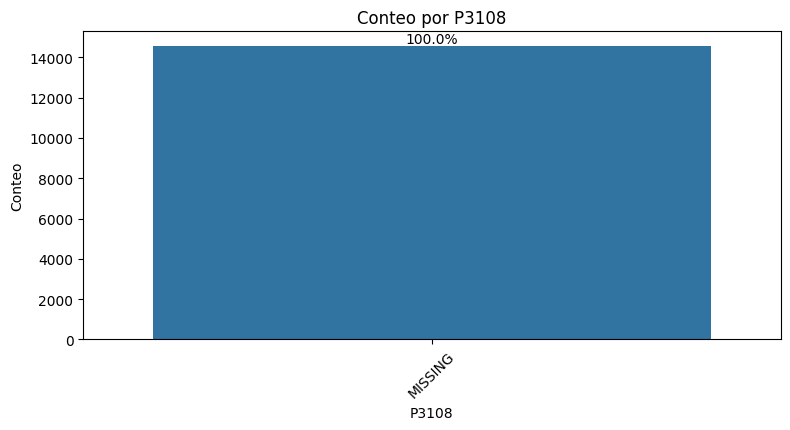

count    14562.000000
mean         1.180195
std          0.856313
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max          2.000000
Name: P3113S1, dtype: float64


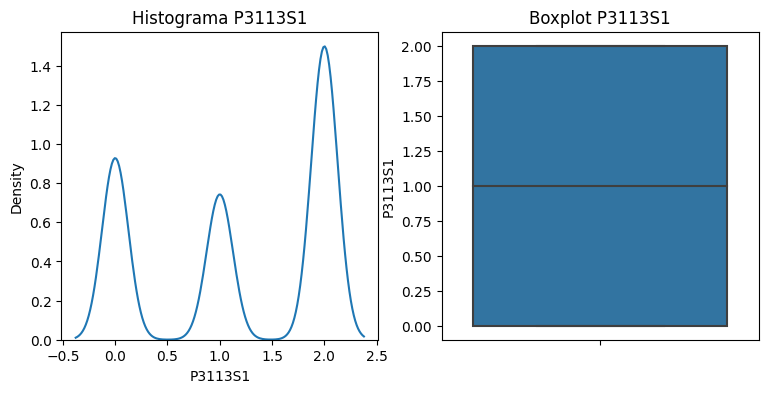

count    14562.000000
mean         0.807375
std          0.923883
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S3, dtype: float64


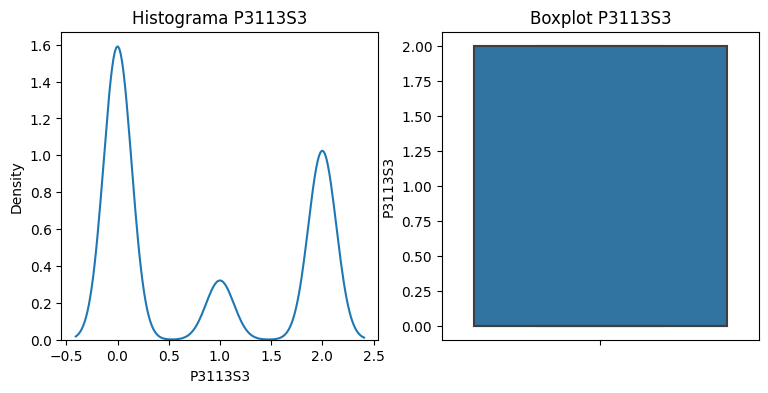

count    14562.000000
mean         1.108296
std          0.903496
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max          2.000000
Name: P3113S4, dtype: float64


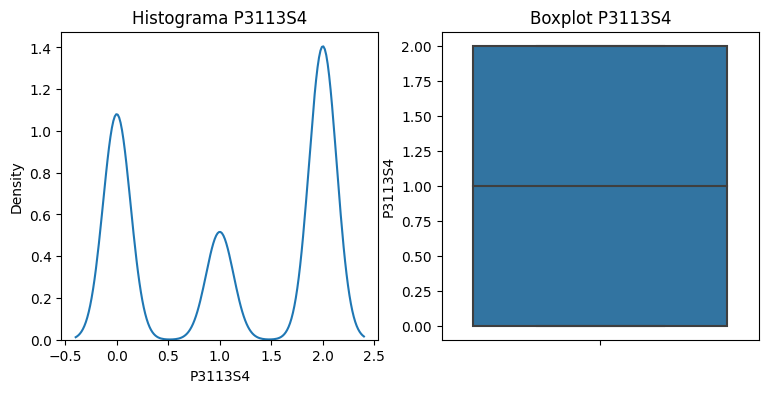

count    14562.000000
mean         0.293435
std          0.651432
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: P3113S5, dtype: float64


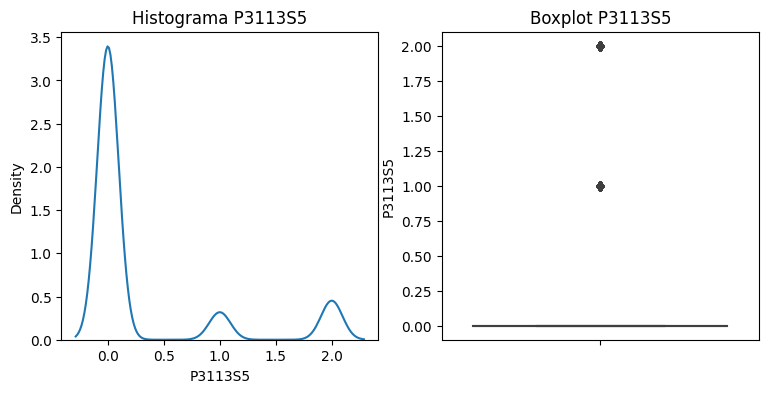

count    14562.000000
mean         0.181706
std          0.520654
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: P3113S6, dtype: float64


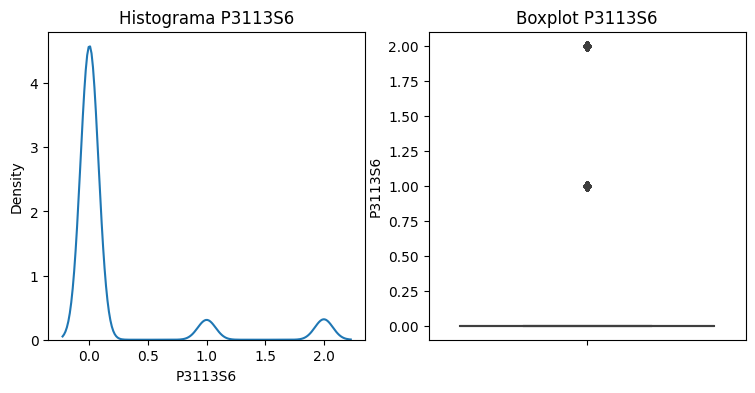

count    14562.000000
mean         0.316921
std          0.679060
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: P3113S7, dtype: float64


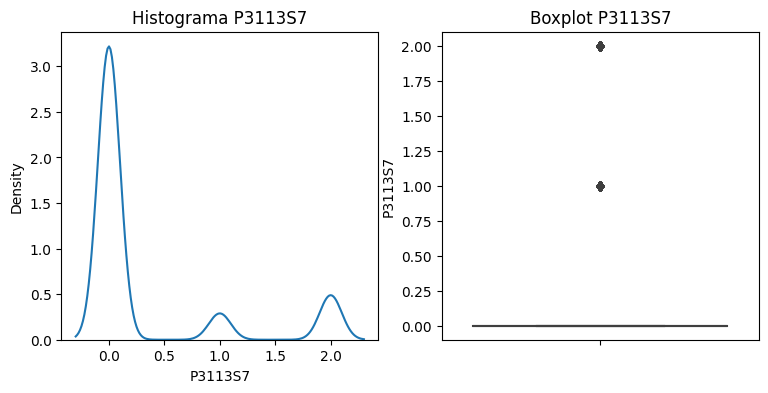

count    14562.000000
mean         0.720368
std          0.879270
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S8, dtype: float64


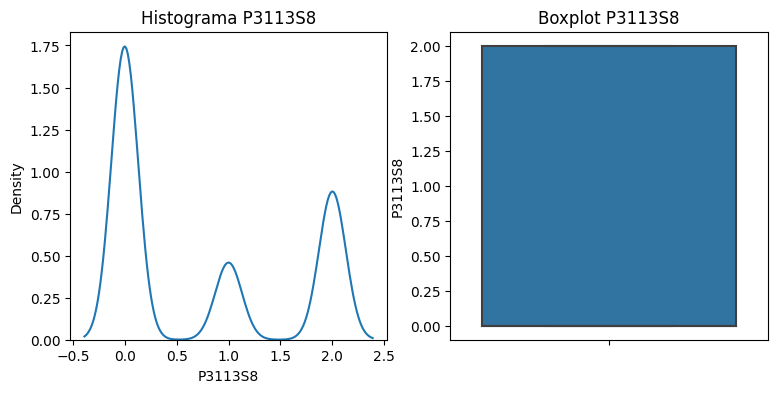

count    14562.000000
mean         0.612965
std          0.860453
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S9, dtype: float64


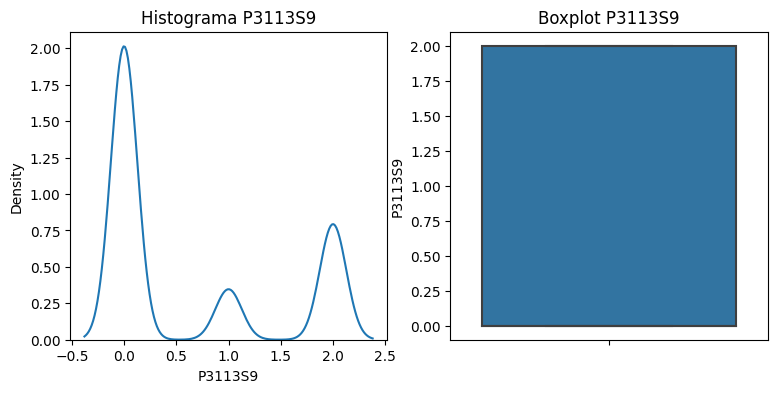

count    14562.000000
mean         1.055075
std          0.955497
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max          2.000000
Name: P3113S10, dtype: float64


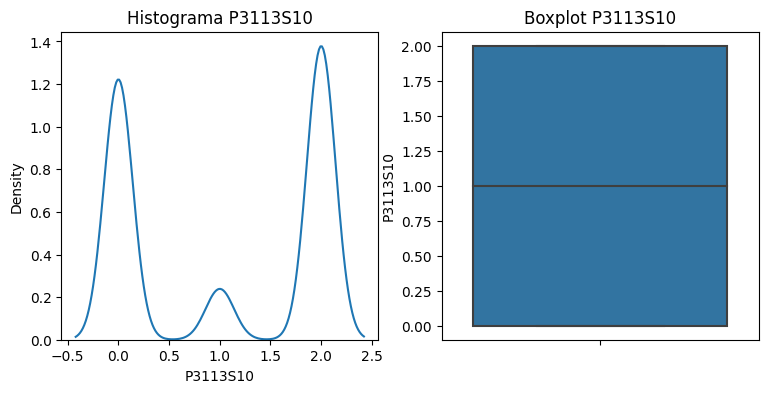

count    14562.000000
mean         0.794602
std          0.942210
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S20, dtype: float64


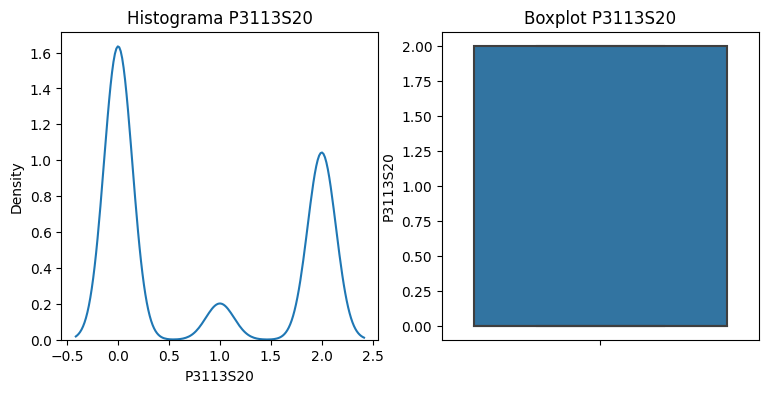

count    14562.000000
mean         0.582887
std          0.866014
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S21, dtype: float64


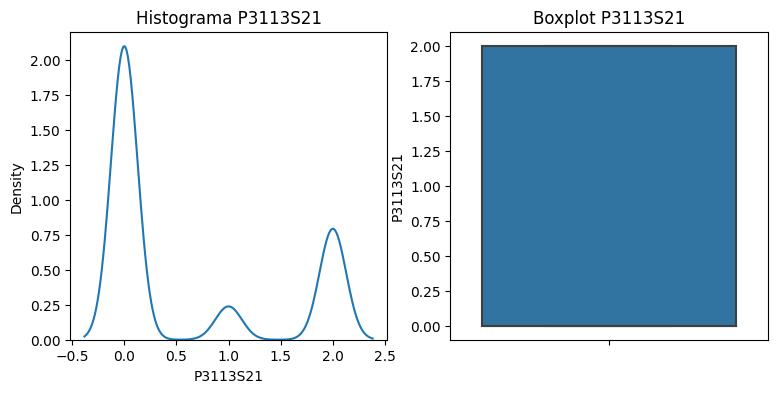

count    14562.000000
mean         0.702239
std          0.866507
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S22, dtype: float64


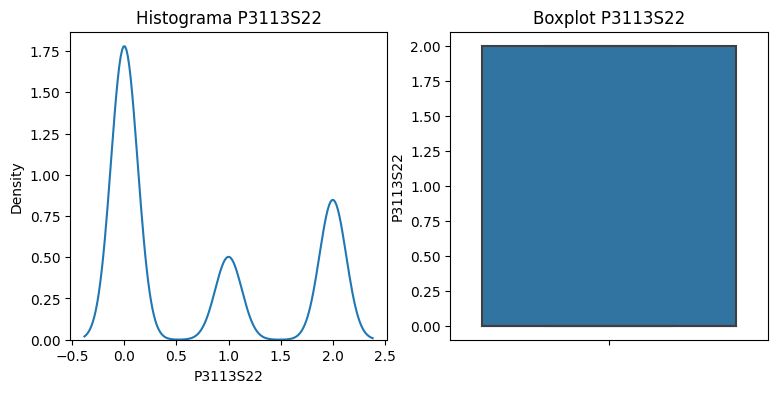

count    14562.000000
mean         1.250790
std          1.646329
min          0.000000
25%          0.000000
50%          0.000000
75%          3.000000
max          5.000000
Name: P1612S1, dtype: float64


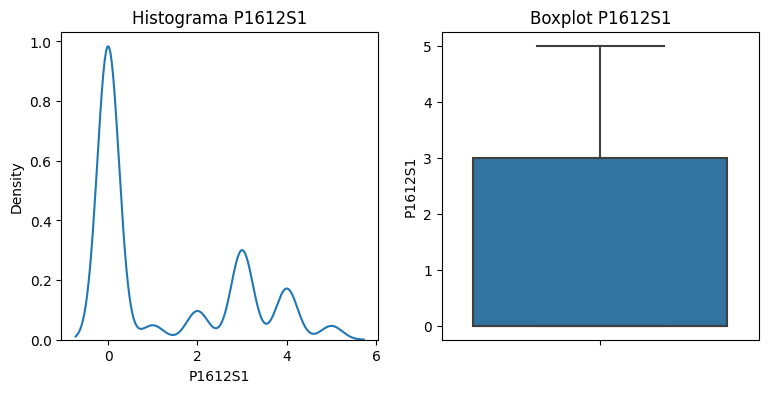

count    14562.000000
mean         1.851394
std          0.596928
min          1.000000
25%          1.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: P1182S1, dtype: float64


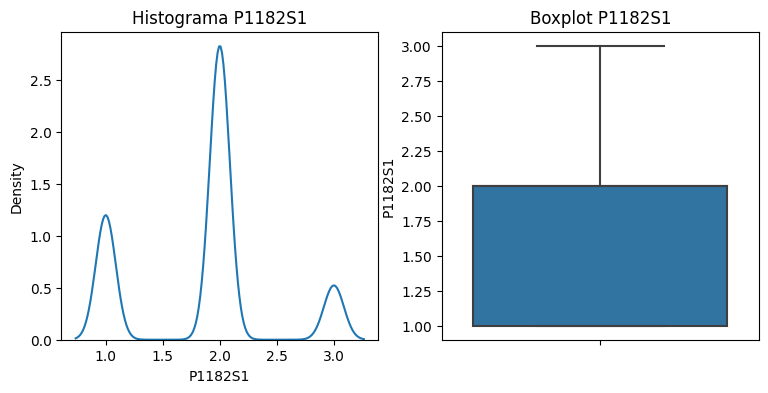

count    14562.000000
mean         1.949457
std          0.632369
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: P1182S2, dtype: float64


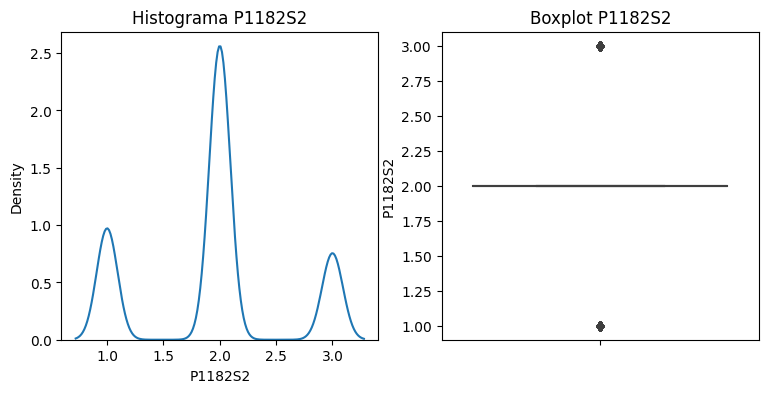

count    14562.000000
mean         2.125876
std          0.634075
min          1.000000
25%          2.000000
50%          2.000000
75%          3.000000
max          3.000000
Name: P1182S3, dtype: float64


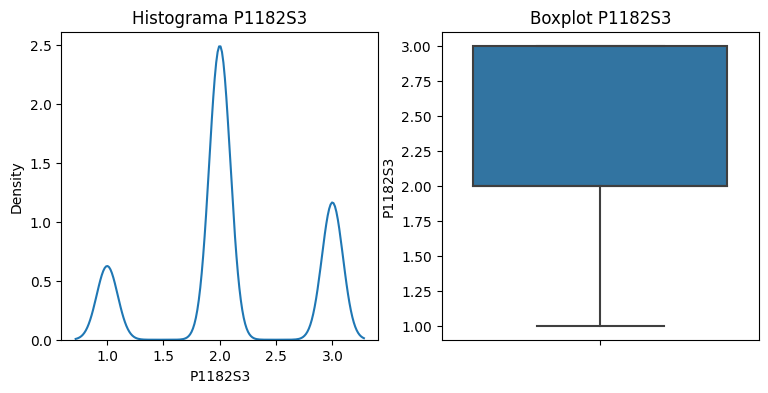

count    14562.000000
mean         2.141189
std          0.624441
min          1.000000
25%          2.000000
50%          2.000000
75%          3.000000
max          3.000000
Name: P1181S1, dtype: float64


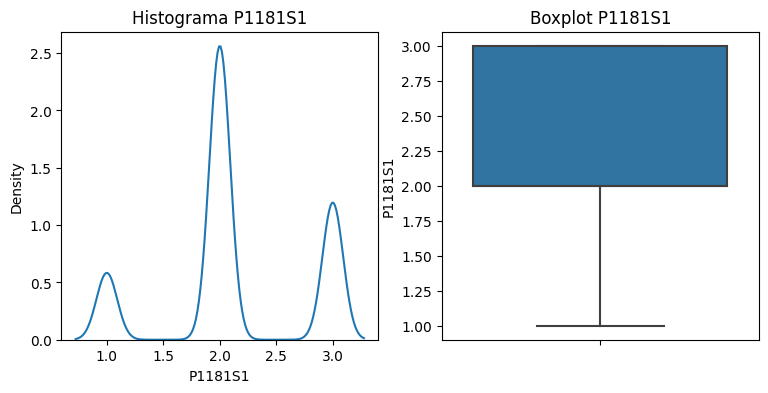

count    14562.000000
mean         2.228334
std          0.614355
min          1.000000
25%          2.000000
50%          2.000000
75%          3.000000
max          3.000000
Name: P1181S2, dtype: float64


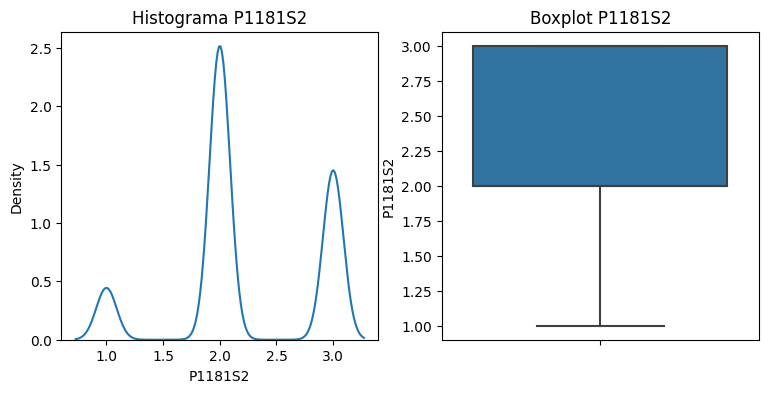

count    14562.000000
mean         2.000755
std          0.631075
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: P3317S1, dtype: float64


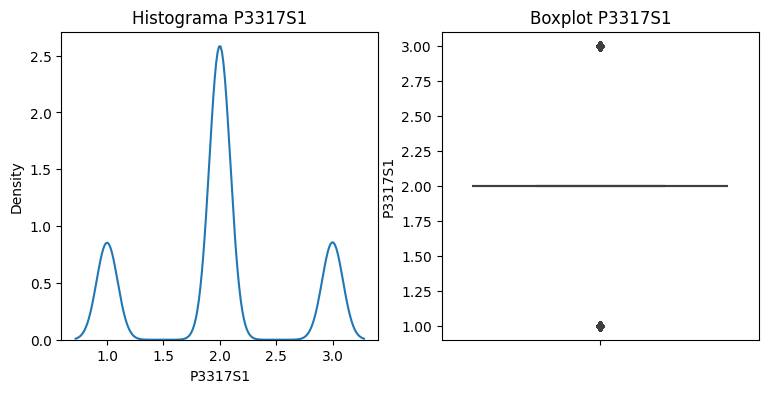

count    14562.000000
mean         2.054113
std          0.609730
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: P3317S2, dtype: float64


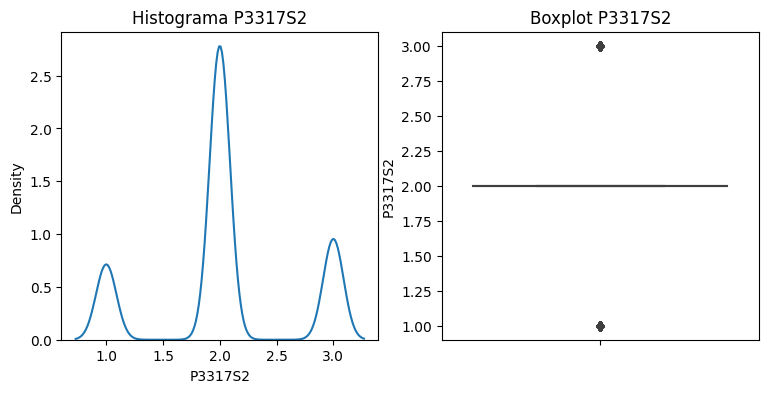

count    14562.000000
mean         2.083642
std          0.605025
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: P3317S3, dtype: float64


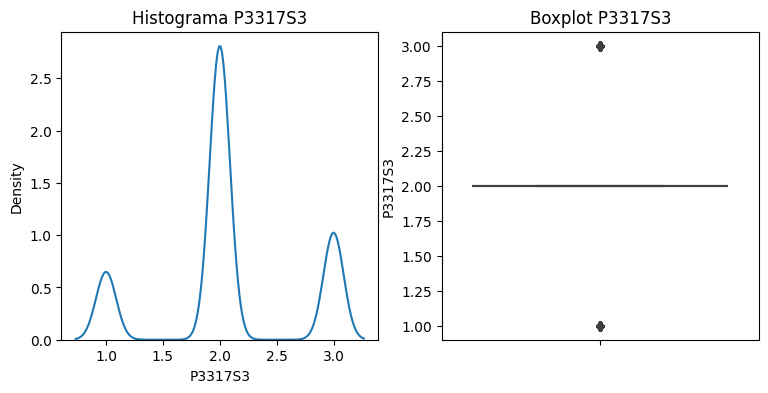

count    14562.000000
mean         3.008103
std          0.927383
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: P3321, dtype: float64


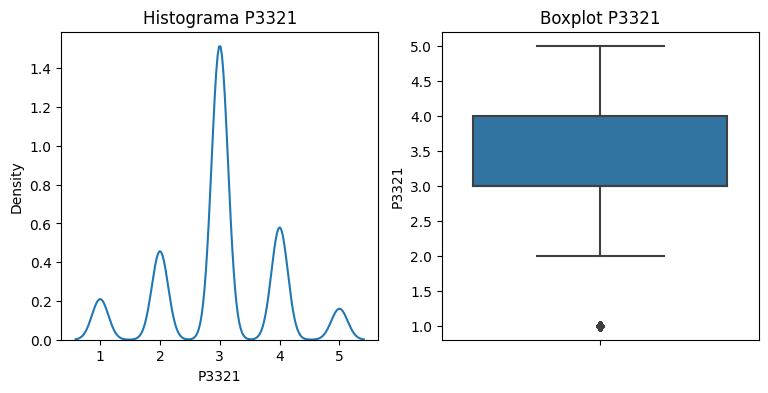

count    14562.000000
mean         2.963879
std          1.035826
min          1.000000
25%          2.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: P3119, dtype: float64


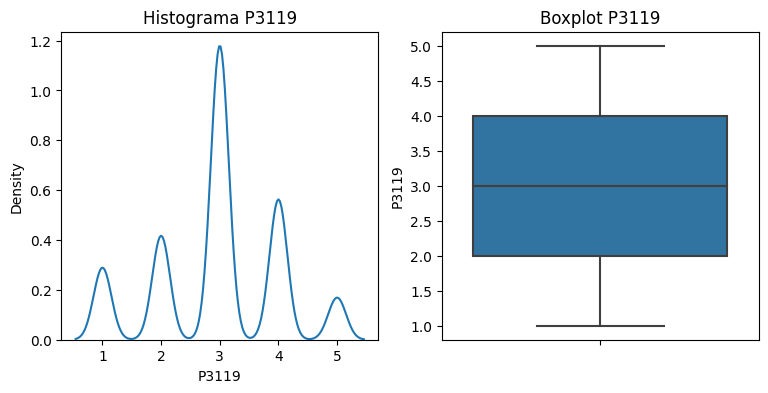

count    14562.000000
mean         2.964497
std          0.885392
min          1.000000
25%          3.000000
50%          3.000000
75%          3.000000
max          5.000000
Name: P3127, dtype: float64


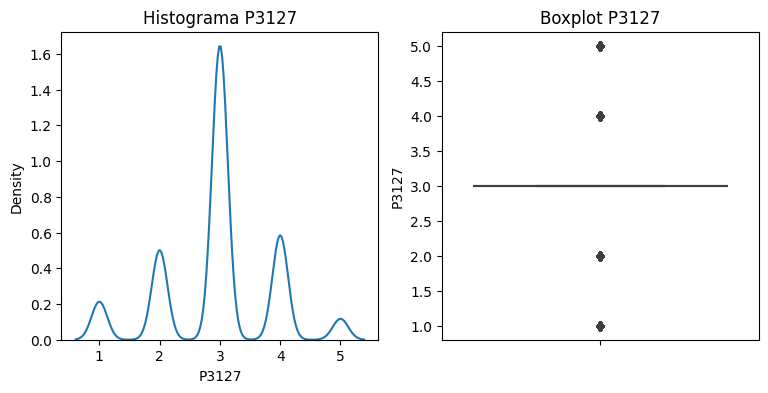

In [32]:
display(HTML(f"<h2>Análisis para grupo de variables Ordinales</h2>"))
descriptivo_grupo(df_base,vars_naturaleza['vars_ordinales'])

count      14562
unique         3
top       BOGOTA
freq        5114
Name: DEPMUNI, dtype: object


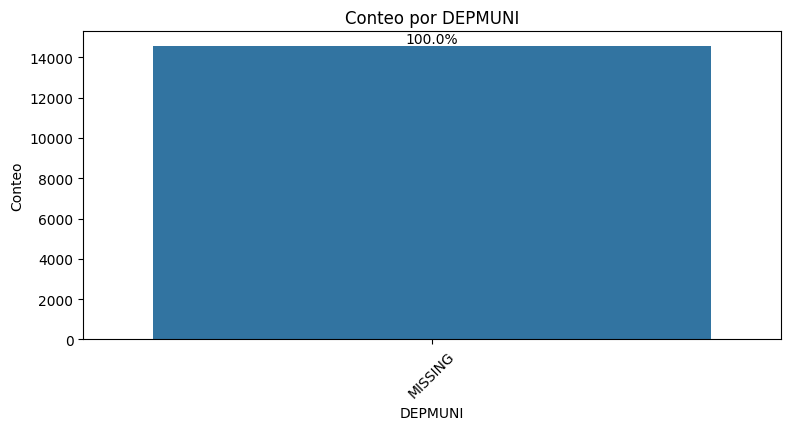

count           14562
unique              4
top       Apartamento
freq             9173
Name: P1987, dtype: object


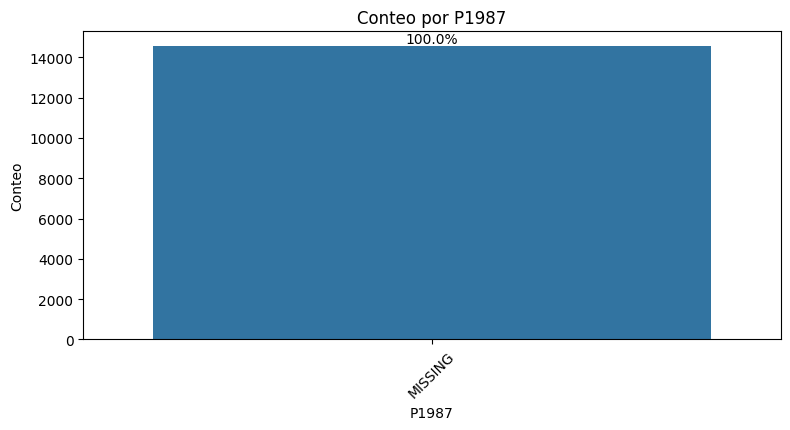

count      14562
unique         4
top       Propia
freq        7216
Name: P1989, dtype: object


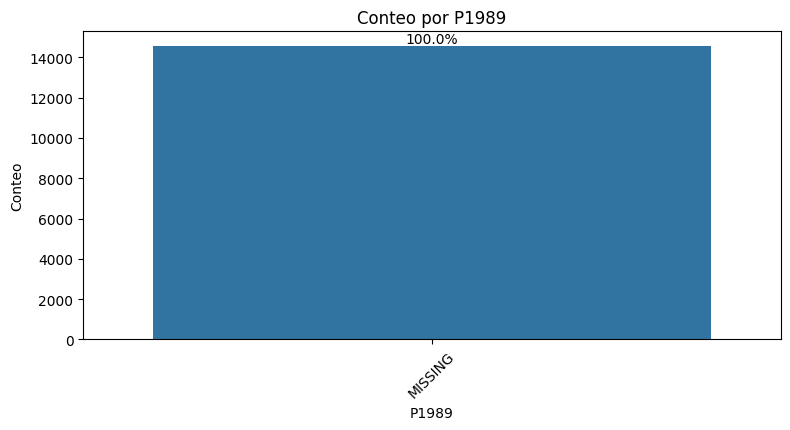

count               14562
unique                  6
top       Está soltero(a)
freq                 5416
Name: P1366, dtype: object


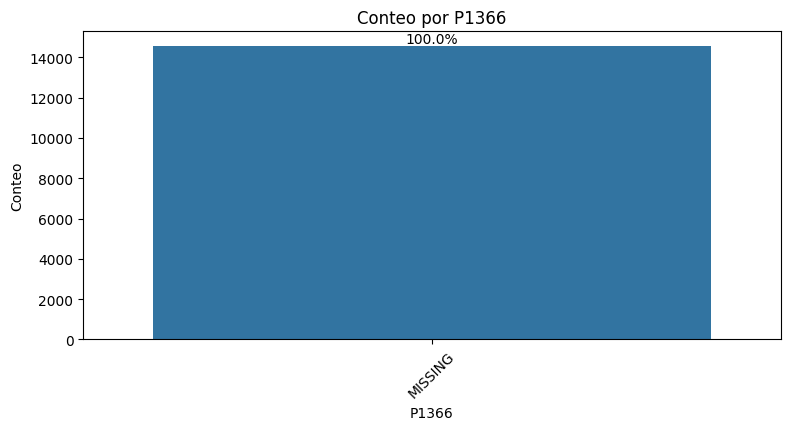

count            14562
unique               4
top       Pide auxilio
freq             10194
Name: P1115, dtype: object


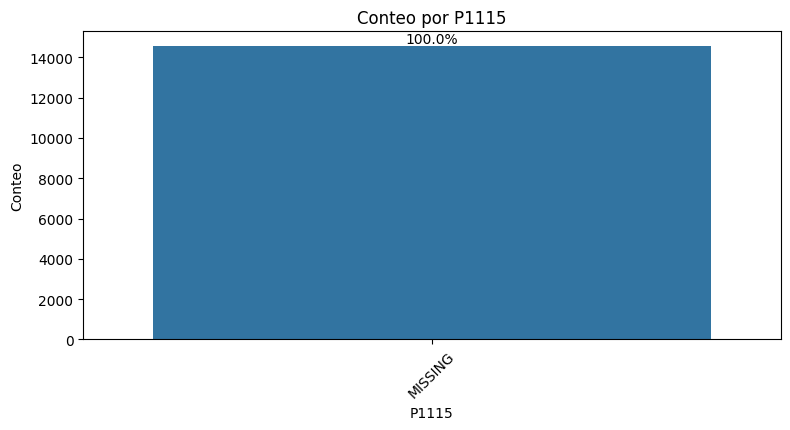

count                           14562
unique                              7
top       Falta oportunidades trabajo
freq                             5966
Name: P3114, dtype: object


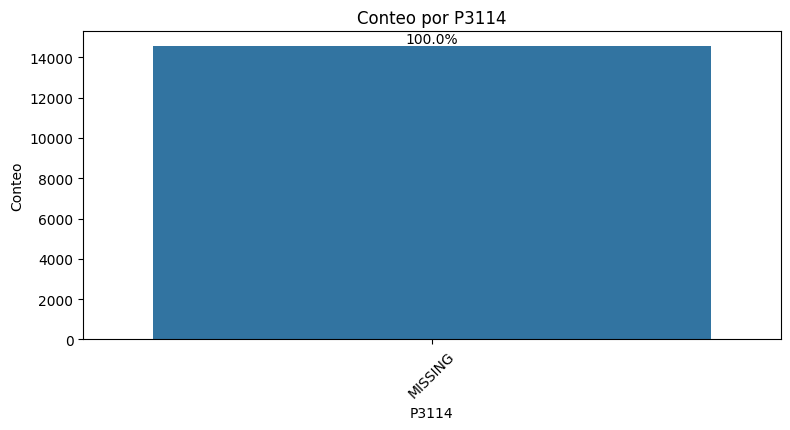

In [33]:
display(HTML(f"<h2>Análisis para grupo de variables Discretas</h2>"))
descriptivo_grupo(df_base,vars_naturaleza['vars_discretas'])

count     14562
unique        7
top         6.0
freq       5491
Name: P6210, dtype: object


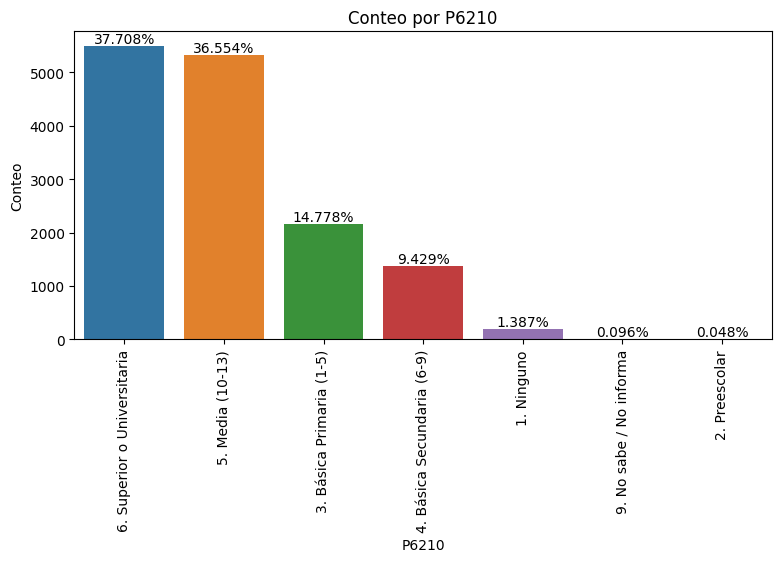

count    14562.000000
mean         3.951930
std          0.261584
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S1, dtype: float64


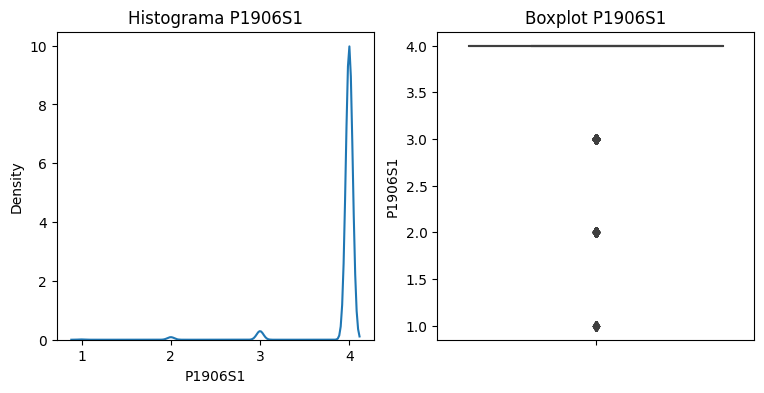

count    14562.000000
mean         3.971913
std          0.213144
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S2, dtype: float64


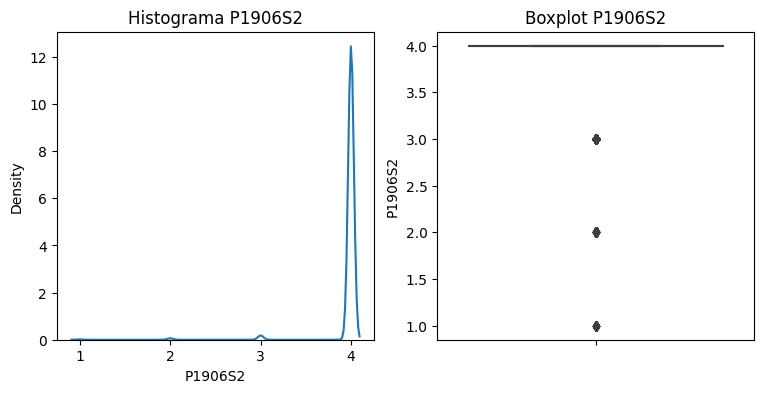

count    14562.000000
mean         3.798517
std          0.451694
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S3, dtype: float64


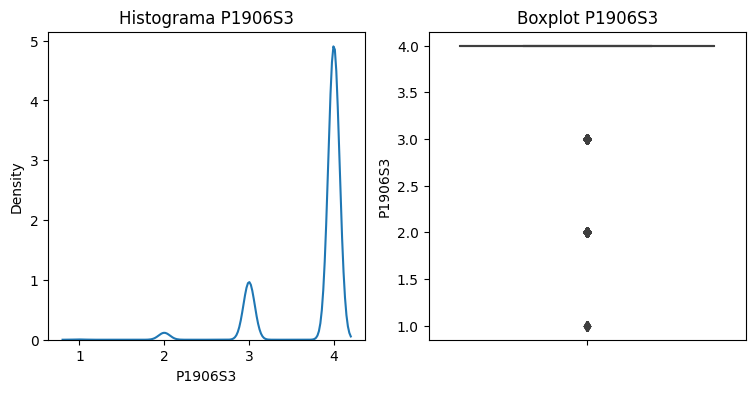

count    14562.000000
mean         3.904477
std          0.374128
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S4, dtype: float64


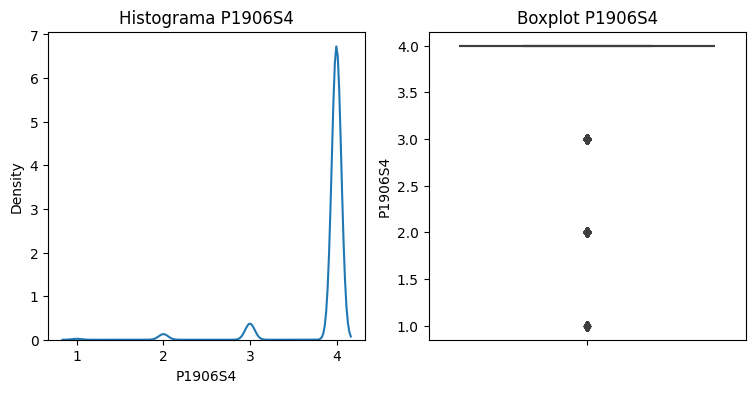

count    14562.000000
mean         3.954196
std          0.261071
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S5, dtype: float64


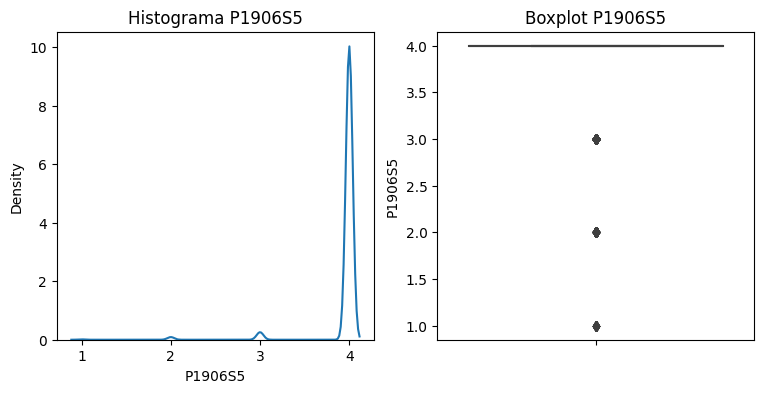

count    14562.000000
mean         3.967381
std          0.234323
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S6, dtype: float64


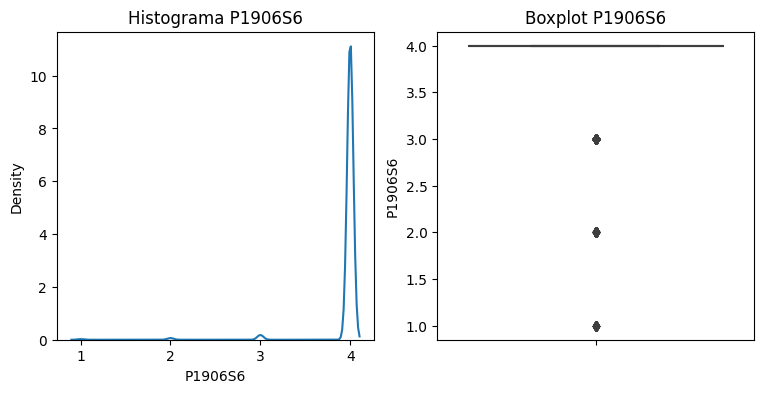

count    14562.000000
mean         3.967106
std          0.242070
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S7, dtype: float64


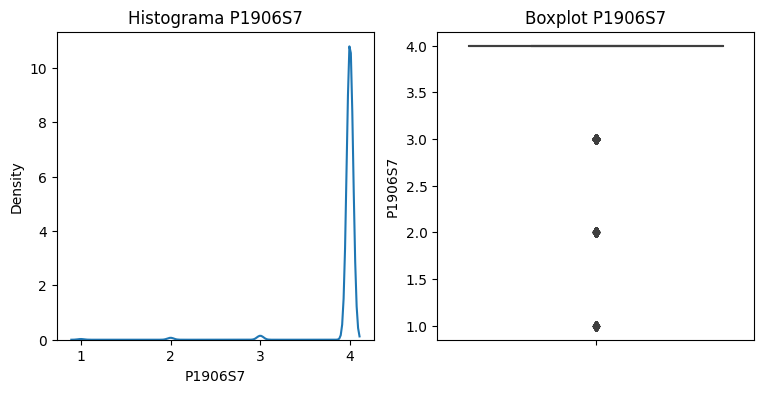

count    14562.000000
mean         3.977476
std          0.194459
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S8, dtype: float64


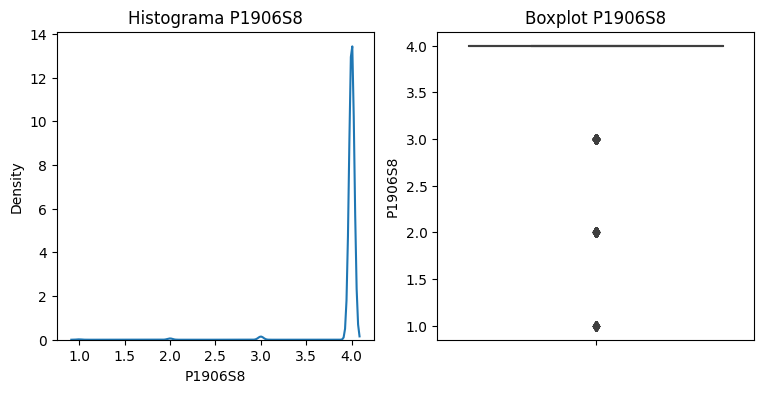

count    14562.000000
mean         3.956325
std          0.263659
min          1.000000
25%          4.000000
50%          4.000000
75%          4.000000
max          4.000000
Name: P1906S9, dtype: float64


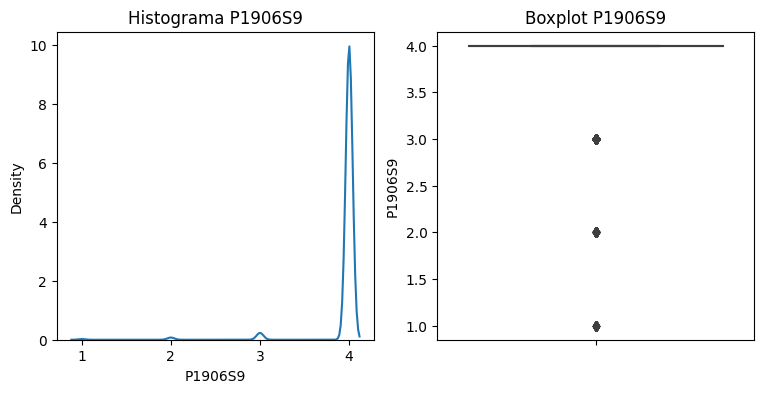

count     14562
unique        4
top         2.0
freq       9906
Name: P3105, dtype: object


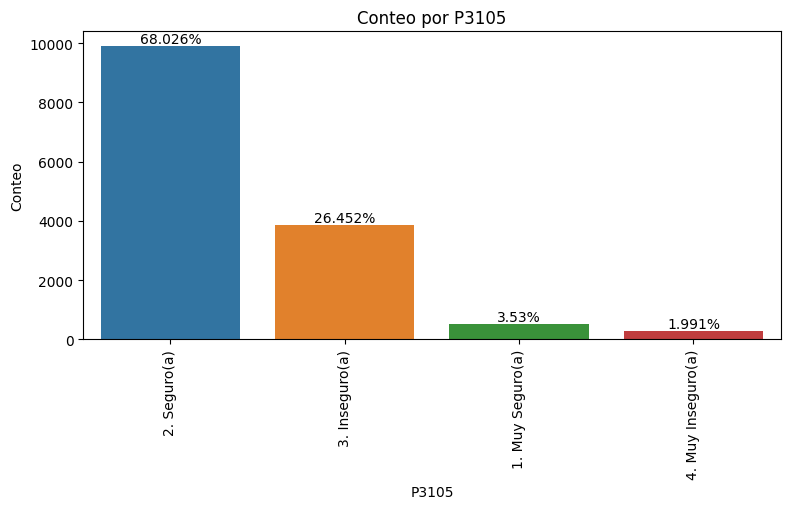

count     14562
unique        5
top         2.0
freq       6417
Name: P3106, dtype: object


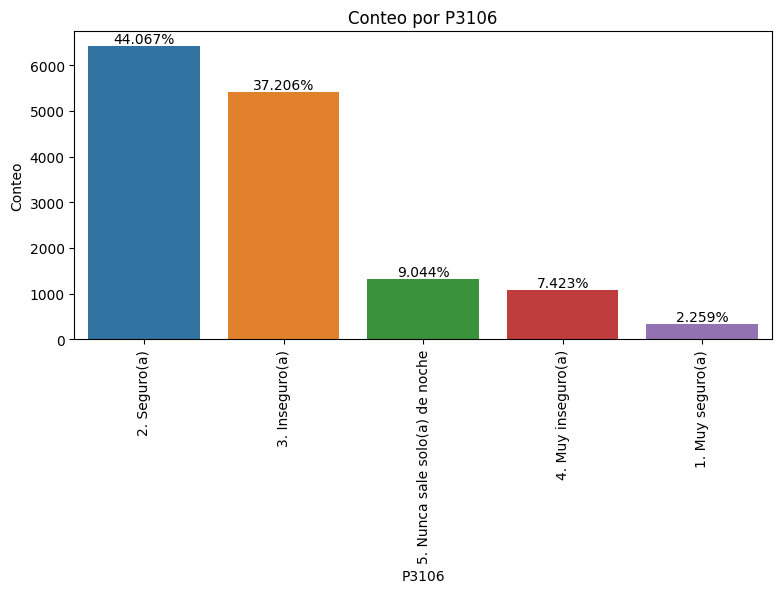

count     14562
unique        5
top         2.0
freq       9980
Name: P3502, dtype: object


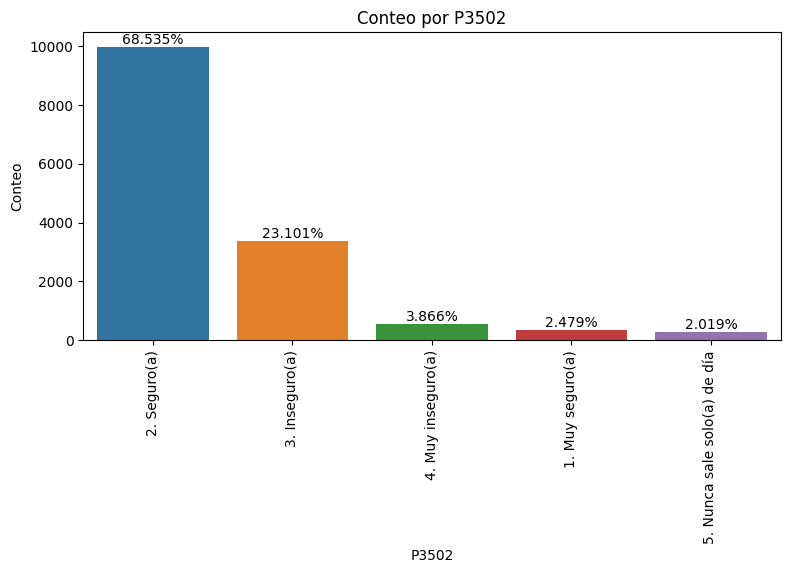

count     14562
unique        4
top         3.0
freq       8608
Name: P3107, dtype: object


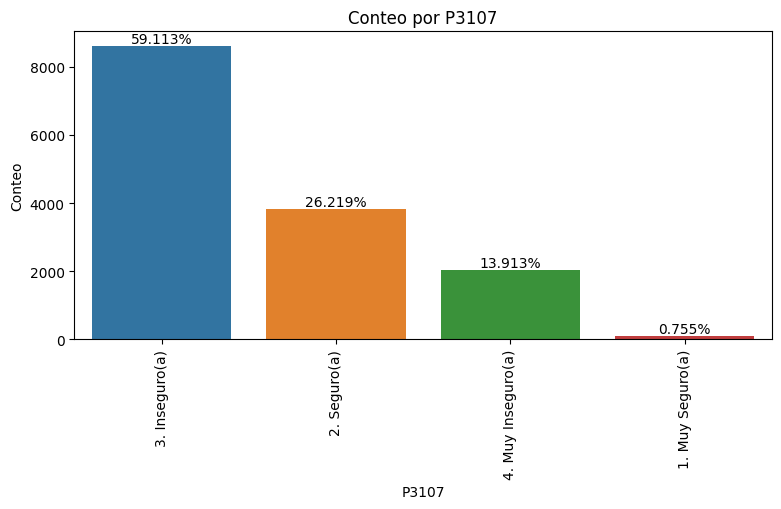

count    14562.000000
mean         2.172984
std          0.524992
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          4.000000
Name: P3111S1, dtype: float64


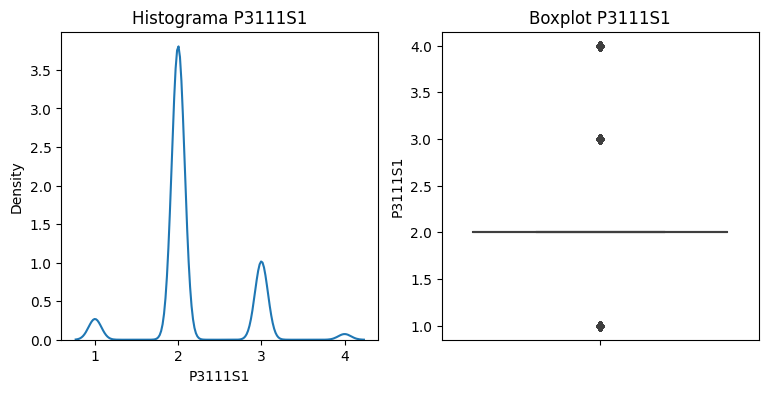

count    14562.000000
mean         2.920066
std          1.013709
min          1.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          5.000000
Name: P3111S2, dtype: float64


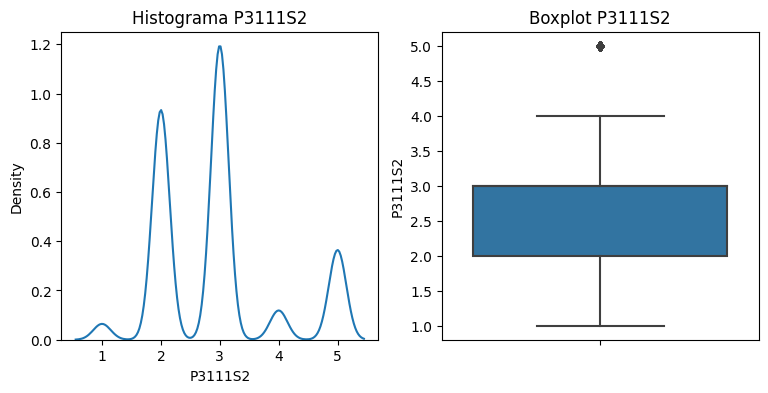

count    14562.000000
mean         2.854622
std          0.994913
min          1.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          5.000000
Name: P3111S3, dtype: float64


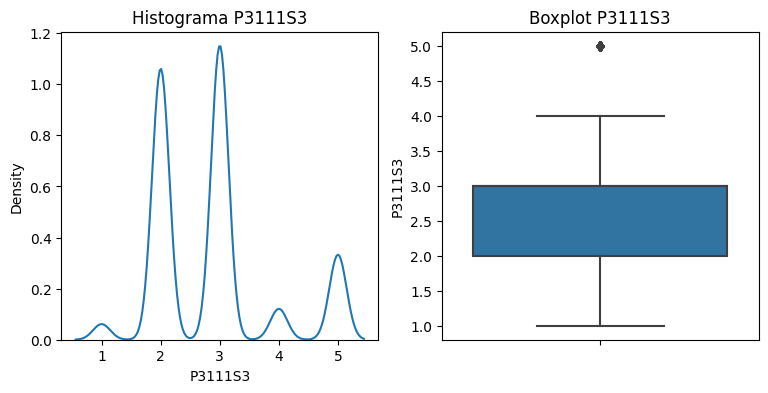

count    14562.000000
mean         3.257863
std          1.027295
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: P3111S4, dtype: float64


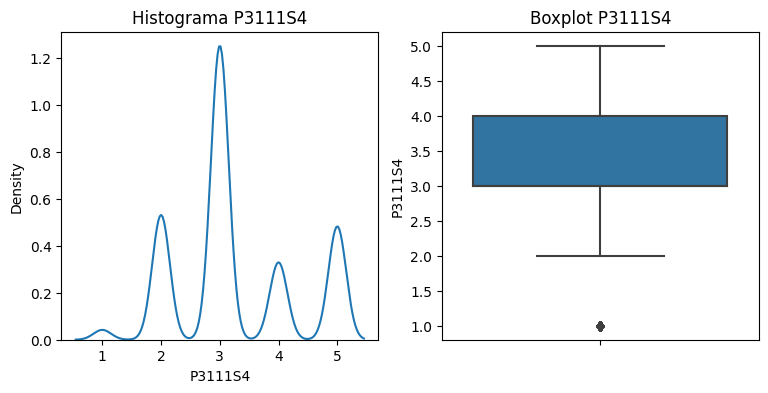

count    14562.000000
mean         3.602046
std          1.085294
min          1.000000
25%          3.000000
50%          3.000000
75%          5.000000
max          5.000000
Name: P3111S5, dtype: float64


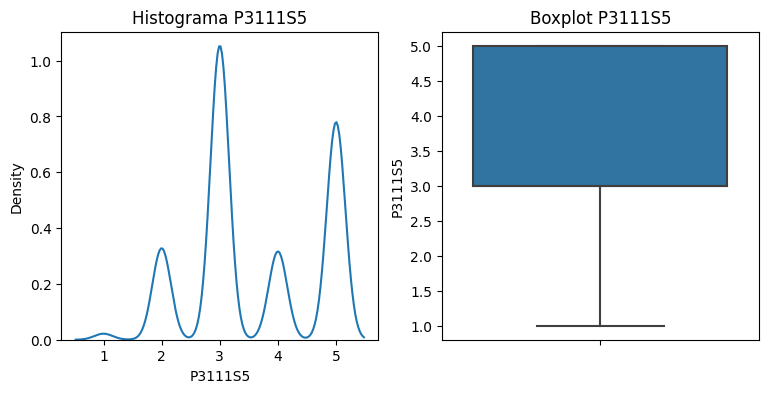

count    14562.000000
mean         2.784233
std          0.583879
min          1.000000
25%          2.000000
50%          3.000000
75%          3.000000
max          4.000000
Name: P3111S6, dtype: float64


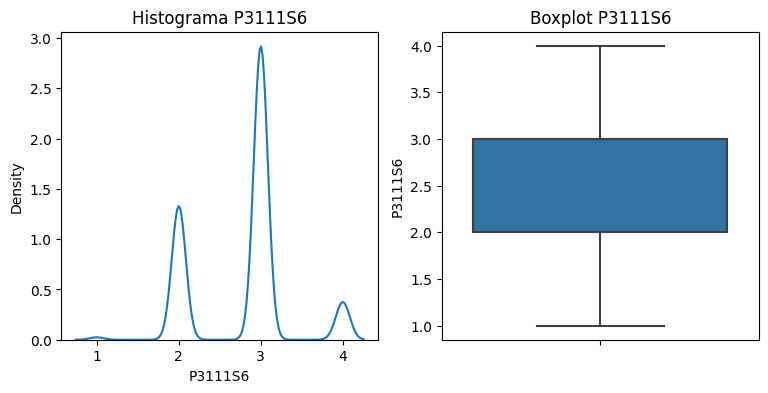

count    14562.000000
mean         3.457561
std          0.983284
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: P3111S8, dtype: float64


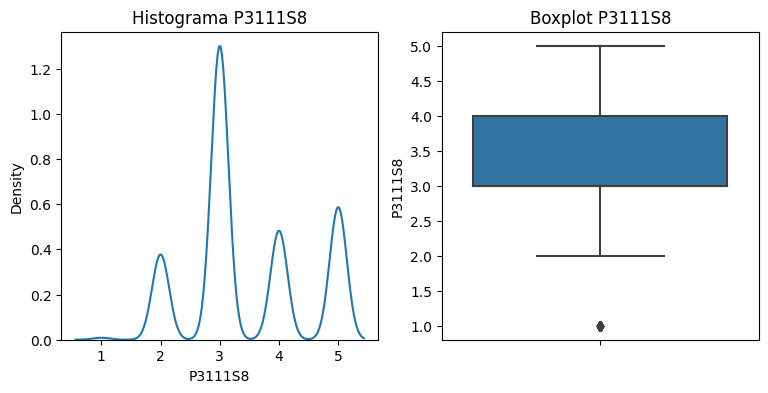

count    14562.000000
mean         3.777640
std          1.246876
min          1.000000
25%          3.000000
50%          4.000000
75%          5.000000
max          5.000000
Name: P3111S9, dtype: float64


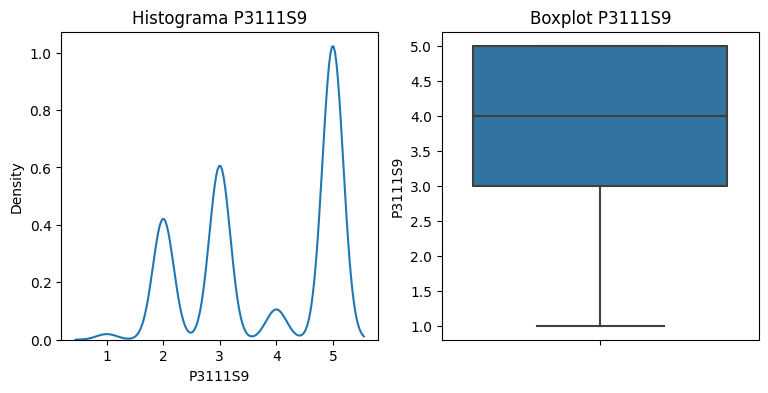

count                              14562
unique                                 4
top       Consumo de drogas o sustancias
freq                                6593
Name: P3108, dtype: object


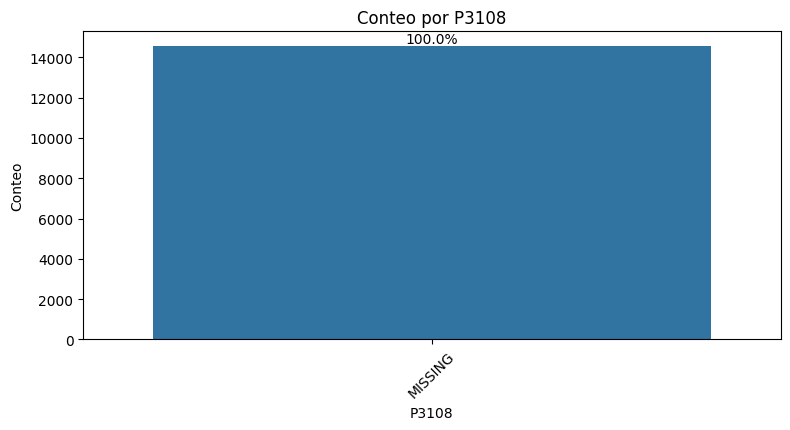

count    14562.000000
mean         1.180195
std          0.856313
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max          2.000000
Name: P3113S1, dtype: float64


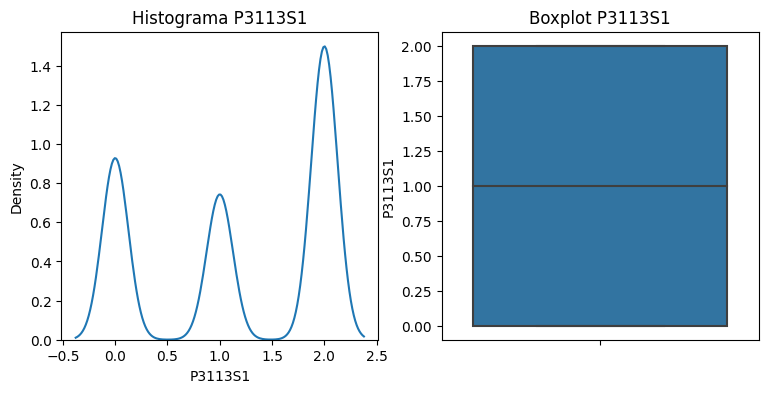

count    14562.000000
mean         0.807375
std          0.923883
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S3, dtype: float64


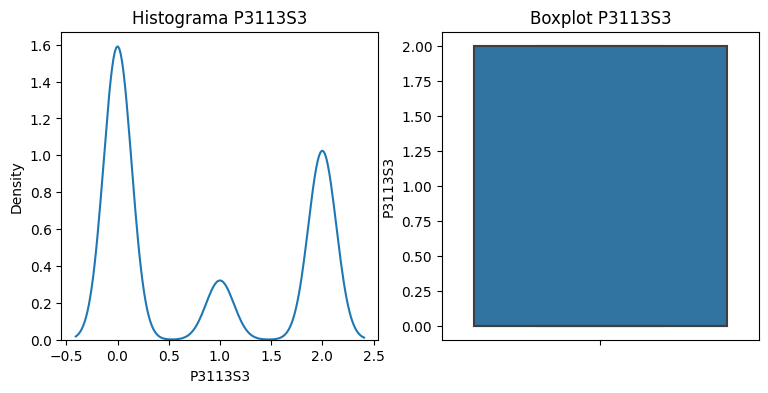

count    14562.000000
mean         1.108296
std          0.903496
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max          2.000000
Name: P3113S4, dtype: float64


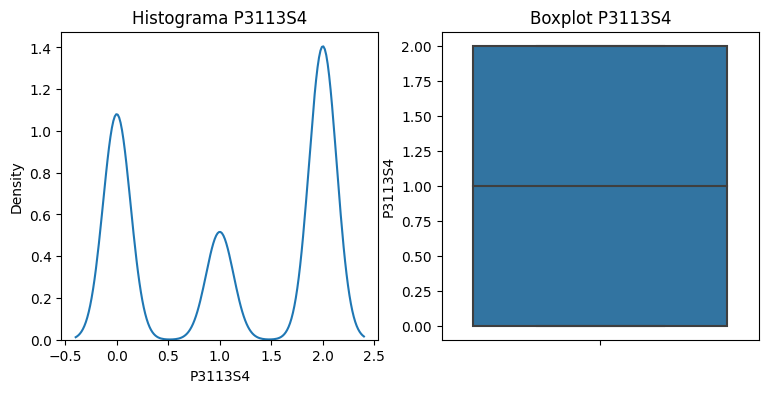

count    14562.000000
mean         0.293435
std          0.651432
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: P3113S5, dtype: float64


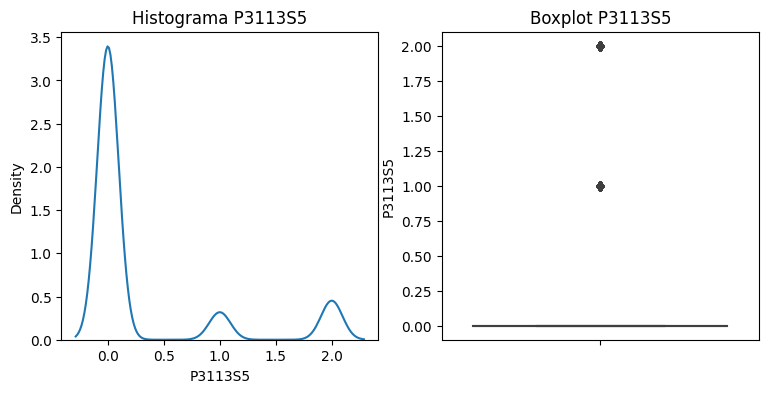

count    14562.000000
mean         0.181706
std          0.520654
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: P3113S6, dtype: float64


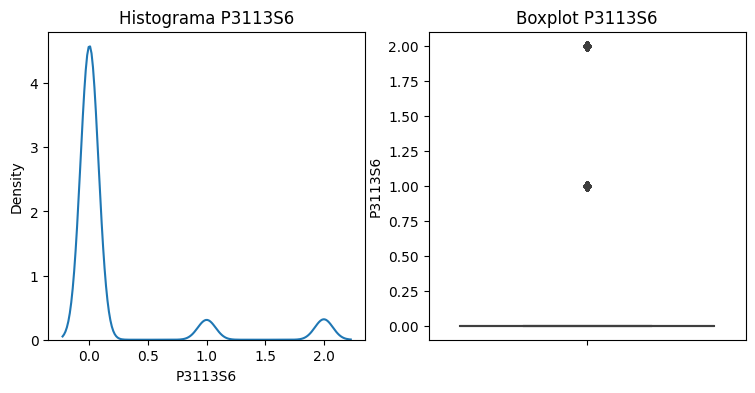

count    14562.000000
mean         0.316921
std          0.679060
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: P3113S7, dtype: float64


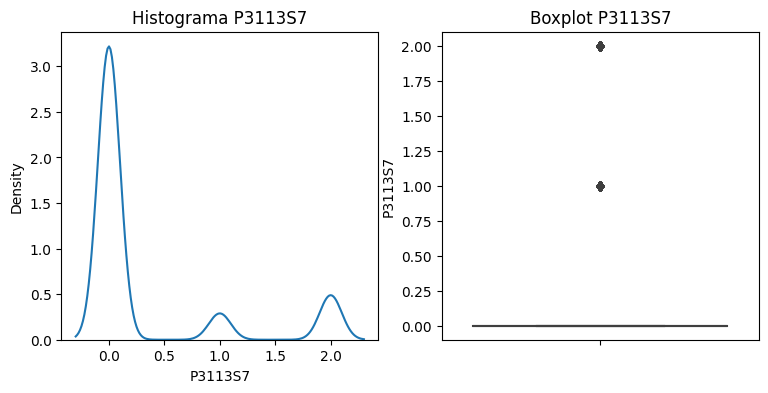

count    14562.000000
mean         0.720368
std          0.879270
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S8, dtype: float64


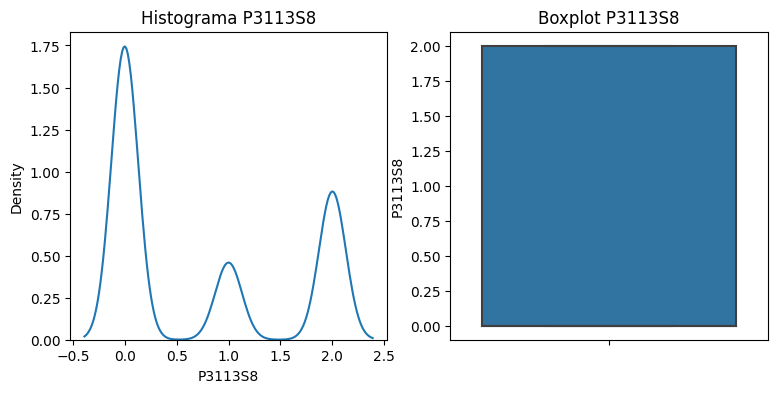

count    14562.000000
mean         0.612965
std          0.860453
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S9, dtype: float64


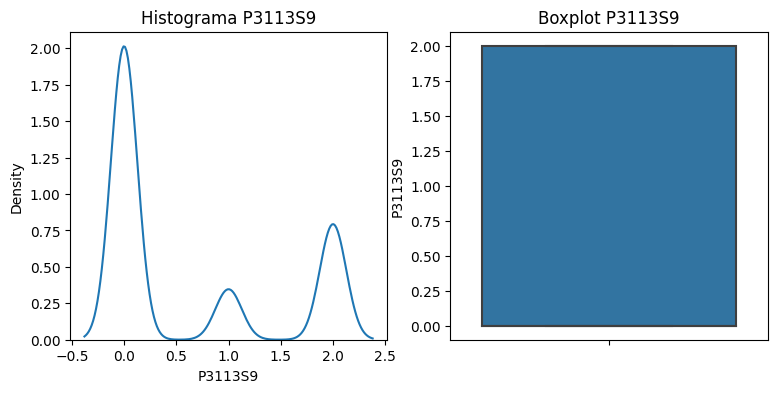

count    14562.000000
mean         1.055075
std          0.955497
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max          2.000000
Name: P3113S10, dtype: float64


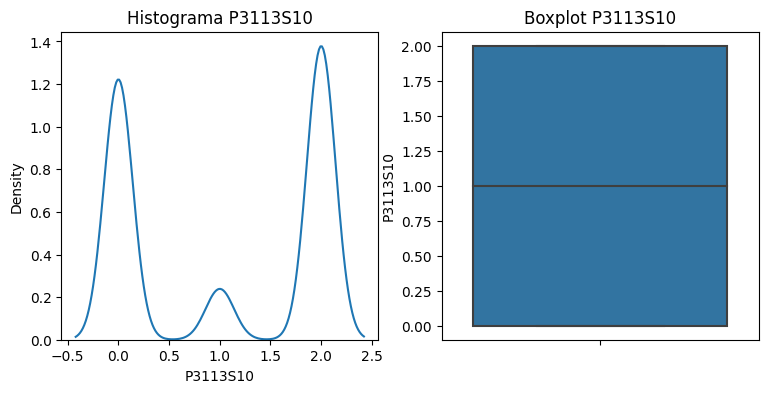

count    14562.000000
mean         0.794602
std          0.942210
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S20, dtype: float64


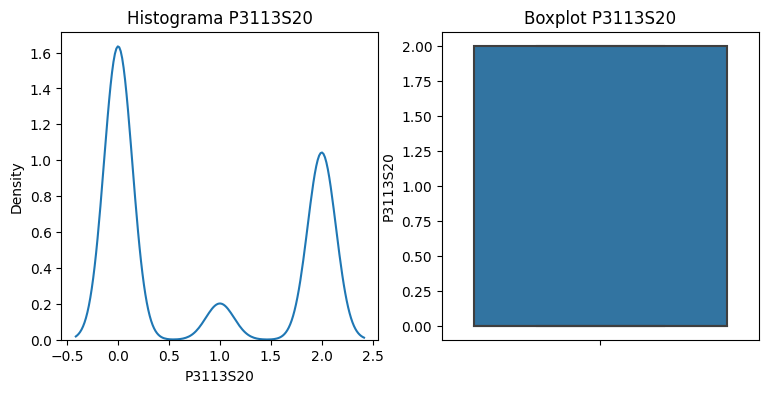

count    14562.000000
mean         0.582887
std          0.866014
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S21, dtype: float64


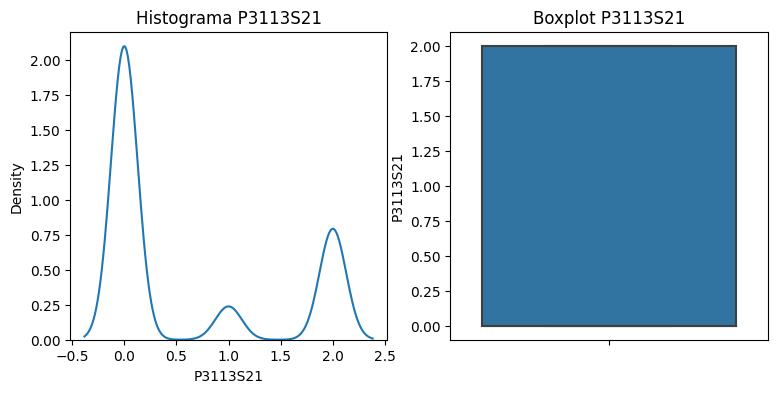

count    14562.000000
mean         0.702239
std          0.866507
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max          2.000000
Name: P3113S22, dtype: float64


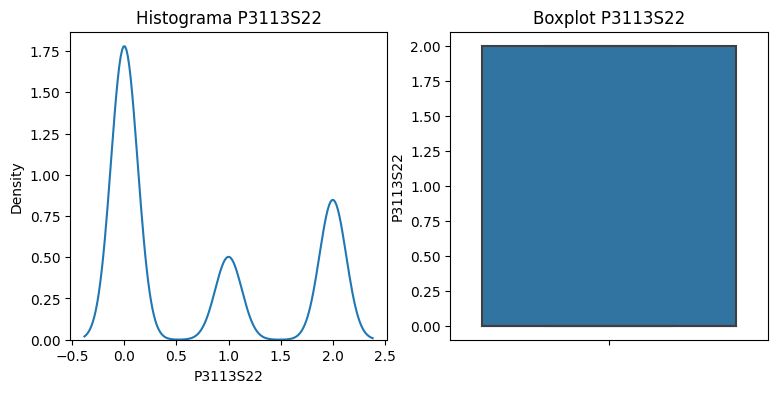

count    14562.000000
mean         1.250790
std          1.646329
min          0.000000
25%          0.000000
50%          0.000000
75%          3.000000
max          5.000000
Name: P1612S1, dtype: float64


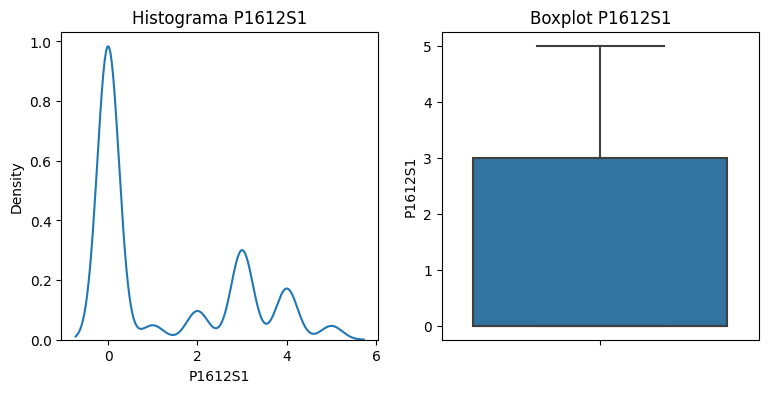

count    14562.000000
mean         1.851394
std          0.596928
min          1.000000
25%          1.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: P1182S1, dtype: float64


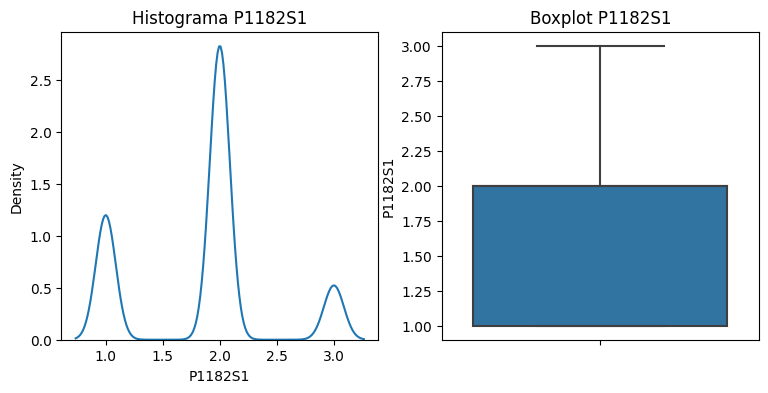

count    14562.000000
mean         1.949457
std          0.632369
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: P1182S2, dtype: float64


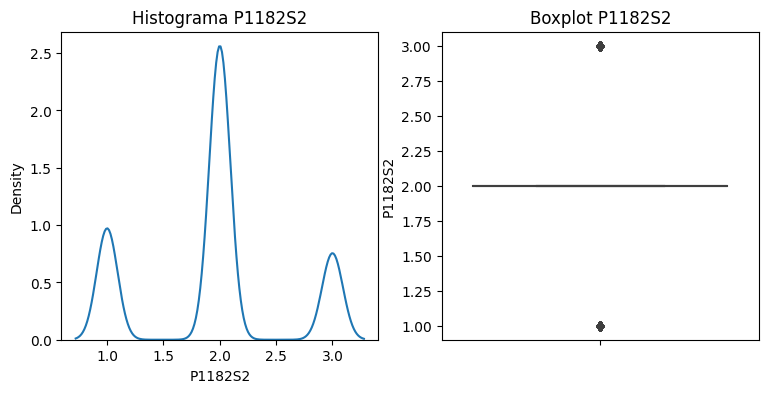

count    14562.000000
mean         2.125876
std          0.634075
min          1.000000
25%          2.000000
50%          2.000000
75%          3.000000
max          3.000000
Name: P1182S3, dtype: float64


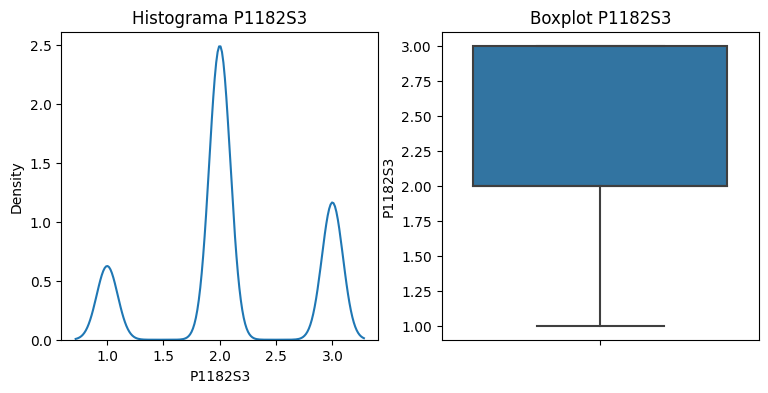

count    14562.000000
mean         2.141189
std          0.624441
min          1.000000
25%          2.000000
50%          2.000000
75%          3.000000
max          3.000000
Name: P1181S1, dtype: float64


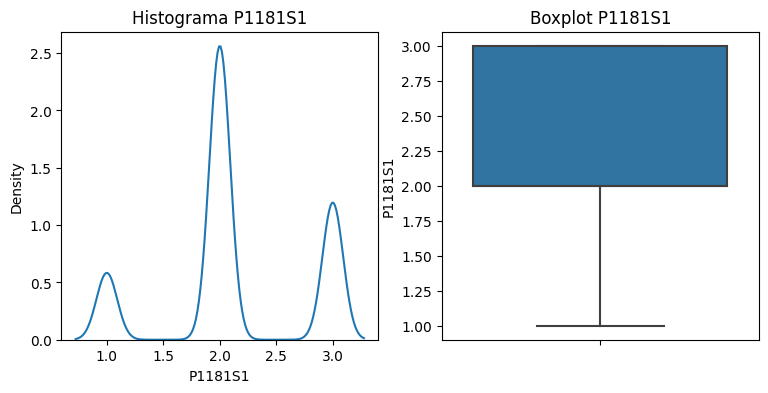

count    14562.000000
mean         2.228334
std          0.614355
min          1.000000
25%          2.000000
50%          2.000000
75%          3.000000
max          3.000000
Name: P1181S2, dtype: float64


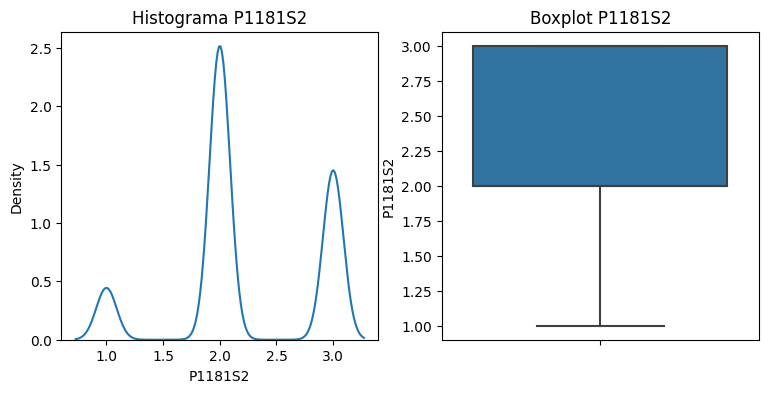

count    14562.000000
mean         2.000755
std          0.631075
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: P3317S1, dtype: float64


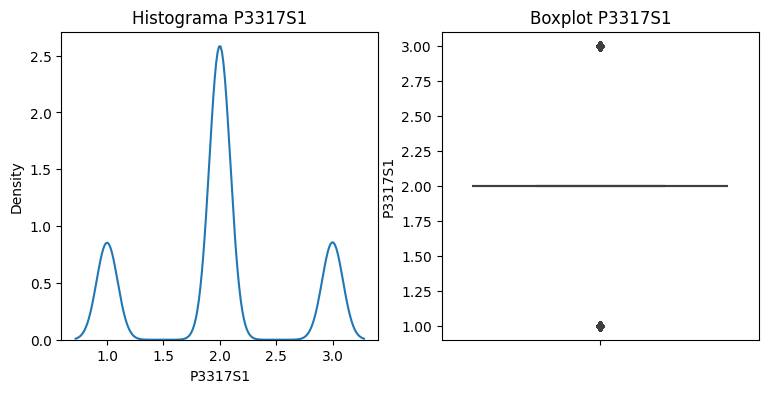

count    14562.000000
mean         2.054113
std          0.609730
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: P3317S2, dtype: float64


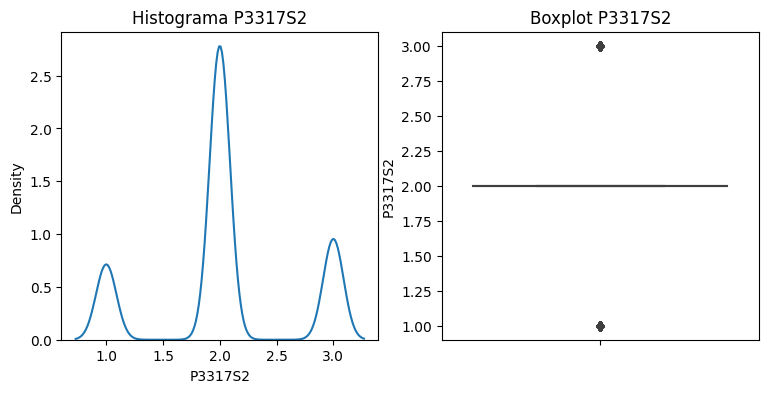

count    14562.000000
mean         2.083642
std          0.605025
min          1.000000
25%          2.000000
50%          2.000000
75%          2.000000
max          3.000000
Name: P3317S3, dtype: float64


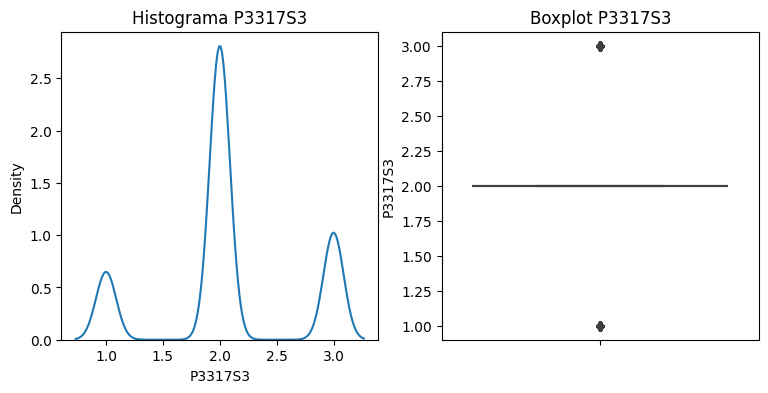

count    14562.000000
mean         3.008103
std          0.927383
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: P3321, dtype: float64


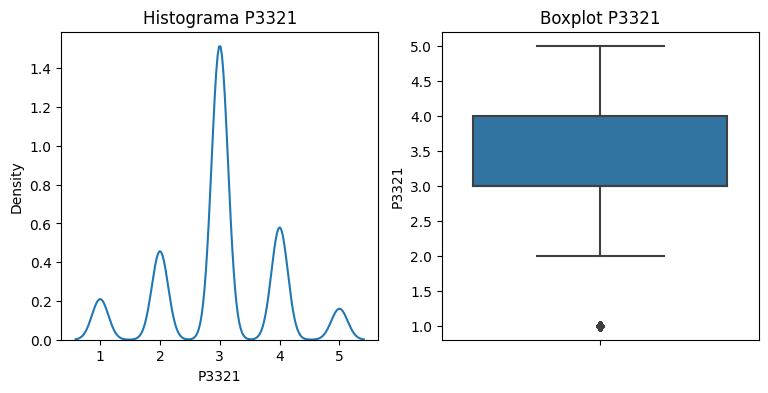

count    14562.000000
mean         2.963879
std          1.035826
min          1.000000
25%          2.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: P3119, dtype: float64


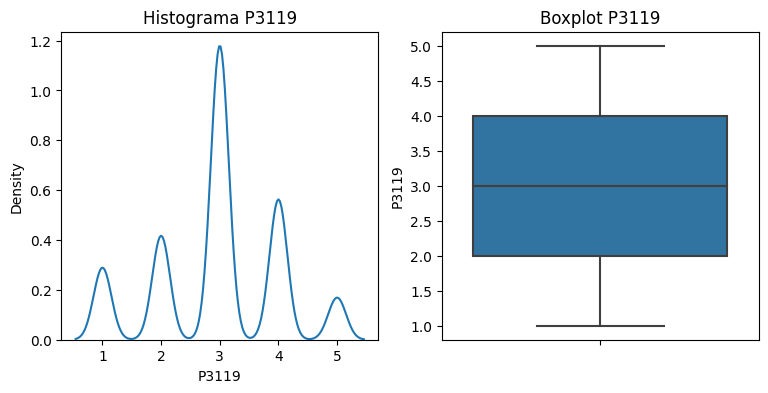

count    14562.000000
mean         2.964497
std          0.885392
min          1.000000
25%          3.000000
50%          3.000000
75%          3.000000
max          5.000000
Name: P3127, dtype: float64


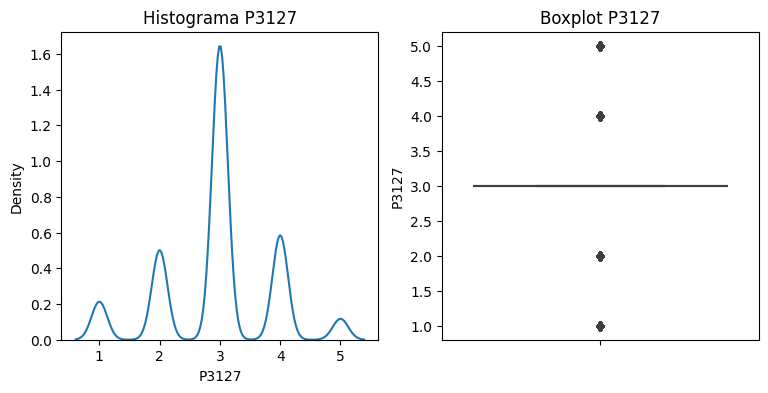

In [34]:
display(HTML(f"<h2>Análisis para grupo de variables Ordinaless</h2>"))
descriptivo_grupo(df_base,vars_naturaleza['vars_ordinales'])

In [35]:
df_base['P1366'].value_counts()

Está soltero(a)                            5416
Está casado(a)                             3497
No casado(a) vive pareja dos años o más    3271
Está separado(a) o divorciado(a)           1268
Está viudo(a)                               841
No casado(a) vive pareja menos dos años     269
Name: P1366, dtype: int64

count     14562
unique        2
top          No
freq      12649
Name: P565S1, dtype: object


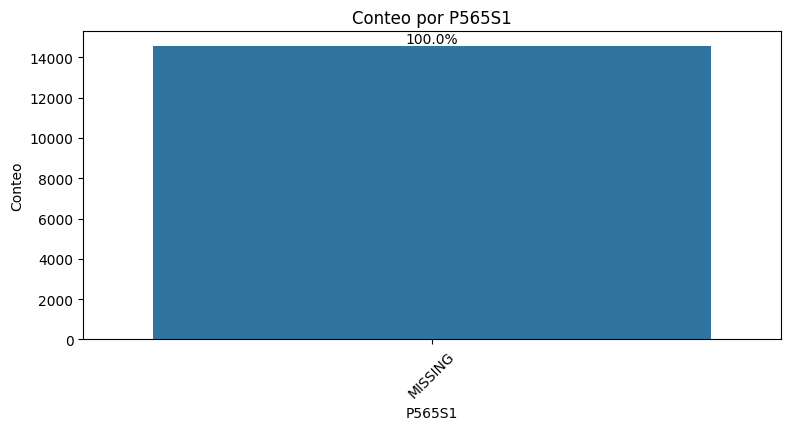

count     14562
unique        2
top          No
freq      13109
Name: P565S2, dtype: object


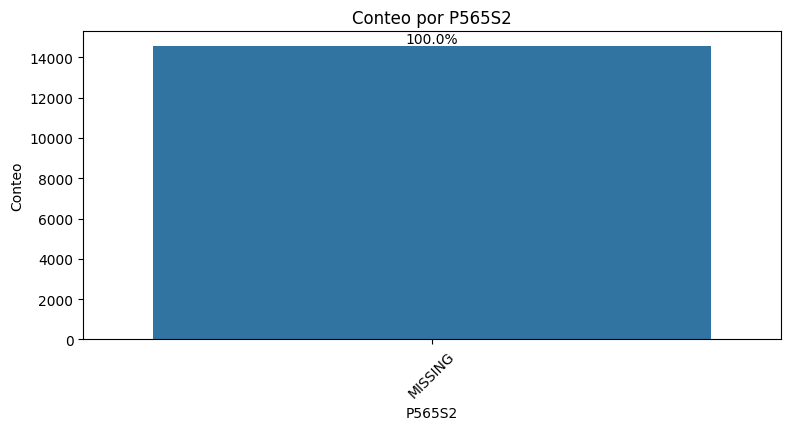

count     14562
unique        2
top          No
freq      13650
Name: P565S3, dtype: object


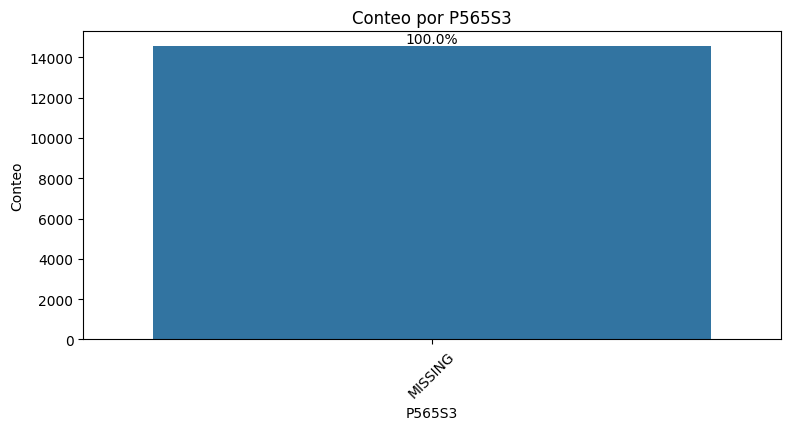

count     14562
unique        2
top          No
freq      14555
Name: P565S4, dtype: object


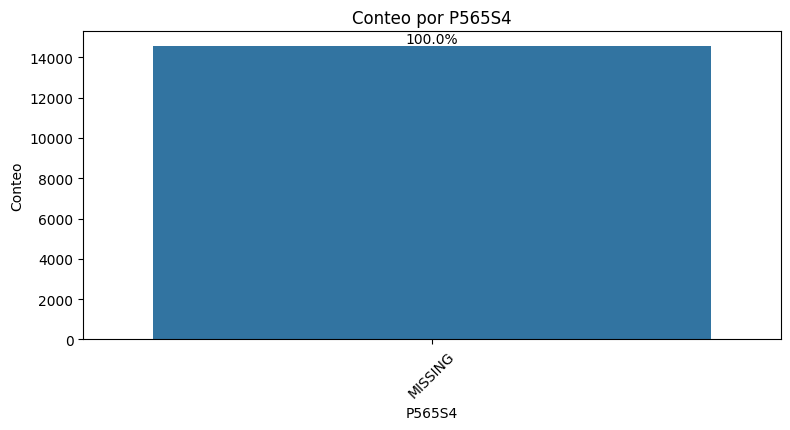

count     14562
unique        2
top          No
freq      14427
Name: P3115S1, dtype: object


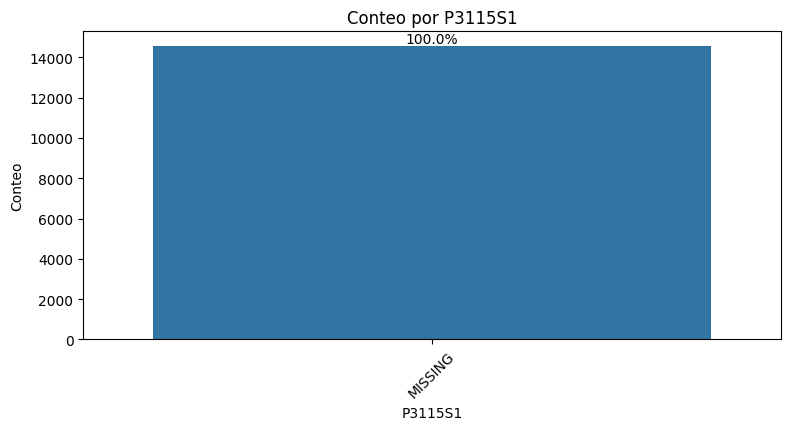

count     14562
unique        2
top          No
freq      14480
Name: P3115S2, dtype: object


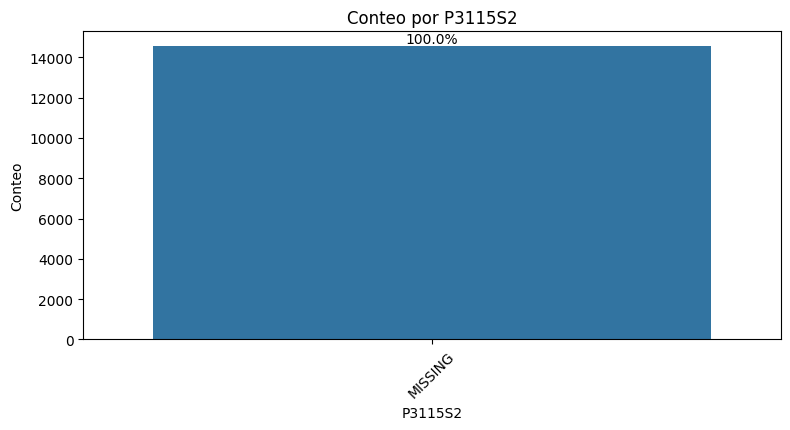

count     14562
unique        2
top          No
freq      14533
Name: P3115S3, dtype: object


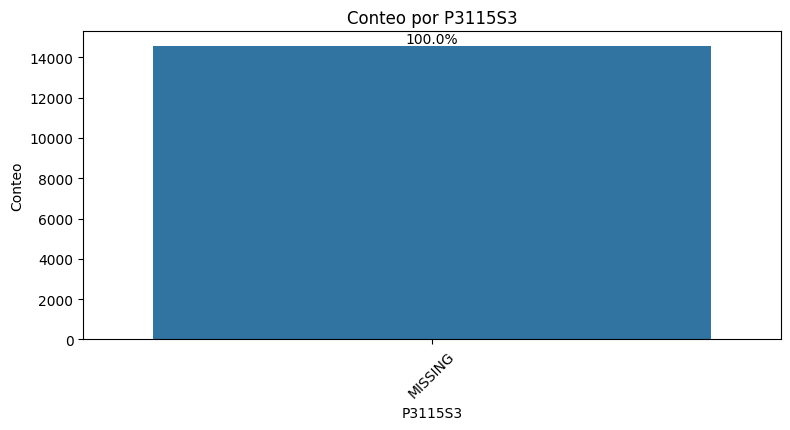

count     14562
unique        2
top          No
freq      14486
Name: P1976S1, dtype: object


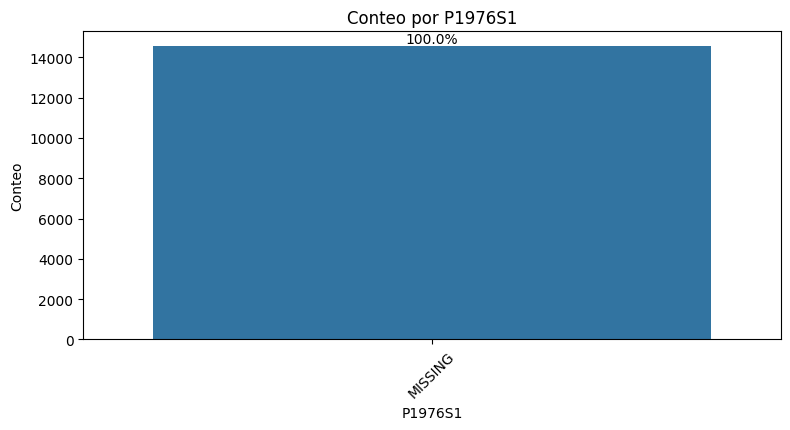

count     14562
unique        2
top          No
freq      14501
Name: P1976S2, dtype: object


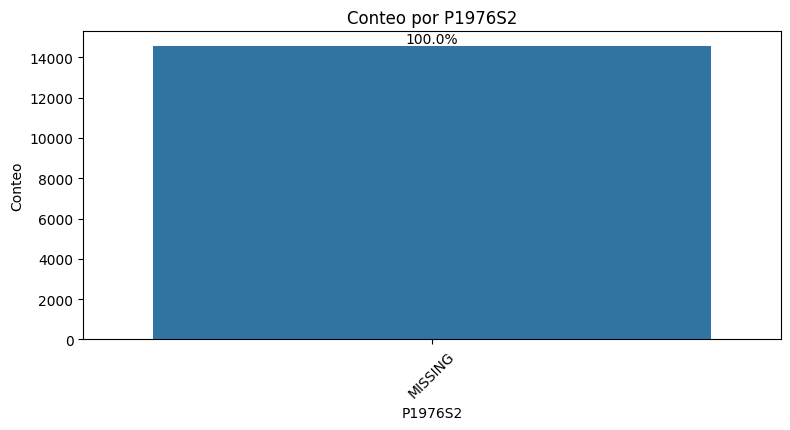

count     14562
unique        2
top          No
freq      14504
Name: P1976S9, dtype: object


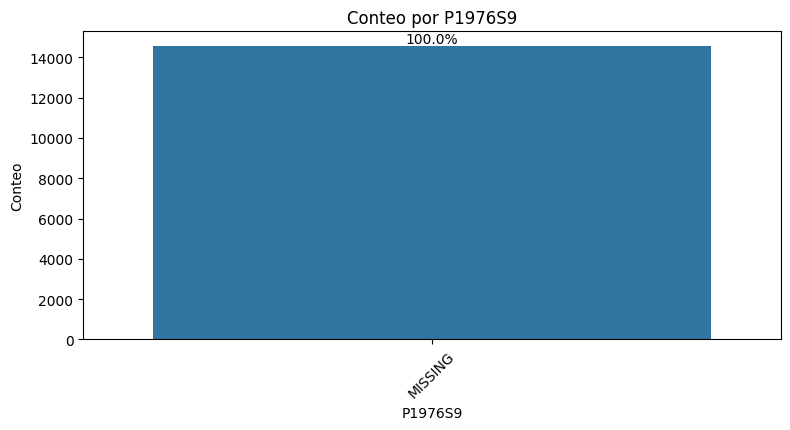

count     14562
unique        2
top          No
freq      14553
Name: P1976S4, dtype: object


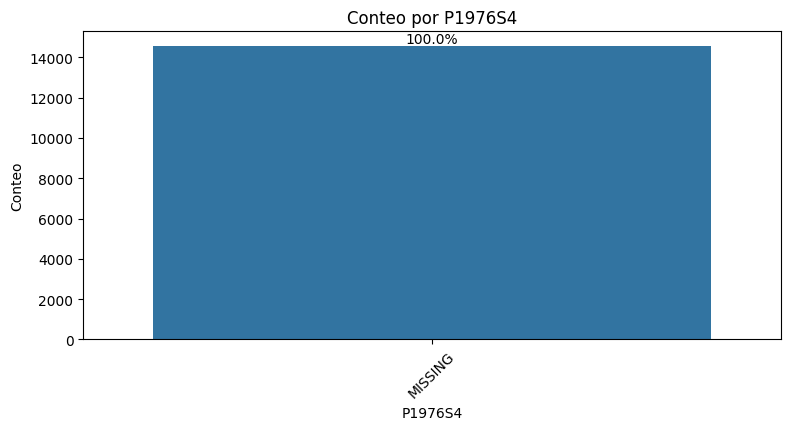

count     14562
unique        2
top          No
freq      14558
Name: P1976S5, dtype: object


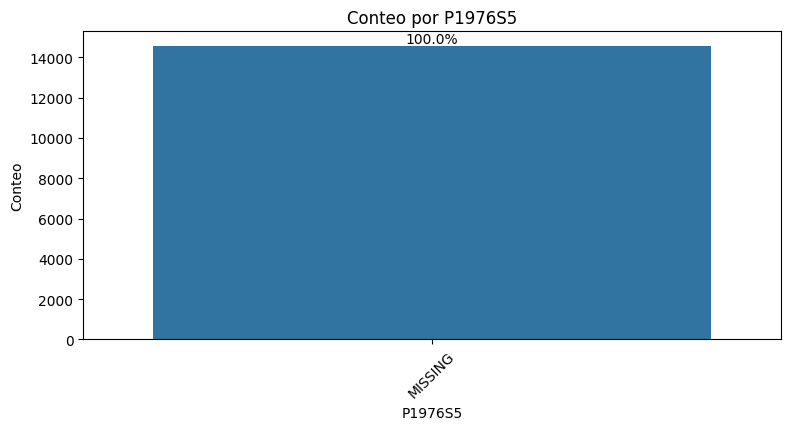

count     14562
unique        2
top          No
freq      14559
Name: P1976S6, dtype: object


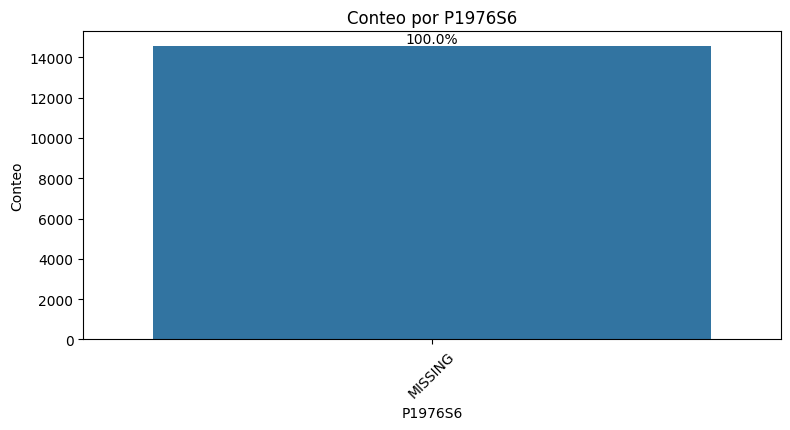

count     14562
unique        2
top          No
freq      14540
Name: P1976S7, dtype: object


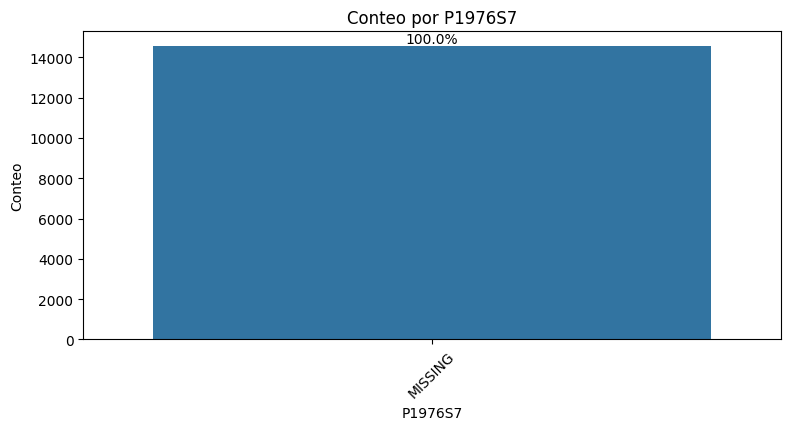

count     14562
unique        2
top          No
freq      14328
Name: P1976S13, dtype: object


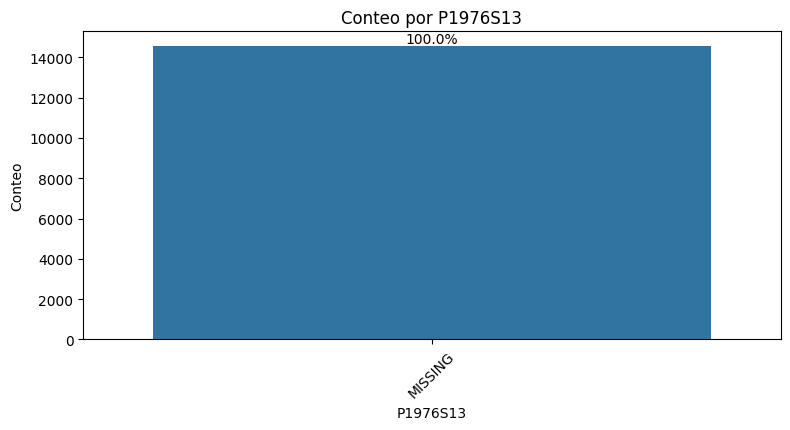

count     14562
unique        2
top          No
freq      14551
Name: P1976S14, dtype: object


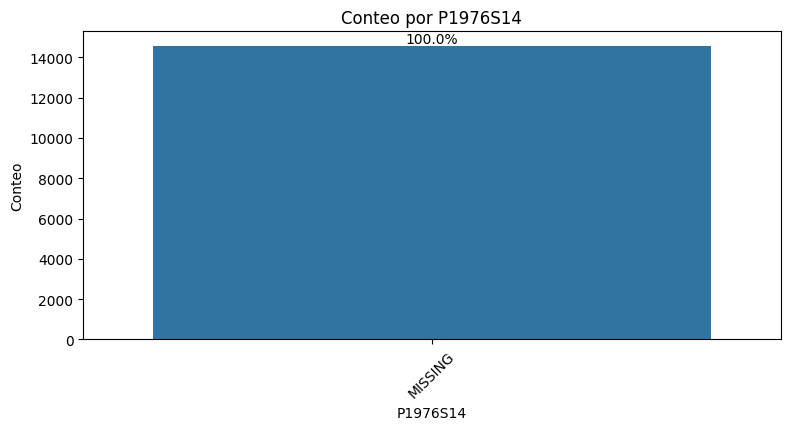

count     14562
unique        2
top          No
freq      14552
Name: P1976S8, dtype: object


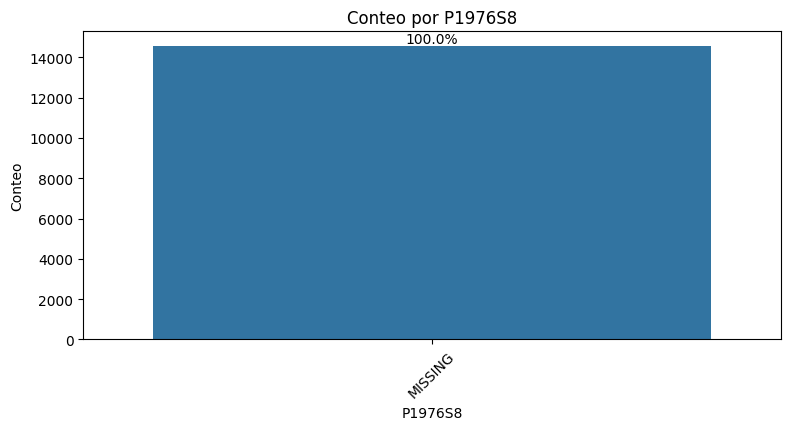

count     14562
unique        2
top          No
freq      14442
Name: P3315, dtype: object


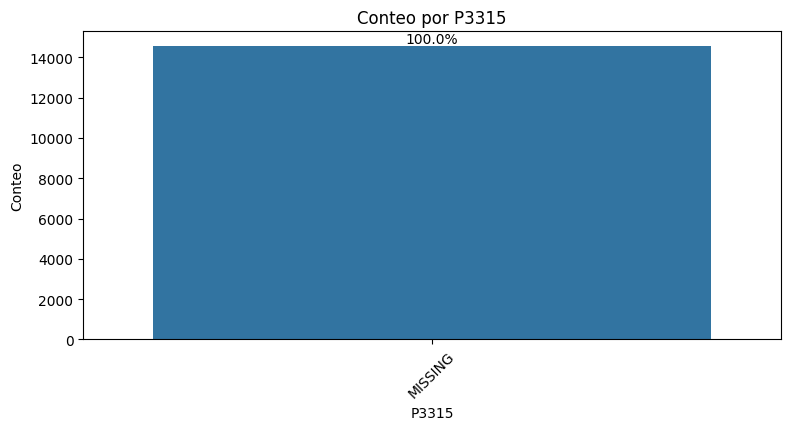

count     14562
unique        2
top          No
freq      14466
Name: P541, dtype: object


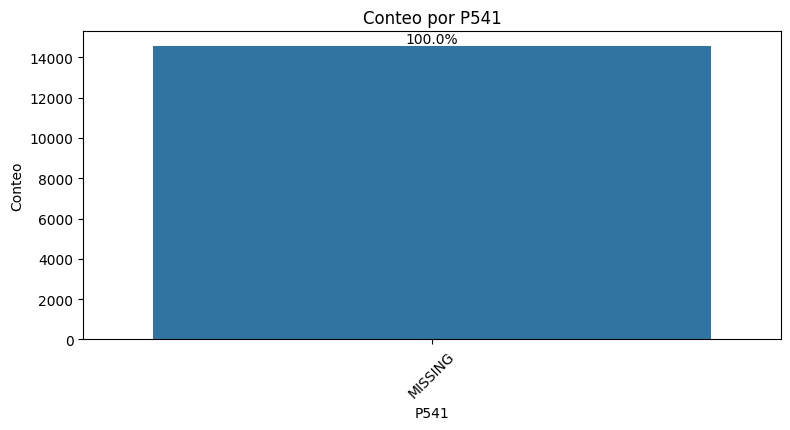

count     14562
unique        2
top          No
freq      14490
Name: P1392, dtype: object


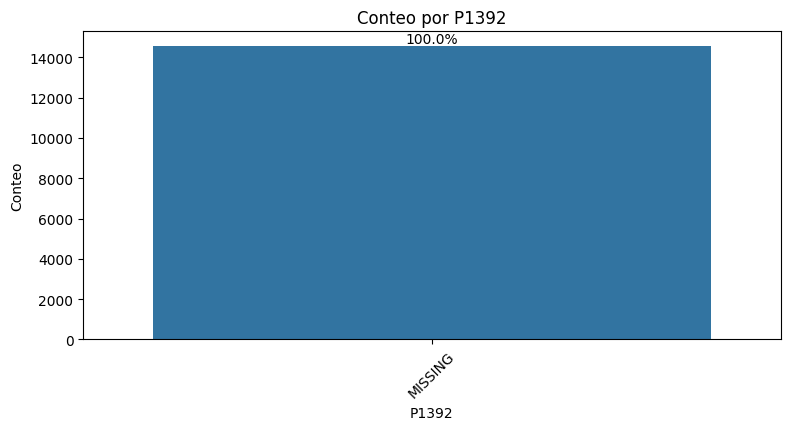

count     14562
unique        2
top          No
freq      14557
Name: P1959, dtype: object


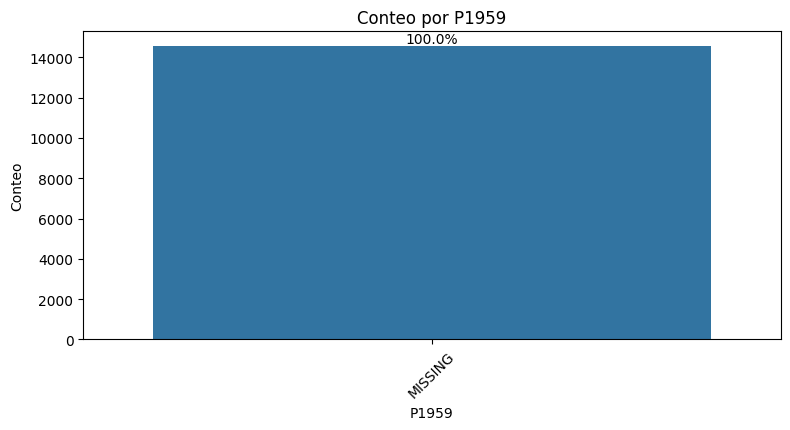

count     14562
unique        1
top          No
freq      14562
Name: P1960, dtype: object


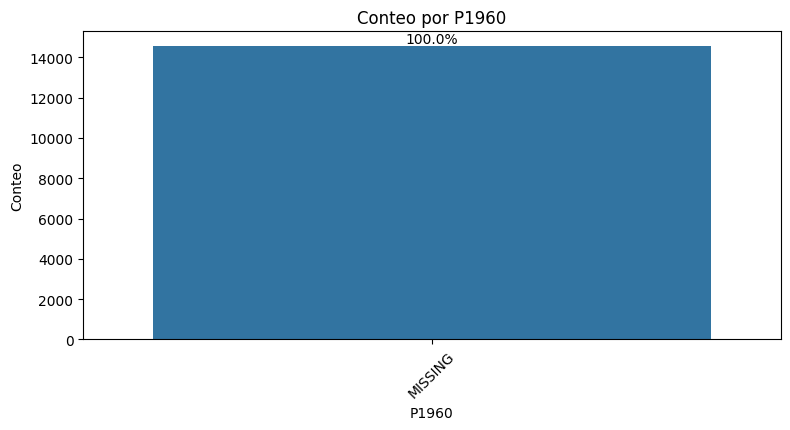

count     14562
unique        2
top          No
freq      13917
Name: P525, dtype: object


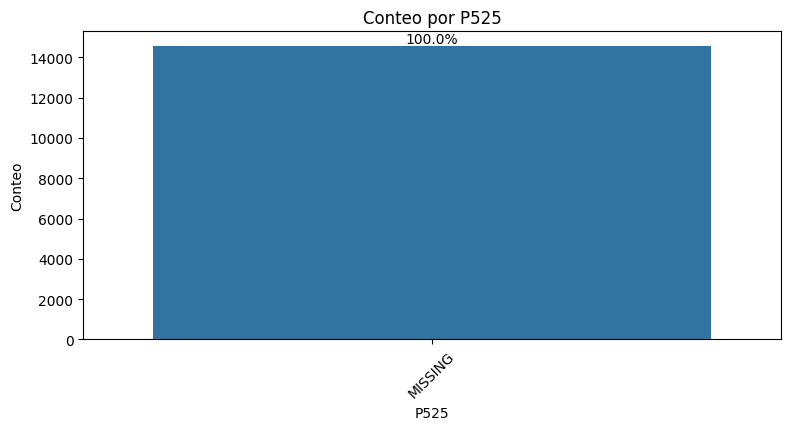

count     14562
unique        2
top          No
freq      13851
Name: P1343, dtype: object


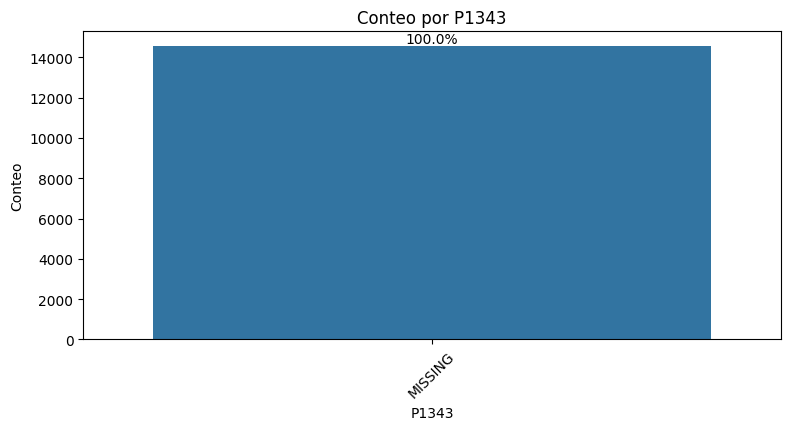

count     14562
unique        2
top          No
freq      14470
Name: P526, dtype: object


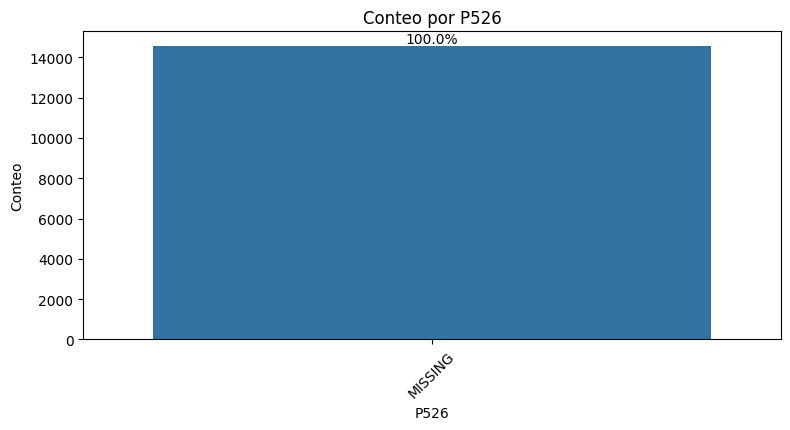

count     14562
unique        2
top          No
freq      14500
Name: P1315, dtype: object


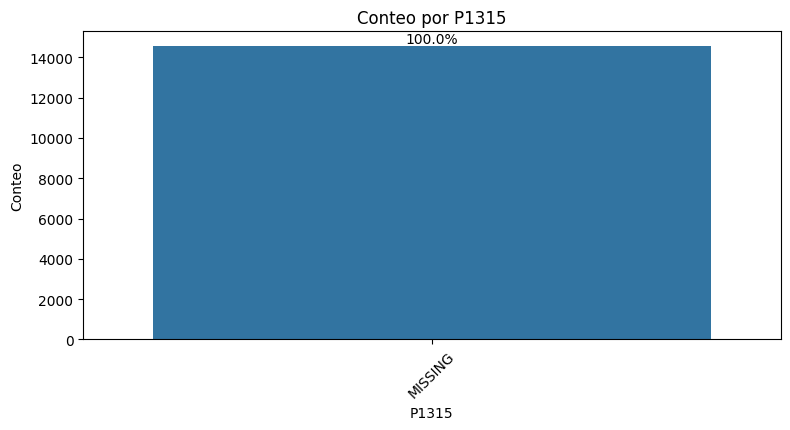

count     14562
unique        2
top          No
freq      14337
Name: P528, dtype: object


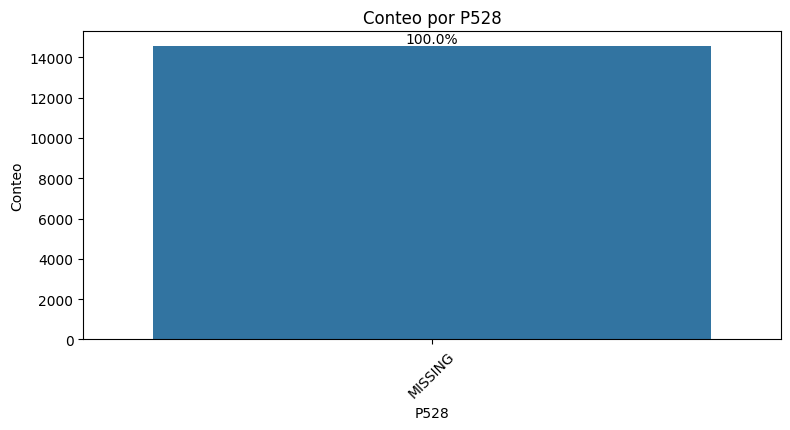

count     14562
unique        2
top          No
freq      14462
Name: P1286, dtype: object


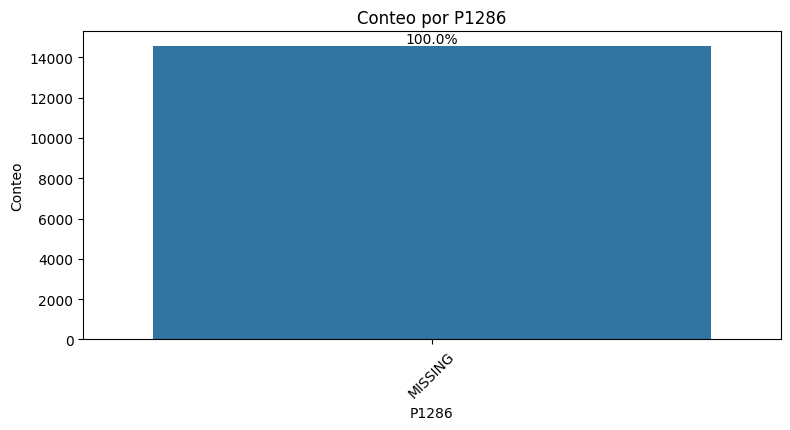

count     14562
unique        2
top          No
freq      14421
Name: P1956, dtype: object


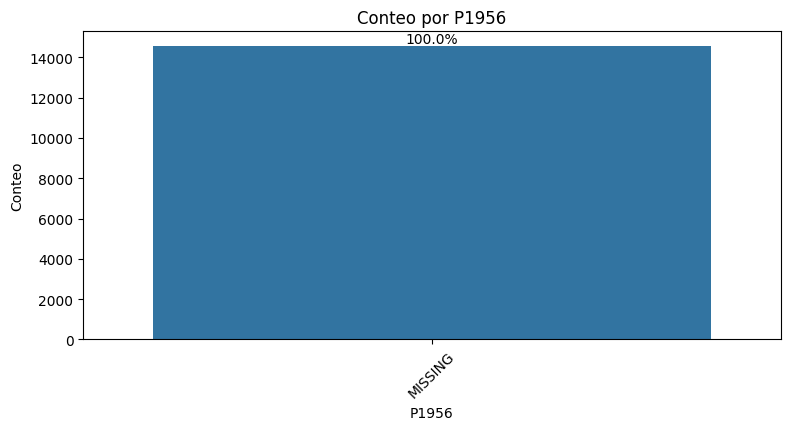

count     14562
unique        2
top          Si
freq       9256
Name: P1398S1, dtype: object


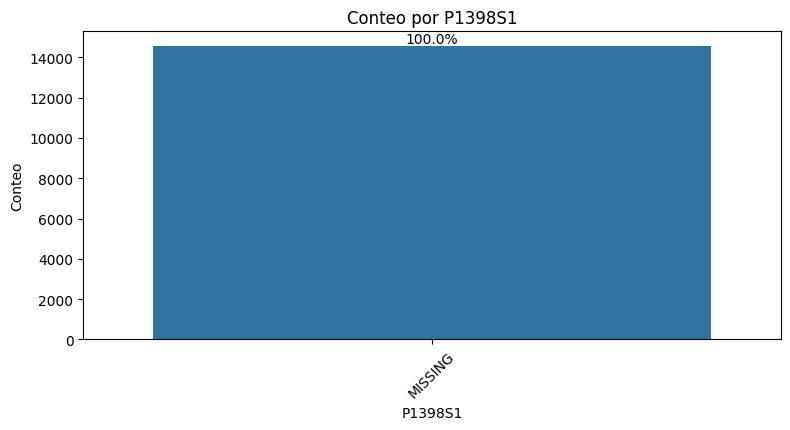

count     14562
unique        2
top          No
freq      10254
Name: P1398S2, dtype: object


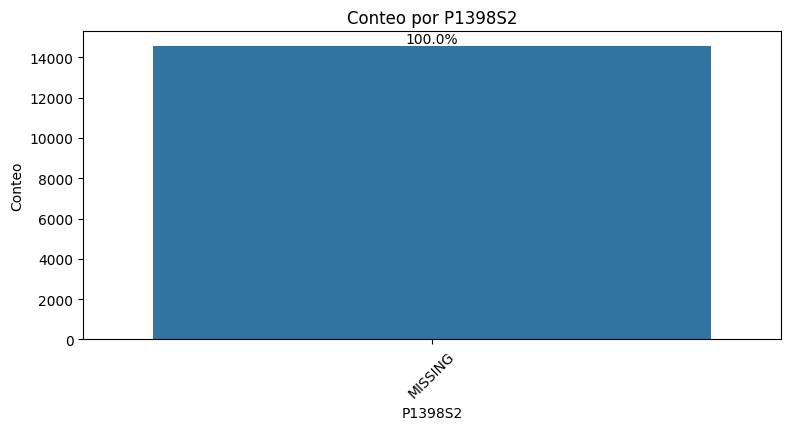

count     14562
unique        2
top          No
freq      10312
Name: P1398S3, dtype: object


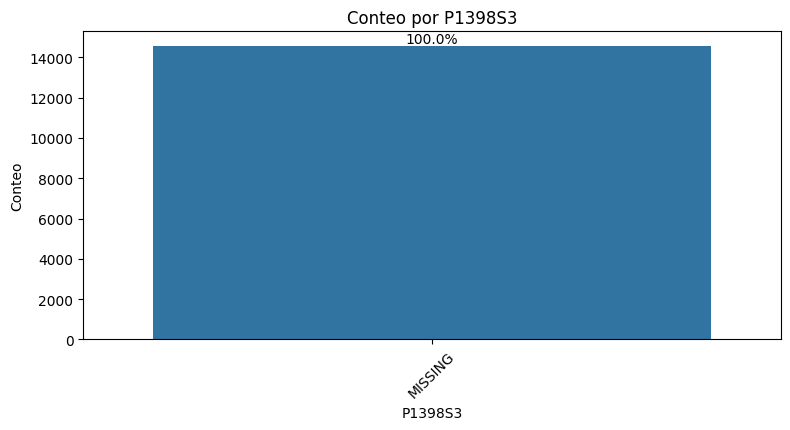

count     14562
unique        2
top          No
freq       9388
Name: P1398S4, dtype: object


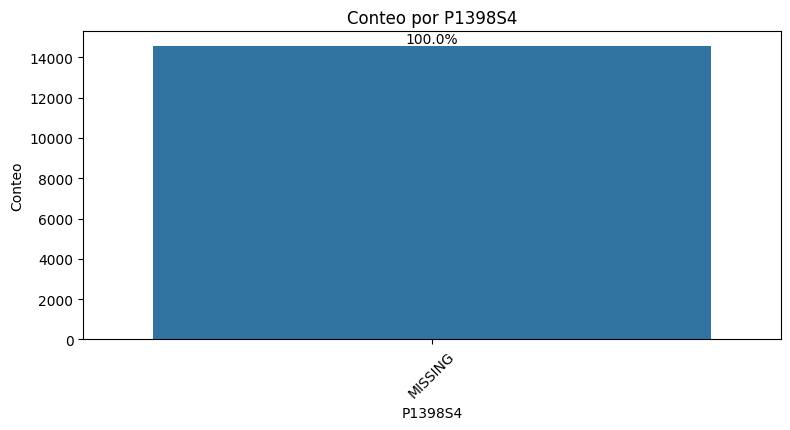

count     14562
unique        2
top          No
freq      11162
Name: P1398S5, dtype: object


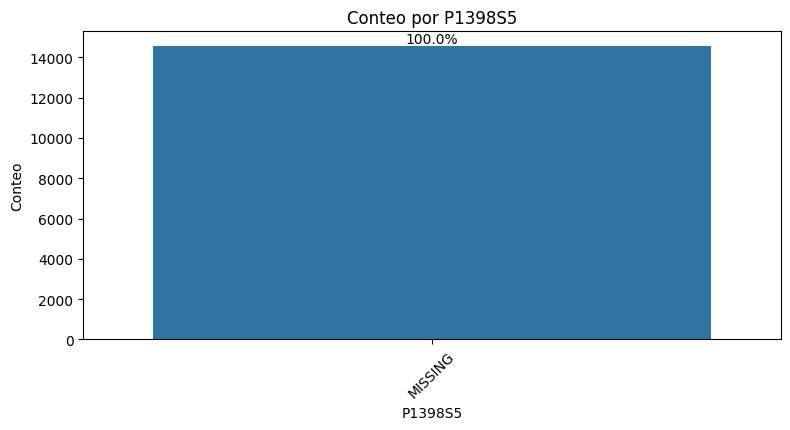

count     14562
unique        2
top          No
freq      13260
Name: P1398S6, dtype: object


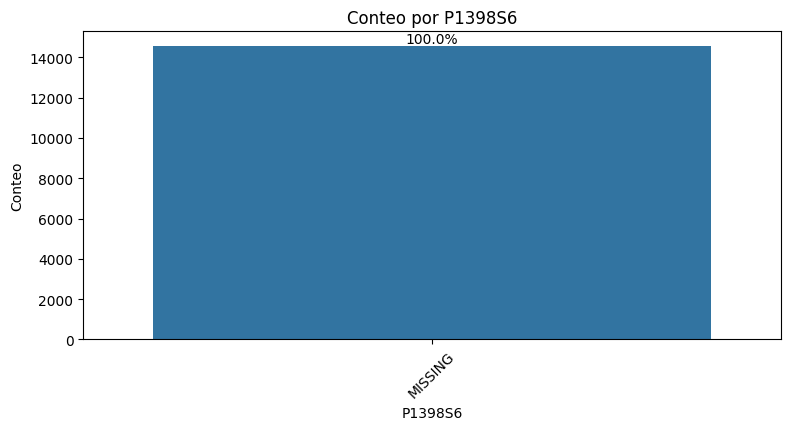

count     14562
unique        2
top          No
freq       9373
Name: P1398S8, dtype: object


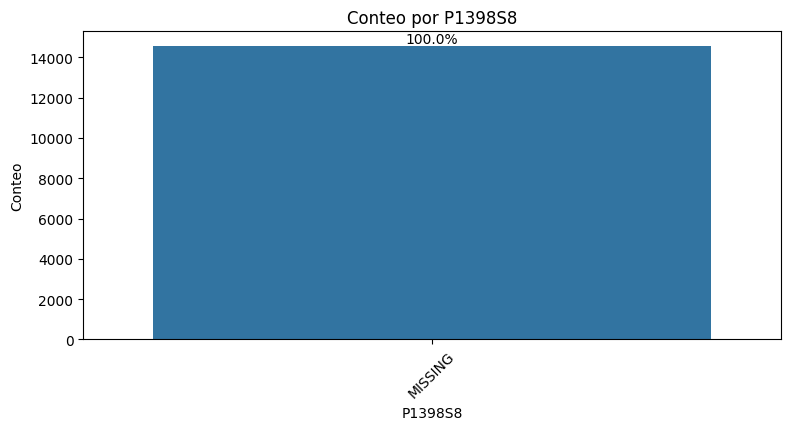

count     14562
unique        2
top          No
freq      11346
Name: P1398S9, dtype: object


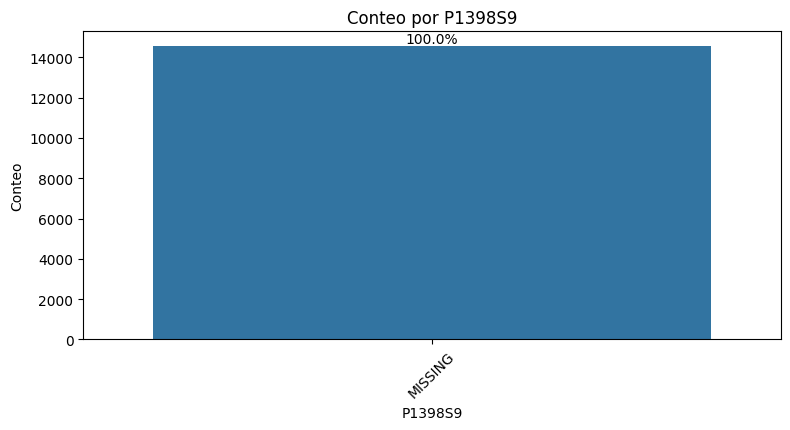

count     14562
unique        2
top          Si
freq       8987
Name: P1398S10, dtype: object


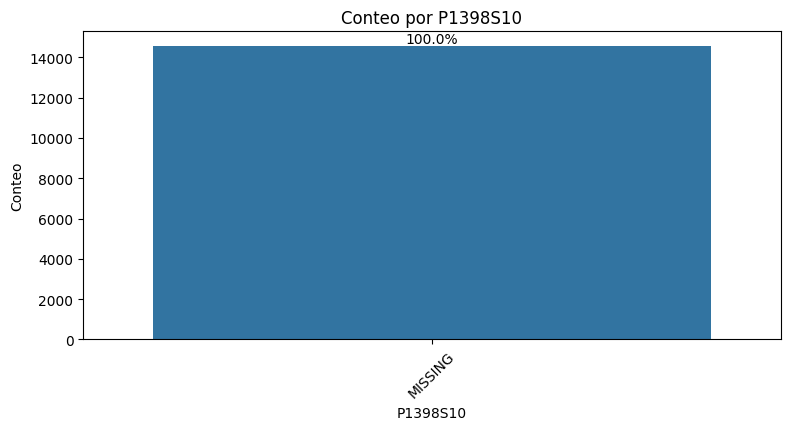

count     14562
unique        2
top          Si
freq       8056
Name: P1398S12, dtype: object


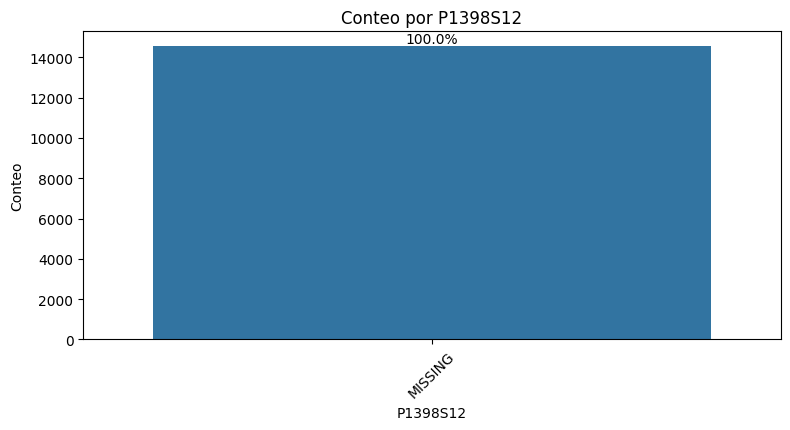

count     14562
unique        2
top          No
freq      14201
Name: P1398S11, dtype: object


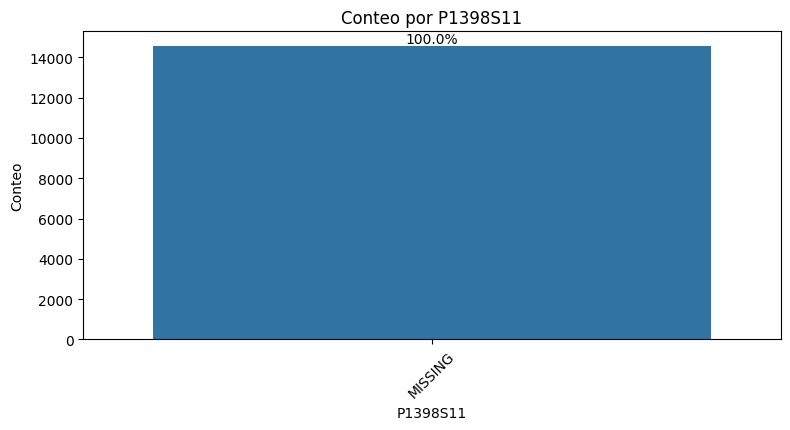

count     14562
unique        1
top          No
freq      14562
Name: P1398S13, dtype: object


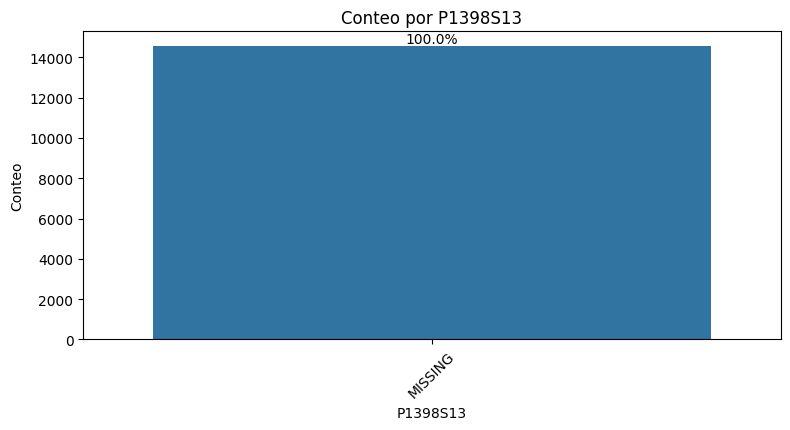

count     14562
unique        1
top          No
freq      14562
Name: P1398S14, dtype: object


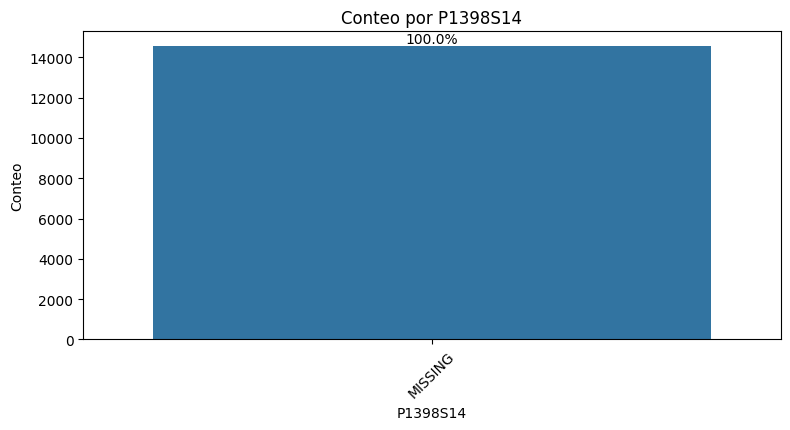

count     14562
unique        1
top          No
freq      14562
Name: P1398S15, dtype: object


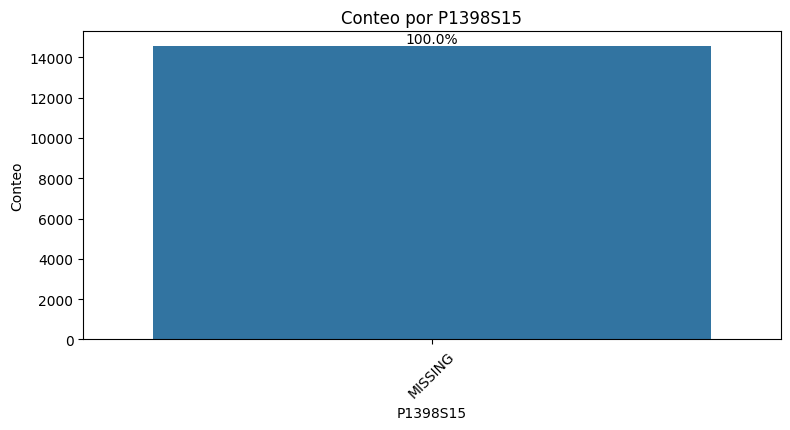

count     14562
unique        1
top          No
freq      14562
Name: P1398S16, dtype: object


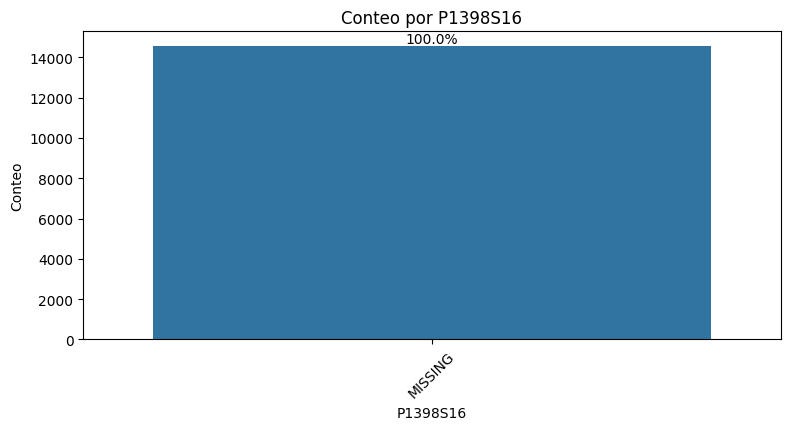

count     14562
unique        2
top          No
freq      14312
Name: P1398S17, dtype: object


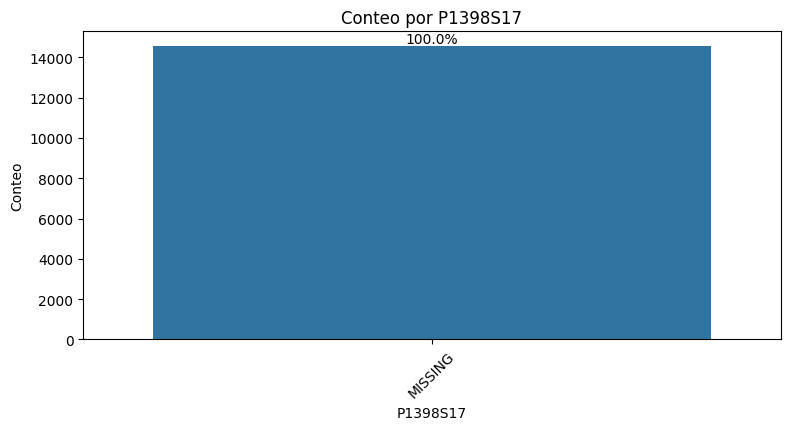

count     14562
unique        2
top          No
freq      14447
Name: P1398S18, dtype: object


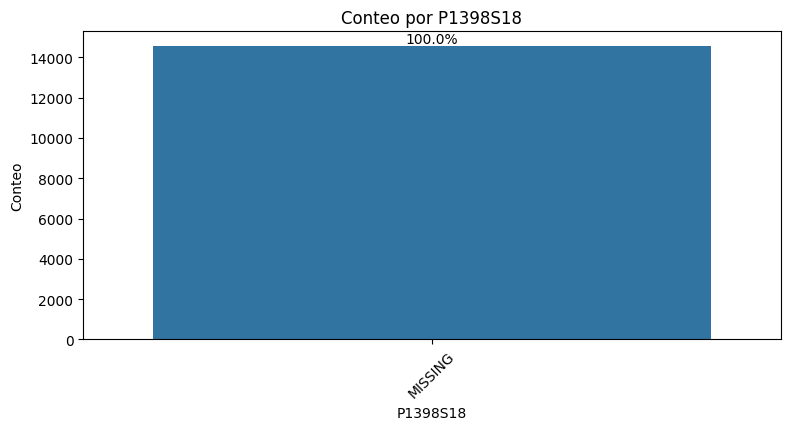

count     14562
unique        2
top          No
freq      14030
Name: P1398S19, dtype: object


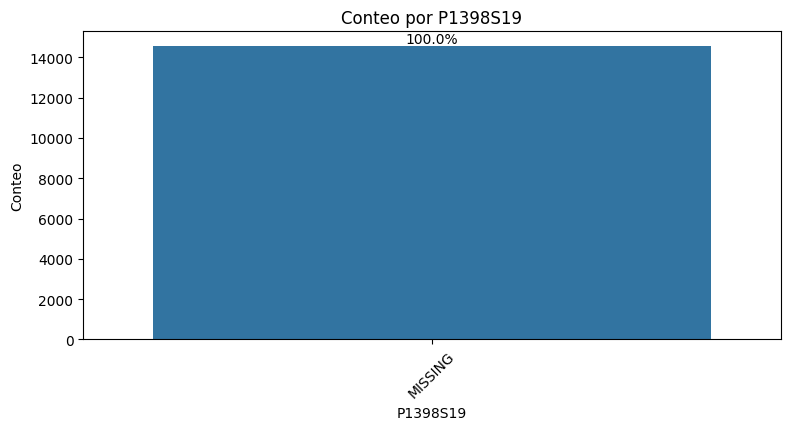

count     14562
unique        2
top          No
freq      12025
Name: P1398S20, dtype: object


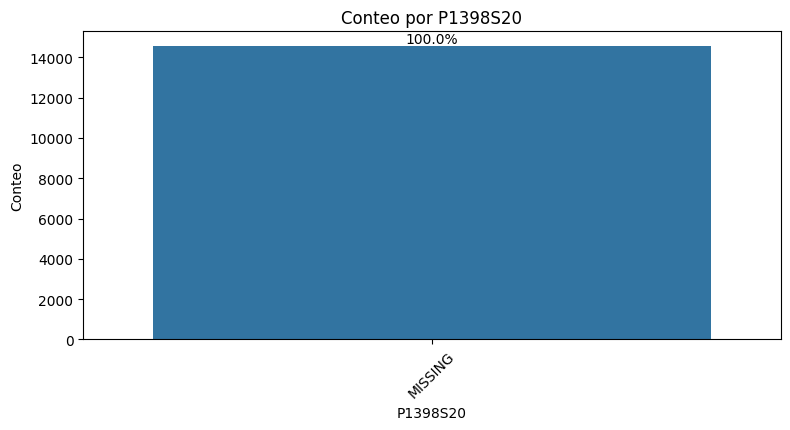

count     14562
unique        2
top          No
freq      14271
Name: P1398S21, dtype: object


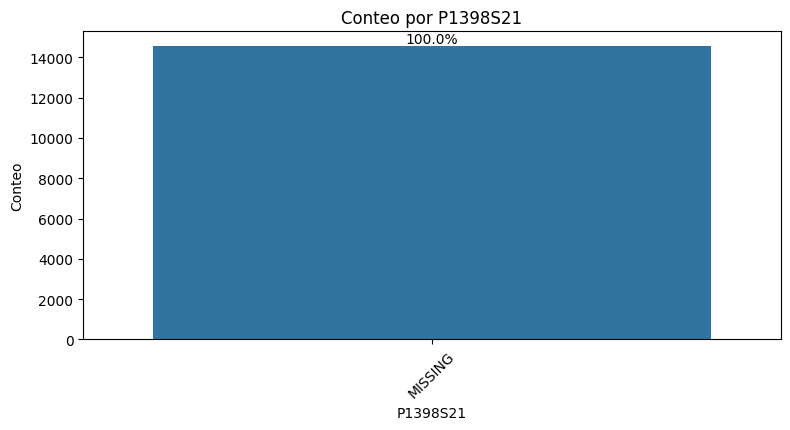

count     14562
unique        2
top          No
freq      14049
Name: P1398S22, dtype: object


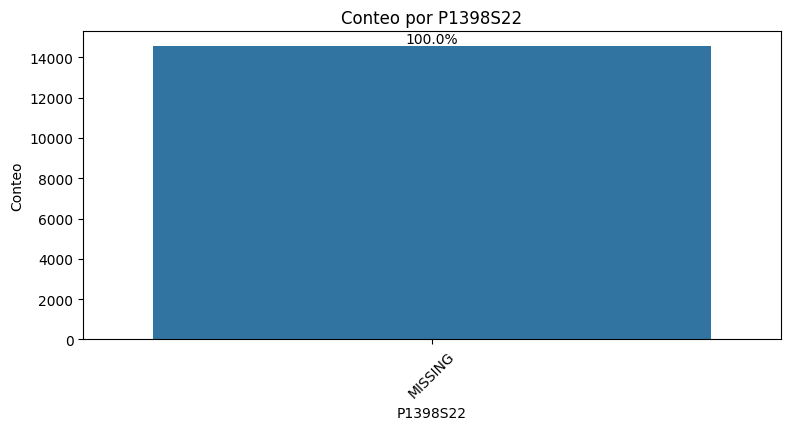

count     14562
unique        2
top          No
freq       9059
Name: P1590S1, dtype: object


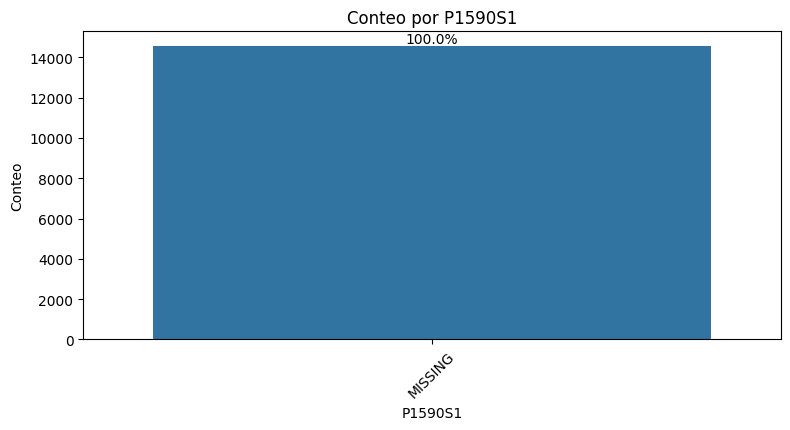

count     14562
unique        2
top          No
freq       8633
Name: P1590S2, dtype: object


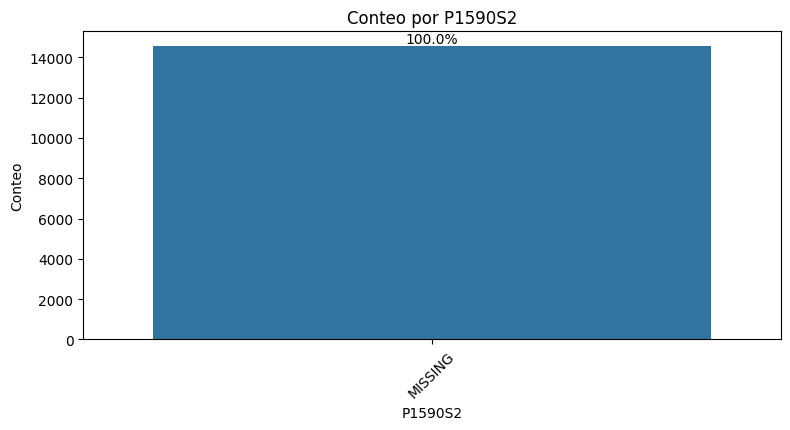

count     14562
unique        2
top          No
freq      13262
Name: P1590S3, dtype: object


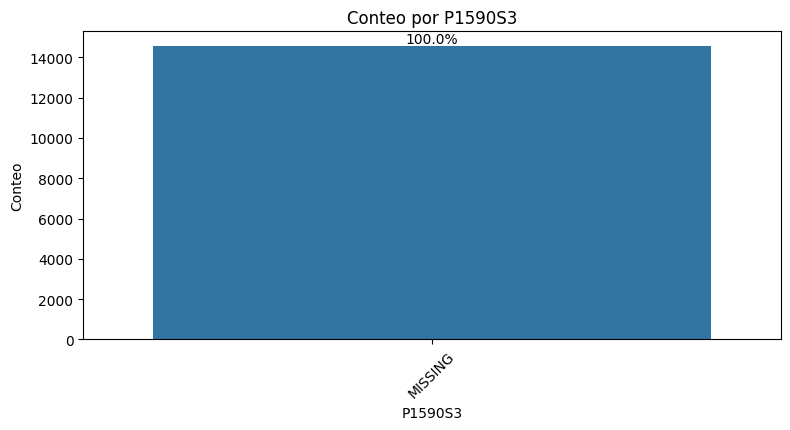

count     14562
unique        2
top          No
freq      14454
Name: P1590S4, dtype: object


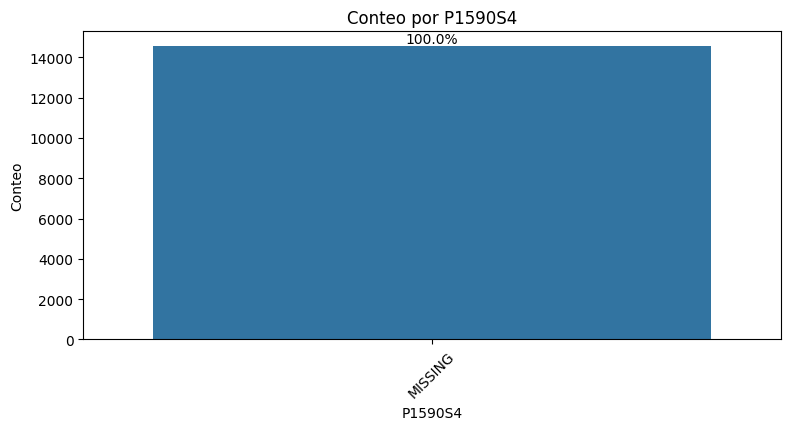

count     14562
unique        2
top          No
freq      13799
Name: P1590S5, dtype: object


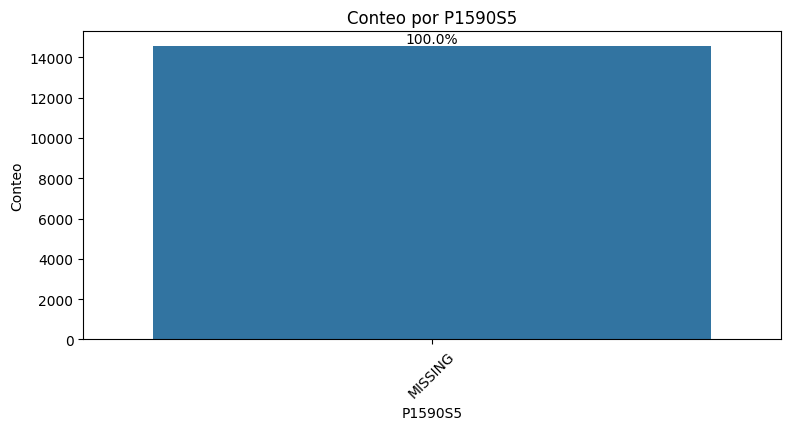

count     14562
unique        2
top          No
freq      13433
Name: P1361S1, dtype: object


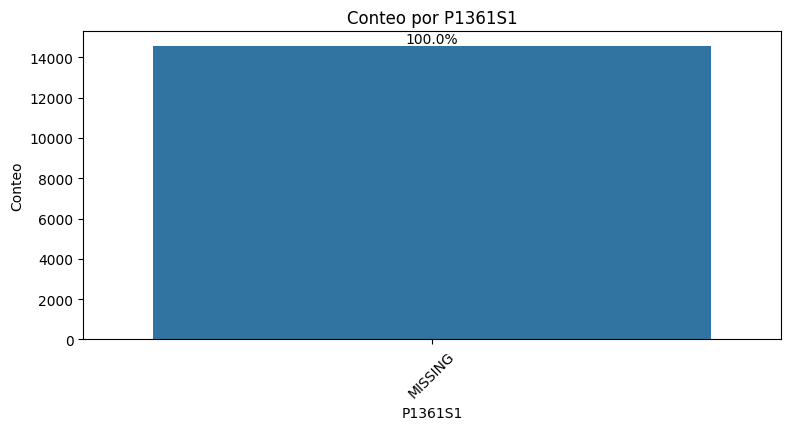

count     14562
unique        2
top          No
freq      13633
Name: P1361S15, dtype: object


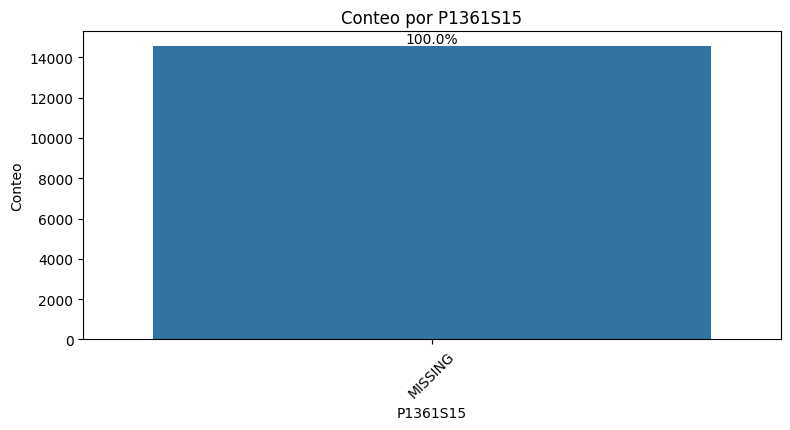

count     14562
unique        2
top          No
freq      14279
Name: P1361S14, dtype: object


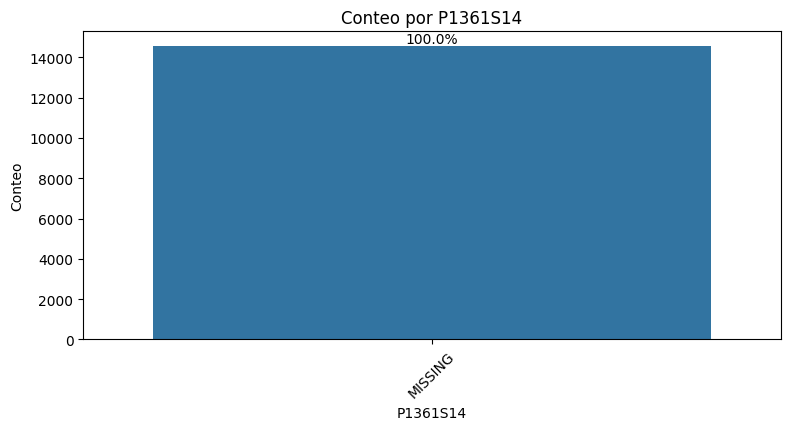

count     14562
unique        2
top          No
freq      12250
Name: P1361S2, dtype: object


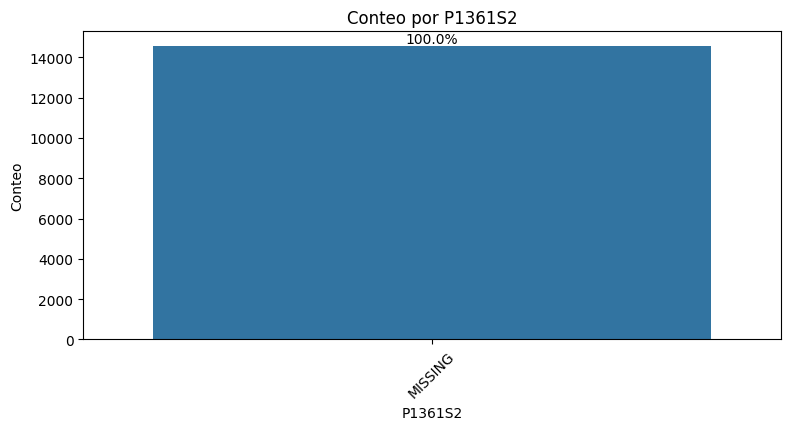

count     14562
unique        2
top          No
freq      11998
Name: P1361S16, dtype: object


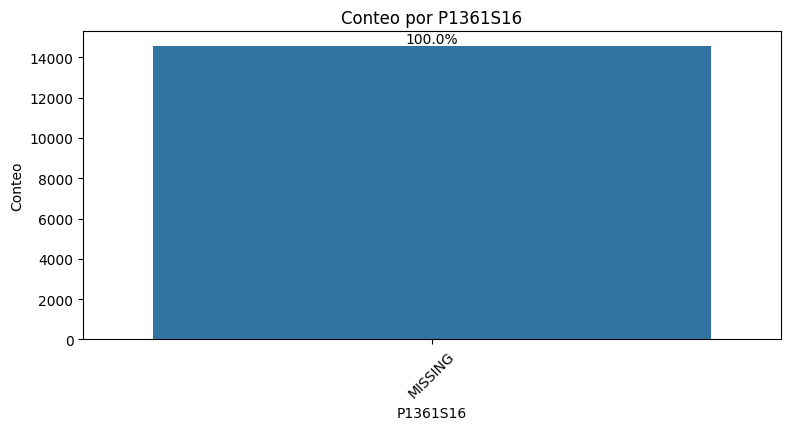

count     14562
unique        2
top          No
freq      11817
Name: P1361S3, dtype: object


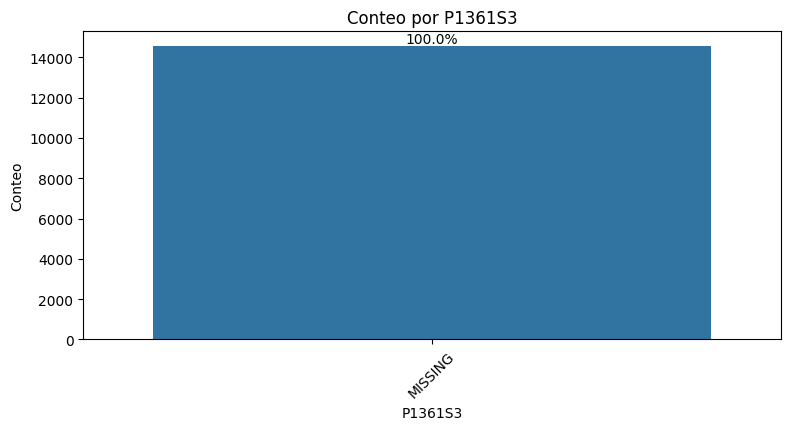

count     14562
unique        2
top          No
freq      11385
Name: P1361S4, dtype: object


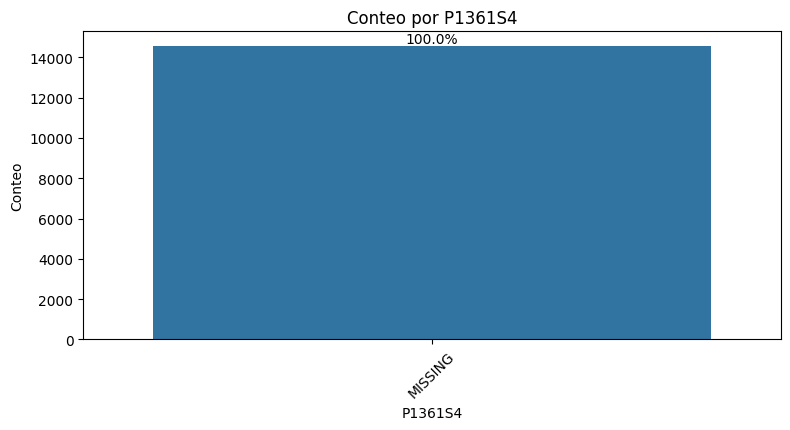

count     14562
unique        2
top          No
freq      12135
Name: P1361S5, dtype: object


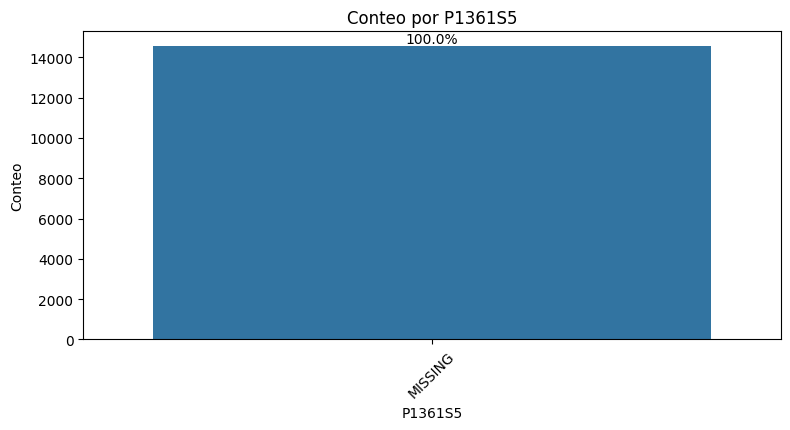

count     14562
unique        2
top          No
freq      12740
Name: P1361S6, dtype: object


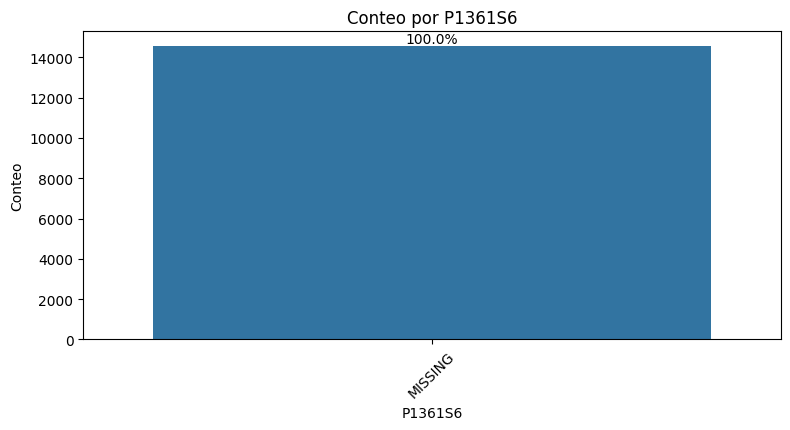

count     14562
unique        2
top          No
freq      12169
Name: P1361S7, dtype: object


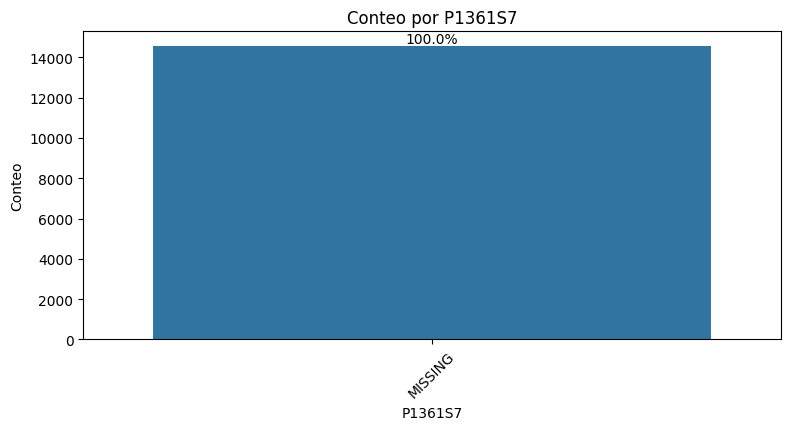

count     14562
unique        2
top          No
freq      12446
Name: P1361S11, dtype: object


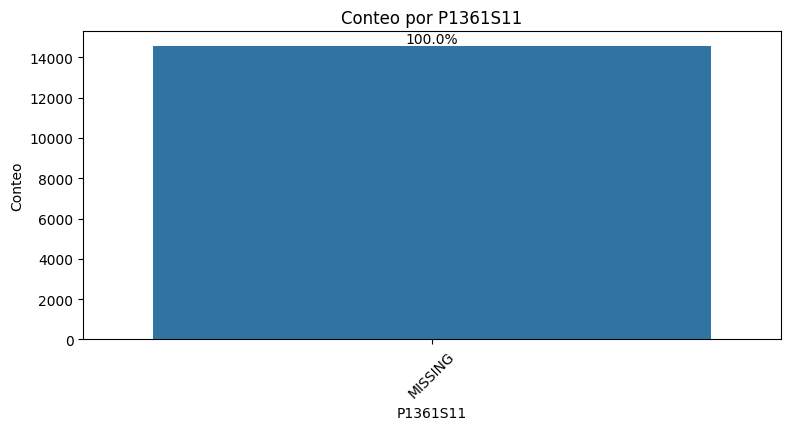

count     14562
unique        2
top          No
freq      13403
Name: P1361S8, dtype: object


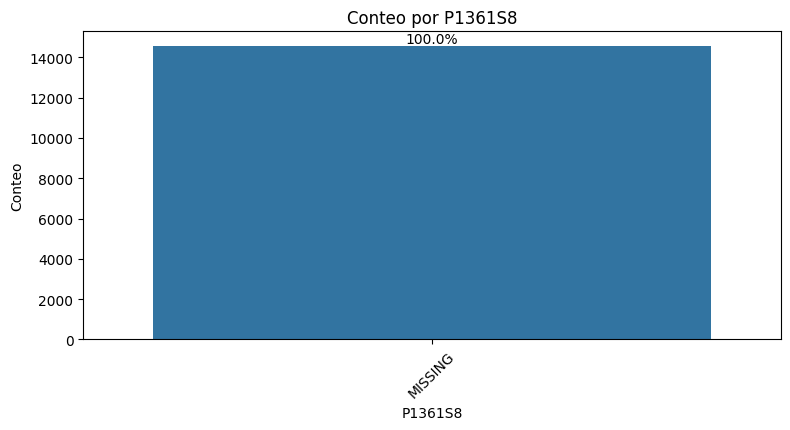

count     14562
unique        2
top          No
freq      14329
Name: P1361S9, dtype: object


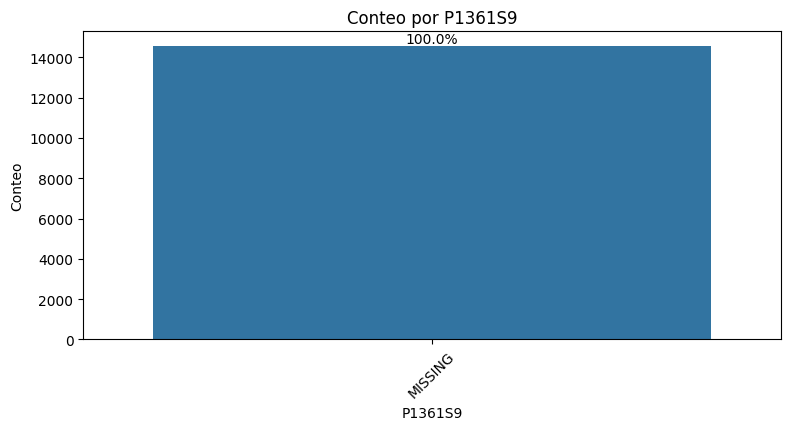

count     14562
unique        2
top          No
freq      14071
Name: P1361S10, dtype: object


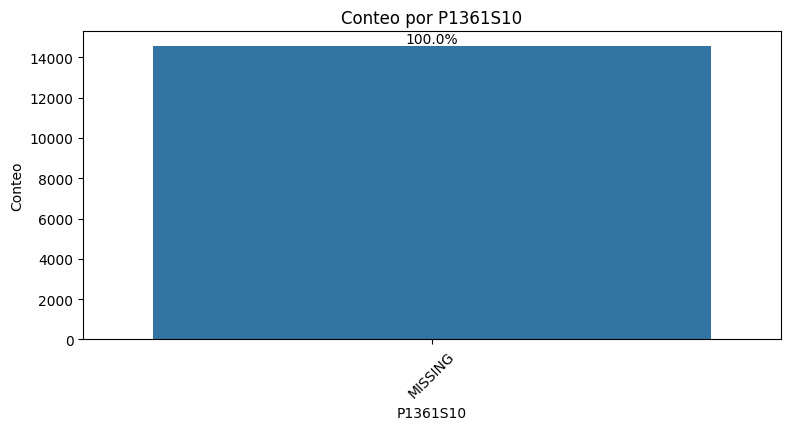

count     14562
unique        1
top          No
freq      14562
Name: P1361S12, dtype: object


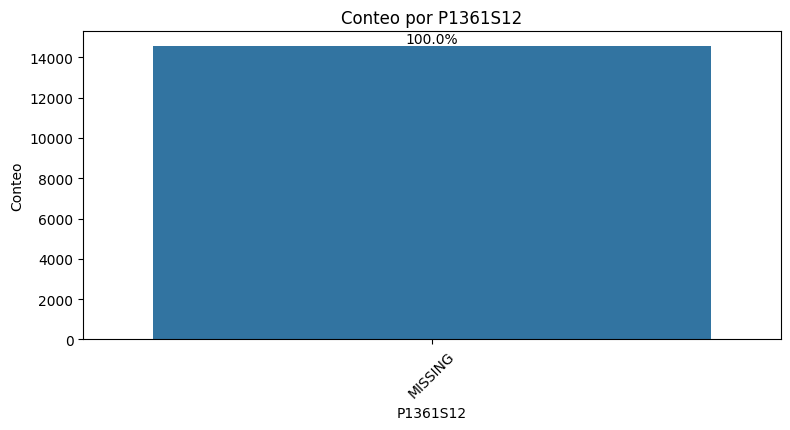

count     14562
unique        1
top          No
freq      14562
Name: P1361S13, dtype: object


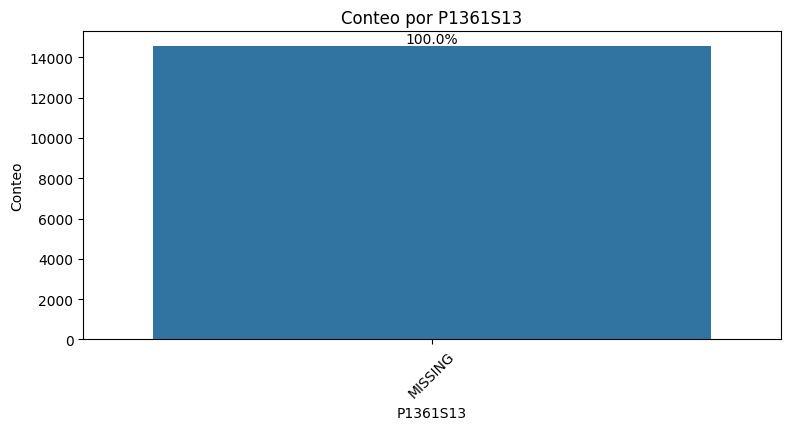

count     14562
unique        2
top          No
freq      11686
Name: P1358S1, dtype: object


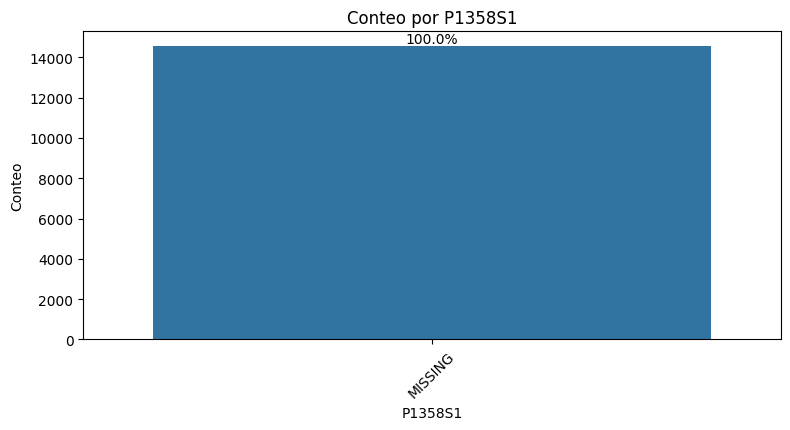

count     14562
unique        2
top          No
freq      12175
Name: P1358S14, dtype: object


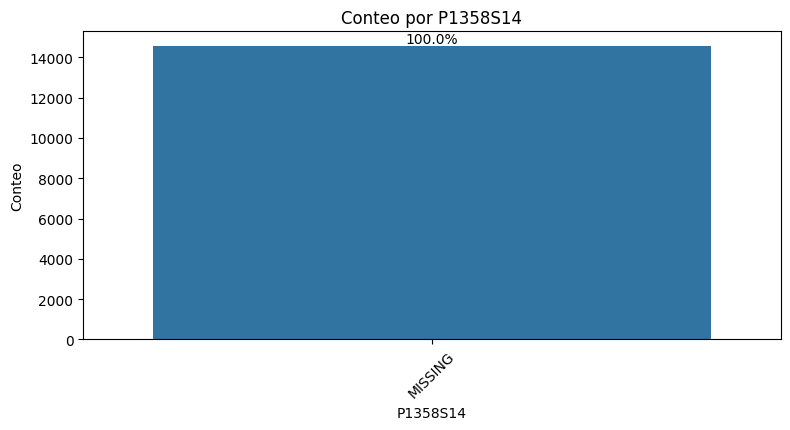

count     14562
unique        2
top          No
freq      13792
Name: P1358S13, dtype: object


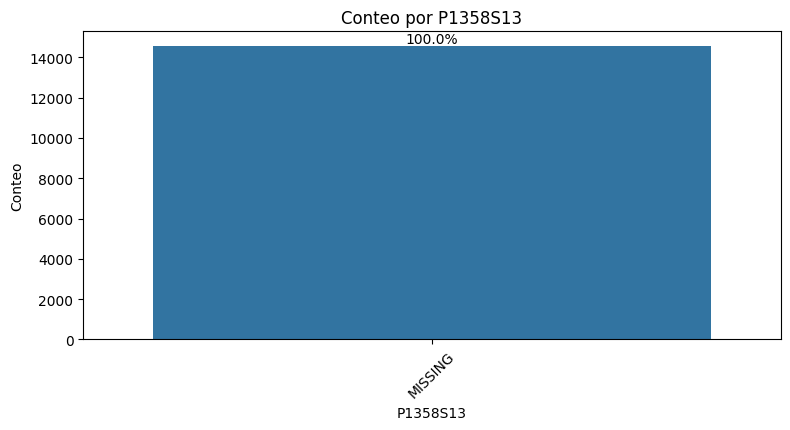

count     14562
unique        2
top          Si
freq       8175
Name: P1358S2, dtype: object


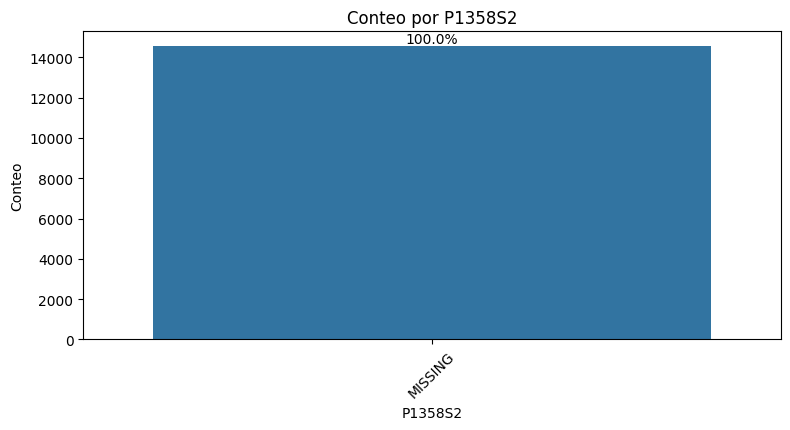

count     14562
unique        2
top          Si
freq       7517
Name: P1358S15, dtype: object


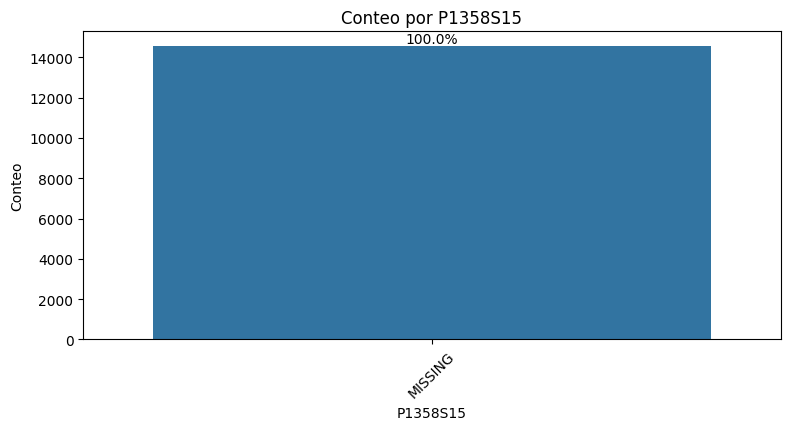

count     14562
unique        2
top          Si
freq       7294
Name: P1358S3, dtype: object


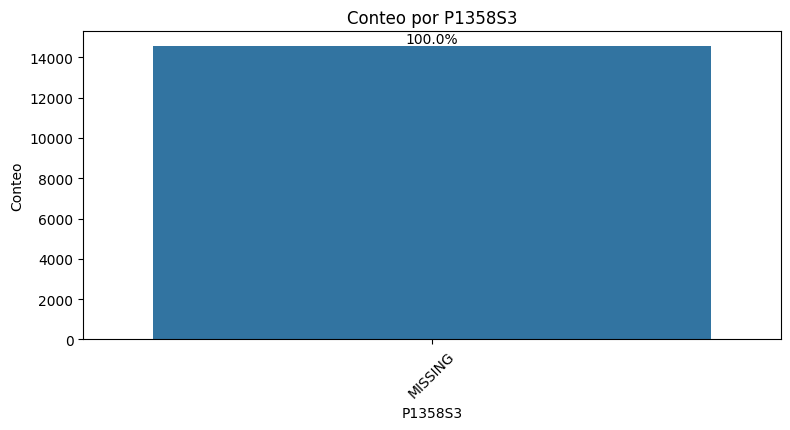

count     14562
unique        2
top          Si
freq       8624
Name: P1358S4, dtype: object


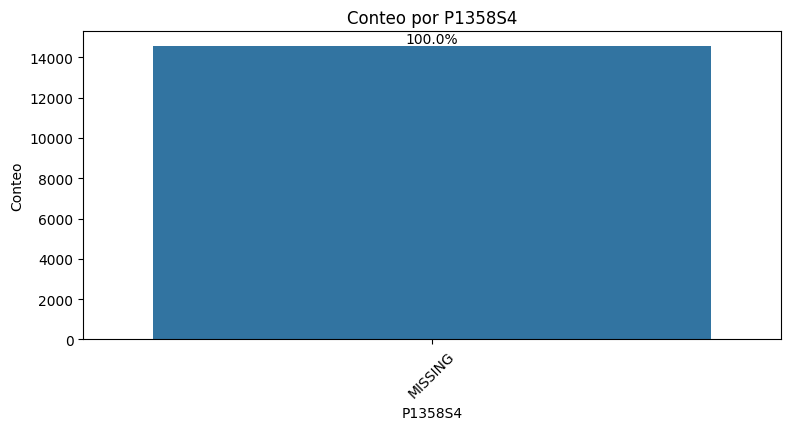

count     14562
unique        2
top          No
freq       7320
Name: P1358S5, dtype: object


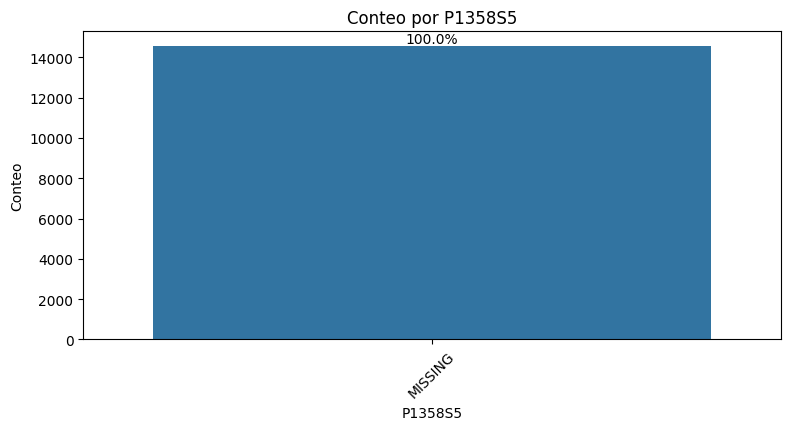

count     14562
unique        2
top          No
freq       9086
Name: P1358S6, dtype: object


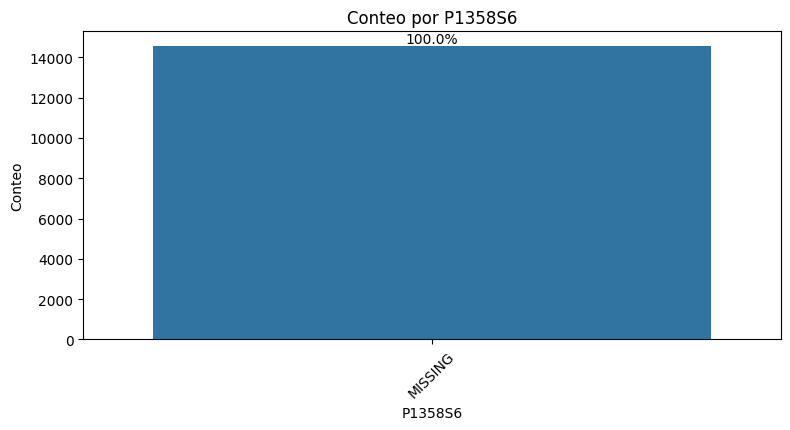

count     14562
unique        2
top          No
freq       7355
Name: P1358S7, dtype: object


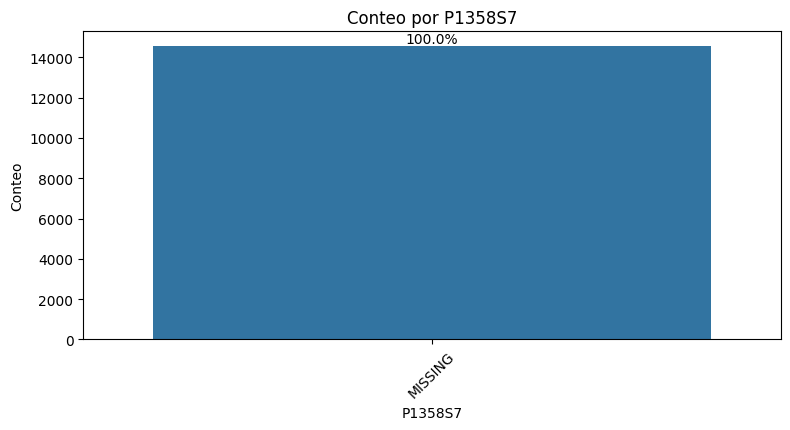

count     14562
unique        2
top          No
freq       8455
Name: P1358S12, dtype: object


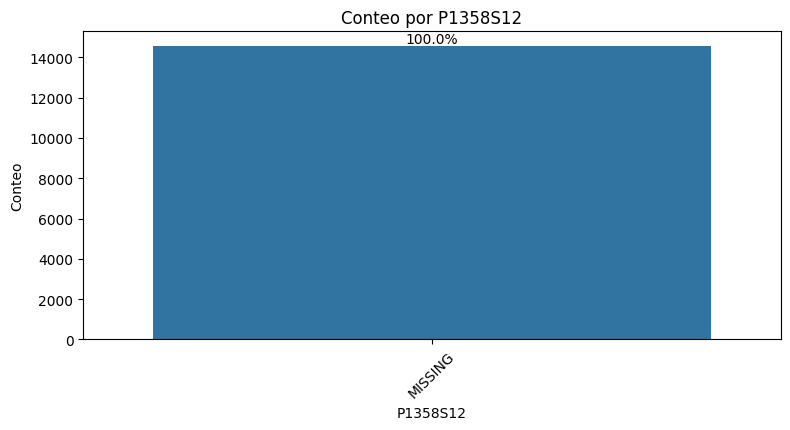

count     14562
unique        2
top          No
freq      11039
Name: P1358S8, dtype: object


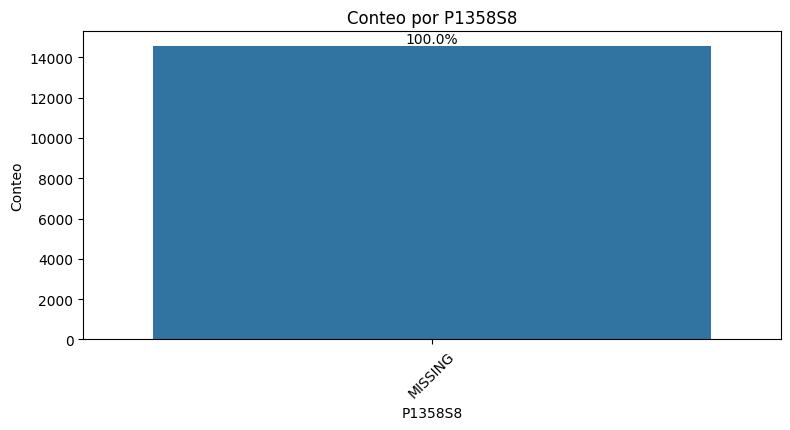

count     14562
unique        2
top          No
freq      13480
Name: P1358S9, dtype: object


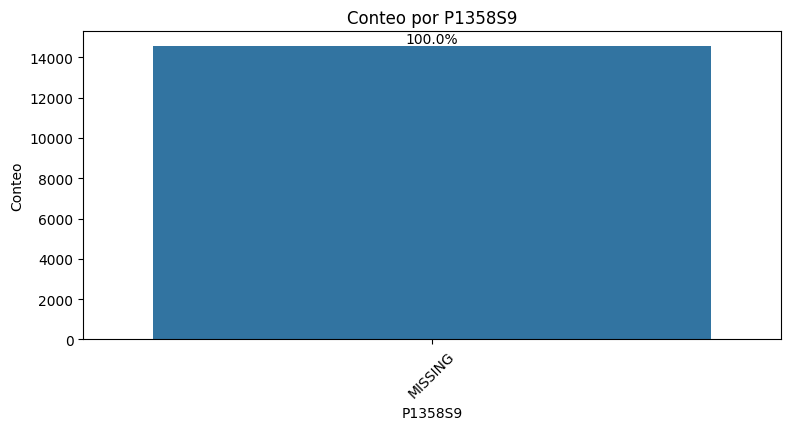

count     14562
unique        2
top          No
freq      12361
Name: P1358S11, dtype: object


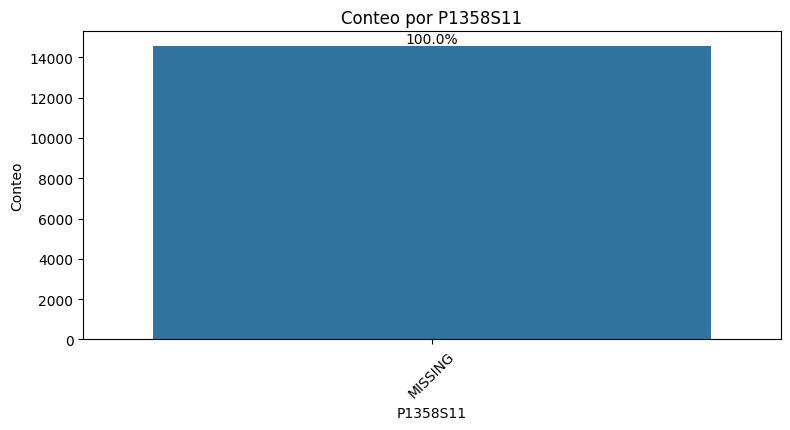

count     14562
unique        2
top          No
freq      10022
Name: P1358S10, dtype: object


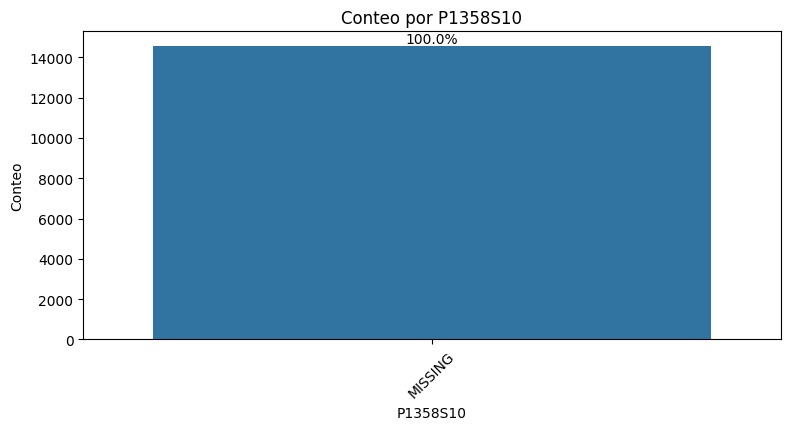

count     14562
unique        2
top          No
freq      13234
Name: P3302S1, dtype: object


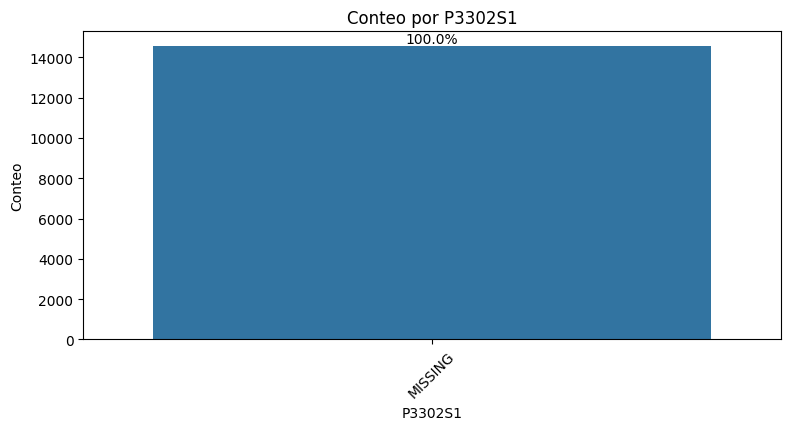

count     14562
unique        2
top          No
freq      13741
Name: P3302S2, dtype: object


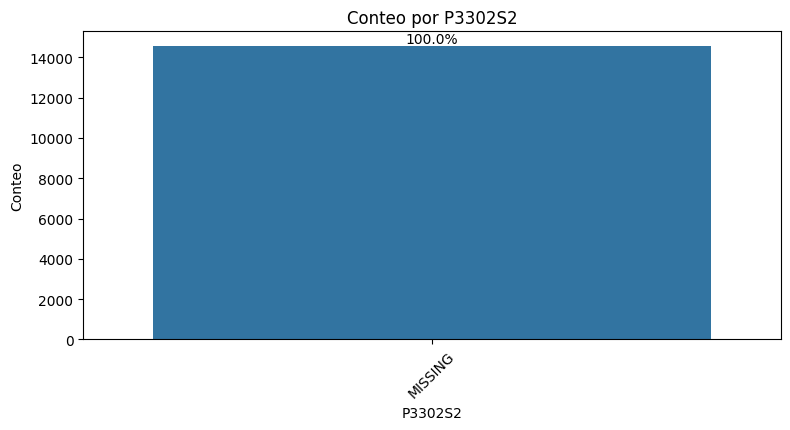

count     14562
unique        2
top          No
freq      14337
Name: P3302S3, dtype: object


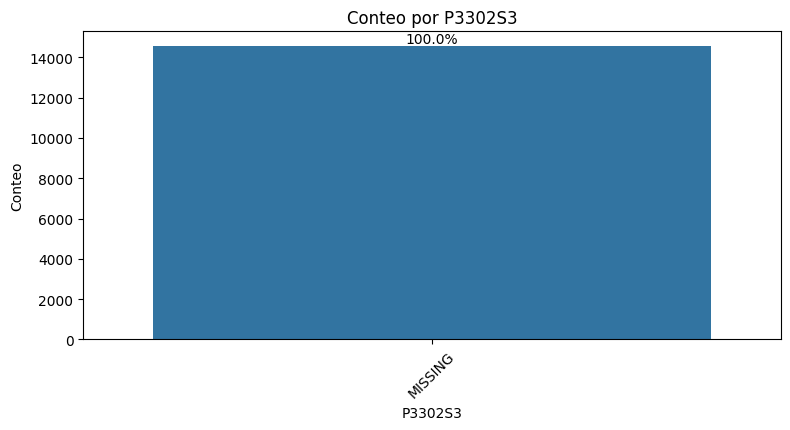

count     14562
unique        2
top          No
freq      14470
Name: P3302S4, dtype: object


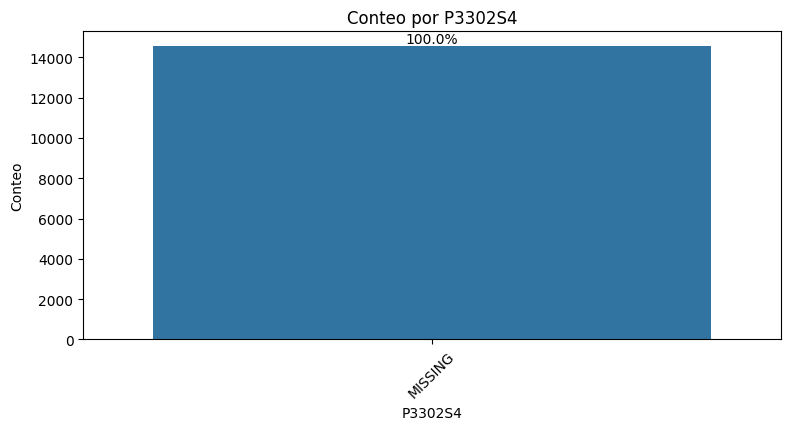

count     14562
unique        2
top          No
freq      14485
Name: P3302S5, dtype: object


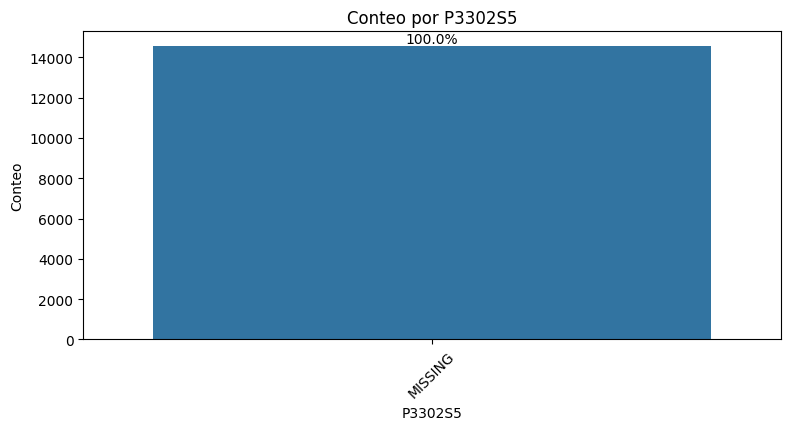

count     14562
unique        2
top          No
freq      14548
Name: P3302S6, dtype: object


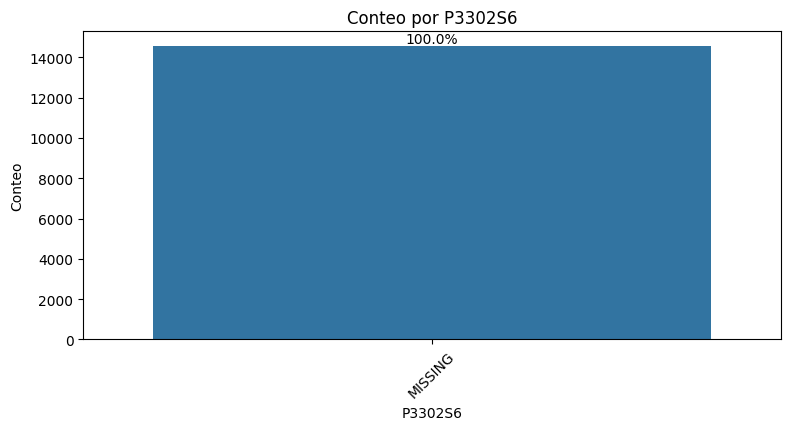

count     14562
unique        2
top          No
freq      14473
Name: P3302S7, dtype: object


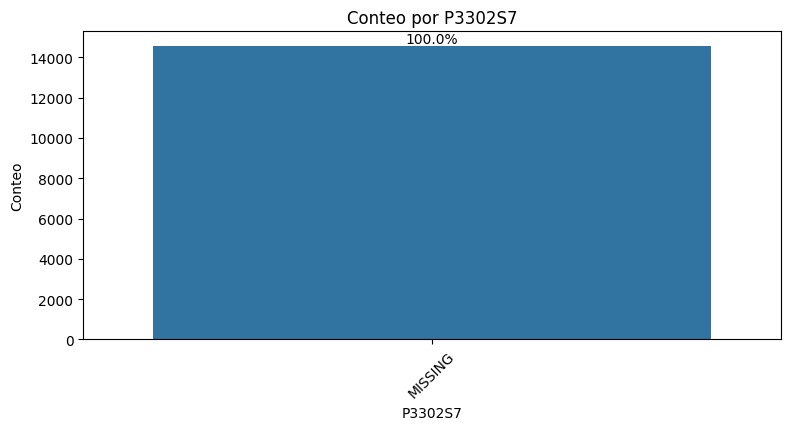

count     14562
unique        2
top          No
freq      14510
Name: P3302S8, dtype: object


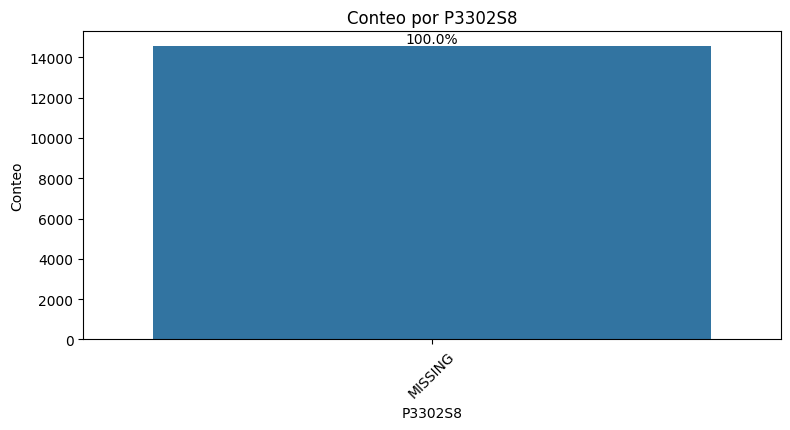

count     14562
unique        2
top          No
freq      14506
Name: P3306, dtype: object


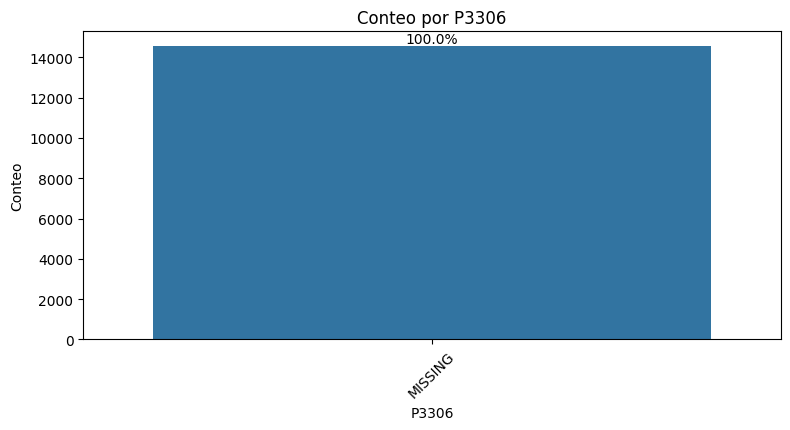

count     14562
unique        2
top          No
freq      14450
Name: P3307, dtype: object


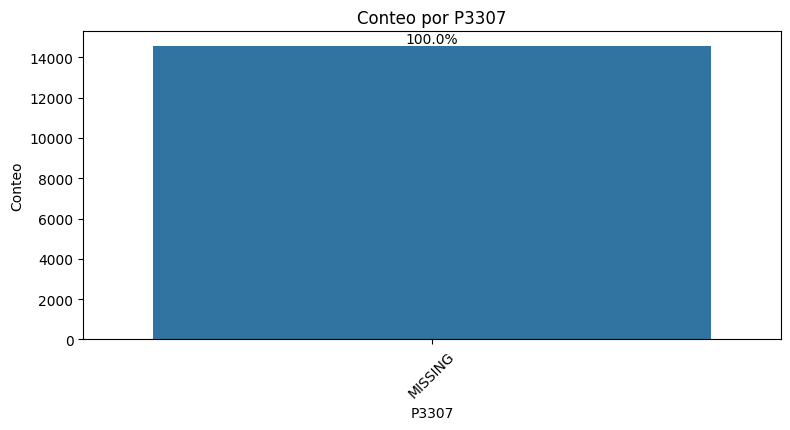

count     14562
unique        2
top          No
freq      14519
Name: P3308, dtype: object


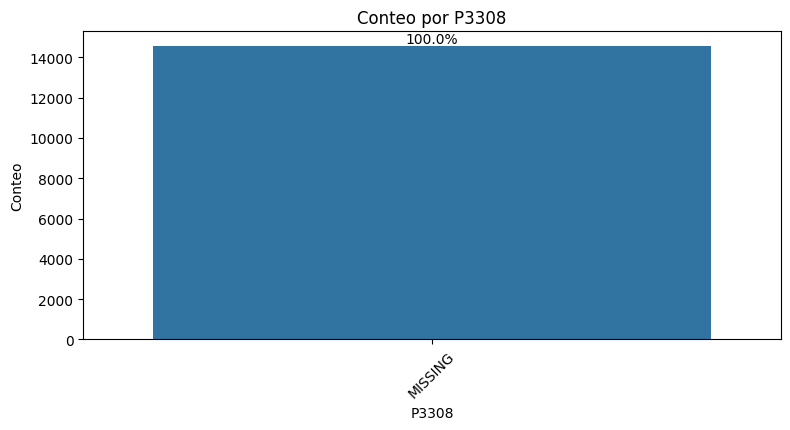

count     14562
unique        2
top          No
freq      14533
Name: P3309, dtype: object


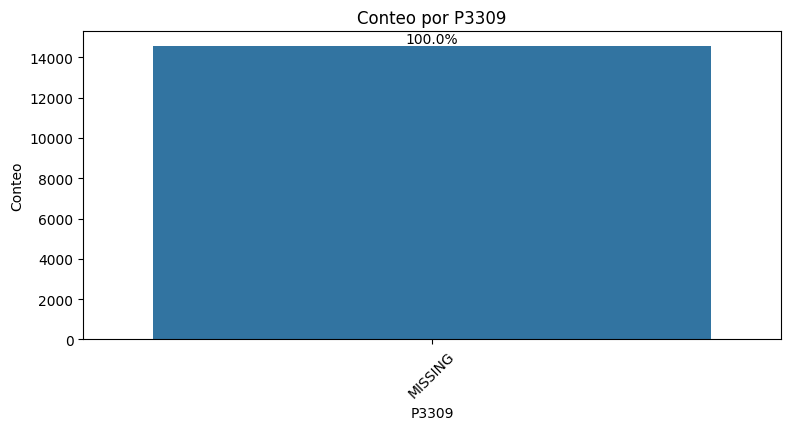

count     14562
unique        2
top          No
freq      14554
Name: P33010, dtype: object


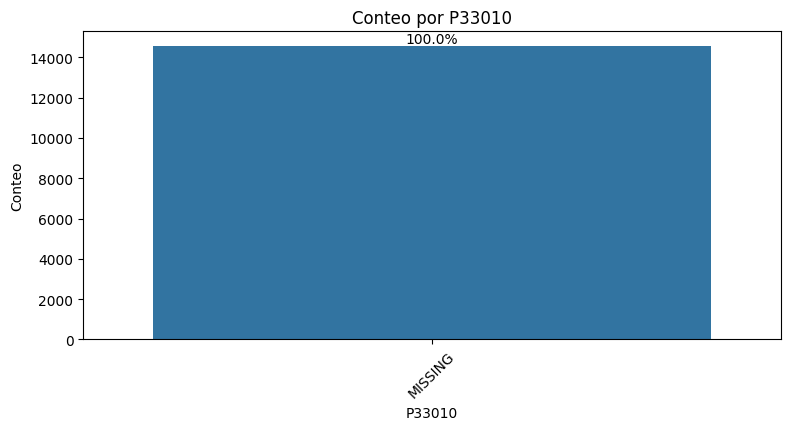

count     14562
unique        2
top          No
freq      14449
Name: P33011, dtype: object


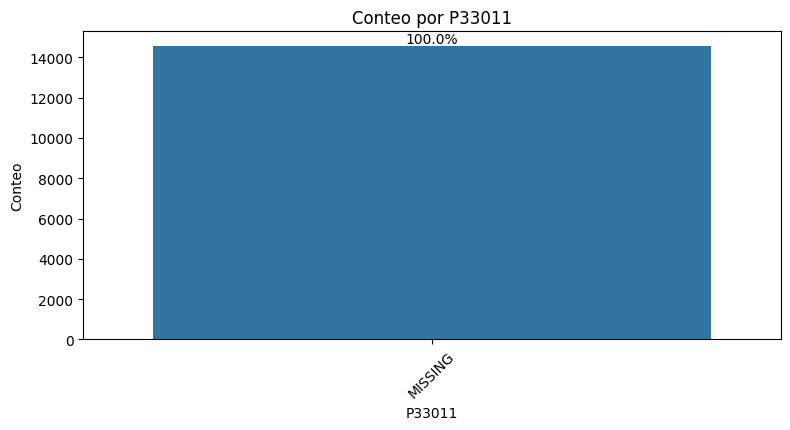

count     14562
unique        2
top          No
freq      14559
Name: P3312, dtype: object


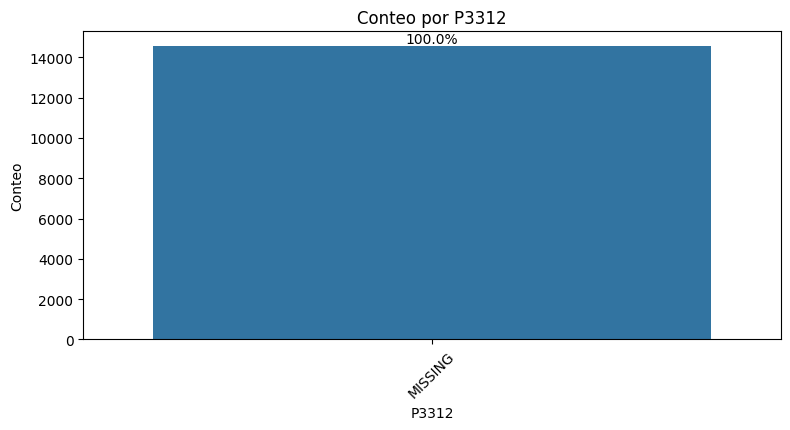

count     14562
unique        2
top          No
freq      11283
Name: P3112S1, dtype: object


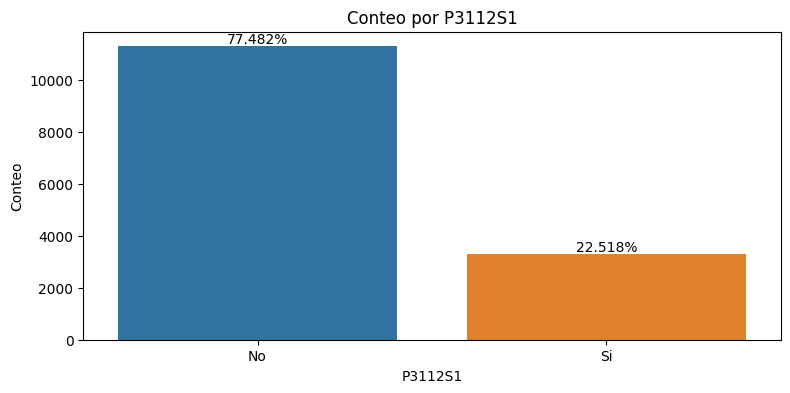

count     14562
unique        2
top          No
freq      10435
Name: P3112S2, dtype: object


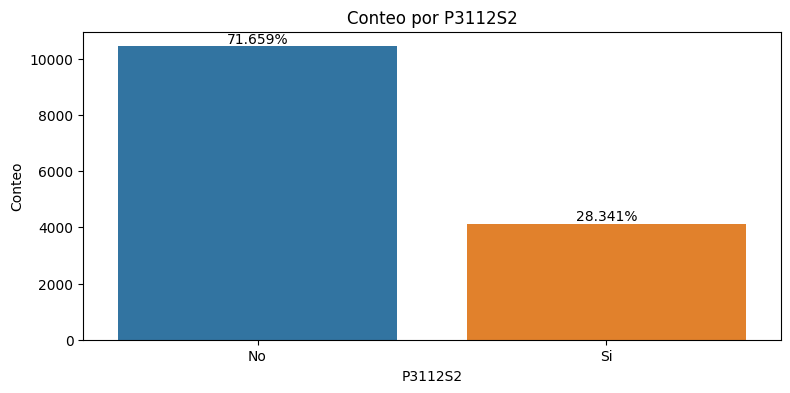

count     14562
unique        2
top          No
freq      12377
Name: P3112S3, dtype: object


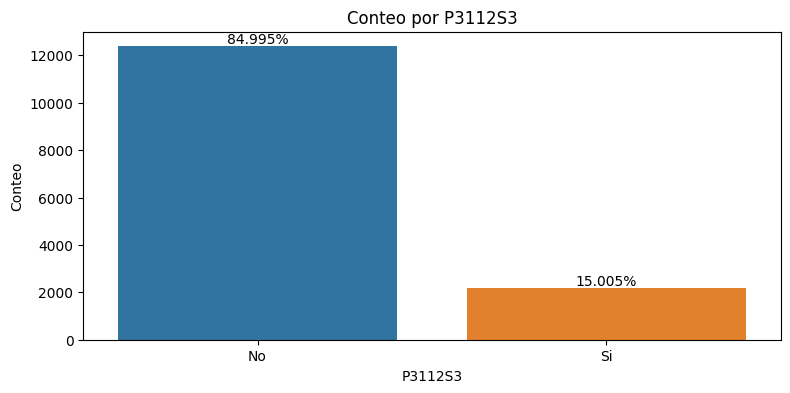

count     14562
unique        2
top          No
freq      11289
Name: P3112S4, dtype: object


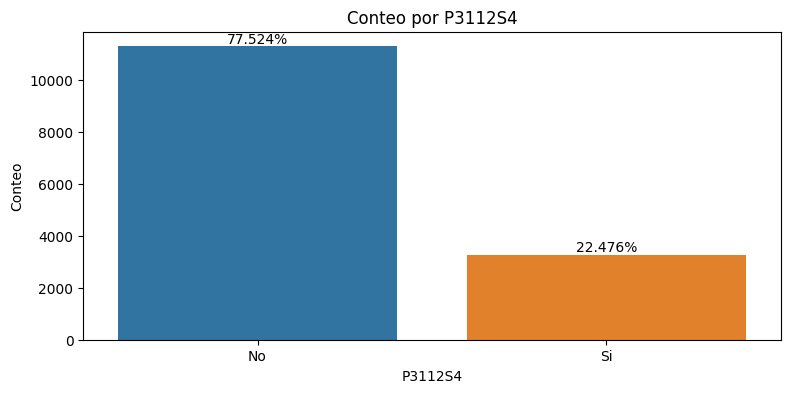

count     14562
unique        2
top          No
freq       9236
Name: P3112S5, dtype: object


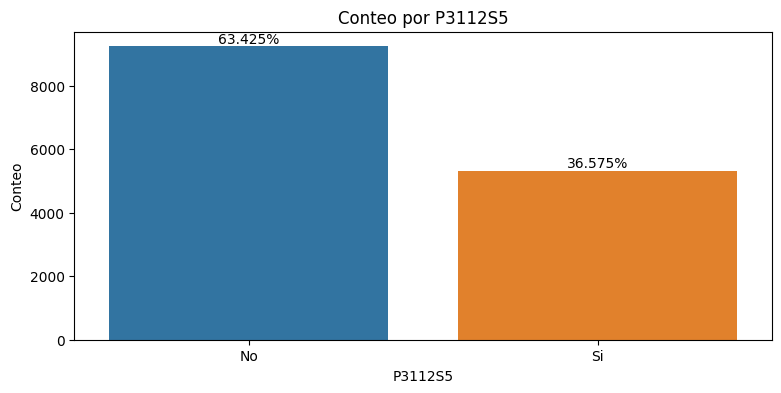

count     14562
unique        2
top          No
freq       8922
Name: P3112S6, dtype: object


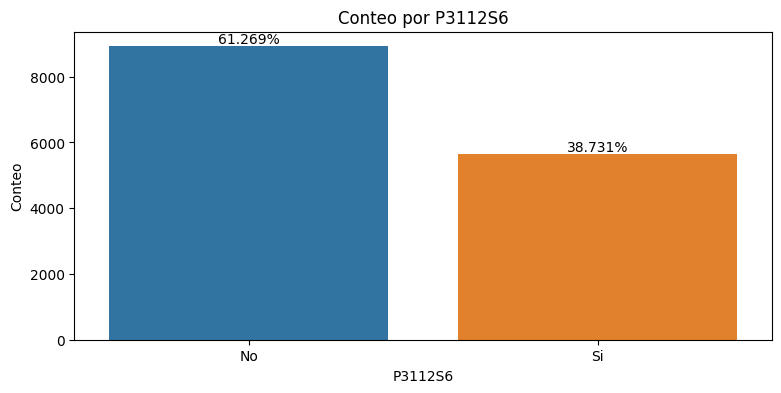

count     14562
unique        2
top          No
freq      13837
Name: P3112S7, dtype: object


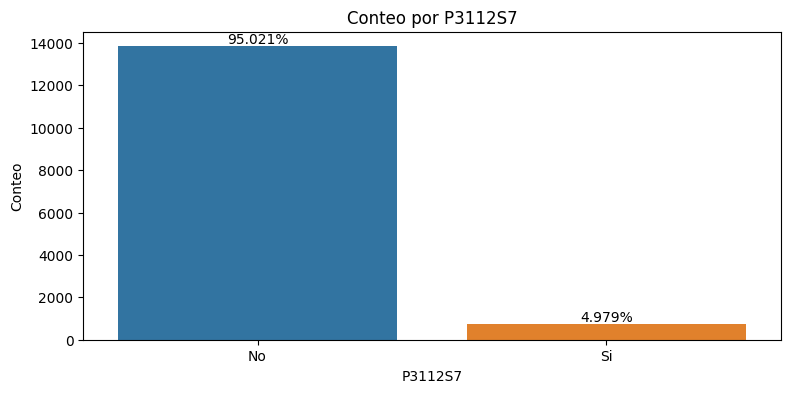

count     14562
unique        2
top          No
freq      13923
Name: P3112S8, dtype: object


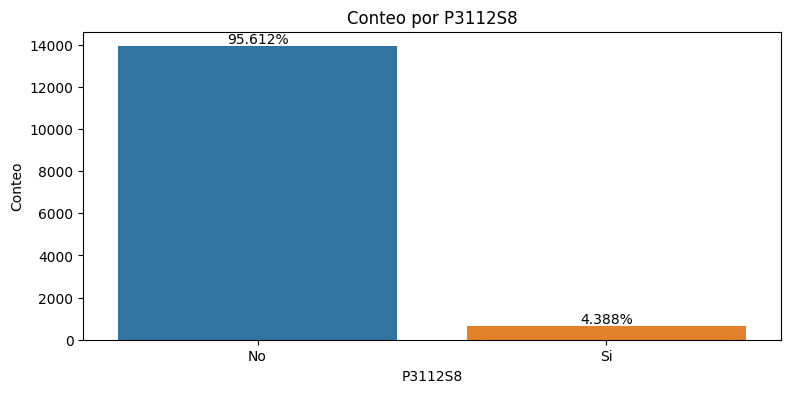

count     14562
unique        2
top          No
freq      13671
Name: P3112S9, dtype: object


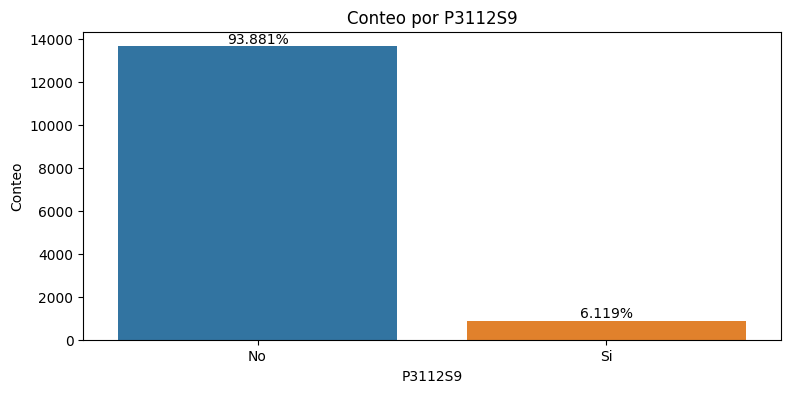

count     14562
unique        2
top          No
freq      13989
Name: P3112S10, dtype: object


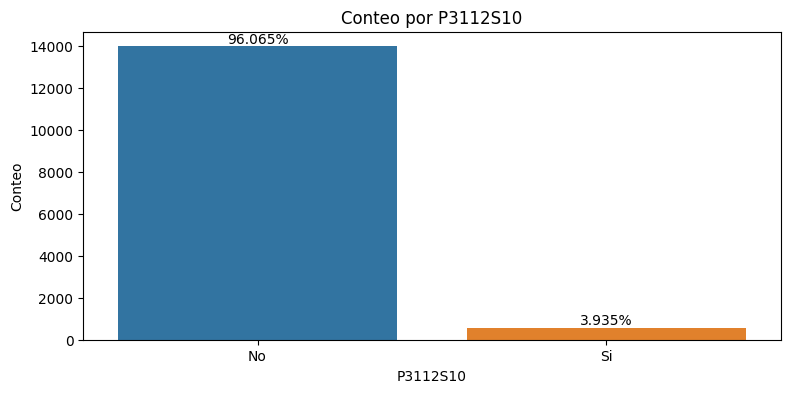

count     14562
unique        2
top          No
freq      14044
Name: P3112S11, dtype: object


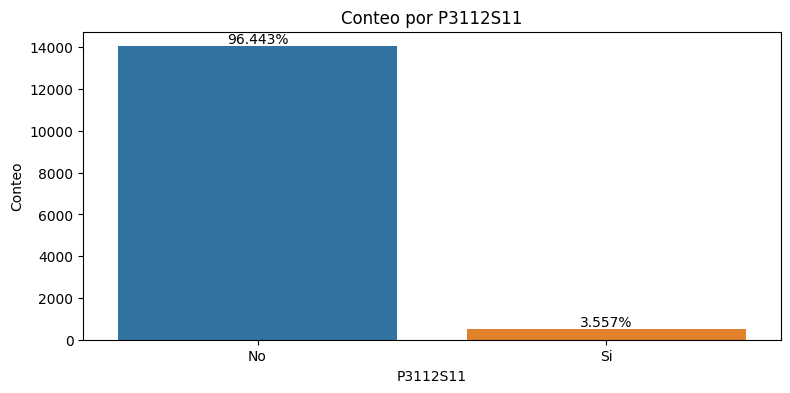

count     14562
unique        2
top          No
freq      10634
Name: P3112S12, dtype: object


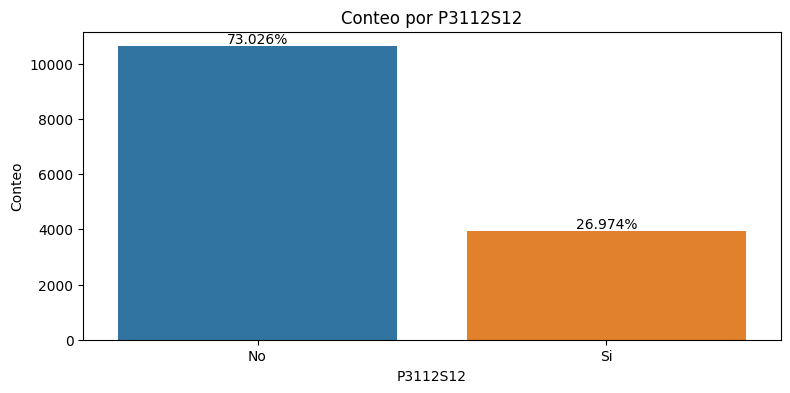

count     14562
unique        2
top          No
freq      12560
Name: P3112S13, dtype: object


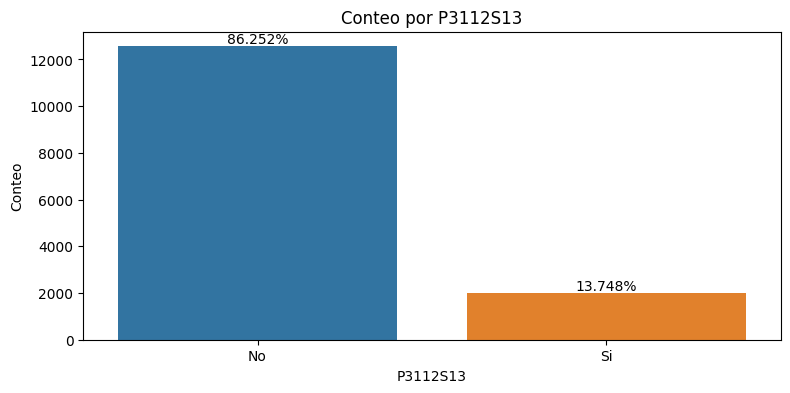

count     14562
unique        2
top          No
freq      14522
Name: P3112S14, dtype: object


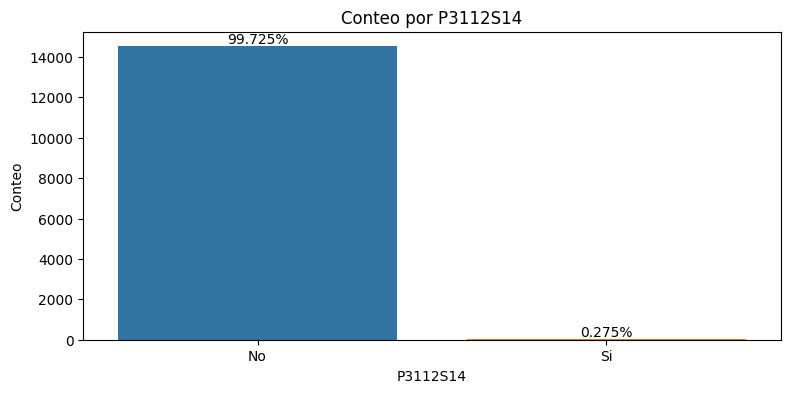

count     14562
unique        2
top          No
freq      13869
Name: P3109S1, dtype: object


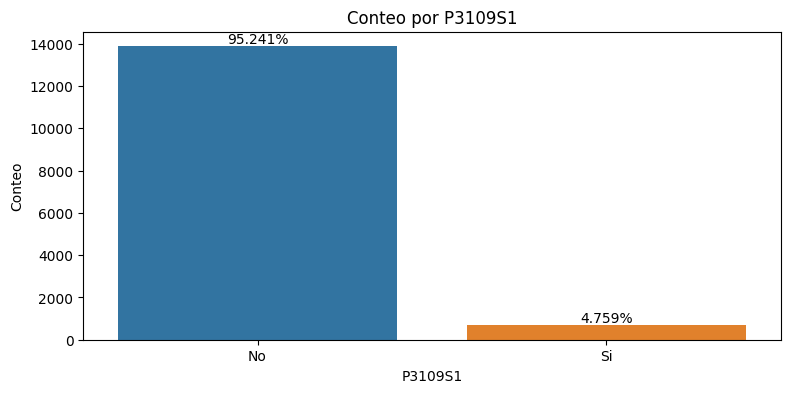

count     14562
unique        2
top          No
freq      10854
Name: P3109S2, dtype: object


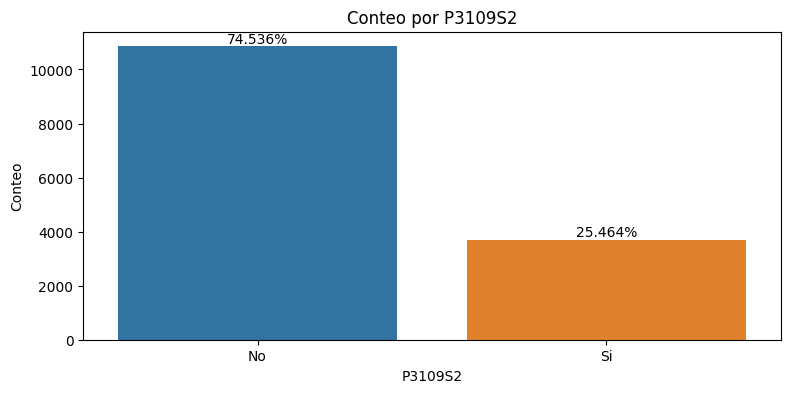

count     14562
unique        2
top          No
freq      13730
Name: P3109S3, dtype: object


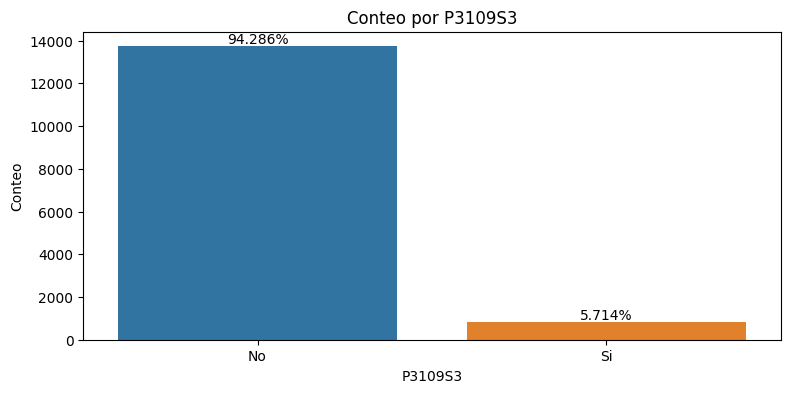

count     14562
unique        2
top          No
freq      14159
Name: P3109S4, dtype: object


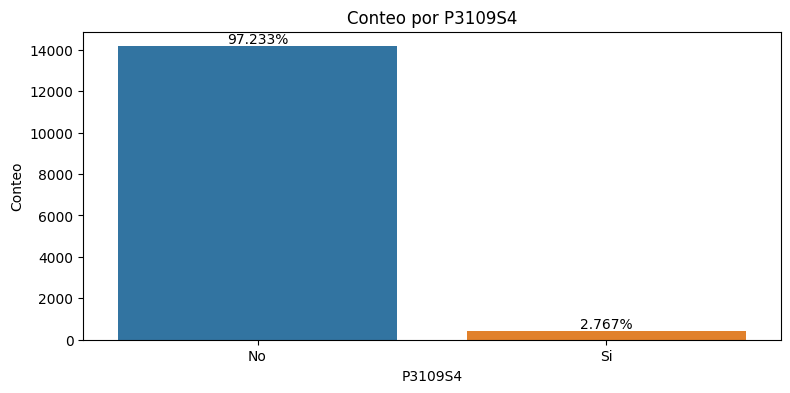

count     14562
unique        2
top          No
freq      14203
Name: P3109S5, dtype: object


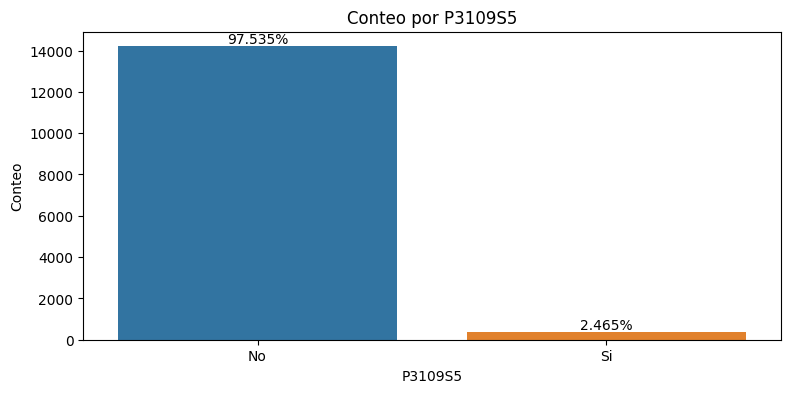

count     14562
unique        2
top          No
freq      14198
Name: P3109S6, dtype: object


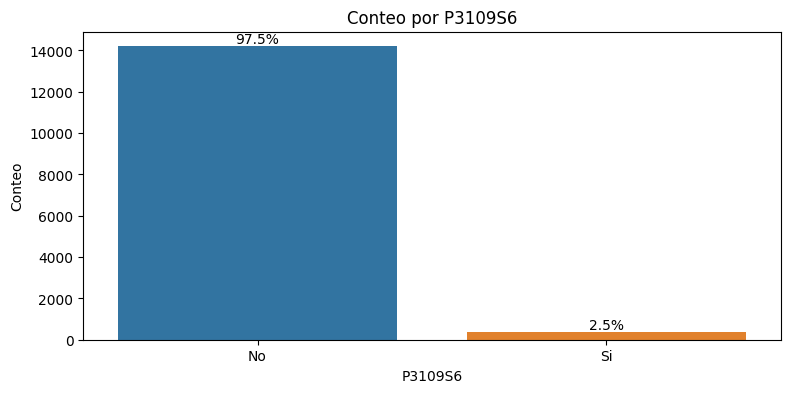

count     14562
unique        2
top          No
freq      14260
Name: P3109S7, dtype: object


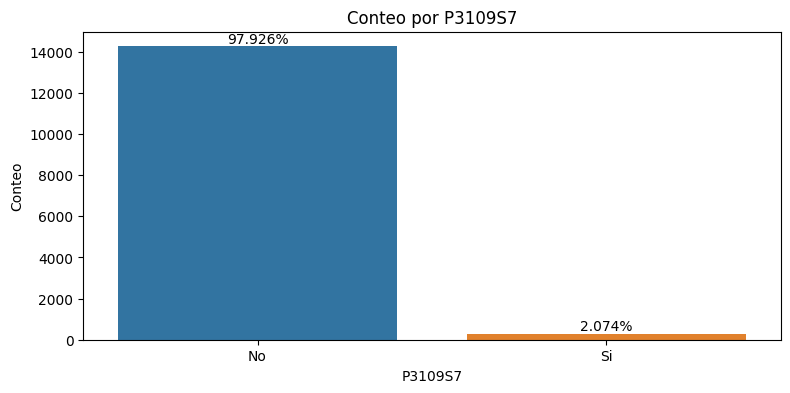

count     14562
unique        2
top          No
freq      14345
Name: P3109S16, dtype: object


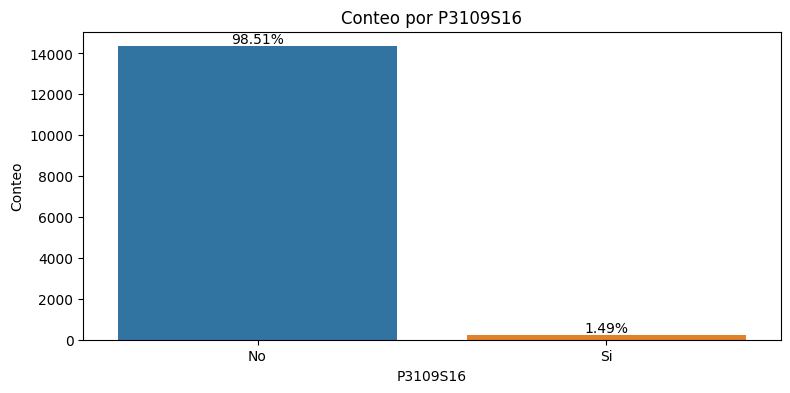

count     14562
unique        2
top          No
freq      14494
Name: P3109S17, dtype: object


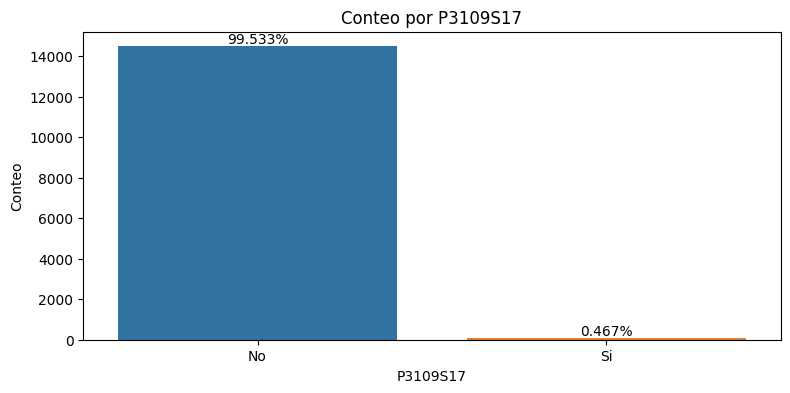

count     14562
unique        2
top          No
freq      14511
Name: P3109S9, dtype: object


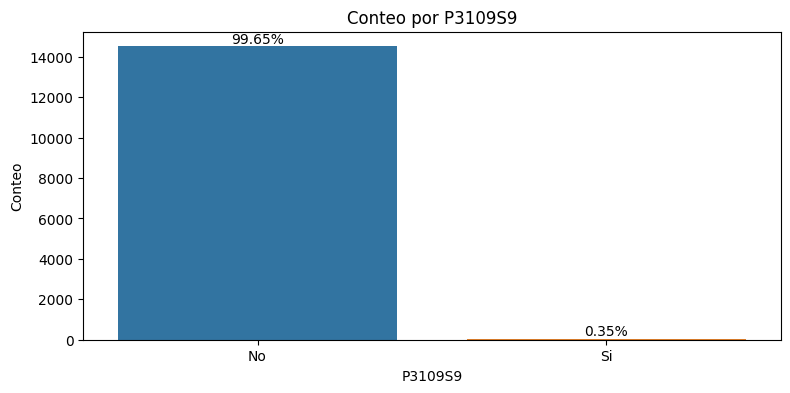

count     14562
unique        2
top          No
freq      14171
Name: P3109S10, dtype: object


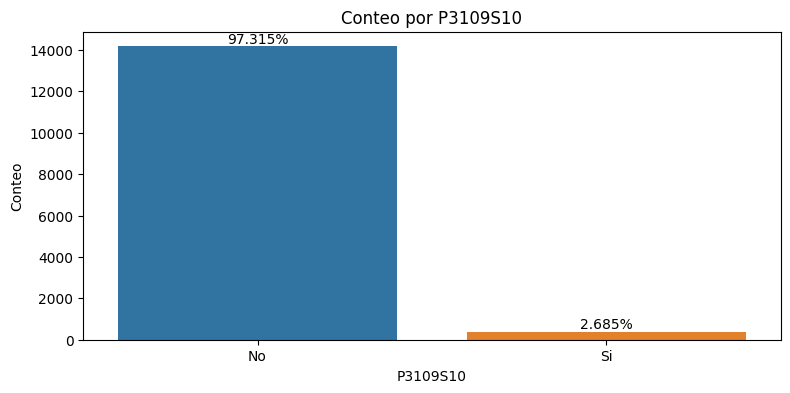

count     14562
unique        2
top          No
freq      14547
Name: P3109S11, dtype: object


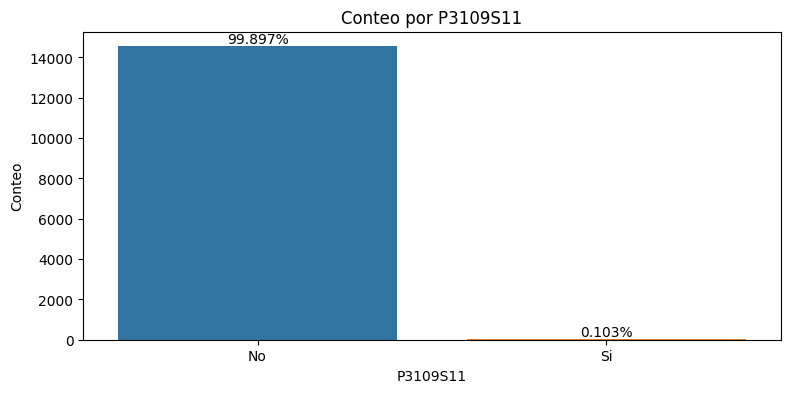

count     14562
unique        2
top          No
freq      14534
Name: P3109S12, dtype: object


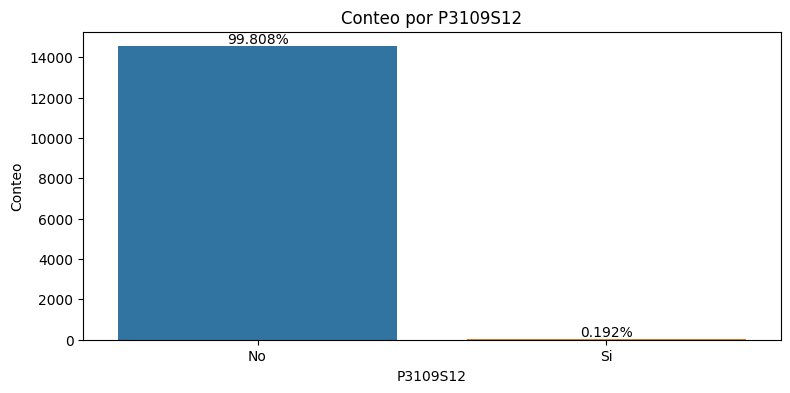

count     14562
unique        2
top          No
freq      14535
Name: P3109S13, dtype: object


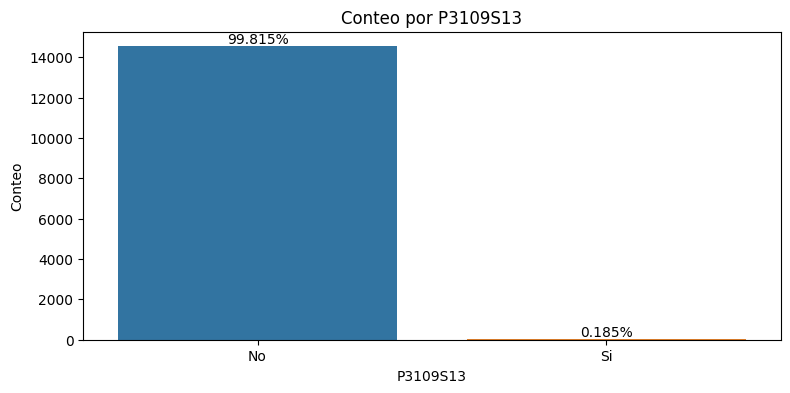

count     14562
unique        2
top          No
freq      14328
Name: P3109S18, dtype: object


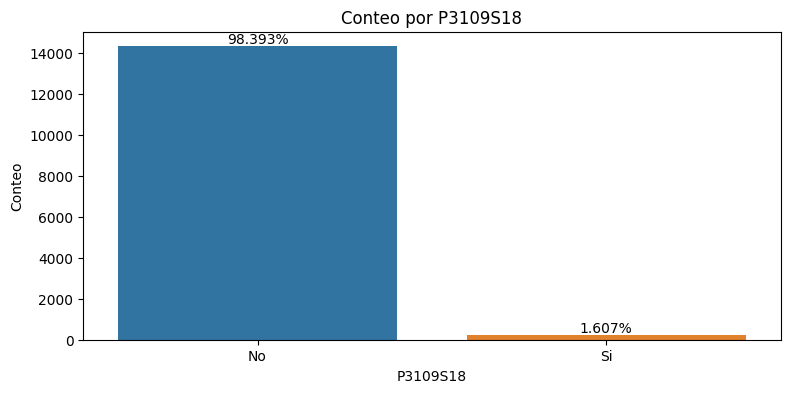

count     14562
unique        2
top          No
freq      14556
Name: P3109S14, dtype: object


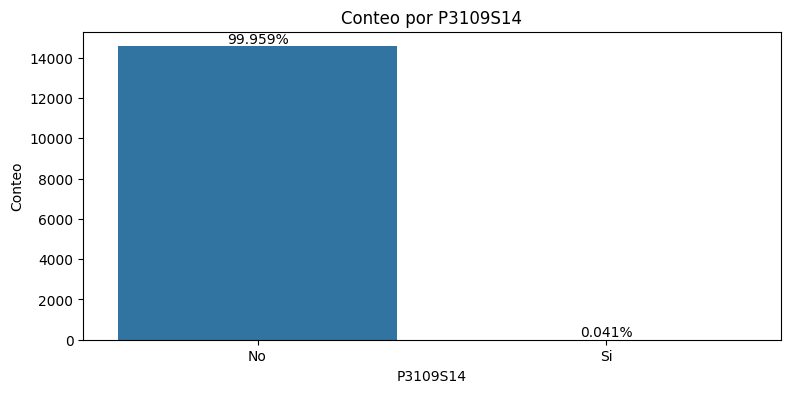

count     14562
unique        2
top          Si
freq       7609
Name: P1353S1, dtype: object


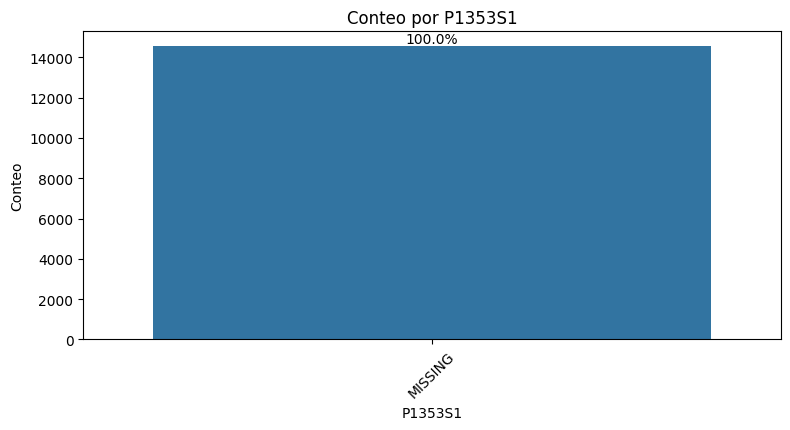

count     14562
unique        2
top          No
freq      12119
Name: P1353S2, dtype: object


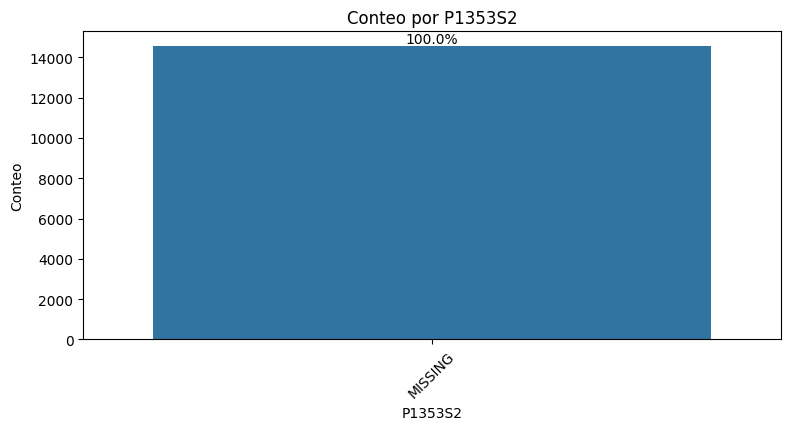

count     14562
unique        2
top          Si
freq       8513
Name: P1353S3, dtype: object


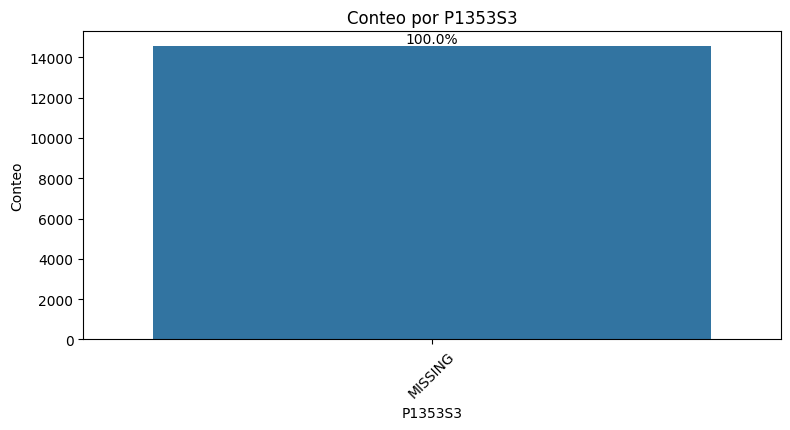

count     14562
unique        2
top          No
freq      14313
Name: P1353S4, dtype: object


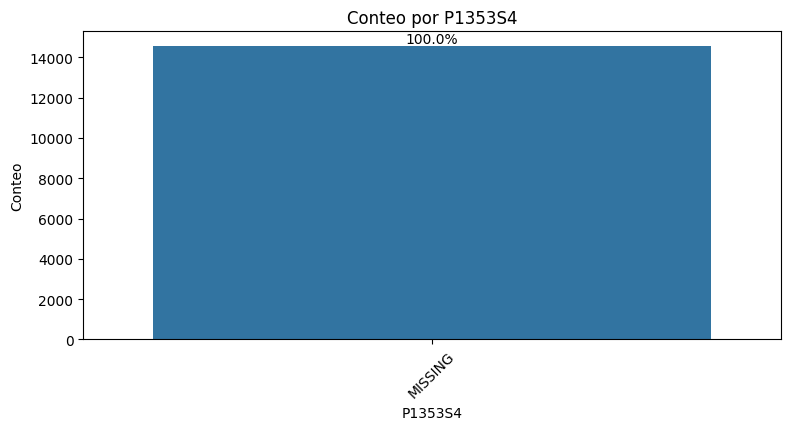

count     14562
unique        2
top          No
freq      13766
Name: P1353S5, dtype: object


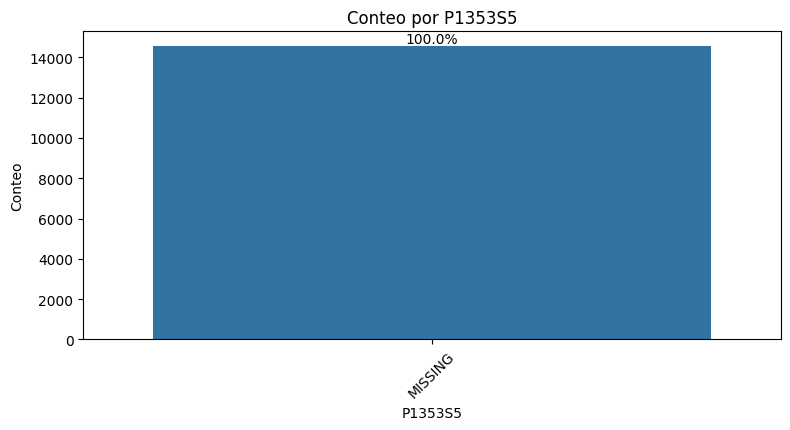

count     14562
unique        2
top          No
freq      11286
Name: P1353S6, dtype: object


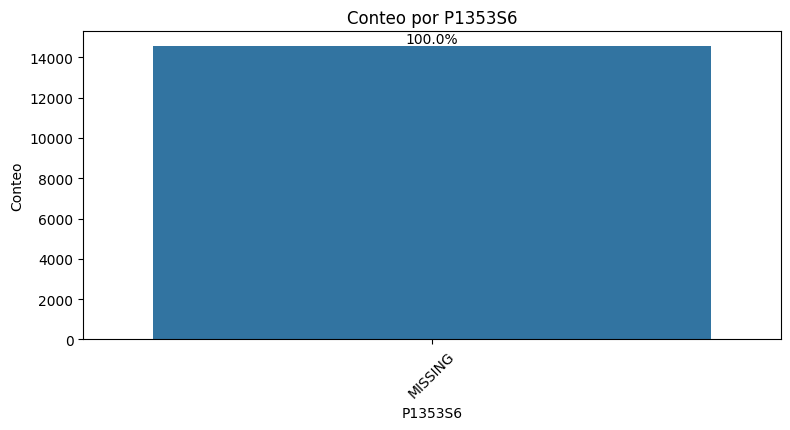

count     14562
unique        2
top          Si
freq       8465
Name: P3316S1, dtype: object


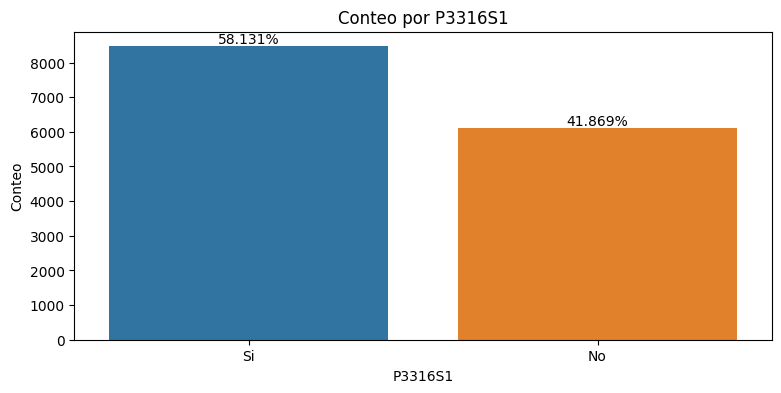

count     14562
unique        2
top          No
freq       9301
Name: P3316S2, dtype: object


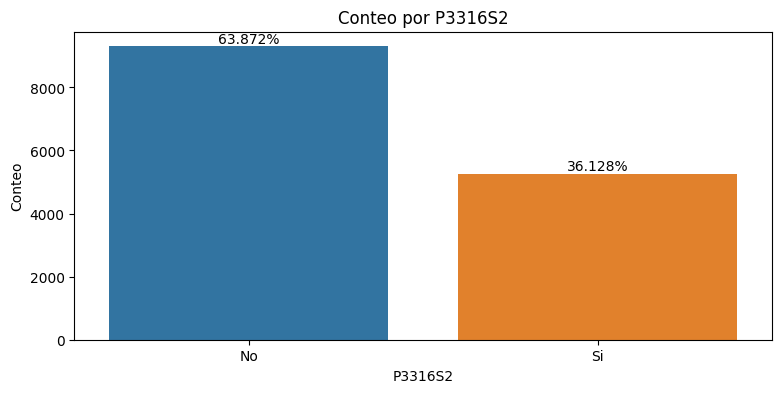

count     14562
unique        2
top          Si
freq       9802
Name: P3316S3, dtype: object


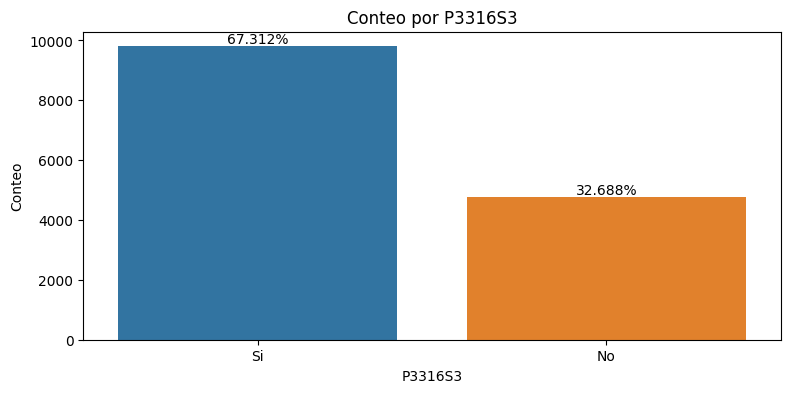

count     14562
unique        2
top          No
freq       9132
Name: P3316S4, dtype: object


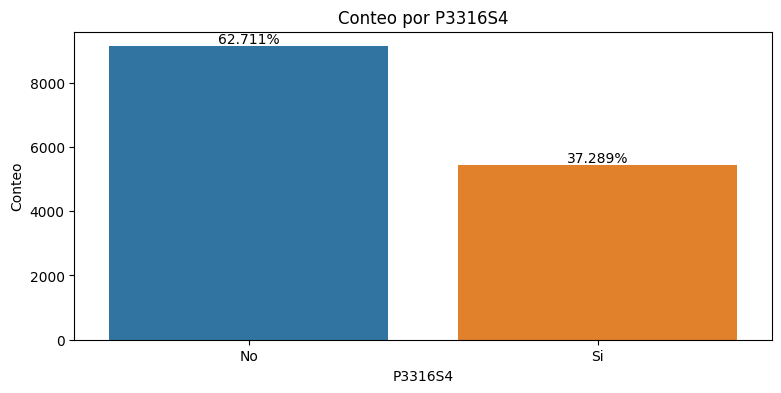

count     14562
unique        2
top          No
freq       8969
Name: P3316S5, dtype: object


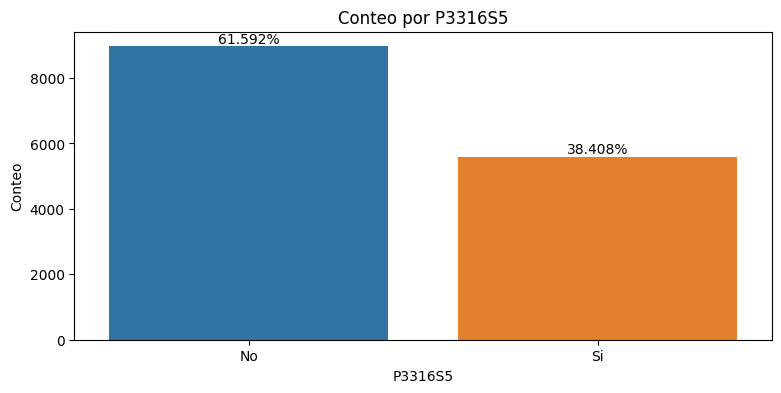

count     14562
unique        2
top          No
freq       9405
Name: P3316S6, dtype: object


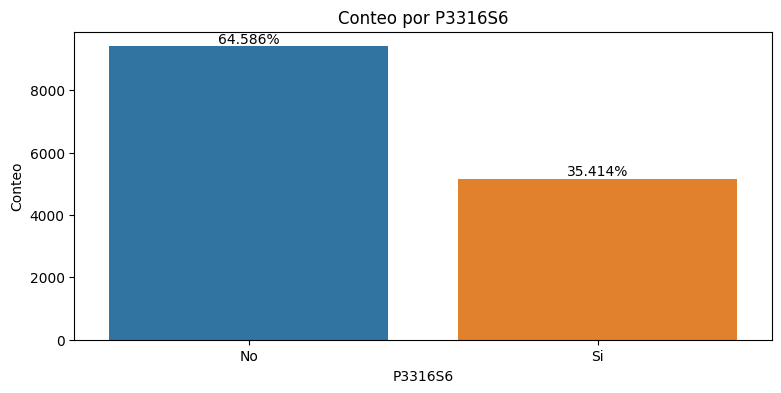

count     14562
unique        2
top          No
freq      10450
Name: P3316S7, dtype: object


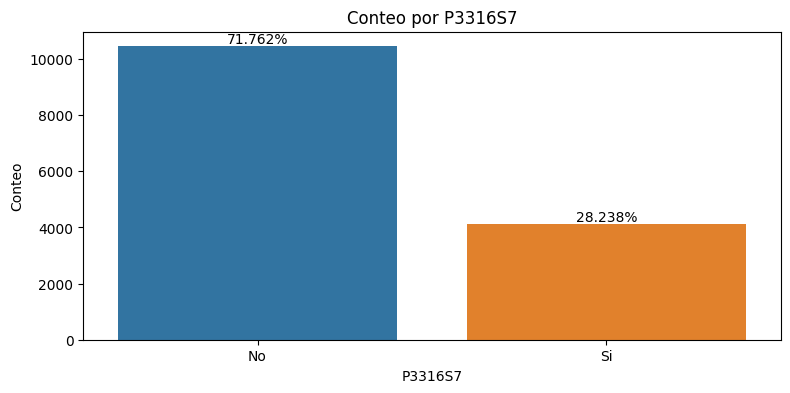

count     14562
unique        2
top          No
freq      10074
Name: P3316S8, dtype: object


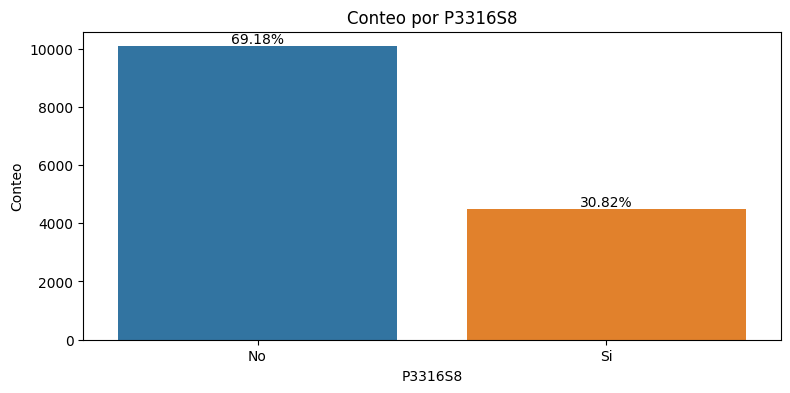

count     14562
unique        2
top          No
freq      11462
Name: P3316S9, dtype: object


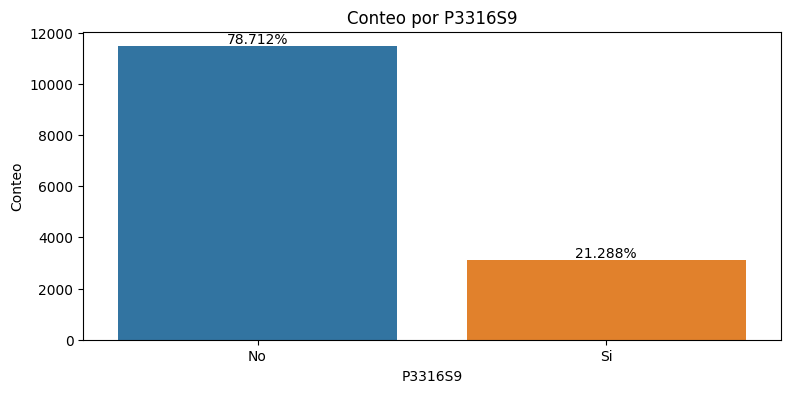

count     14562
unique        2
top          No
freq       9787
Name: P3316S10, dtype: object


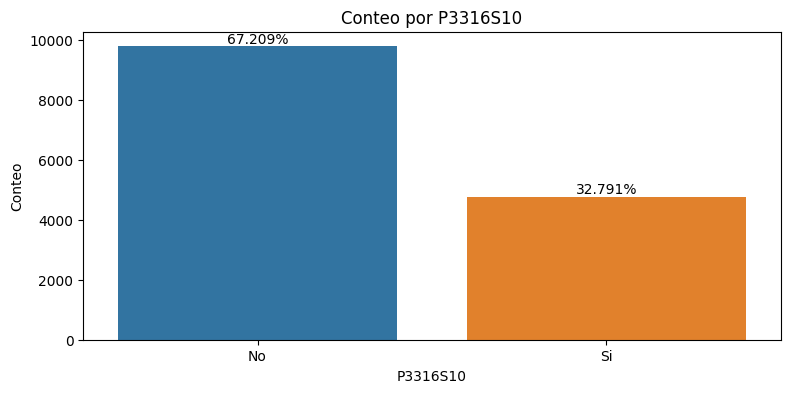

count     14562
unique        2
top          No
freq      11678
Name: P3316S11, dtype: object


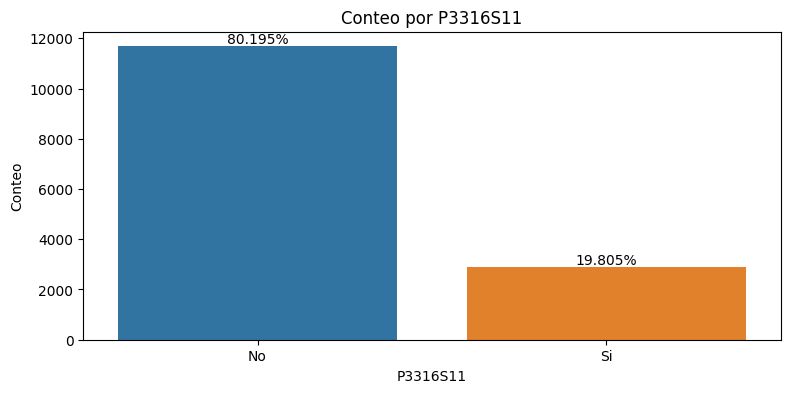

count     14562
unique        2
top          No
freq      12191
Name: P3316S12, dtype: object


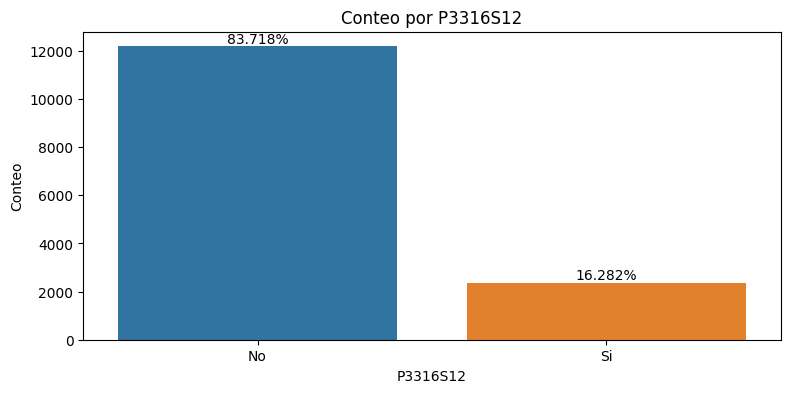

,P5785,P1988S1,propietario_vehi,sufrio_agresion,sufrio_delito,sufrido_delito2,problema_barrio,presen_grupos,inseguro_barrio,inseguro_ciudad,...,tomo_medidas,sera_victima,justi_violen,mejoraria,DEPMUNI,P1987,P1989,P1366,P1115,P3114
4272,45.0,2.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,4.0,0.0,3.0,2.0,BOGOTA,Apartamento,Propia,Está soltero(a),Pide auxilio,Falta de vigilancia policial
4273,84.0,2.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,1.0,0.0,0.0,2.0,BOGOTA,Apartamento,Propia,Está viudo(a),No hace nada,Falta de educación en valores
4274,60.0,1.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,3.0,...,7.0,0.0,0.0,2.0,BOGOTA,Casa,Propia,No casado(a) vive pareja dos años o más,Acude en ayuda de la persona,Falta oportunidades trabajo
4275,81.0,1.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,3.0,...,1.0,0.0,1.0,2.0,BOGOTA,Casa,Propia,No casado(a) vive pareja dos años o más,Acude en ayuda de la persona,Falta oportunidades trabajo
4276,58.0,3.0,0.0,0.0,0.0,3.0,10.0,3.0,0.0,0.0,...,1.0,0.0,4.0,0.0,BOGOTA,Cuarto (s),En arriendo o subarriendo,Está separado(a) o divorciado(a),Acude en ayuda de la persona,Falta de vigilancia policial
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122201,37.0,3.0,1.0,0.0,0.0,0.0,4.0,2.0,0.0,11.0,...,3.0,0.0,1.0,3.0,BOGOTA,Apartamento,En arriendo o subarriendo,Está casado(a),Pide auxilio,Falta de educación en valores
122202,34.0,3.0,0.0,0.0,0.0,0.0,4.0,2.0,2.0,3.0,...,2.0,0.0,1.0,1.0,BOGOTA,Apartamento,En arriendo o subarriendo,Está casado(a),Pide auxilio,Falta de educación en valores
122203,34.0,3.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,11.0,...,3.0,0.0,2.0,7.0,BOGOTA,Apartamento,Propia,No casado(a) vive pareja dos años o más,Pide auxilio,Falta de educación en valores
122204,40.0,3.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,14.0,...,3.0,0.0,3.0,5.0,BOGOTA,Apartamento,Propia,No casado(a) vive pareja dos años o más,Acude en ayuda de la persona,Falta de educación en valores


In [36]:
display(HTML(f"<h2>Análisis para grupo de variables Agrupadas s</h2>"))
descriptivo_grupo(df_base,vars_naturaleza['vars_agrupadas'])
df

Correlación dentre variables

In [37]:
vars_num

['P5785',
 'P1988S1',
 'propietario_vehi',
 'sufrio_agresion',
 'sufrio_delito',
 'sufrido_delito2',
 'problema_barrio',
 'presen_grupos',
 'inseguro_barrio',
 'inseguro_ciudad',
 'ha_expe_incomoda',
 'ha_expe_situa',
 'tomo_medidas',
 'sera_victima',
 'justi_violen',
 'mejoraria']

<ipython-input-38-a35bdee92b62>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_base.corr(),cmap='RdBu', vmin=-1, vmax=1)


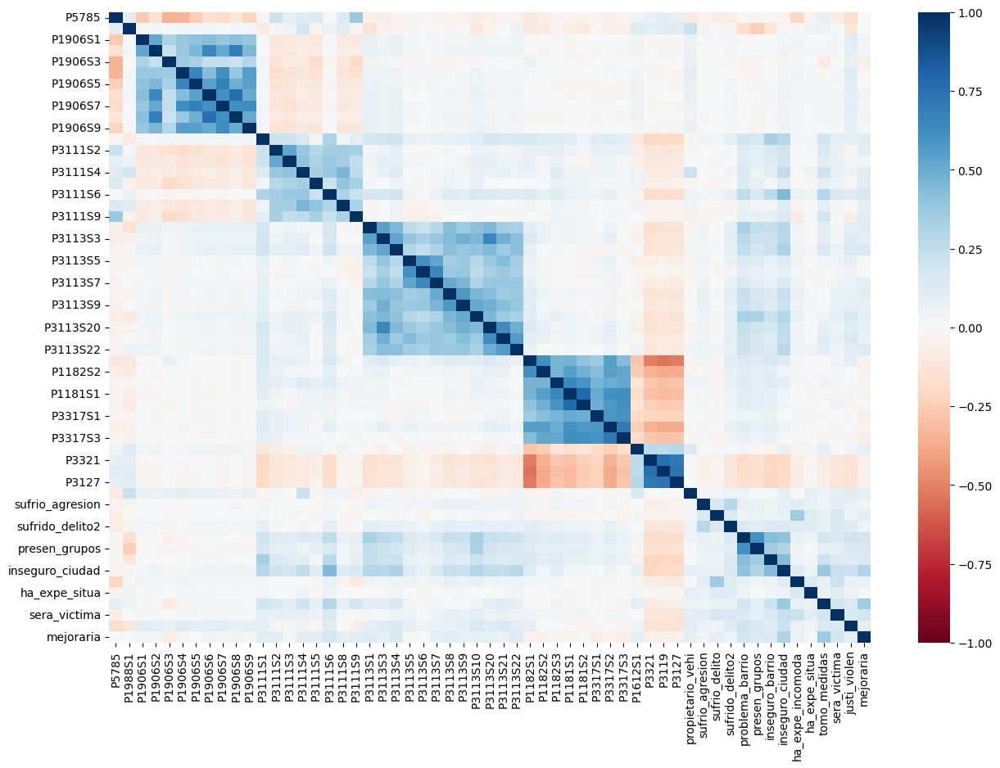

In [38]:
#correlación de variables
plt.figure(figsize=(15,10))
sns.heatmap(df_base.corr(),cmap='RdBu', vmin=-1, vmax=1)
plt.show()

De acuerdo a la matriz de correlación se evidencia baja correlación de las variables asociadas a la contibución de instituciones a la seguridad, Polici, Alcaldia, fuerzas militares con respecto a la satisfacción a la labor de las mismas.